# Introduction

Below is a breakdown of the CRISP-DM (Cross Industry Standard Process for Data Mining) methodology phases for developing a predictive model of S&P 500 prices.
The goal of the created model is to generate better results than a standard model based solely on technical signals, as well as outperform the benchmark.

## Business Understanding

Project Objective:

The goal is to develop a predictive model that can forecast future price changes of the S&P 500 index based on technical analysis signals, which may assist in making investment decisions.

Key Business Questions:

What are the main factors influencing the volatility of the S&P 500 index?

How accurate does the model need to be in order to be useful for investors?

What forecast time horizon is assumed in the model?

Project Goal:
* The aim of the project is to build a model that:
* Achieves better returns than the S&P 500 benchmark.
* Has a higher win rate than trades executed solely based on technical analysis signals.

## Data Understanding

Data for Analysis:

* Historical price data of the S&P 500 index (open, close, high, low, volume).
* Historical price data of the CBOE Volatility Index (open, close, high, low).
This index, also known as the "fear index," measures the expected volatility of the S&P 500 over the next 30 days and is calculated based on option prices for the index.

Data Exploration:
* Analysis of data and trends.

## Data Preparation

Data Cleaning:
* Identification of missing values and removal of rows where trading did not occur.

Feature Engineering:
* Calculation of technical indicators:
    * Simple Moving Averages (SMA)
    * Slope of the Moving Average (slopMA – Moving Average Slope)
    * Exponential Moving Averages (EMA)
    * Bollinger Bands (BB)
    * Average Directional Index (ADX – trend strength indicator)
    * Stochastic Oscillator
    * Average True Range (ATR)
    * Relative Strength Index (RSI)
* Calculation of buy/sell signals for:
    * Simple Moving Averages (SMA)
    * MACD (Moving Average Convergence Divergence)
    * Relative Strength Index (RSI)
    * Bollinger Bands (BB)
* Merging data, indicators, and signals for all tracked instruments.

Data Splitting:
* Splitting into training, validation, and test sets (e.g., in a 70%-15%-15% ratio).

## Modeling

Algorithm Selection:
* Long Short-Term Memory (LSTM) for time series modeling  
    * LSTM uses a gating mechanism (input, forget, output), allowing it to effectively store and recall important information.  
    * Resistant to the vanishing gradient problem.  
    * Capable of detecting trends.
* Gated Recurrent Unit (GRU) to support models  
    * Simpler architecture with two gates: reset and update.  
    * Better computational efficiency.

Hyperparameter Optimization:
* Optuna was used – an intelligent, Bayesian-based optimization method. Unlike Random Search (random value testing) or Grid Search (testing all combinations), Optuna learns and adapts. The optimized parameters include:
    * Number of layers  
    * Number of units  
    * Number of neurons in the Dense layer  
    * Dropout  
    * Learning rate  
    * L2 regularization

Overfitting Prevention:
* Validation on the validation set  
* Early Stopping – training stops when the model stops improving  
* ReduceLROnPlateau – reduces learning rate when no improvement is observed

## Evaluation

Evaluation Metrics:
* AUC (Area Under the Curve – ROC Curve)

    Measures the model's ability to distinguish between classes (e.g., sell signal vs. no signal). The closer the value is to 1.0, the better the model (a value of 0.5 indicates random prediction).
    The model maximizes AUC, meaning it searches for optimal hyperparameters to increase this score.

* Accuracy

    The percentage of correct classifications on the validation set. Can be misleading if classes are imbalanced (e.g., few sell signals).

* Loss (Binary Cross-Entropy)

    The loss function for binary classification; it measures how well the model fits the training data. The model minimizes this value during training.

Cross-Validation and Overfitting Prevention:

* Train-validation split

    Splitting the data into training and validation sets allows for monitoring the model’s performance on unseen data.

* Early Stopping

    Stops training if the model doesn’t improve over a certain number of epochs. Prevents overfitting by stopping before the model over-adjusts to the training data.

* ReduceLROnPlateau

    If no improvement is observed over several epochs, the learning rate is halved. This helps the model find a better minimum for the loss function.

* Batch Normalization

    Applied after each LSTM and Dense layer. It stabilizes the learning process by normalizing neuron activations.

## Deployment

Model Saving and Loading:
* ModelCheckpoint
    The model is saved after each epoch that yields better performance. After training, the best version of the model is loaded for use.

* If a previously trained model exists, it is loaded instead of retraining from scratch. If a new model achieves a better AUC score, the old model is overwritten.

* Automatic hyperparameter optimization with Optuna
    If a new set of hyperparameters results in a better AUC score, the model is retrained and saved again.

# Installation and Import of Libraries

## Installation of Libraries

Checking if the Python environment is properly configured
Ensure that the correct version of pip is being used to install packages.

In [1]:
import sys
import pip

print("Python Version:", sys.version)
print("pip Version:", pip.__version__)

Python Version: 3.12.2 (tags/v3.12.2:6abddd9, Feb  6 2024, 21:26:36) [MSC v.1937 64 bit (AMD64)]
pip Version: 25.0.1


The project utilizes four main groups of packages:

* Machine learning packages, which enable model building and hyperparameter optimization.  
* Data visualization packages, used for data analysis, presentation, and monitoring model training.  
* Financial analysis packages, used for calculating and validating technical indicators, as well as testing trading strategies on historical data.  
* Supporting packages for numerical computations and visualization.

In [2]:
# Python package manager
%pip install --upgrade pip

# Machine learning packages: tensorflow, optuna, shap, imbalanced-learn
%pip install tensorflow
%pip install optuna
%pip install shap
%pip install imbalanced-learn

# Data visualization packages: matplotlib, plotly
%pip install matplotlib
%pip install --upgrade plotly==5.10.0

# Financial analysis packages: pandas-ta, vectorbt
%pip install yfinance
%pip install pandas-ta
%pip install vectorbt
%pip install -U yfinance==0.2.54

# Supporting packages: numpy, tqdm, pip
%pip install tqdm
%pip install --force-reinstall numpy==1.26.0

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
  Using cached numpy-1.26.0-cp312-cp312-win_amd64.whl.metadata (61 kB)
Using cached numpy-1.26.0-cp312-cp312-win_amd64.whl (15.5 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.0

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


## Import libraries

Importing libraries that are used in the project

In [3]:
# Imported libraries used in the project:
import pandas as pd                 # Handling and analyzing tabular data
import matplotlib.pyplot as plt     # Creating plots for data analysis
import tensorflow as tf             # Building and training machine learning models
import plotly.graph_objects as go   # Interactive visualizations for financial data
import seaborn as sns               # Data visualization with enhanced plot styles

# Packages for financial analysis and backtesting
import pandas_ta as ta              # Calculating technical analysis indicators (e.g., RSI, MACD)
import yfinance as yf               # Fetching stock market data from Yahoo Finance
import vectorbt as vbt              # Portfolio analysis and automated trading strategy testing

# Supporting packages
import optuna                       # Hyperparameter optimization for ML models
import numpy as np                  # Mathematical operations and numerical computations
import os                           # File and directory operations

In [4]:
# Importing modules for data visualization
from plotly.subplots import make_subplots  # Creating plots with multiple subplots

# Modules from sklearn – classification and data preprocessing
from sklearn.ensemble import RandomForestClassifier  # Classifier based on Random Forest
from sklearn.inspection import permutation_importance  # Evaluating feature importance in a model
from sklearn.preprocessing import MinMaxScaler  # Scaling data to the [0, 1] range
from sklearn.metrics import (
    classification_report, confusion_matrix, roc_curve, auc, 
    precision_recall_curve, accuracy_score, f1_score, precision_score, recall_score
)  # Evaluation metrics for classification models

# TensorFlow modules – building neural networks
from tensorflow.keras.models import Sequential, load_model  # Defining and loading a neural network model
from tensorflow.keras.layers import (
    Dense, Dropout, Input, BatchNormalization, Bidirectional, LSTM
)  # Layers for constructing a neural network model
from tensorflow.keras.optimizers import Adam  # Adam optimizer for model training
from tensorflow.keras.callbacks import (
    EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
)  # Mechanisms to control the training process
from tensorflow.keras.regularizers import l2  # L2 regularization to prevent model overfitting

# Data import and preparation

## Stock exchange indices

### S&P500 - ^GSPC
The S&P 500 (^GSPC) is a stock market index that includes the 500 largest companies listed on the NYSE and NASDAQ stock exchanges. It is one of the most important indicators of the health of the American stock market.

In [5]:
try:
    # Fetching S&P 500 data from Yahoo Finance
    ticker = yf.Ticker("^GSPC")
    SP500 = ticker.history(period="730d", interval="1h")

    # Removing rows with zero trading volume
    SP500 = SP500[SP500["Volume"] != 0]

    # Dropping unnecessary columns
    SP500.drop(columns=["Dividends", "Stock Splits"], errors='ignore', inplace=True)

    # Processing datetime index
    SP500.index = pd.to_datetime(SP500.index).tz_localize(None)
    SP500["Datetime"] = SP500.index
    SP500.set_index("Datetime", inplace=True)

except Exception as e:
    print(f"Error while fetching data: {e}")
    SP500 = None

if SP500 is not None:
    # Candlestick + volume chart
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                        vertical_spacing=0.1,
                        row_heights=[0.7, 0.3],
                        subplot_titles=("Candlestick Chart - S&P 500", "Volume"))

    fig.add_trace(go.Candlestick(
        x=SP500.index,
        open=SP500['Open'],
        high=SP500['High'],
        low=SP500['Low'],
        close=SP500['Close'],
        increasing_line_color='green',
        decreasing_line_color='red',
        name="Price"
    ), row=1, col=1)

    fig.add_trace(go.Bar(
        x=SP500.index,
        y=SP500['Volume'],
        marker_color='gray',
        name="Volume"
    ), row=2, col=1)

    fig.update_layout(
        paper_bgcolor="black",
        plot_bgcolor="black",
        font=dict(color="white"),
        xaxis=dict(showline=True, linewidth=1, linecolor='white', gridcolor='gray'),
        yaxis=dict(showline=True, linewidth=1, linecolor='white', gridcolor='gray'),
        xaxis2=dict(title="Date"),
        yaxis_title="Price",
        yaxis2_title="Volume",
        showlegend=False,
        height=800
    )

    fig.show()

    # Creating binary labels
    SP500['Label'] = (SP500['Close'] > SP500['Open']).astype(int)
    SP500['Label_21F'] = (SP500['Close'].shift(-21) > SP500['Close']).astype(int)
    SP500['Label_21F_Drop'] = (SP500['Close'].shift(-21) < SP500['Close']).astype(int)

    print("\nLast 15 records:")
    print(SP500.tail(15))

    print("\nData types:")
    print(SP500.dtypes)


Last 15 records:
                            Open         High          Low        Close  \
Datetime                                                                  
2025-03-26 13:30:00  5712.200195  5717.589844  5701.830078  5715.259766   
2025-03-26 14:30:00  5715.220215  5717.160156  5694.410156  5699.220215   
2025-03-26 15:30:00  5699.120117  5717.919922  5698.729980  5712.109863   
2025-03-27 10:30:00  5717.790039  5732.279785  5715.910156  5720.910156   
2025-03-27 11:30:00  5721.020020  5721.209961  5700.919922  5708.930176   
2025-03-27 12:30:00  5709.020020  5715.229980  5686.990234  5690.470215   
2025-03-27 13:30:00  5690.370117  5708.589844  5687.169922  5701.890137   
2025-03-27 14:30:00  5701.879883  5722.310059  5697.339844  5719.899902   
2025-03-27 15:30:00  5719.830078  5719.870117  5690.620117  5692.359863   
2025-03-28 10:30:00  5616.950195  5622.319824  5599.640137  5611.100098   
2025-03-28 11:30:00  5610.990234  5619.330078  5588.490234  5590.490234   
2025-03

Dane zostały pobrane poprawnie i zweryfikowane.

#### Technical Indicators for S&P500

##### Simple Moving Averages (SMA)
A simple moving average, most commonly used for periods of 50, 100, 125, and 200 days. When the price is above these averages, it signals an uptrend. For example, when the SMA 50 crosses the SMA 200 from top to bottom, it is a so-called "death cross," signaling potential declines.

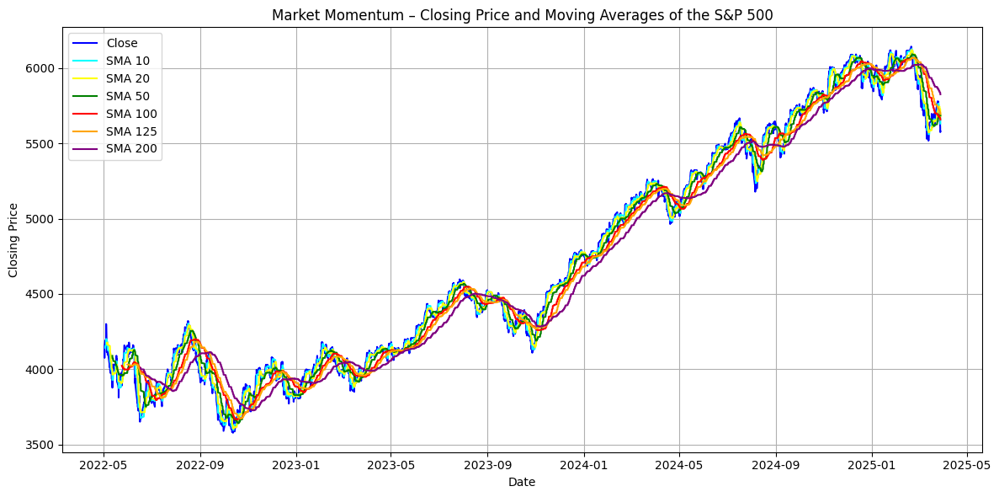

                           Close       SMA_10       SMA_20       SMA_50  \
Datetime                                                                  
2025-03-28 11:30:00  5590.490234  5684.738086  5718.716064  5688.065625   
2025-03-28 12:30:00  5575.049805  5672.321045  5708.448560  5687.439424   
2025-03-28 13:30:00  5581.879883  5659.298047  5699.144043  5686.644824   
2025-03-28 14:30:00  5579.160156  5645.123047  5689.883545  5686.002031   
2025-03-28 15:30:00  5580.279785  5632.258008  5680.572046  5685.378027   

                         SMA_100      SMA_125      SMA_200  
Datetime                                                    
2025-03-28 11:30:00  5667.488418  5704.641051  5836.086458  
2025-03-28 12:30:00  5664.702515  5701.874008  5833.654456  
2025-03-28 13:30:00  5662.111812  5699.518086  5831.288706  
2025-03-28 14:30:00  5659.930913  5697.249047  5828.856858  
2025-03-28 15:30:00  5658.367412  5694.899523  5826.405156  


In [6]:
# Calculate Simple Moving Averages using pandas_ta
SP500['SMA_10'] = ta.sma(SP500['Close'], length=10)
SP500['SMA_20'] = ta.sma(SP500['Close'], length=20)
SP500['SMA_50'] = ta.sma(SP500['Close'], length=50)
SP500['SMA_100'] = ta.sma(SP500['Close'], length=100)
SP500['SMA_125'] = ta.sma(SP500['Close'], length=125)
SP500['SMA_200'] = ta.sma(SP500['Close'], length=200)

# Create a plot of the closing price and moving averages
plt.figure(figsize=(12, 6))
plt.plot(SP500.index, SP500['Close'], label='Close', color='blue')
plt.plot(SP500.index, SP500['SMA_10'], label='SMA 10', color='cyan')
plt.plot(SP500.index, SP500['SMA_20'], label='SMA 20', color='yellow')
plt.plot(SP500.index, SP500['SMA_50'], label='SMA 50', color='green')
plt.plot(SP500.index, SP500['SMA_100'], label='SMA 100', color='red')
plt.plot(SP500.index, SP500['SMA_125'], label='SMA 125', color='orange')
plt.plot(SP500.index, SP500['SMA_200'], label='SMA 200', color='purple')

# Plot configuration
plt.title('Market Momentum – Closing Price and Moving Averages of the S&P 500')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Display the last few rows with the new SMA columns
print(SP500[['Close', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_125', 'SMA_200']].tail())

The indicators were calculated correctly.

##### Moving Average Slope (slopMA)
The Moving Average Slope (slopMA) indicator measures the slope of the moving average, helping to determine the strength and direction of a trend. A positive value indicates an uptrend, while a negative value indicates a downtrend.

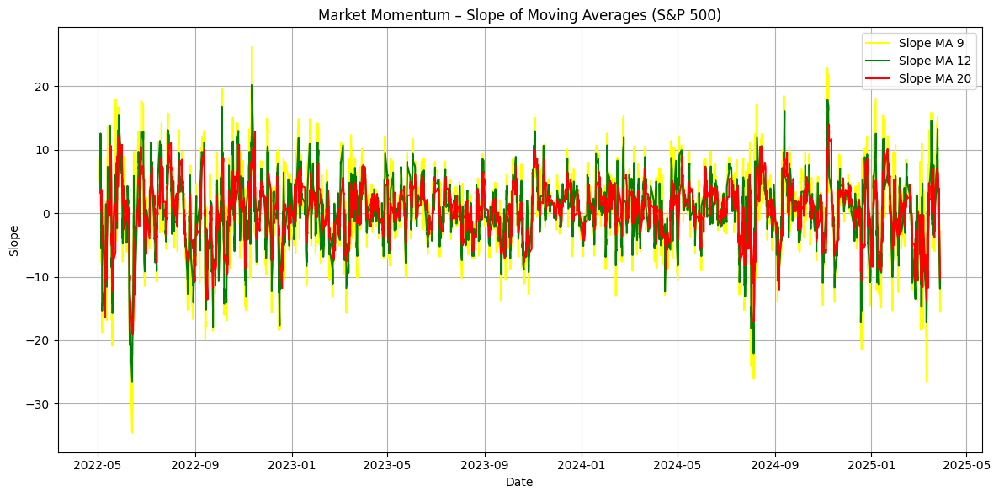

                           Close  slopeMA_9  slopeMA_12  slopeMA_20  \
Datetime                                                              
2025-03-28 11:30:00  5590.490234 -12.081109  -11.873332   -8.732983   
2025-03-28 12:30:00  5575.049805 -15.228895  -11.443359  -10.267505   
2025-03-28 13:30:00  5581.879883 -15.447808  -11.114990   -9.304517   
2025-03-28 14:30:00  5579.160156 -14.418891  -10.005005   -9.260498   
2025-03-28 15:30:00  5580.279785 -12.243381  -10.985840   -9.311499   

                     slopeMA_50  slopeMA_100  slopeMA_200  
Datetime                                                   
2025-03-28 11:30:00   -1.713398    -2.490796    -2.177249  
2025-03-28 12:30:00   -0.626201    -2.785903    -2.432002  
2025-03-28 13:30:00   -0.794600    -2.590703    -2.365750  
2025-03-28 14:30:00   -0.642793    -2.180898    -2.431848  
2025-03-28 15:30:00   -0.624004    -1.563501    -2.451702  


In [7]:
# Calculate the slope of moving averages using pandas_ta
SP500['slopeMA_9'] = ta.sma(SP500['Close'], length=9).diff()
SP500['slopeMA_12'] = ta.sma(SP500['Close'], length=12).diff()
SP500['slopeMA_20'] = ta.sma(SP500['Close'], length=20).diff()
SP500['slopeMA_50'] = ta.sma(SP500['Close'], length=50).diff()
SP500['slopeMA_100'] = ta.sma(SP500['Close'], length=100).diff()
SP500['slopeMA_200'] = ta.sma(SP500['Close'], length=200).diff()

# Plotting the slope of moving averages for 9, 12, 20
plt.figure(figsize=(12, 6))
plt.plot(SP500.index, SP500['slopeMA_9'], label='Slope MA 9', color='yellow')
plt.plot(SP500.index, SP500['slopeMA_12'], label='Slope MA 12', color='green')
plt.plot(SP500.index, SP500['slopeMA_20'], label='Slope MA 20', color='red')

# Plot configuration
plt.title('Market Momentum – Slope of Moving Averages (S&P 500)')
plt.xlabel('Date')
plt.ylabel('Slope')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Display the last few rows with the new slopeMA columns
print(SP500[['Close', 'slopeMA_9', 'slopeMA_12', 'slopeMA_20', 'slopeMA_50', 'slopeMA_100', 'slopeMA_200']].tail())

The indicators were calculated correctly.

##### Exponential Moving Average (EMA)
Exponential average, more sensitive to current price changes, often used by short-term traders. Most often calculated for periods of 9, 21, 50 and 200 days.

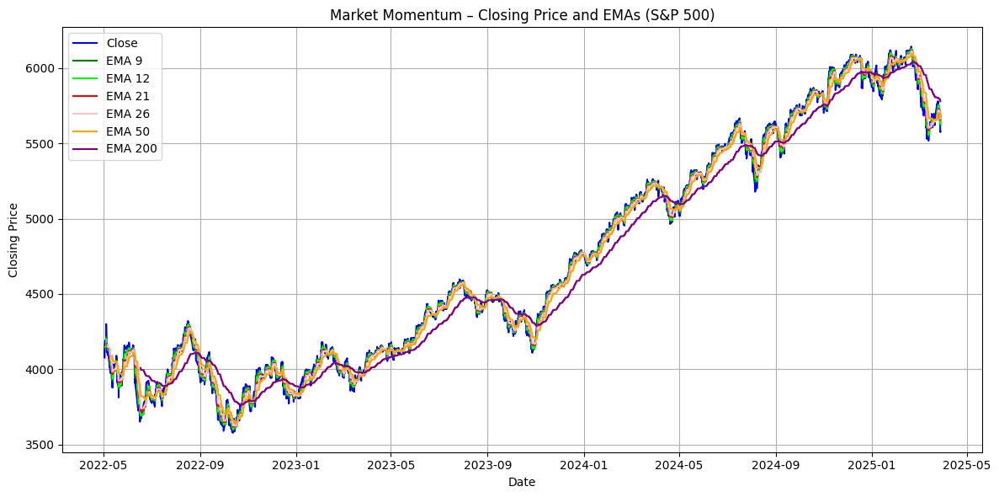

Last rows with EMA 9, EMA 12, EMA 21, EMA 26, EMA 50, EMA 200:
                           Close        EMA 9       EMA 12       EMA 21  \
Datetime                                                                  
2025-03-28 11:30:00  5590.490234  5670.305775  5681.220594  5695.444447   
2025-03-28 12:30:00  5575.049805  5651.254581  5664.886627  5684.499480   
2025-03-28 13:30:00  5581.879883  5637.379641  5652.116358  5675.170425   
2025-03-28 14:30:00  5579.160156  5625.735744  5640.892327  5666.442219   
2025-03-28 15:30:00  5580.279785  5616.644552  5631.567321  5658.609271   

                          EMA 26       EMA 50      EMA 200  
Datetime                                                    
2025-03-28 11:30:00  5697.160100  5694.456285  5788.380784  
2025-03-28 12:30:00  5688.114893  5689.773678  5786.258088  
2025-03-28 13:30:00  5680.245633  5685.542548  5784.224474  
2025-03-28 14:30:00  5672.757820  5681.370690  5782.184033  
2025-03-28 15:30:00  5665.907595  5677.406341

In [8]:
# Calculate EMA using pandas_ta
SP500['EMA 9'] = ta.ema(SP500['Close'], length=9)
SP500['EMA 12'] = ta.ema(SP500['Close'], length=12)  
SP500['EMA 21'] = ta.ema(SP500['Close'], length=21)
SP500['EMA 26'] = ta.ema(SP500['Close'], length=26)  
SP500['EMA 50'] = ta.ema(SP500['Close'], length=50)
SP500['EMA 200'] = ta.ema(SP500['Close'], length=200)

# Function to calculate the smoothing factor alpha
def calculate_alpha(window):
    return 2 / (window + 1)

# Calculate alpha for each EMA period
alpha_9 = calculate_alpha(9)
alpha_12 = calculate_alpha(12)
alpha_21 = calculate_alpha(21)
alpha_26 = calculate_alpha(26)
alpha_50 = calculate_alpha(50)
alpha_200 = calculate_alpha(200)

# Create plot of closing price and EMAs
plt.figure(figsize=(12, 6))
plt.plot(SP500.index, SP500['Close'], label='Close', color='blue')
plt.plot(SP500.index, SP500['EMA 9'], label='EMA 9', color='green')
plt.plot(SP500.index, SP500['EMA 12'], label='EMA 12', color='lime')
plt.plot(SP500.index, SP500['EMA 21'], label='EMA 21', color='red')
plt.plot(SP500.index, SP500['EMA 26'], label='EMA 26', color='pink')
plt.plot(SP500.index, SP500['EMA 50'], label='EMA 50', color='orange')
plt.plot(SP500.index, SP500['EMA 200'], label='EMA 200', color='purple')

# Plot configuration
plt.title('Market Momentum – Closing Price and EMAs (S&P 500)')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Display the last few rows with EMA values
print("Last rows with EMA 9, EMA 12, EMA 21, EMA 26, EMA 50, EMA 200:")
print(SP500[['Close', 'EMA 9', 'EMA 12', 'EMA 21', 'EMA 26', 'EMA 50', 'EMA 200']].tail())

# Display calculated alpha values
print(f"\nAlpha coefficient for EMA 9: {alpha_9:.4f}")
print(f"Alpha coefficient for EMA 12: {alpha_12:.4f}")
print(f"Alpha coefficient for EMA 21: {alpha_21:.4f}")
print(f"Alpha coefficient for EMA 26: {alpha_26:.4f}")
print(f"Alpha coefficient for EMA 50: {alpha_50:.4f}")
print(f"Alpha coefficient for EMA 200: {alpha_200:.4f}")

The indicators were calculated correctly.

##### Bollinger Bands
They consist of three lines: a moving average and two standard deviation lines above and below the average. When the price approaches the upper band, it may indicate overbought, and the lower band - oversold.

The most commonly used periods are:
* 10 - used by short-term investors,
* 20 - the standard period recommended by John Bollinger, works well for medium-term trend analysis.
* 50 - for long-term analysis

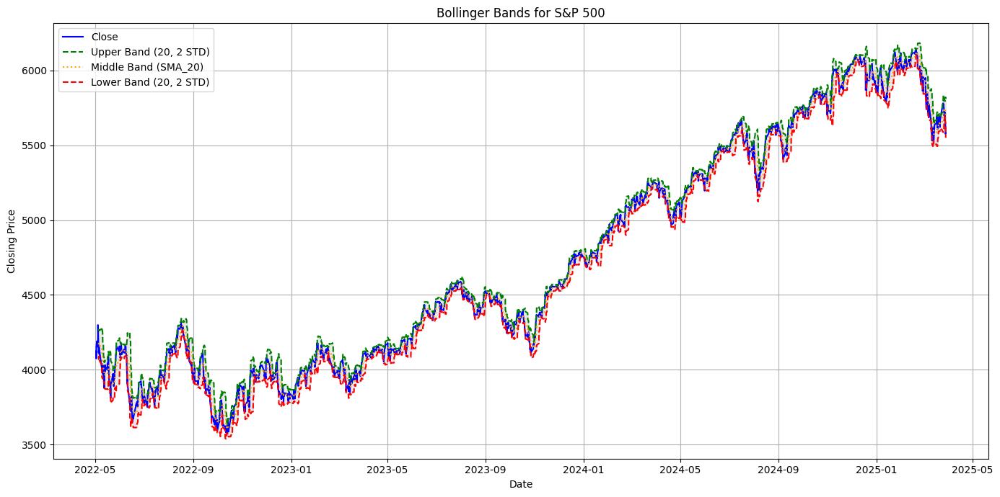

                           Close   Upper_Band  Middle_Band   Lower_Band  \
Datetime                                                                  
2025-03-28 11:30:00  5590.490234  5816.067966  5718.716064  5621.364163   
2025-03-28 12:30:00  5575.049805  5819.905841  5708.448560  5596.991278   
2025-03-28 13:30:00  5581.879883  5819.857713  5699.144043  5578.430373   
2025-03-28 14:30:00  5579.160156  5817.386883  5689.883545  5562.380207   
2025-03-28 15:30:00  5580.279785  5811.486394  5680.572046  5549.657698   

                     Distance_Score  
Datetime                             
2025-03-28 11:30:00       -1.317137  
2025-03-28 12:30:00       -1.196860  
2025-03-28 13:30:00       -0.971424  
2025-03-28 14:30:00       -0.868396  
2025-03-28 15:30:00       -0.766091  


In [9]:
# Calculate Bollinger Bands (BB) using pandas_ta
bbands = ta.bbands(SP500['Close'], length=20, std=2)

# Add Bollinger Bands to the DataFrame
SP500['Upper_Band'] = bbands['BBU_20_2.0']   # Upper Bollinger Band
SP500['Lower_Band'] = bbands['BBL_20_2.0']   # Lower Bollinger Band
SP500['Middle_Band'] = bbands['BBM_20_2.0']  # Middle Band (SMA_20)

# Calculate Distance Score (-1 to 1)
SP500['Distance_Score'] = ((SP500['Close'] - SP500['Lower_Band']) /
                           (SP500['Upper_Band'] - SP500['Lower_Band']) * 2 - 1)

# Create a plot with Bollinger Bands
fig, ax = plt.subplots(figsize=(14, 7))

# Closing prices and Bollinger Bands
ax.plot(SP500.index, SP500['Close'], label='Close', color='blue')
ax.plot(SP500.index, SP500['Upper_Band'], label='Upper Band (20, 2 STD)', color='green', linestyle='dashed')
ax.plot(SP500.index, SP500['Middle_Band'], label='Middle Band (SMA_20)', color='orange', linestyle='dotted')
ax.plot(SP500.index, SP500['Lower_Band'], label='Lower Band (20, 2 STD)', color='red', linestyle='dashed')

# Fill area between bands
ax.fill_between(SP500.index, SP500['Upper_Band'], SP500['Lower_Band'], color='lightgray', alpha=0.5)

# Plot configuration
ax.set_title('Bollinger Bands for S&P 500')
ax.set_xlabel('Date')
ax.set_ylabel('Closing Price')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

# Display last few rows with Distance_Score
print(SP500[['Close', 'Upper_Band', 'Middle_Band', 'Lower_Band', 'Distance_Score']].tail())

The indicators were calculated correctly.

##### Average Directional Index (ADX)
A technical analysis indicator developed by J. Welles Wilder. It is used to measure the strength of a market trend, regardless of its direction (whether the market is bullish or bearish). The ADX indicator is often used in conjunction with other indicators, such as DI+ and DI− (Directional Indicators), which help determine the direction of the trend. For the purposes of this project, strength will be measured on a scale of 0 to 1.

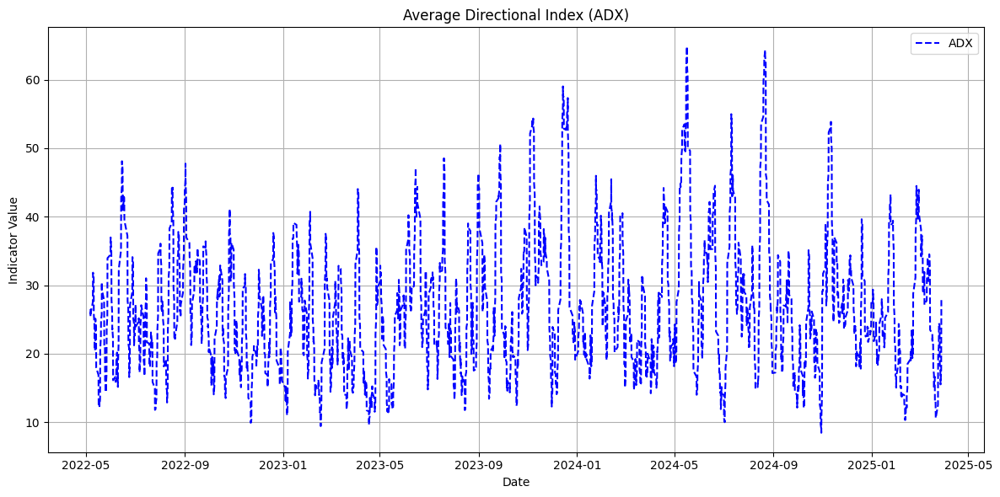

                           ADX
Datetime                      
2025-03-28 11:30:00  19.767206
2025-03-28 12:30:00  21.996880
2025-03-28 13:30:00  24.067292
2025-03-28 14:30:00  25.989817
2025-03-28 15:30:00  27.831219


In [10]:
# Calculate ADX using pandas_ta
SP500['ADX'] = ta.adx(SP500['High'], SP500['Low'], SP500['Close'], length=14)['ADX_14']

# Create ADX plot
plt.figure(figsize=(12, 6))
plt.plot(SP500.index, SP500['ADX'], label='ADX', color='blue', linestyle='--')

# Plot configuration
plt.title('Average Directional Index (ADX)')
plt.xlabel('Date')
plt.ylabel('Indicator Value')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Display the last few rows with the computed ADX
print(SP500[['ADX']].tail())

The indicators were calculated correctly.

##### Stochastic Oscillator
Measures the position of the closing price relative to a range of prices over a given period, most often 14 days. Values ​​above 80 signal overbought, and values ​​below 20 signal oversold.

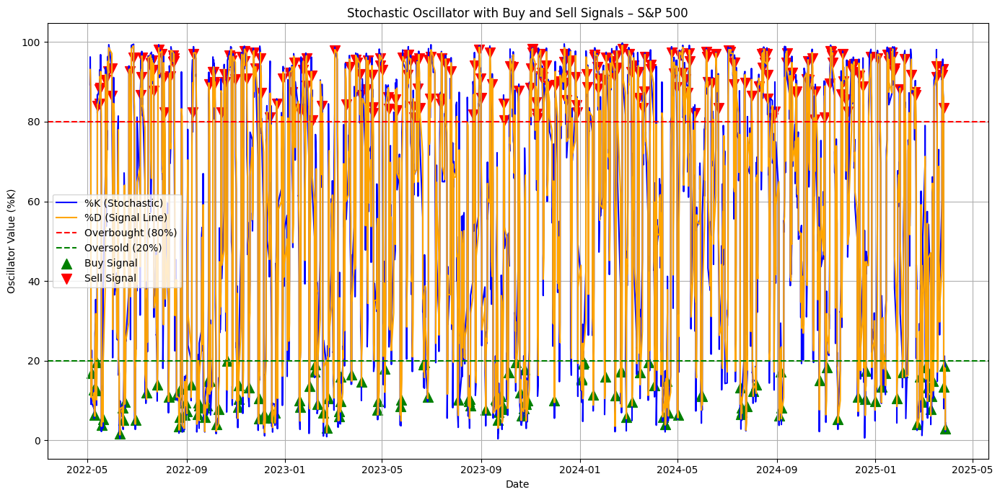

Last 5 Stochastic Oscillator values:
                           %K         %D
Datetime                                
2025-03-28 11:30:00  4.480311  13.316483
2025-03-28 12:30:00  2.733494   7.767116
2025-03-28 13:30:00  2.229984   3.147930
2025-03-28 14:30:00  2.941964   2.635147
2025-03-28 15:30:00  4.370682   3.180876

Last 5 buy signal dates:
                            %K         %D
Datetime                                 
2025-03-11 13:30:00  11.119407  10.968661
2025-03-13 14:30:00  14.786657  12.428242
2025-03-26 15:30:00  13.367230  10.655375
2025-03-27 14:30:00  18.663769  15.526096
2025-03-28 14:30:00   2.941964   2.635147

Last 5 sell signal dates:
                            %K         %D
Datetime                                 
2025-03-17 11:30:00  91.234381  91.488721
2025-03-17 15:30:00  93.846473  95.806939
2025-03-24 14:30:00  91.706924  92.090911
2025-03-25 11:30:00  93.118167  93.824302
2025-03-26 10:30:00  83.385023  85.910116


In [11]:
# Calculate the Stochastic Oscillator using pandas_ta
stoch = ta.stoch(SP500['High'], SP500['Low'], SP500['Close'], k=14, d=3)

# Add Stochastic values to the DataFrame
SP500['%K'] = stoch['STOCHk_14_3_3']
SP500['%D'] = stoch['STOCHd_14_3_3']

# Generate buy and sell signals
buy_signals = (SP500['%K'] < 20) & (SP500['%K'].shift(1) <= SP500['%D'].shift(1)) & (SP500['%K'] > SP500['%D'])
sell_signals = (SP500['%K'] > 80) & (SP500['%K'].shift(1) >= SP500['%D'].shift(1)) & (SP500['%K'] < SP500['%D'])

# Plotting the Stochastic Oscillator
plt.figure(figsize=(14, 7))
plt.plot(SP500.index, SP500['%K'], label='%K (Stochastic)', color='blue')
plt.plot(SP500.index, SP500['%D'], label='%D (Signal Line)', color='orange')
plt.axhline(y=80, color='red', linestyle='--', label='Overbought (80%)')
plt.axhline(y=20, color='green', linestyle='--', label='Oversold (20%)')

# Mark buy signals
plt.scatter(SP500.index[buy_signals], SP500['%K'][buy_signals],
            color='green', label='Buy Signal', marker='^', s=100)

# Mark sell signals
plt.scatter(SP500.index[sell_signals], SP500['%K'][sell_signals],
            color='red', label='Sell Signal', marker='v', s=100)

# Chart configuration
plt.title('Stochastic Oscillator with Buy and Sell Signals – S&P 500')
plt.xlabel('Date')
plt.ylabel('Oscillator Value (%K)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Display last 5 Stochastic Oscillator values
print("Last 5 Stochastic Oscillator values:")
print(SP500[['%K', '%D']].tail())

# Display last 5 buy signal dates
print("\nLast 5 buy signal dates:")
print(SP500.loc[buy_signals, ['%K', '%D']].tail())

# Display last 5 sell signal dates
print("\nLast 5 sell signal dates:")
print(SP500.loc[sell_signals, ['%K', '%D']].tail())


The indicators were calculated correctly.

##### Average True Range (ATR)
The Average True Range (ATR) is a technical analysis indicator that measures market volatility by averaging the price range over a given period. Higher ATR values ​​indicate more volatility, while lower values ​​indicate a calmer market.

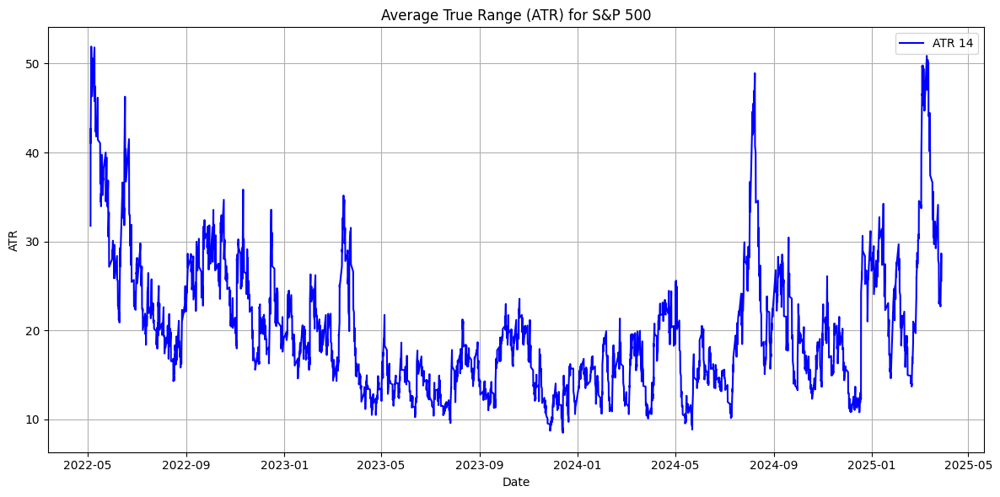

                           ATR
Datetime                      
2025-03-28 11:30:00  28.664275
2025-03-28 12:30:00  28.269694
2025-03-28 13:30:00  27.477586
2025-03-28 14:30:00  26.469177
2025-03-28 15:30:00  25.588531


In [12]:
# Calculate Average True Range (ATR) using pandas_ta
SP500['ATR'] = ta.atr(SP500['High'], SP500['Low'], SP500['Close'], length=14)

# Create ATR plot
plt.figure(figsize=(12, 6))
plt.plot(SP500.index, SP500['ATR'], label='ATR 14', color='blue')
plt.title('Average True Range (ATR) for S&P 500')
plt.xlabel('Date')
plt.ylabel('ATR')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Display the last 5 ATR values
print(SP500[['ATR']].tail())

The indicators were calculated correctly.

##### Relative Strength Index (RSI)
RSI is a momentum indicator that helps determine when an asset is overbought (possible downside correction) or oversold (possible upside). For short positions on the 1-hour (1H) time frame, RSI can be used to spot moments when the market is too hot and has the potential to fall.

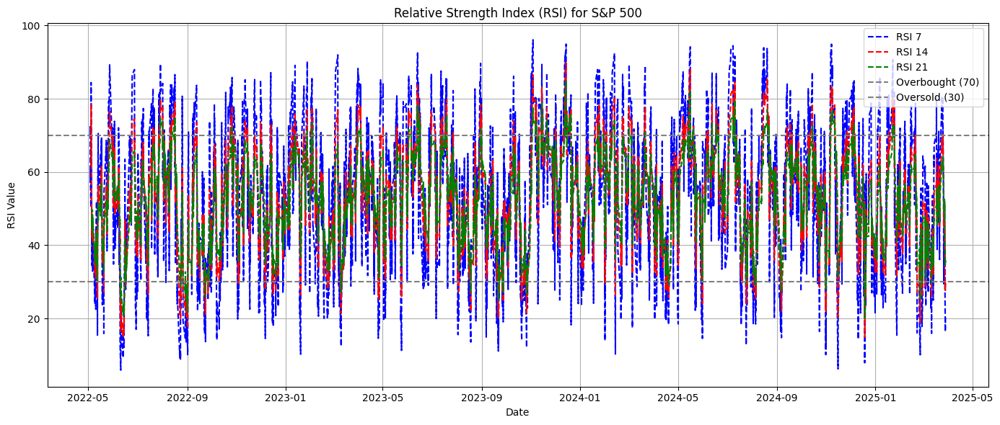


Latest RSI values:
                         RSI_7     RSI_14     RSI_21
Datetime                                            
2025-03-28 11:30:00  18.155640  29.328668  36.040638
2025-03-28 12:30:00  16.427188  27.673818  34.616436
2025-03-28 13:30:00  20.340946  29.567004  35.794868
2025-03-28 14:30:00  19.907835  29.238802  35.527146
2025-03-28 15:30:00  20.718600  29.585324  35.734913


In [13]:
# Calculate RSI with three different periods
SP500["RSI_7"] = ta.rsi(SP500["Close"], length=7)
SP500["RSI_14"] = ta.rsi(SP500["Close"], length=14)
SP500["RSI_21"] = ta.rsi(SP500["Close"], length=21)

# RSI Plot
plt.figure(figsize=(14, 6))
plt.plot(SP500.index, SP500["RSI_7"], label="RSI 7", color="blue", linestyle="--")
plt.plot(SP500.index, SP500["RSI_14"], label="RSI 14", color="red", linestyle="--")
plt.plot(SP500.index, SP500["RSI_21"], label="RSI 21", color="green", linestyle="--")

# Add overbought (70) and oversold (30) levels
plt.axhline(y=70, color="gray", linestyle="--", label="Overbought (70)")
plt.axhline(y=30, color="gray", linestyle="--", label="Oversold (30)")

# Chart configuration
plt.title("Relative Strength Index (RSI) for S&P 500")
plt.xlabel("Date")
plt.ylabel("RSI Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Display the last 5 rows with calculated RSI values
print("\nLatest RSI values:")
print(SP500[["RSI_7", "RSI_14", "RSI_21"]].tail())

#### S&P500 Signals

##### SMA Simple Moving Average Buy and Sell
Signals generated based on moving averages help identify buying and selling moments in the market. They are based on crossings of short-term and long-term moving averages.
* SMA 10_50:
    * Buy signal, SMA 10 crosses SMA 50 from below → beginning of an uptrend.
    * Sell signal, SMA 10 crosses SMA 50 from above → possible declines.
* SMA 20_50:
    * Buy signal, SMA 20 crosses SMA 50 up → confirmation of an uptrend.
    * Sell signal, SMA 20 crosses SMA 50 down → possible beginning of a downtrend.
* SMA 50_200:
    * Golden Cross (buy signal), SMA 50 crosses SMA 200 from below → strong buy signal.
    * Death Cross (sell signal), SMA 50 crosses SMA 200 from above → strong sell signal, possible longer downtrend.

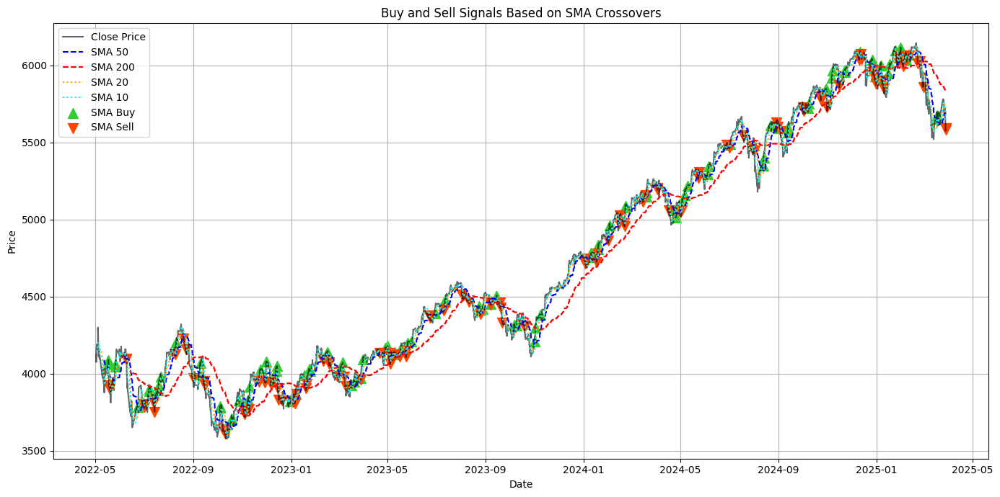

In [14]:
# Function to identify SMA crossover signals
def generate_sma_signals(data, short_sma, long_sma, buy_col, sell_col):
    data[buy_col] = np.where(
        (data[short_sma] > data[long_sma]) & (data[short_sma].shift(1) <= data[long_sma].shift(1)), 1, 0
    )
    data[sell_col] = np.where(
        (data[short_sma] < data[long_sma]) & (data[short_sma].shift(1) >= data[long_sma].shift(1)), 1, 0
    )

# Generate SMA signals for different combinations
generate_sma_signals(SP500, 'SMA_50', 'SMA_200', 'SMA_Buy_Signal_50_200', 'SMA_Sell_Signal_50_200')
generate_sma_signals(SP500, 'SMA_20', 'SMA_50', 'SMA_Buy_Signal_20_50', 'SMA_Sell_Signal_20_50')
generate_sma_signals(SP500, 'SMA_10', 'SMA_50', 'SMA_Buy_Signal_10_50', 'SMA_Sell_Signal_10_50')

# Combine buy and sell signals into single columns
SP500["SMA_Buy_Signals"] = SP500[["SMA_Buy_Signal_50_200", "SMA_Buy_Signal_20_50", "SMA_Buy_Signal_10_50"]].sum(axis=1).clip(0, 1)
SP500["SMA_Sell_Signals"] = SP500[["SMA_Sell_Signal_50_200", "SMA_Sell_Signal_20_50", "SMA_Sell_Signal_10_50"]].sum(axis=1).clip(0, 1)

# Drop the individual signal columns
SP500.drop(columns=[
    "SMA_Buy_Signal_50_200", "SMA_Buy_Signal_20_50", "SMA_Buy_Signal_10_50",
    "SMA_Sell_Signal_50_200", "SMA_Sell_Signal_20_50", "SMA_Sell_Signal_10_50"
], inplace=True)

# Plot SMA signals
plt.figure(figsize=(14, 7))

# Closing price
plt.plot(SP500.index, SP500['Close'], label='Close Price', color='black', alpha=0.6)

# SMA lines
plt.plot(SP500.index, SP500['SMA_50'], label='SMA 50', color='blue', linestyle='dashed')
plt.plot(SP500.index, SP500['SMA_200'], label='SMA 200', color='red', linestyle='dashed')
plt.plot(SP500.index, SP500['SMA_20'], label='SMA 20', color='orange', linestyle='dotted')
plt.plot(SP500.index, SP500['SMA_10'], label='SMA 10', color='cyan', linestyle='dotted')

# Buy signals (green upward arrows)
plt.scatter(SP500.index[SP500["SMA_Buy_Signals"] == 1], SP500['Close'][SP500["SMA_Buy_Signals"] == 1],
            color='#32CD32', marker='^', label='SMA Buy', s=100)

# Sell signals (red downward arrows)
plt.scatter(SP500.index[SP500["SMA_Sell_Signals"] == 1], SP500['Close'][SP500["SMA_Sell_Signals"] == 1],
            color='#FF4500', marker='v', label='SMA Sell', s=100)

# Plot configuration
plt.title('Buy and Sell Signals Based on SMA Crossovers')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

In [15]:
# Check if SMA_Buy_Signals and SMA_Sell_Signals columns exist
if "SMA_Buy_Signals" not in SP500.columns or "SMA_Sell_Signals" not in SP500.columns:
    raise ValueError("Error: Missing 'SMA_Buy_Signals' or 'SMA_Sell_Signals' columns in the data.")

# Check if Label_21F and Label_21F_Drop columns exist
if 'Label_21F' not in SP500.columns or 'Label_21F_Drop' not in SP500.columns:
    raise ValueError("Error: Missing required columns 'Label_21F' or 'Label_21F_Drop' in the data.")

# Evaluate performance of SMA_Buy_Signals
y_true_21F = SP500['Label_21F']
y_pred_buy = SP500["SMA_Buy_Signals"]

performance_metrics_label_21F_Buy = {
    "Accuracy": accuracy_score(y_true_21F, y_pred_buy),
    "Precision": precision_score(y_true_21F, y_pred_buy, zero_division=1),
    "Recall": recall_score(y_true_21F, y_pred_buy, zero_division=1),
    "F1-Score": f1_score(y_true_21F, y_pred_buy, zero_division=1)
}

# Evaluate performance of SMA_Sell_Signals
y_true_21F_Drop = SP500['Label_21F_Drop']
y_pred_sell = SP500["SMA_Sell_Signals"]

performance_metrics_label_21F_Drop_Sell = {
    "Accuracy": accuracy_score(y_true_21F_Drop, y_pred_sell),
    "Precision": precision_score(y_true_21F_Drop, y_pred_sell, zero_division=1),
    "Recall": recall_score(y_true_21F_Drop, y_pred_sell, zero_division=1),
    "F1-Score": f1_score(y_true_21F_Drop, y_pred_sell, zero_division=1)
}

# Convert results to DataFrames
performance_df_label_21F_Buy = pd.DataFrame.from_dict(performance_metrics_label_21F_Buy, orient='index', columns=["SMA_Buy_Signals"])
performance_df_label_21F_Drop_Sell = pd.DataFrame.from_dict(performance_metrics_label_21F_Drop_Sell, orient='index', columns=["SMA_Sell_Signals"])

# Display results
print("\nPerformance comparison of SMA Buy signals against Label_21F:")
print(performance_df_label_21F_Buy)

print("\nPerformance comparison of SMA Sell signals against Label_21F_Drop:")
print(performance_df_label_21F_Drop_Sell)


Performance comparison of SMA Buy signals against Label_21F:
           SMA_Buy_Signals
Accuracy          0.437187
Precision         0.617391
Recall            0.028400
F1-Score          0.054302

Performance comparison of SMA Sell signals against Label_21F_Drop:
           SMA_Sell_Signals
Accuracy           0.567365
Precision          0.379310
Recall             0.023492
F1-Score           0.044243


Conclusions:
* Accuracy is very low (~44.2%), suggesting that buy signals do not predict the uptrend well.
* Precision is the highest for SMA_Buy_Signal (~60.3%), suggesting that if this signal indicates a buy, it is often right.
* Sensitivity (Recall) is extremely low (< 0.028), suggesting that the strategy generates very few buy signals and misses many real upside opportunities.
* F1-score is low (max. 0.054), suggesting that the strategy does not balance precision and recall well.

The signals were calculated correctly.

##### MACD Moving Average Convergence / Divergence Buy and Sell
A popular indicator in technical analysis, the MACD helps identify trend changes and buying and selling moments in the market.
Signals:
* A Buy Signal occurs when the MACD line crosses the signal line from below. This can indicate the beginning of an uptrend and a potential buying opportunity.
* A Sell Signal occurs when the MACD line crosses the signal line from above, which can indicate a weakening trend and a signal to sell.

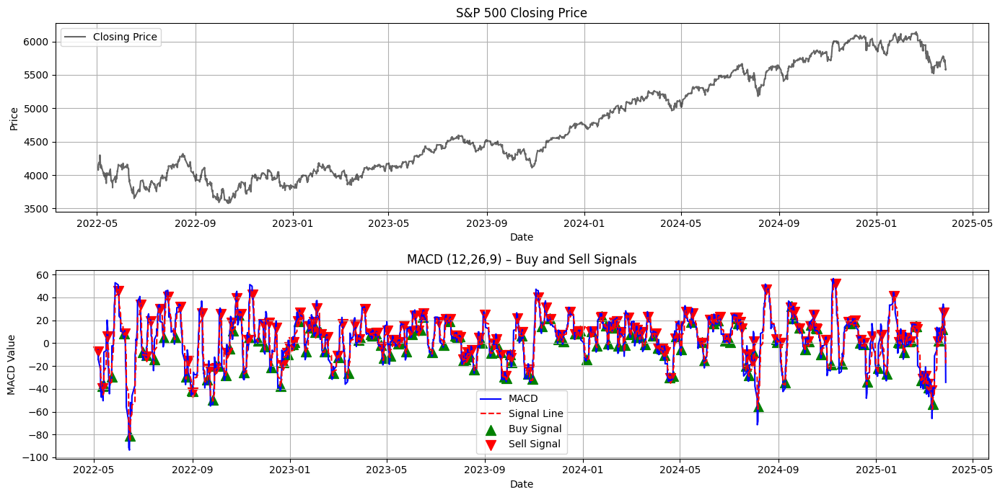


MACD Signal Counts:
MACD_Buy_Signal     164
MACD_Sell_Signal    165
dtype: int64

Recent MACD Buy Signals:
                           Close
Datetime                        
2025-03-05 13:30:00  5839.569824
2025-03-07 13:30:00  5775.839844
2025-03-12 11:30:00  5611.000000
2025-03-19 10:30:00  5652.339844
2025-03-24 10:30:00  5759.669922

Recent MACD Sell Signals:
                           Close
Datetime                        
2025-03-06 12:30:00  5736.080078
2025-03-10 11:30:00  5644.939941
2025-03-18 14:30:00  5617.419922
2025-03-20 14:30:00  5652.359863
2025-03-26 11:30:00  5732.970215


In [16]:
# Calculate MACD based on previously computed EMA 12 and EMA 26
SP500["MACD"] = SP500["EMA 12"] - SP500["EMA 26"]
SP500["Signal_Line"] = SP500["MACD"].ewm(span=9, adjust=False).mean()
SP500["MACD_Histogram"] = SP500["MACD"] - SP500["Signal_Line"]

# Generate MACD signals
SP500["MACD_Buy_Signal"] = np.where(
    (SP500["MACD"] > SP500["Signal_Line"]) & 
    (SP500["MACD"].shift(1) <= SP500["Signal_Line"].shift(1)), 1, 0
)

SP500["MACD_Sell_Signal"] = np.where(
    (SP500["MACD"] < SP500["Signal_Line"]) & 
    (SP500["MACD"].shift(1) >= SP500["Signal_Line"].shift(1)), 1, 0
)

# Plot MACD and closing price
plt.figure(figsize=(14, 7))

# Closing price chart
plt.subplot(2, 1, 1)
plt.plot(SP500.index, SP500["Close"], label="Closing Price", color="black", alpha=0.6)
plt.title("S&P 500 Closing Price")
plt.xlabel("Date")
plt.ylabel("Price")
plt.grid()
plt.legend()

# MACD chart
plt.subplot(2, 1, 2)
plt.plot(SP500.index, SP500["MACD"], label="MACD", color="blue")
plt.plot(SP500.index, SP500["Signal_Line"], label="Signal Line", color="red", linestyle="dashed")

# Buy and Sell signals
plt.scatter(SP500.index[SP500["MACD_Buy_Signal"] == 1], SP500["MACD"][SP500["MACD_Buy_Signal"] == 1],
            color="green", marker="^", label="Buy Signal", s=100)
plt.scatter(SP500.index[SP500["MACD_Sell_Signal"] == 1], SP500["MACD"][SP500["MACD_Sell_Signal"] == 1],
            color="red", marker="v", label="Sell Signal", s=100)

# Plot configuration
plt.title("MACD (12,26,9) – Buy and Sell Signals")
plt.xlabel("Date")
plt.ylabel("MACD Value")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# Display signal counts
macd_signal_counts = SP500[["MACD_Buy_Signal", "MACD_Sell_Signal"]].sum()
print("\nMACD Signal Counts:")
print(macd_signal_counts)

# Display last MACD buy signals
print("\nRecent MACD Buy Signals:")
print(SP500.loc[SP500["MACD_Buy_Signal"] == 1, ["Close"]].tail())

# Display last MACD sell signals
print("\nRecent MACD Sell Signals:")
print(SP500.loc[SP500["MACD_Sell_Signal"] == 1, ["Close"]].tail())

In [17]:
# Evaluate the effectiveness of MACD signals against Label_21F and Label_21F_Drop

# Check if required columns exist
if 'Label_21F' not in SP500.columns or 'Label_21F_Drop' not in SP500.columns:
    raise ValueError("Error: Required columns 'Label_21F' or 'Label_21F_Drop' are missing from the data.")

performance_metrics_macd_buy = {}
performance_metrics_macd_sell = {}

# Evaluate MACD Buy signals vs Label_21F (general market uptrend)
y_true_21F = SP500['Label_21F']
y_pred_buy = SP500["MACD_Buy_Signal"]

performance_metrics_macd_buy["MACD_Buy_Signal"] = {
    "Accuracy": accuracy_score(y_true_21F, y_pred_buy),
    "Precision": precision_score(y_true_21F, y_pred_buy, zero_division=1),
    "Recall": recall_score(y_true_21F, y_pred_buy, zero_division=1),
    "F1-Score": f1_score(y_true_21F, y_pred_buy, zero_division=1)
}

# Evaluate MACD Sell signals vs Label_21F_Drop (market downturns)
y_true_21F_Drop = SP500['Label_21F_Drop']
y_pred_sell = SP500["MACD_Sell_Signal"]

performance_metrics_macd_sell["MACD_Sell_Signal"] = {
    "Accuracy": accuracy_score(y_true_21F_Drop, y_pred_sell),
    "Precision": precision_score(y_true_21F_Drop, y_pred_sell, zero_division=1),
    "Recall": recall_score(y_true_21F_Drop, y_pred_sell, zero_division=1),
    "F1-Score": f1_score(y_true_21F_Drop, y_pred_sell, zero_division=1)
}

# Convert results to DataFrames for better readability
performance_df_macd_buy = pd.DataFrame.from_dict(performance_metrics_macd_buy, orient='index')
performance_df_macd_sell = pd.DataFrame.from_dict(performance_metrics_macd_sell, orient='index')

# Display the results
print("\nPerformance comparison of MACD Buy signals vs Label_21F:")
print(performance_df_macd_buy)

print("\nPerformance comparison of MACD Sell signals vs Label_21F_Drop:")
print(performance_df_macd_sell)


Performance comparison of MACD Buy signals vs Label_21F:
                 Accuracy  Precision  Recall  F1-Score
MACD_Buy_Signal  0.436049   0.567073  0.0372   0.06982

Performance comparison of MACD Sell signals vs Label_21F_Drop:
                  Accuracy  Precision    Recall  F1-Score
MACD_Sell_Signal  0.569868   0.448485  0.039509   0.07262


Conclusions:
* MACD alone is not effective enough for buying and selling - it requires additional indicators.
* MACD sell signals work better than buy signals, but still need improvement.
* The biggest problem is low Recall, i.e. too rare generation of signals.
* The best optimization is combining MACD with other technical indicators, e.g. RSI, volumes, ADX.

The signals were determined correctly.

##### RSI Relative Strength Index Buy and Sell
RSI signals are based on measuring the strength of price movement and help determine whether an asset is overvalued (overbought) or undervalued (oversold). Its values ​​are in the range of 0-100.
Types of RSI signals:
* Buy Signal occurs when RSI falls below 30 and then returns above this level. This means that the asset may be undervalued and ready to bounce up.
* Sell Signal occurs when RSI exceeds 70 and then starts to fall. This may indicate that the asset is overvalued and a downward correction is possible.

In the project, they were calculated for 7, 14 and 21 candles.


Latest RSI and signal values:
                         RSI_7     RSI_14     RSI_21  RSI_Buy_Signals  \
Datetime                                                                
2025-03-28 11:30:00  18.155640  29.328668  36.040638                0   
2025-03-28 12:30:00  16.427188  27.673818  34.616436                0   
2025-03-28 13:30:00  20.340946  29.567004  35.794868                0   
2025-03-28 14:30:00  19.907835  29.238802  35.527146                0   
2025-03-28 15:30:00  20.718600  29.585324  35.734913                0   

                     RSI_Sell_Signals  
Datetime                               
2025-03-28 11:30:00                 0  
2025-03-28 12:30:00                 0  
2025-03-28 13:30:00                 0  
2025-03-28 14:30:00                 0  
2025-03-28 15:30:00                 0  

Number of RSI signals:
RSI_Buy_Signals     222
RSI_Sell_Signals    287
dtype: int64


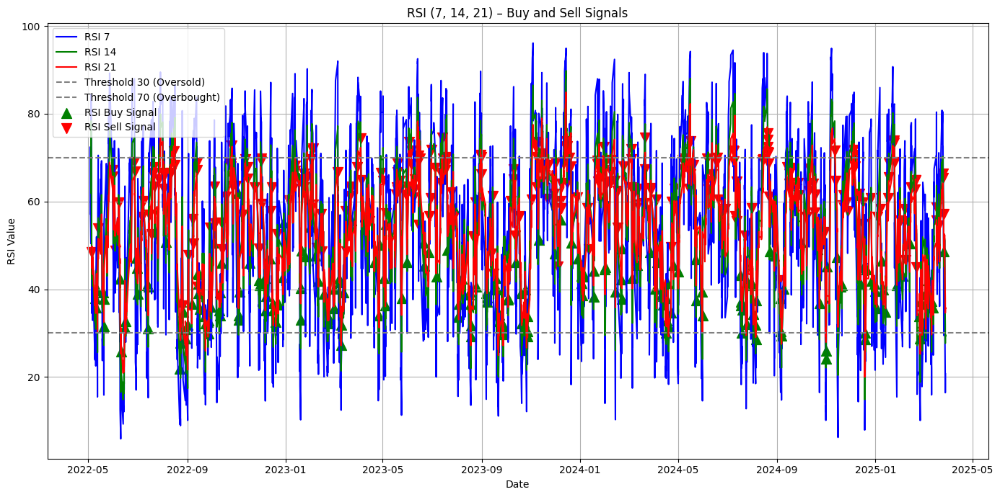

In [18]:
# Generate RSI buy and sell signals for different periods (7, 14, 21)
for period in [7, 14, 21]:
    buy_signal_col = f"RSI_{period}_Buy_Signal"
    sell_signal_col = f"RSI_{period}_Sell_Signal"
    
    SP500[buy_signal_col] = ((SP500[f"RSI_{period}"].shift(1) < 30) & (SP500[f"RSI_{period}"] >= 30)).astype(int)
    SP500[sell_signal_col] = ((SP500[f"RSI_{period}"].shift(1) > 70) & (SP500[f"RSI_{period}"] <= 70)).astype(int)

# Create aggregate RSI signals
SP500["RSI_Buy_Signals"] = SP500[["RSI_7_Buy_Signal", "RSI_14_Buy_Signal", "RSI_21_Buy_Signal"]].max(axis=1)
SP500["RSI_Sell_Signals"] = SP500[["RSI_7_Sell_Signal", "RSI_14_Sell_Signal", "RSI_21_Sell_Signal"]].max(axis=1)

# Drop individual signal columns
SP500.drop(columns=["RSI_7_Buy_Signal", "RSI_14_Buy_Signal", "RSI_21_Buy_Signal",
                    "RSI_7_Sell_Signal", "RSI_14_Sell_Signal", "RSI_21_Sell_Signal"], inplace=True)

# Display latest RSI and signal values
print("\nLatest RSI and signal values:")
print(SP500[["RSI_7", "RSI_14", "RSI_21", "RSI_Buy_Signals", "RSI_Sell_Signals"]].tail())

# Count number of buy and sell signals
signal_counts = SP500[['RSI_Buy_Signals', 'RSI_Sell_Signals']].sum()
print("\nNumber of RSI signals:")
print(signal_counts)

# Plot RSI with buy and sell signals
plt.figure(figsize=(14, 7))

# Plot each RSI period
target_periods = [7, 14, 21]
colors = ["blue", "green", "red"]
for period, color in zip(target_periods, colors):
    plt.plot(SP500.index, SP500[f"RSI_{period}"], label=f"RSI {period}", color=color)

# RSI thresholds (30 and 70)
plt.axhline(y=30, color="gray", linestyle="dashed", label="Threshold 30 (Oversold)")
plt.axhline(y=70, color="gray", linestyle="dashed", label="Threshold 70 (Overbought)")

# Buy signals (green upward arrows)
plt.scatter(SP500.index[SP500["RSI_Buy_Signals"] == 1],
            SP500["RSI_14"][SP500["RSI_Buy_Signals"] == 1],
            color="green", marker="^", label="RSI Buy Signal", s=100)

# Sell signals (red downward arrows)
plt.scatter(SP500.index[SP500["RSI_Sell_Signals"] == 1],
            SP500["RSI_14"][SP500["RSI_Sell_Signals"] == 1],
            color="red", marker="v", label="RSI Sell Signal", s=100)

# Plot configuration
plt.title("RSI (7, 14, 21) – Buy and Sell Signals")
plt.xlabel("Date")
plt.ylabel("RSI Value")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

In [19]:
# Evaluate the effectiveness of RSI signals against Label_21F and Label_21F_Drop

# Check if required columns exist
if 'Label_21F' not in SP500.columns or 'Label_21F_Drop' not in SP500.columns:
    raise ValueError("Error: Required columns 'Label_21F' or 'Label_21F_Drop' are missing from the data.")

performance_metrics_rsi_buy = {}
performance_metrics_rsi_sell = {}

# Evaluate RSI Buy signals vs Label_21F
y_true_21F = SP500['Label_21F']
y_pred_buy = SP500['RSI_Buy_Signals']

performance_metrics_rsi_buy["RSI_Buy_Signals"] = {
    "Accuracy": accuracy_score(y_true_21F, y_pred_buy),
    "Precision": precision_score(y_true_21F, y_pred_buy, zero_division=1),
    "Recall": recall_score(y_true_21F, y_pred_buy, zero_division=1),
    "F1-Score": f1_score(y_true_21F, y_pred_buy, zero_division=1)
}

# Evaluate RSI Sell signals vs Label_21F_Drop
y_true_21F_Drop = SP500['Label_21F_Drop']
y_pred_sell = SP500['RSI_Sell_Signals']

performance_metrics_rsi_sell["RSI_Sell_Signals"] = {
    "Accuracy": accuracy_score(y_true_21F_Drop, y_pred_sell),
    "Precision": precision_score(y_true_21F_Drop, y_pred_sell, zero_division=1),
    "Recall": recall_score(y_true_21F_Drop, y_pred_sell, zero_division=1),
    "F1-Score": f1_score(y_true_21F_Drop, y_pred_sell, zero_division=1)
}

# Convert results to DataFrames for better readability
performance_df_rsi_buy = pd.DataFrame.from_dict(performance_metrics_rsi_buy, orient='index')
performance_df_rsi_sell = pd.DataFrame.from_dict(performance_metrics_rsi_sell, orient='index')

# Display the results
print("\nPerformance comparison of RSI Buy signals vs Label_21F:")
print(performance_df_rsi_buy)

print("\nPerformance comparison of RSI Sell signals vs Label_21F_Drop:")
print(performance_df_rsi_sell)


Performance comparison of RSI Buy signals vs Label_21F:
                 Accuracy  Precision  Recall  F1-Score
RSI_Buy_Signals  0.433773   0.527027  0.0468  0.085966

Performance comparison of RSI Sell signals vs Label_21F_Drop:
                  Accuracy  Precision    Recall  F1-Score
RSI_Sell_Signals  0.567592   0.452962  0.069407   0.12037


Conclusions:
* RSI is not effective enough on its own – it requires additional indicators.
* RSI sell signals work better than buy signals, but are still not effective enough.
* The biggest problem is the low Recall – RSI generates few signals.
* The best optimization is to combine RSI with other technical indicators.

The signals were determined correctly.

##### ATR (Average True Range)
High ATR → Increased volatility (more dynamic market, better for day traders).
Low ATR → Lower volatility (possible consolidation, decreased attractiveness for short-term moves).
ATR as SL/TP levels → ATR × 1.5 or 2 can be used to set Stop Loss and Take Profit.

In [20]:
# Volatility classification based on ATR (0 = low, 1 = medium, 2 = high)
SP500["ATR_Volatility"] = pd.cut(
    SP500["ATR"],
    bins=[-float("inf"), SP500["ATR"].quantile(0.33), SP500["ATR"].quantile(0.67), float("inf")],
    labels=[0, 1, 2]
).astype(float)  # Convert to float to handle potential NaNs

# Replace NaN with default value 1 (medium volatility) and convert to int
SP500["ATR_Volatility"] = SP500["ATR_Volatility"].fillna(1).astype(int)

# Calculate Stop Loss (SL) and Take Profit (TP) levels based on ATR
SP500["SL_Level"] = SP500["Close"] - (SP500["ATR"] * 1.5)  # SL = Close - 1.5 * ATR
SP500["TP_Level"] = SP500["Close"] + (SP500["ATR"] * 2.0)  # TP = Close + 2.0 * ATR

# Display last values for verification
print(SP500[["Close", "ATR", "ATR_Volatility", "SL_Level", "TP_Level"]].tail())

# Count the number of days in each volatility category
atr_volatility_counts = SP500["ATR_Volatility"].value_counts().sort_index()
print("\nNumber of days in each volatility level:")
print(atr_volatility_counts)

                           Close        ATR  ATR_Volatility     SL_Level  \
Datetime                                                                   
2025-03-28 11:30:00  5590.490234  28.664275               2  5547.493821   
2025-03-28 12:30:00  5575.049805  28.269694               2  5532.645264   
2025-03-28 13:30:00  5581.879883  27.477586               2  5540.663504   
2025-03-28 14:30:00  5579.160156  26.469177               2  5539.456391   
2025-03-28 15:30:00  5580.279785  25.588531               2  5541.896988   

                        TP_Level  
Datetime                          
2025-03-28 11:30:00  5647.818785  
2025-03-28 12:30:00  5631.589193  
2025-03-28 13:30:00  5636.835054  
2025-03-28 14:30:00  5632.098510  
2025-03-28 15:30:00  5631.456847  

Number of days in each volatility level:
ATR_Volatility
0    1446
1    1502
2    1446
Name: count, dtype: int64


The values ​​were calculated correctly.

##### Bollinger Bands Buy and Sell
The signals occur when the middle band, usually a 20-period moving average, is at the upper and lower bands, which are standard deviations away from the mean, which measures market volatility.

Bollinger Bands Signals:
* A Buy Signal occurs when price falls below the lower band and starts to retrace back to the middle. This could indicate that the asset is oversold and ready to rebound.
* A Sell Signal occurs when price crosses the upper band and starts to retrace back to the middle. This could suggest that the asset is overbought and a downward correction is possible.

Number of BB Buy Signals: 358
Number of BB Sell Signals: 436


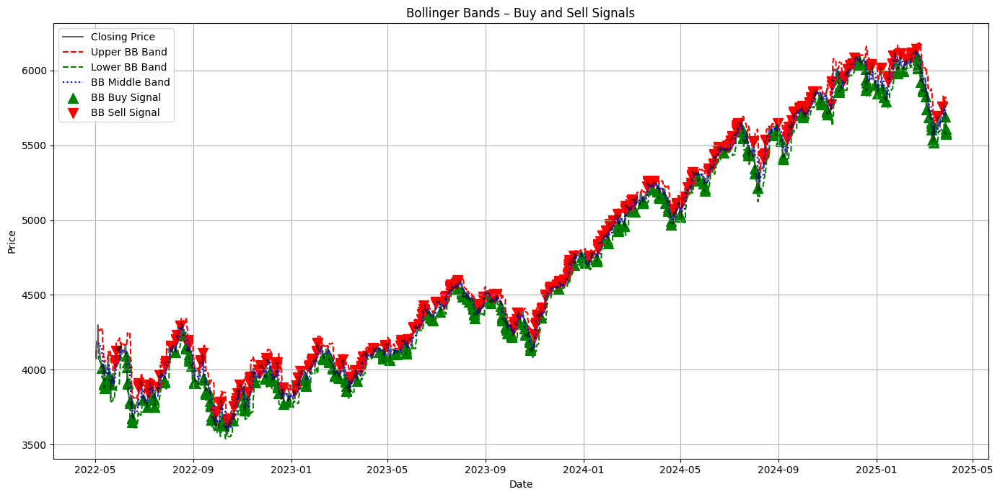

In [21]:
# Calculate Bollinger Band range (difference between upper and lower bands)
SP500["BB_Range"] = SP500["Upper_Band"] - SP500["Lower_Band"]

# Define proximity thresholds for lower and upper bands
SP500["Lower_Threshold"] = SP500["Lower_Band"] + SP500["BB_Range"] * 0.05  # 5% above lower band
SP500["Upper_Threshold"] = SP500["Upper_Band"] - SP500["BB_Range"] * 0.05  # 5% below upper band

# Generate buy and sell signals
SP500["BB_Buy_Signal"] = (SP500["Close"] <= SP500["Lower_Threshold"]).astype(int)  # 1 = buy, 0 = no signal
SP500["BB_Sell_Signal"] = (SP500["Close"] >= SP500["Upper_Threshold"]).astype(int)  # 1 = sell, 0 = no signal

# Display number of buy and sell signals
print("Number of BB Buy Signals:", SP500["BB_Buy_Signal"].sum())
print("Number of BB Sell Signals:", SP500["BB_Sell_Signal"].sum())

# Create Bollinger Bands chart with signals
plt.figure(figsize=(14, 7))

# Plot closing price and Bollinger Bands
plt.plot(SP500.index, SP500["Close"], label="Closing Price", color="black", alpha=0.6)
plt.plot(SP500.index, SP500["Upper_Band"], label="Upper BB Band", color="red", linestyle="dashed")
plt.plot(SP500.index, SP500["Lower_Band"], label="Lower BB Band", color="green", linestyle="dashed")
plt.plot(SP500.index, SP500["Middle_Band"], label="BB Middle Band", color="blue", linestyle="dotted")

# Mark buy signals (green upward arrows)
plt.scatter(SP500.index[SP500["BB_Buy_Signal"] == 1],
            SP500["Close"][SP500["BB_Buy_Signal"] == 1],
            color="green", marker="^", label="BB Buy Signal", s=100)

# Mark sell signals (red downward arrows)
plt.scatter(SP500.index[SP500["BB_Sell_Signal"] == 1],
            SP500["Close"][SP500["BB_Sell_Signal"] == 1],
            color="red", marker="v", label="BB Sell Signal", s=100)

# Chart configuration
plt.title("Bollinger Bands – Buy and Sell Signals")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

In [22]:
# Evaluate the effectiveness of Bollinger Band signals against Label_21F and Label_21F_Drop

# Check if required columns exist in the DataFrame
if 'Label_21F' not in SP500.columns or 'Label_21F_Drop' not in SP500.columns:
    raise ValueError("Error: Required columns 'Label_21F' or 'Label_21F_Drop' are missing from the data.")

performance_metrics_bb_buy = {}
performance_metrics_bb_sell = {}

# Evaluate BB Buy signals vs Label_21F (upward movements)
y_true_21F = SP500['Label_21F']
y_pred_buy = SP500["BB_Buy_Signal"]

performance_metrics_bb_buy["BB_Buy_Signal"] = {
    "Accuracy": accuracy_score(y_true_21F, y_pred_buy),
    "Precision": precision_score(y_true_21F, y_pred_buy, zero_division=1),
    "Recall": recall_score(y_true_21F, y_pred_buy, zero_division=1),
    "F1-Score": f1_score(y_true_21F, y_pred_buy, zero_division=1)
}

# Evaluate BB Sell signals vs Label_21F_Drop (downward movements)
y_true_21F_Drop = SP500['Label_21F_Drop']
y_pred_sell = SP500["BB_Sell_Signal"]

performance_metrics_bb_sell["BB_Sell_Signal"] = {
    "Accuracy": accuracy_score(y_true_21F_Drop, y_pred_sell),
    "Precision": precision_score(y_true_21F_Drop, y_pred_sell, zero_division=1),
    "Recall": recall_score(y_true_21F_Drop, y_pred_sell, zero_division=1),
    "F1-Score": f1_score(y_true_21F_Drop, y_pred_sell, zero_division=1)
}

# Convert results to DataFrames for readability
performance_df_bb_buy = pd.DataFrame.from_dict(performance_metrics_bb_buy, orient='index')
performance_df_bb_sell = pd.DataFrame.from_dict(performance_metrics_bb_sell, orient='index')

# Display the results
print("\nPerformance comparison of BB Buy signals vs Label_21F:")
print(performance_df_bb_buy)

print("\nPerformance comparison of BB Sell signals vs Label_21F_Drop:")
print(performance_df_bb_sell)


Performance comparison of BB Buy signals vs Label_21F:
               Accuracy  Precision  Recall  F1-Score
BB_Buy_Signal  0.436049   0.530726   0.076   0.13296

Performance comparison of BB Sell signals vs Label_21F_Drop:
                Accuracy  Precision    Recall  F1-Score
BB_Sell_Signal  0.551889   0.389908  0.090763   0.14725


Conclusions:
* BB buy signals are precise (~53%), but very rare (Recall = 7%).
* BB sell signals are less accurate (~39%), but also rare (Recall = 9%).
* BB alone is not enough for effective trend forecasting - it requires additional filters!
* BB works better as a risk management tool (setting Stop Loss and Take Profit), not as an independent system for generating entry and exit signals.

The signals were determined correctly.

### CBOE Volatility Index (^VIX)
The CBOE Volatility Index (^VIX) is an index that measures expected market volatility based on S&P 500 options. It is often called the "fear gauge" and reflects investor sentiment and the level of uncertainty in the market.

In [23]:
try:
    # Fetch ^VIX data from Yahoo Finance
    ticker = yf.Ticker('^VIX')
    CBOEVI = ticker.history(period="730d", interval="1h")

    # Remove unnecessary columns
    CBOEVI.drop(columns=["Dividends", "Stock Splits", "Volume"], errors='ignore', inplace=True)

    # Clean up time index and shift by +30 minutes
    CBOEVI.index = pd.to_datetime(CBOEVI.index).tz_localize(None) + pd.Timedelta(minutes=30)

    # Add 'Datetime' column and set it as index
    CBOEVI["Datetime"] = CBOEVI.index
    CBOEVI.set_index("Datetime", inplace=True)

except Exception as e:
    print(f"Error while fetching data: {e}")
    CBOEVI = None

if CBOEVI is not None:
    # Candlestick chart (without volume)
    fig = go.Figure()

    fig.add_trace(go.Candlestick(
        x=CBOEVI.index,
        open=CBOEVI['Open'],
        high=CBOEVI['High'],
        low=CBOEVI['Low'],
        close=CBOEVI['Close'],
        increasing_line_color='green',
        decreasing_line_color='red',
        name="Price"
    ))

    fig.update_layout(
        title="CBOE Volatility Index (^VIX) – Shifted +30 Minutes",
        paper_bgcolor="black",
        plot_bgcolor="black",
        font=dict(color="white"),
        xaxis=dict(showline=True, linewidth=1, linecolor='white', gridcolor='gray'),
        yaxis=dict(showline=True, linewidth=1, linecolor='white', gridcolor='gray'),
        xaxis_title="Date",
        yaxis_title="Price",
        showlegend=False,
        height=600
    )

    fig.show()

    # Display last 15 records
    print("\nLast 15 records after filtering:")
    print(CBOEVI.tail(15))

    # Data types
    print("\nData types in the DataFrame:")
    print(CBOEVI.dtypes)


Last 15 records after filtering:
                          Open       High        Low      Close
Datetime                                                       
2025-03-27 15:30:00  18.690001  18.700001  18.610001  18.680000
2025-03-28 02:30:00  19.080000  19.469999  19.000000  19.420000
2025-03-28 03:30:00  19.070000  19.469999  19.070000  19.170000
2025-03-28 04:30:00  19.360001  19.410000  19.129999  19.240000
2025-03-28 05:30:00  19.209999  19.280001  18.920000  19.030001
2025-03-28 06:30:00  18.980000  19.219999  18.920000  19.100000
2025-03-28 07:30:00  19.120001  19.420000  19.040001  19.379999
2025-03-28 08:30:00  19.139999  19.490000  18.990000  19.459999
2025-03-28 09:30:00  19.250000  20.910000  18.990000  20.570000
2025-03-28 10:30:00  20.680000  20.910000  20.200001  20.549999
2025-03-28 11:30:00  20.520000  21.510000  20.200001  21.510000
2025-03-28 12:30:00  21.170000  22.180000  20.889999  21.820000
2025-03-28 13:30:00  22.100000  22.180000  21.420000  21.420000
2025-0

#### Technical indicators for VIX

##### Exponential Moving Average (EMA)
Exponential average, more sensitive to current price changes, often used by short-term traders. Most often calculated for periods of 9, 21, 50 and 200 days.

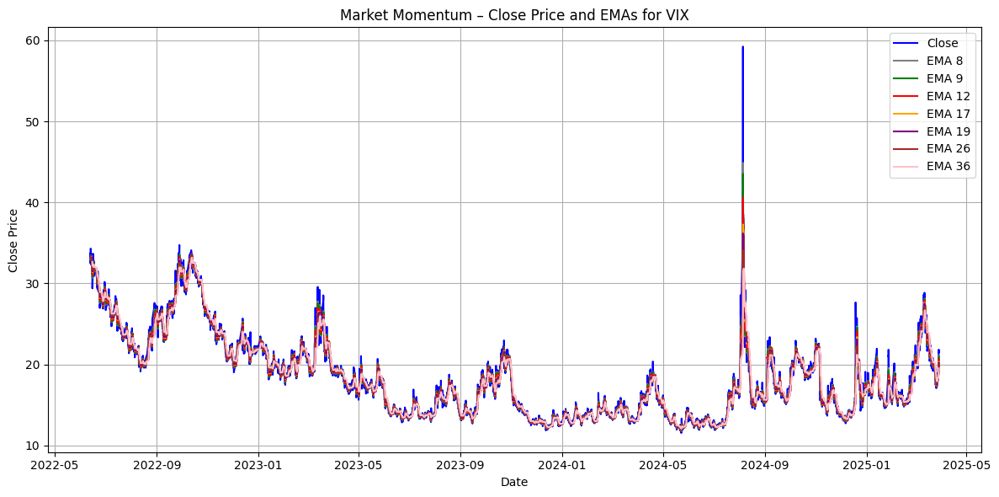


Last rows with EMA 8, 9, 12, 17, 19, 26, 36:
                     Close      EMA_8      EMA_9     EMA_12     EMA_17  \
Datetime                                                                 
2025-03-28 11:30:00  21.51  20.115189  20.020168  19.789264  19.511232   
2025-03-28 12:30:00  21.82  20.494036  20.380134  20.101685  19.767762   
2025-03-28 13:30:00  21.42  20.699805  20.588107  20.304502  19.951344   
2025-03-28 14:30:00  21.65  20.910960  20.800486  20.511502  20.140083   
2025-03-28 15:30:00  21.65  21.075191  20.970389  20.686655  20.307852   

                        EMA_19     EMA_26     EMA_36  
Datetime                                              
2025-03-28 11:30:00  19.423164  19.185142  18.985351  
2025-03-28 12:30:00  19.662848  19.380317  19.138575  
2025-03-28 13:30:00  19.838563  19.531404  19.261895  
2025-03-28 14:30:00  20.019707  19.688337  19.390982  
2025-03-28 15:30:00  20.182736  19.833646  19.513091  

Alpha coefficient for EMA 8: 0.2222
Alpha coeffic

In [24]:
# Calculate EMAs using pandas_ta
CBOEVI['EMA_8'] = ta.ema(CBOEVI['Close'], length=8)
CBOEVI['EMA_9'] = ta.ema(CBOEVI['Close'], length=9)
CBOEVI['EMA_12'] = ta.ema(CBOEVI['Close'], length=12)
CBOEVI['EMA_17'] = ta.ema(CBOEVI['Close'], length=17)
CBOEVI['EMA_19'] = ta.ema(CBOEVI['Close'], length=19)
CBOEVI['EMA_26'] = ta.ema(CBOEVI['Close'], length=26)
CBOEVI['EMA_36'] = ta.ema(CBOEVI['Close'], length=36)

# Function to calculate smoothing factor (alpha)
def calculate_alpha(window):
    return 2 / (window + 1)

# Calculate alpha for each EMA period
alpha_8 = calculate_alpha(8)
alpha_9 = calculate_alpha(9)
alpha_12 = calculate_alpha(12)
alpha_17 = calculate_alpha(17)
alpha_19 = calculate_alpha(19)
alpha_26 = calculate_alpha(26)
alpha_36 = calculate_alpha(36)

# Plot closing price and EMAs for VIX
plt.figure(figsize=(12, 6))
plt.plot(CBOEVI.index, CBOEVI['Close'], label='Close', color='blue')
plt.plot(CBOEVI.index, CBOEVI['EMA_8'], label='EMA 8', color='gray')
plt.plot(CBOEVI.index, CBOEVI['EMA_9'], label='EMA 9', color='green')
plt.plot(CBOEVI.index, CBOEVI['EMA_12'], label='EMA 12', color='red')
plt.plot(CBOEVI.index, CBOEVI['EMA_17'], label='EMA 17', color='orange')
plt.plot(CBOEVI.index, CBOEVI['EMA_19'], label='EMA 19', color='purple')
plt.plot(CBOEVI.index, CBOEVI['EMA_26'], label='EMA 26', color='brown')
plt.plot(CBOEVI.index, CBOEVI['EMA_36'], label='EMA 36', color='pink')

# Plot configuration
plt.title('Market Momentum – Close Price and EMAs for VIX')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Display last rows with EMA values
print("\nLast rows with EMA 8, 9, 12, 17, 19, 26, 36:")
print(CBOEVI[['Close', 'EMA_8', 'EMA_9', 'EMA_12', 'EMA_17', 'EMA_19', 'EMA_26', 'EMA_36']].tail())

# Display alpha coefficients
print(f"\nAlpha coefficient for EMA 8: {alpha_8:.4f}")
print(f"Alpha coefficient for EMA 9: {alpha_9:.4f}")
print(f"Alpha coefficient for EMA 12: {alpha_12:.4f}")
print(f"Alpha coefficient for EMA 17: {alpha_17:.4f}")
print(f"Alpha coefficient for EMA 19: {alpha_19:.4f}")
print(f"Alpha coefficient for EMA 26: {alpha_26:.4f}")
print(f"Alpha coefficient for EMA 36: {alpha_36:.4f}")

The indicators were calculated correctly.

#### Signals for VIX

##### MACD Moving Average Convergence / Divergence Buy and Sell
A popular indicator in technical analysis, the MACD helps identify trend changes and buying and selling moments in the market.

Signals:
* A Buy Signal occurs when the MACD line crosses the signal line from below. This can indicate the beginning of an uptrend and a potential buying opportunity.
* A Sell Signal occurs when the MACD line crosses the signal line from above, which can indicate a weakening trend and a signal to sell.

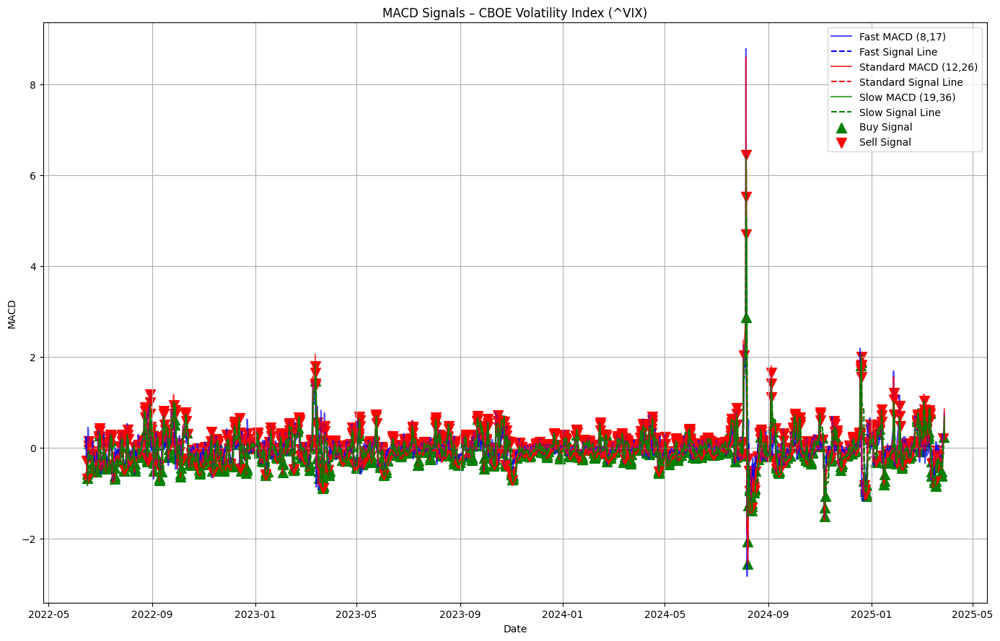


Total MACD Signals:
MACD Buy     927
MACD Sell    988
dtype: int64


In [25]:
# Function to generate MACD and corresponding buy/sell signals
def generate_macd_signals(data, fast_col, slow_col, macd_type, signal_length=9):
    """
    Generates MACD indicator and buy/sell signals for different MACD configurations.
    """
    macd_col = f"MACD_{macd_type}"
    signal_col = f"Signal_Line_{macd_type}"
    histogram_col = f"MACD_Histogram_{macd_type}"
    buy_signal_col = f"MACD_Buy_Signal_{macd_type}"
    sell_signal_col = f"MACD_Sell_Signal_{macd_type}"

    # Calculate MACD using precomputed EMAs
    data[macd_col] = data[fast_col] - data[slow_col]
    data[signal_col] = data[macd_col].ewm(span=signal_length, adjust=False).mean()
    data[histogram_col] = data[macd_col] - data[signal_col]

    # Generate buy and sell signals
    data[buy_signal_col] = np.where(
        (data[macd_col] > data[signal_col]) & (data[macd_col].shift(1) <= data[signal_col].shift(1)), 1, 0
    )
    data[sell_signal_col] = np.where(
        (data[macd_col] < data[signal_col]) & (data[macd_col].shift(1) >= data[signal_col].shift(1)), 1, 0
    )

# Generate MACD signals with three different configurations
generate_macd_signals(CBOEVI, fast_col="EMA_8", slow_col="EMA_17", macd_type="Fast")
generate_macd_signals(CBOEVI, fast_col="EMA_12", slow_col="EMA_26", macd_type="Standard")
generate_macd_signals(CBOEVI, fast_col="EMA_19", slow_col="EMA_36", macd_type="Slow")

# Combine all MACD signals into single columns
CBOEVI["MACD_Buy_Signal"] = CBOEVI[[
    "MACD_Buy_Signal_Fast", "MACD_Buy_Signal_Standard", "MACD_Buy_Signal_Slow"
]].max(axis=1)

CBOEVI["MACD_Sell_Signal"] = CBOEVI[[
    "MACD_Sell_Signal_Fast", "MACD_Sell_Signal_Standard", "MACD_Sell_Signal_Slow"
]].max(axis=1)

# Drop individual signal columns
CBOEVI.drop(columns=[
    "MACD_Buy_Signal_Fast", "MACD_Buy_Signal_Standard", "MACD_Buy_Signal_Slow",
    "MACD_Sell_Signal_Fast", "MACD_Sell_Signal_Standard", "MACD_Sell_Signal_Slow"
], inplace=True)

# Plot MACD signals
plt.figure(figsize=(14, 9))

# MACD lines and signal lines
plt.plot(CBOEVI.index, CBOEVI["MACD_Fast"], label="Fast MACD (8,17)", color="blue", alpha=0.7)
plt.plot(CBOEVI.index, CBOEVI["Signal_Line_Fast"], label="Fast Signal Line", color="blue", linestyle="dashed")

plt.plot(CBOEVI.index, CBOEVI["MACD_Standard"], label="Standard MACD (12,26)", color="red", alpha=0.7)
plt.plot(CBOEVI.index, CBOEVI["Signal_Line_Standard"], label="Standard Signal Line", color="red", linestyle="dashed")

plt.plot(CBOEVI.index, CBOEVI["MACD_Slow"], label="Slow MACD (19,36)", color="green", alpha=0.7)
plt.plot(CBOEVI.index, CBOEVI["Signal_Line_Slow"], label="Slow Signal Line", color="green", linestyle="dashed")

# Buy and sell signal markers
plt.scatter(CBOEVI.index[CBOEVI["MACD_Buy_Signal"] == 1],
            CBOEVI["MACD_Standard"][CBOEVI["MACD_Buy_Signal"] == 1],
            color="green", marker="^", label="Buy Signal", s=100)

plt.scatter(CBOEVI.index[CBOEVI["MACD_Sell_Signal"] == 1],
            CBOEVI["MACD_Standard"][CBOEVI["MACD_Sell_Signal"] == 1],
            color="red", marker="v", label="Sell Signal", s=100)

# Chart configuration
plt.title("MACD Signals – CBOE Volatility Index (^VIX)")
plt.xlabel("Date")
plt.ylabel("MACD")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

# Count of combined MACD signals
macd_signal_counts = {
    "MACD Buy": CBOEVI["MACD_Buy_Signal"].sum(),
    "MACD Sell": CBOEVI["MACD_Sell_Signal"].sum()
}

print("\nTotal MACD Signals:")
print(pd.Series(macd_signal_counts))

In [26]:
# Check if required label columns exist in SP500
if 'Label_21F' not in SP500.columns or 'Label_21F_Drop' not in SP500.columns:
    raise ValueError("Error: Required columns 'Label_21F' or 'Label_21F_Drop' are missing in SP500 data.")

# Align indices between SP500 and CBOEVI (only common dates)
common_index = SP500.index.intersection(CBOEVI.index)

# Filter both datasets to keep only rows with matching dates
SP500_filtered = SP500.loc[common_index]
CBOEVI_filtered = CBOEVI.loc[common_index]

# Initialize dictionaries for evaluation metrics
performance_metrics_macd_buy = {}
performance_metrics_macd_sell = {}

# Evaluate VIX MACD Buy signals against S&P 500 Label_21F (upward movements)
y_true_21F = SP500_filtered['Label_21F']
y_pred_buy = CBOEVI_filtered["MACD_Buy_Signal"]

performance_metrics_macd_buy["MACD_Buy_Signal"] = {
    "Accuracy": accuracy_score(y_true_21F, y_pred_buy),
    "Precision": precision_score(y_true_21F, y_pred_buy, zero_division=1),
    "Recall": recall_score(y_true_21F, y_pred_buy, zero_division=1),
    "F1-Score": f1_score(y_true_21F, y_pred_buy, zero_division=1)
}

# Evaluate VIX MACD Sell signals against S&P 500 Label_21F_Drop (downward movements)
y_true_21F_Drop = SP500_filtered['Label_21F_Drop']
y_pred_sell = CBOEVI_filtered["MACD_Sell_Signal"]

performance_metrics_macd_sell["MACD_Sell_Signal"] = {
    "Accuracy": accuracy_score(y_true_21F_Drop, y_pred_sell),
    "Precision": precision_score(y_true_21F_Drop, y_pred_sell, zero_division=1),
    "Recall": recall_score(y_true_21F_Drop, y_pred_sell, zero_division=1),
    "F1-Score": f1_score(y_true_21F_Drop, y_pred_sell, zero_division=1)
}

# Convert results to DataFrames for better readability
performance_df_macd_buy = pd.DataFrame.from_dict(performance_metrics_macd_buy, orient='index')
performance_df_macd_sell = pd.DataFrame.from_dict(performance_metrics_macd_sell, orient='index')

# Display the results
print("\nPerformance of VIX MACD Buy Signals vs SP500 Label_21F:")
print(performance_df_macd_buy)

print("\nPerformance of VIX MACD Sell Signals vs SP500 Label_21F_Drop:")
print(performance_df_macd_sell)


Performance of VIX MACD Buy Signals vs SP500 Label_21F:
                 Accuracy  Precision    Recall  F1-Score
MACD_Buy_Signal   0.43825    0.59322  0.076021  0.134771

Performance of VIX MACD Sell Signals vs SP500 Label_21F_Drop:
                  Accuracy  Precision    Recall  F1-Score
MACD_Sell_Signal     0.561   0.423301  0.129994  0.198905


Conclusions:
* MACD alone is not effective enough to make decisions about buying and selling - it requires confirmation with other indicators.
* MACD sell signals are more effective than buy signals, but still have limited accuracy.
* The biggest problem is the low Recall, which means that MACD does not detect most of the real market opportunities.
* The best optimization is to combine MACD with other technical indicators, e.g. RSI, volume, ADX, to increase effectiveness and reduce false signals.

The signals were determined correctly.

# Merging data and preparing for further analysis
The code processes and merges market data from two sources: SP500 and CBOEVI, preparing them for further analysis. First, it adds the prefix "CBOEVI_" to the column names to avoid conflicts during data merging. Then, it filters the rows from CBOEVI, leaving only those corresponding to 09:30:00, which is crucial for analyzing the market opening. In the next step, it updates the MACD buy and sell signals in the original CBOEVI dataset, but only for the selected hour.

After these operations, the SP500 and CBOEVI data are merged based on the index (date and time), and the rows where all the columns related to closing prices are empty are removed. The code also checks the available date range and identifies missing values ​​in the merged dataset. Then, it removes data older than October 3, 2022, so that the analysis concerns only the most recent period.

Finally, the first rows of the final combined_data table are displayed, which contains filtered and cleaned data, ready for further market analysis and testing of investment strategies.

## Merge data and remove rows with empty values.

In [27]:
# Add the prefix "CBOEVI_" to every column name
CBOEVI.columns = ["CBOEVI_" + col for col in CBOEVI.columns]

In [28]:
# Filter rows with time exactly at 09:30:00
daily_rows_CBOEVI = CBOEVI[CBOEVI.index.strftime('%H:%M:%S') == "09:30:00"].copy()

# Update the original CBOEVI DataFrame with MACD signals only at 09:30
CBOEVI.loc[daily_rows_CBOEVI.index, ["CBOEVI_MACD_Buy_Signal", "CBOEVI_MACD_Sell_Signal"]] = daily_rows_CBOEVI[
    ["CBOEVI_MACD_Buy_Signal", "CBOEVI_MACD_Sell_Signal"]
]

# Show the processed data for 09:30:00 time entries
print("Preview of processed MACD signals at 09:30:00:")
print(CBOEVI.loc[daily_rows_CBOEVI.index, ["CBOEVI_MACD_Buy_Signal", "CBOEVI_MACD_Sell_Signal"]])

Preview of processed MACD signals at 09:30:00:
                     CBOEVI_MACD_Buy_Signal  CBOEVI_MACD_Sell_Signal
Datetime                                                            
2022-06-13 09:30:00                       0                        0
2022-06-14 09:30:00                       0                        0
2022-06-15 09:30:00                       0                        0
2022-06-16 09:30:00                       0                        0
2022-06-17 09:30:00                       0                        0
...                                     ...                      ...
2025-03-24 09:30:00                       0                        0
2025-03-25 09:30:00                       0                        0
2025-03-26 09:30:00                       0                        0
2025-03-27 09:30:00                       0                        0
2025-03-28 09:30:00                       0                        0

[721 rows x 2 columns]


In [29]:
# Merge data – SP500 only (joined with CBOEVI)
combined_data = SP500.merge(CBOEVI, how="outer", left_index=True, right_index=True, suffixes=('_SP500', '_CBOEVI'))

# Find all columns that contain "Close"
close_columns = [col for col in combined_data.columns if "Close" in col]

# Drop rows where **all** "Close" columns are NaN
combined_data = combined_data.dropna(subset=close_columns, how="all")

# Check date range
print("\nDate range in the combined dataset (SP500 only):")
print(f"Earliest date: {combined_data.index.min()}")
print(f"Latest date: {combined_data.index.max()}")

# Check for missing values
missing_values = combined_data.isnull().sum()
print("\nMissing values in SP500 dataset:")
print(missing_values[missing_values > 0])


Date range in the combined dataset (SP500 only):
Earliest date: 2022-05-02 10:30:00
Latest date: 2025-03-28 15:30:00

Missing values in SP500 dataset:
Open                          5756
High                          5756
Low                           5756
Close                         5756
Volume                        5756
                              ... 
CBOEVI_MACD_Slow               429
CBOEVI_Signal_Line_Slow        429
CBOEVI_MACD_Histogram_Slow     429
CBOEVI_MACD_Buy_Signal         394
CBOEVI_MACD_Sell_Signal        394
Length: 76, dtype: int64


In [30]:
# Define the cutoff date
cutoff_date = pd.to_datetime("2023-02-01 09:30:00")

# Remove rows older than the cutoff date
combined_data = combined_data[combined_data.index >= cutoff_date]

# Display the first rows after trimming
print(combined_data.head())

                            Open         High          Low        Close  \
Datetime                                                                  
2023-02-01 09:30:00          NaN          NaN          NaN          NaN   
2023-02-01 10:30:00  4068.510010  4070.969971  4052.290039  4064.739990   
2023-02-01 11:30:00  4064.719971  4067.199951  4050.250000  4054.870117   
2023-02-01 12:30:00  4054.850098  4058.070068  4052.469971  4057.830078   
2023-02-01 13:30:00  4057.870117  4072.479980  4044.469971  4059.469971   

                          Volume  Label  Label_21F  Label_21F_Drop  \
Datetime                                                             
2023-02-01 09:30:00          NaN    NaN        NaN             NaN   
2023-02-01 10:30:00  307970668.0    0.0        1.0             0.0   
2023-02-01 11:30:00  231376792.0    0.0        1.0             0.0   
2023-02-01 12:30:00  205058000.0    1.0        1.0             0.0   
2023-02-01 13:30:00  280988000.0    1.0        1.0    

In [31]:
# Preview of merged data
print("Preview of combined data:")
print(combined_data.head())

# Check the date range
print("\nDate range in the combined dataset:")
print(f"Earliest date: {combined_data.index.min()}")
print(f"Latest date: {combined_data.index.max()}")

# Check for missing values
missing_values = combined_data.isnull().sum()
print("\nNumber of missing values in the combined dataset:")
print(missing_values[missing_values > 0])

Preview of combined data:
                            Open         High          Low        Close  \
Datetime                                                                  
2023-02-01 09:30:00          NaN          NaN          NaN          NaN   
2023-02-01 10:30:00  4068.510010  4070.969971  4052.290039  4064.739990   
2023-02-01 11:30:00  4064.719971  4067.199951  4050.250000  4054.870117   
2023-02-01 12:30:00  4054.850098  4058.070068  4052.469971  4057.830078   
2023-02-01 13:30:00  4057.870117  4072.479980  4044.469971  4059.469971   

                          Volume  Label  Label_21F  Label_21F_Drop  \
Datetime                                                             
2023-02-01 09:30:00          NaN    NaN        NaN             NaN   
2023-02-01 10:30:00  307970668.0    0.0        1.0             0.0   
2023-02-01 11:30:00  231376792.0    0.0        1.0             0.0   
2023-02-01 12:30:00  205058000.0    1.0        1.0             0.0   
2023-02-01 13:30:00  2809880

In [32]:
# Preview of merged data
print("Preview of combined data:")
print(combined_data.head())

Preview of combined data:
                            Open         High          Low        Close  \
Datetime                                                                  
2023-02-01 09:30:00          NaN          NaN          NaN          NaN   
2023-02-01 10:30:00  4068.510010  4070.969971  4052.290039  4064.739990   
2023-02-01 11:30:00  4064.719971  4067.199951  4050.250000  4054.870117   
2023-02-01 12:30:00  4054.850098  4058.070068  4052.469971  4057.830078   
2023-02-01 13:30:00  4057.870117  4072.479980  4044.469971  4059.469971   

                          Volume  Label  Label_21F  Label_21F_Drop  \
Datetime                                                             
2023-02-01 09:30:00          NaN    NaN        NaN             NaN   
2023-02-01 10:30:00  307970668.0    0.0        1.0             0.0   
2023-02-01 11:30:00  231376792.0    0.0        1.0             0.0   
2023-02-01 12:30:00  205058000.0    1.0        1.0             0.0   
2023-02-01 13:30:00  2809880

Data was merged correctly and missing values ​​were removed.

## Defining a combined buy or sell signal for combined data
The code analyzes buy and sell signals from various technical indicators, filtering them from the combined_data data. Then it creates an interactive S&P 500 candlestick chart, adding buy (green) and sell (red) signal markers. Additionally, it displays the trading volume and checks if the time index is set correctly as DatetimeIndex. This allows you to visually assess the effectiveness of market signals.

In [33]:
# Check if all signal columns exist in the data
signal_columns = [
    "SMA_Buy_Signal_50_200", "SMA_Sell_Signal_50_200",
    "SMA_Buy_Signal_20_50", "SMA_Sell_Signal_20_50",
    "SMA_Buy_Signal_10_50", "SMA_Sell_Signal_10_50",
    "MACD_Buy_Signal", "MACD_Sell_Signal",
    "RSI_7_Buy_Signal", "RSI_14_Buy_Signal", "RSI_21_Buy_Signal",
    "RSI_7_Sell_Signal", "RSI_14_Sell_Signal", "RSI_21_Sell_Signal",
    "BB_Buy_Signal", "BB_Sell_Signal",
    "CBOEVI_MACD_Buy_Signal", "CBOEVI_MACD_Sell_Signal"
]

# Check which of these columns exist in the dataset
existing_columns = [col for col in signal_columns if col in combined_data.columns]

# Filter buy and sell signals for each signal pair
def filter_signals(buy_col, sell_col):
    """Filter buy and sell signals for a given column pair."""
    buy_df = combined_data[combined_data[buy_col] == 1] if buy_col in existing_columns else pd.DataFrame()
    sell_df = combined_data[combined_data[sell_col] == 1] if sell_col in existing_columns else pd.DataFrame()
    return buy_df, sell_df

# Retrieve signals for each signal pair group
filtered_signals = {}
for i in range(0, len(signal_columns), 2):
    buy_col, sell_col = signal_columns[i], signal_columns[i+1]
    filtered_signals[(buy_col, sell_col)] = filter_signals(buy_col, sell_col)

In [34]:
# Create candlestick chart with volume
fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                    vertical_spacing=0.1,
                    row_heights=[0.7, 0.3],
                    subplot_titles=("Candlestick Chart – S&P 500", "Volume"))

# Add candlestick trace
fig.add_trace(go.Candlestick(
    x=combined_data.index,
    open=combined_data['Open'],
    high=combined_data['High'],
    low=combined_data['Low'],
    close=combined_data['Close'],
    increasing_line_color='lime',
    decreasing_line_color='red',
    name="Price"
), row=1, col=1)

# Add volume trace
fig.add_trace(go.Bar(
    x=combined_data.index,
    y=combined_data['Volume'],
    marker_color='gray',
    name="Volume"
), row=2, col=1)

# Add buy/sell signal markers
def add_signals(fig, buy_df, sell_df, name_prefix, size=10, opacity=1.0):
    """Add buy and sell signal markers to the chart."""
    if not buy_df.empty:
        fig.add_trace(go.Scatter(
            x=buy_df.index,
            y=buy_df["Low"],
            mode="markers",
            marker=dict(color="green", size=size, symbol="triangle-up", opacity=opacity),
            name=f"{name_prefix} – Buy Signal"
        ), row=1, col=1)

    if not sell_df.empty:
        fig.add_trace(go.Scatter(
            x=sell_df.index,
            y=sell_df["High"],
            mode="markers",
            marker=dict(color="red", size=size, symbol="triangle-down", opacity=opacity),
            name=f"{name_prefix} – Sell Signal"
        ), row=1, col=1)

# Add all signals to the chart
for (buy_col, sell_col), (buy_df, sell_df) in filtered_signals.items():
    add_signals(fig, buy_df, sell_df, buy_col.replace("_Buy_Signal", ""), size=10, opacity=0.8)

# Style the layout
fig.update_layout(
    paper_bgcolor="black",
    plot_bgcolor="black",
    font=dict(color="white"),
    xaxis=dict(showline=True, linewidth=1, linecolor='white', gridcolor='gray'),
    yaxis=dict(showline=True, linewidth=1, linecolor='white', gridcolor='gray'),
    xaxis2=dict(title="Date"),
    yaxis_title="Price",
    yaxis2_title="Volume",
    showlegend=True,
    height=800
)

# Show the chart
fig.show()

In [35]:
# Check if the index is properly set as a DatetimeIndex
if not isinstance(combined_data.index, pd.DatetimeIndex):
    print("Converting index to datetime format...")
    combined_data.index = pd.to_datetime(combined_data.index)

print(combined_data.index)  # Should display: DatetimeIndex([...], dtype='datetime64[ns]', freq=None)

DatetimeIndex(['2023-02-01 09:30:00', '2023-02-01 10:30:00',
               '2023-02-01 11:30:00', '2023-02-01 12:30:00',
               '2023-02-01 13:30:00', '2023-02-01 14:30:00',
               '2023-02-01 15:30:00', '2023-02-02 02:30:00',
               '2023-02-02 03:30:00', '2023-02-02 04:30:00',
               ...
               '2025-03-28 06:30:00', '2025-03-28 07:30:00',
               '2025-03-28 08:30:00', '2025-03-28 09:30:00',
               '2025-03-28 10:30:00', '2025-03-28 11:30:00',
               '2025-03-28 12:30:00', '2025-03-28 13:30:00',
               '2025-03-28 14:30:00', '2025-03-28 15:30:00'],
              dtype='datetime64[ns]', name='Datetime', length=7688, freq=None)


Signals and data were connected correctly.

# Data Split
Data splitting into 70% training, 15% validation, and 15% testing provides a more balanced model evaluation and prevents data leakage.

* 70% – training set
    * The largest portion of the data is used to train the model.
    * It allows for a more accurate capture of market patterns, which increases the stability of the model.

* 15% – validation set
    * Used to tune hyperparameters and avoid overfitting.
    * The model is evaluated on this data during the training process, but does not learn from it.

* 15% – test set
    * Provides an unbiased assessment of the model's performance on completely new data.
    * Better representation of market data than the previous 80-15-5 split, as a larger test set means better model generalization.

This split increases the model's robustness by minimizing the risk of overfitting, leakage, and optimizing its ability to perform on real data.

In [36]:
# Determine the total number of rows in the dataset
total_rows = len(combined_data)

# Calculate split indices for 70% / 15% / 15%
train_end = int(total_rows * 0.70)  # 70% for training
val_end = int(total_rows * 0.85)    # 15% for validation (total 85%)

# Split the dataset into three sets
train_data = combined_data.iloc[:train_end]        # 70% - training
val_data = combined_data.iloc[train_end:val_end]   # 15% - validation
test_data = combined_data.iloc[val_end:]           # 15% - test

# Display the number of rows in each split
print(f"Number of rows in training set: {len(train_data)}")
print(f"Number of rows in validation set: {len(val_data)}")
print(f"Number of rows in test set: {len(test_data)}")

# Preview the end of the training data
print("\nTraining data:")
print(train_data.tail())

Number of rows in training set: 5381
Number of rows in validation set: 1153
Number of rows in test set: 1154

Training data:
                     Open  High  Low  Close  Volume  Label  Label_21F  \
Datetime                                                                
2024-08-05 03:30:00   NaN   NaN  NaN    NaN     NaN    NaN        NaN   
2024-08-05 04:30:00   NaN   NaN  NaN    NaN     NaN    NaN        NaN   
2024-08-05 05:30:00   NaN   NaN  NaN    NaN     NaN    NaN        NaN   
2024-08-05 06:30:00   NaN   NaN  NaN    NaN     NaN    NaN        NaN   
2024-08-05 07:30:00   NaN   NaN  NaN    NaN     NaN    NaN        NaN   

                     Label_21F_Drop  SMA_10  SMA_20  ...  \
Datetime                                             ...   
2024-08-05 03:30:00             NaN     NaN     NaN  ...   
2024-08-05 04:30:00             NaN     NaN     NaN  ...   
2024-08-05 05:30:00             NaN     NaN     NaN  ...   
2024-08-05 06:30:00             NaN     NaN     NaN  ...   
202

The code starts by calculating the number of rows in the combined_data set to determine the proportions for splitting the data. It then calculates the boundary indices, where 70% of the data is assigned to the training set and another 15% to the validation set, which together constitutes 85% of the data used to train and tune the model. The remaining 15% is used for final testing.

The data is split into three parts: a training set used to train the model, a validation set for optimizing hyperparameters, and a test set that allows for a final evaluation of the model's performance on data it has never seen before. Finally, the code prints the number of rows in each set and previews the last rows of the training set.

The split was done correctly.

# Strategy
The investment strategy is based on a set of technical market analysis indicators that generate buy and sell signals. It is a trend-following approach that uses popular indicators to identify potential market entry and exit points.

## Assumptions
The main elements of the strategy include:

1. Risk management parameters
* Position size (mysize) – each trade is opened in full size in relation to the available capital.
* Stop-loss (slcoef) – a level calculated dynamically based on the ATR (Average True Range) indicator, which helps protect against excessive losses.
* Take-profit (TPSLRatio) – a profit level set three times higher than the stop-loss, which improves the risk-to-reward ratio.
* Maximum holding time (trade_window_bars) – the strategy closes the position automatically after 21 time units if the price does not reach the previously defined SL or TP levels.
* Maximum number of open positions (max_open_positions) – a limitation allows for better capital control and avoidance of excessive risk exposure.

2. Technical indicators used
The strategy is based on several buy and sell signals generated by different indicators:
* Moving Averages (SMA) – detecting intersections of short-term and long-term moving averages.
* MACD – momentum indicator to identify trend changes.
* RSI (7, 14, 21) – detecting overbought and oversold markets.
* Bollinger Bands (BB) – volatility analysis and detecting extreme price levels.
* CBOE Volatility Index (CBOEVI) – signals from the volatility index as an additional filter.
A buy signal is generated when any of these indicators indicates a positive trend, and a sell signal when any of the indicators suggests a trend reversal.

3. Capital management and opening a position
* A position is opened only when available funds allow its implementation.
* If the number of open positions reaches the maximum limit, the strategy will not open another transaction.
* Stop-loss and take-profit are set dynamically depending on the ATR value, which adjusts the strategy to market volatility.

4. Conditions for closing a position
* A position is closed if any of the following conditions are met:

* Sell signal (when any of the indicators generates a signal to exit the position).

* Maximum holding time (21 bars) – if the price does not reach either stop-loss or take-profit.

* Last bar of simulation – all open positions are closed at the end of the analysis.

The strategy is implemented in vectorbt, where vbt.Portfolio.from_signals() creates a portfolio, taking into account buy and sell signals, stop-loss and take-profit levels, and risk management constraints.

In [37]:
# Define investment strategy parameters

mysize = 1.0  # Position size – defines how many units to buy per signal
slcoef = 1.1  # Stop-loss coefficient – SL distance based on ATR (slcoef * ATR)
TPSLRatio = 3.0  # Take-profit ratio – TP is set x times farther than SL
trade_window_bars = 21  # Maximum holding period (e.g., 21 hourly candles)
max_open_positions = 1  # Maximum number of open positions at the same time

# Initialize starting capital
initial_cash = 6_300  # Initial capital available for trading

## Calculations

In [38]:
# Load market data into a DataFrame
df = test_data.copy()  # Create a copy to avoid modifying the original data
close = df['Close']    # Extract closing prices for calculations

# Calculate ATR (Average True Range)
atr = vbt.ATR.run(high=df['High'], low=df['Low'], close=df['Close'], window=14).atr
# ATR measures market volatility and is used for dynamic stop-loss levels

# Define buy signals based on various technical indicators
buy_signal = (
    (df["SMA_Buy_Signals"] > 0) |  # Buy signal from moving average crossovers
    (df["MACD_Buy_Signal"] > 0) |  # Buy signal from MACD (momentum trend)
    (df["RSI_Buy_Signals"] > 0) |  # Buy signal from RSI (oversold market)
    (df["BB_Buy_Signal"] > 0) |    # Buy signal from Bollinger Bands (low prices)
    (df["CBOEVI_MACD_Buy_Signal"] > 0)  # Buy signal from volatility index (CBOEVI)
)

# Define sell signals based on various technical indicators
sell_signal = (
    (df["SMA_Sell_Signals"] > 0) |  # Sell signal from moving average crossovers
    (df["MACD_Sell_Signal"] > 0) |  # Sell signal from MACD (trend reversal)
    (df["RSI_Sell_Signals"] > 0) |  # Sell signal from RSI (overbought market)
    (df["BB_Sell_Signal"] > 0) |    # Sell signal from Bollinger Bands (high prices)
    (df["CBOEVI_MACD_Sell_Signal"] > 0)  # Sell signal from volatility index (CBOEVI)
)

# Convert signals to Series and align with closing price index
buy_signal = pd.Series(buy_signal, index=close.index).infer_objects(copy=False)
sell_signal = pd.Series(sell_signal, index=close.index).infer_objects(copy=False)

# Create a Series to track available cash over time
available_cash = pd.Series(initial_cash, index=close.index).astype(float)

# Calculate position value = price * size
position_value = close * mysize

# Calculate number of open positions based on cumulative signals
open_positions = buy_signal.cumsum() - sell_signal.cumsum()

# Limit open positions to max_open_positions
buy_signal = buy_signal & (open_positions < max_open_positions)

# Open position only if sufficient cash is available
buy_signal = buy_signal & (available_cash >= position_value)

# Update available cash after opening a position
available_cash.loc[buy_signal] -= position_value.loc[buy_signal]

# Initialize Series for stop-loss and take-profit levels
stop_loss = pd.Series(np.nan, index=close.index)
take_profit = pd.Series(np.nan, index=close.index)

# Set stop-loss levels for buy signals: close - (slcoef * ATR)
stop_loss.loc[buy_signal] = close.loc[buy_signal] - (slcoef * atr.loc[buy_signal])

# Set take-profit levels for buy signals: close * TPSLRatio
take_profit.loc[buy_signal] = close.loc[buy_signal] * TPSLRatio

# Add condition to exit positions after maximum holding time (21 bars)
exit_signal = buy_signal.shift(trade_window_bars).infer_objects(copy=False)

# Close all open positions at the end of the simulation
final_exit_signal = pd.Series(False, index=close.index)
final_exit_signal.iloc[-1] = True  # Force exit on the last bar

# Create portfolio using vectorbt
portfolio = vbt.Portfolio.from_signals(
    close=close,
    entries=buy_signal,  # Entry signals
    exits=sell_signal | exit_signal | final_exit_signal,  # Exit conditions
    size=mysize,  # Position size
    sl_stop=stop_loss,  # Stop-loss levels
    tp_stop=take_profit,  # Take-profit levels
    fees=0.000,  # No transaction fees
    init_cash=initial_cash,  # Initial capital
    freq="1h"  # Timeframe of the simulation
)

## Results

In [39]:
# Display portfolio performance statistics
print(portfolio.stats())

Start                               2024-11-28 04:30:00
End                                 2025-03-28 15:30:00
Period                                 48 days 02:00:00
Start Value                                      6300.0
End Value                                   5801.910645
Total Return [%]                               -7.90618
Benchmark Return [%]                          -7.523988
Max Gross Exposure [%]                          96.6235
Total Fees Paid                                     0.0
Max Drawdown [%]                              10.796274
Max Drawdown Duration                  25 days 17:00:00
Total Trades                                         33
Total Closed Trades                                  33
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  48.484848
Best Trade [%]                                 1.400769
Worst Trade [%]                               -2

## Charts

In [40]:
# Analyze results
portfolio.plot().show()

## Commentary on the results (updated 06.03.2025)

* Risk Analysis
    * Maximum Drawdown: -8.63% – the strategy suffered a significant loss from its peak.
    * Max Drawdown Duration: 22 days 14 hours – the portfolio remained in a loss phase for almost a month, which suggests a long period of negative profitability.
    * Win Rate: 38.46% – less than 40% of trades ended in profit, which is a poor result and indicates a large number of losing positions.

* Trade Analysis
    * Number of trades: 39 (all were closed, no open positions).
    * Best Trade: +0.96%
    * Worst Trade: -1.92%
    * Average profit on a successful trade: +0.28%, while average loss on a losing trade: -0.51%, which means that the average loss was almost twice as large as the average profit.

* Strategy quality (indicators)
    * Sharpe Ratio: -6.58 – very low value, indicating high volatility and lack of stable profits.
    * Calmar Ratio: -8.41 – shows that the strategy suffers significant drawdowns in relation to the results obtained.
    * Omega Ratio: 0.627 – a result below 1 means that most returns are negative.
    * Sortino Ratio: -7.66 – indicates that losses are much larger than expected profits.

**Summary**

The strategy was not effective during the analyzed period, which is due to the following factors:
* The total loss was -7.79%, while the benchmark lost only -0.41%. This means that the strategy performed worse than passively holding the asset.
* Win Rate at 38.46% suggests that most transactions ended in a loss.
* The average loss per trade was significantly larger than the average profit, indicating improper risk management or suboptimal stop-loss settings. * The Sharpe and Sortino Ratio are very low, confirming the high volatility of the strategy and low predictability of profits.

# Modeling

Separating each buy and sell signal into separate models in Machine Learning allows for greater precision of prediction and more effective adaptation of algorithms to different market conditions. This allows to avoid conflicting signals that could weaken the effectiveness of a single, universal model. Each model can be trained independently, which allows to optimize its parameters and select the best input features for a given type of signal.

This approach also ensures better interpretability of results - it is easier to understand what factors influence the model's decisions in the context of buying and selling. Additionally, separating models allows them to be independently tested and iteratively improved without the risk that improving one part of the strategy will negatively affect the other. As a result, the strategy becomes more flexible, stable and better adapted to dynamic market conditions, which increases its potential effectiveness in real trading.

## Models

Code description used for all models:

The code implements the process of data preparation, building a deep learning model (LSTM, GRU), hyperparameter optimization, and training and evaluating the model.
The code starts by selecting the appropriate features (opening, closing prices, etc.) and splitting the data into training and validation sets.
Then the data is scaled using MinMaxScaler, which has the advantage of not changing the shape of the data distribution, which in the case of financial data such as stock prices, which are not normally distributed but are positive and non-monotonic, improves the stability of the model during training.
The input data is then transformed to a format suitable for recursive models (LSTM/GRU), which means adding a time dimension.
Before starting the training, the code checks if there is a previously saved best model, this step was added so that every time there is no need to search for the best weights in the model, using iterations.
The model uses Optuna to optimize hyperparameters such as: number of layers, number of neurons in layers, dropout coefficient, regularization coefficient and learning rate.
The model also contains layers such as Bidirectional layers, normalization layers and Dropout layers, which prevent overfitting.
The model is trained using callbacks that help regulate the learning process, such as EarlyStopping which stops training if the model stops improving, ReduceLROnPlateau which reduces the learning rate, ModelCheckpoint which saves the best model based on the AUC value.

After training is complete, the code evaluates the quality of the new model on the validation set. If the new model achieves a better AUC score than the previous one, it is saved as the best.

### SMA_Buy_Signals

#### Data Splitting, Conversion and Reshaping

In [41]:
# List of selected columns
SMA_Buy_Signals_selected_columns = [
    'Open', 'High', 'Low', 'Close', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_125', 'SMA_200',
    'Label_21F', 'SMA_Buy_Signals',
]

# Create new DataFrames with selected columns
SMA_Buy_Signals_train_data = train_data[SMA_Buy_Signals_selected_columns].copy()
SMA_Buy_Signals_val_data = val_data[SMA_Buy_Signals_selected_columns].copy()

# Split data into features (X) and label (y)
SMA_Buy_Signals_X_train = SMA_Buy_Signals_train_data.drop(columns=['Label_21F'])
SMA_Buy_Signals_y_train = SMA_Buy_Signals_train_data['Label_21F']

SMA_Buy_Signals_X_val = SMA_Buy_Signals_val_data.drop(columns=['Label_21F'])
SMA_Buy_Signals_y_val = SMA_Buy_Signals_val_data['Label_21F']

# Scale features using MinMaxScaler to the (0,1) range
scaler = MinMaxScaler(feature_range=(0, 1))
SMA_Buy_Signals_X_train_scaled = scaler.fit_transform(SMA_Buy_Signals_X_train)
SMA_Buy_Signals_X_val_scaled = scaler.transform(SMA_Buy_Signals_X_val)

# Convert to DataFrame with original indices and column names
SMA_Buy_Signals_X_train = pd.DataFrame(SMA_Buy_Signals_X_train_scaled, columns=SMA_Buy_Signals_X_train.columns, index=SMA_Buy_Signals_X_train.index)
SMA_Buy_Signals_X_val = pd.DataFrame(SMA_Buy_Signals_X_val_scaled, columns=SMA_Buy_Signals_X_val.columns, index=SMA_Buy_Signals_X_val.index)

# Reshape for model input (add time dimension) – now as numpy.ndarray
SMA_Buy_Signals_X_train = SMA_Buy_Signals_X_train.values.reshape((SMA_Buy_Signals_X_train.shape[0], 1, SMA_Buy_Signals_X_train.shape[1]))
SMA_Buy_Signals_X_val = SMA_Buy_Signals_X_val.values.reshape((SMA_Buy_Signals_X_val.shape[0], 1, SMA_Buy_Signals_X_val.shape[1]))


#### Model

In [ ]:
# Number of iterations for model training
num_iterations = 100

# Paths to model files
best_model_path = "best_SMA_Buy_Signals_model.keras"
temp_model_path = "temp_model.keras"

best_auc = 0.5
SMA_Buy_Signals_history = None  # Global variable to store training history

# Load the best model if it exists
if os.path.exists(best_model_path):
    print("\nLoading best model...")
    best_SMA_Buy_Signals_model = load_model(best_model_path)
    best_SMA_Buy_Signals_loss, best_SMA_Buy_Signals_auc, best_SMA_Buy_Signals_accuracy = best_SMA_Buy_Signals_model.evaluate(
        SMA_Buy_Signals_X_val, SMA_Buy_Signals_y_val
    )
    print(f"\nBest model - Validation AUC: {best_SMA_Buy_Signals_auc:.4f}")
    print(f"Best model - Validation Accuracy: {best_SMA_Buy_Signals_accuracy:.4f}")

    best_auc = best_SMA_Buy_Signals_auc


# Objective function for Optuna
def objective(trial):
    global SMA_Buy_Signals_history  # Global variable to store model history

    # Hyperparameters to optimize
    num_lstm_layers = trial.suggest_int("num_lstm_layers", 2, 5)
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128, 256, 512])
    dense_units = trial.suggest_categorical("dense_units", [32, 64, 128, 256])
    dropout_rate = trial.suggest_float("dropout_rate", 0.2, 0.4)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    l2_reg = trial.suggest_loguniform("l2_reg", 1e-5, 1e-3)

    # Model definition
    model = Sequential()
    model.add(Input(shape=(SMA_Buy_Signals_X_train.shape[1], SMA_Buy_Signals_X_train.shape[2])))

    for i in range(num_lstm_layers):
        return_sequences = True if i < num_lstm_layers - 1 else False
        model.add(Bidirectional(LSTM(lstm_units, return_sequences=return_sequences, kernel_regularizer=l2(l2_reg))))
        model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))

    model.add(Dense(dense_units, activation='relu', kernel_regularizer=l2(l2_reg)))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))

    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name='auc'), 'accuracy']
    )

    # Learning callbacks
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
        ModelCheckpoint(temp_model_path, monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ]

    # Train the model
    history = model.fit(
        SMA_Buy_Signals_X_train, SMA_Buy_Signals_y_train,
        validation_data=(SMA_Buy_Signals_X_val, SMA_Buy_Signals_y_val),
        epochs=50,  # Optuna will find the optimal stopping point
        batch_size=128,
        callbacks=callbacks,
        verbose=1
    )

    # Evaluate the model
    loss, auc, accuracy = model.evaluate(SMA_Buy_Signals_X_val, SMA_Buy_Signals_y_val)

    # Save full training history
    SMA_Buy_Signals_history = history  # Store the full history object

    return auc  # We aim to maximize AUC


# Hyperparameter optimization loop
for i in range(num_iterations):
    print(f"\n========== Iteration {i+1}/{num_iterations} ==========\n")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=1)  # One set of hyperparameters per iteration

    # Retrieve best hyperparameters from the current iteration
    best_params = study.best_params
    print(f"\nBest hyperparameters after {i+1} iteration(s): {best_params}")

    # Load model with best weights after the iteration
    if os.path.exists(temp_model_path):
        SMA_Buy_Signals_model = load_model(temp_model_path)
        SMA_Buy_Signals_loss, SMA_Buy_Signals_auc, SMA_Buy_Signals_accuracy = SMA_Buy_Signals_model.evaluate(
            SMA_Buy_Signals_X_val, SMA_Buy_Signals_y_val
        )

        if SMA_Buy_Signals_auc > best_auc:
            print(f"\nNew best model found! AUC = {SMA_Buy_Signals_auc:.4f}, saving model...")
            best_auc = SMA_Buy_Signals_auc
            SMA_Buy_Signals_model.save(best_model_path)

# Final load of the best model
if os.path.exists(best_model_path):
    print(f"\nBest model has AUC = {best_auc:.4f} and was saved as {best_model_path}.")
    best_SMA_Buy_Signals_model = load_model(best_model_path)


Loading best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3199 - auc: 0.7699 - loss: nan      


[I 2025-03-30 22:52:42,792] A new study created in memory with name: no-name-4ec9cb0d-d13e-4ef6-af21-b45482f2049b



Best model - Validation AUC: 0.8643
Best model - Validation Accuracy: 0.2888

========== Iteration 1/1 ==========

Epoch 1/50


C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\281950097.py:33: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\281950097.py:34: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.



39/43 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.1799 - auc: 0.0219 - loss: nan
Epoch 1: val_auc improved from -inf to 0.00000, saving model to temp_model.keras
43/43 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - accuracy: 0.1795 - auc: 0.0195 - loss: nan - val_accuracy: 0.1405 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 1.8996e-04
Epoch 2/50
41/43 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.1767 - auc: 0.0000e+00 - loss: nan
Epoch 2: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.1767 - auc: 0.0000e+00 - loss: nan - val_accuracy: 0.1405 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 1.8996e-04
Epoch 3/50
36/43 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.1747 - auc: 0.0000e+00 - loss: nan
Epoch 3: ReduceLROnPlateau reducing learning rate to 9.49805325944908e-05.

Epoch 3: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.1750 - auc: 0.0000e+00 - loss: nan - val_accuracy: 0.1405 - val_

[I 2025-03-30 22:52:52,981] Trial 0 finished with value: 0.0 and parameters: {'num_lstm_layers': 3, 'lstm_units': 128, 'dense_units': 32, 'dropout_rate': 0.23065547289410632, 'learning_rate': 0.00018996105803090578, 'l2_reg': 6.27786058823043e-05}. Best is trial 0 with value: 0.0.



Best hyperparameters after 1 iteration(s): {'num_lstm_layers': 3, 'lstm_units': 128, 'dense_units': 32, 'dropout_rate': 0.23065547289410632, 'learning_rate': 0.00018996105803090578, 'l2_reg': 6.27786058823043e-05}
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1085 - auc: 0.0000e+00 - loss: nan      

Best model has AUC = 0.8643 and was saved as best_SMA_Buy_Signals_model.keras.


#### Model Training Results


Loading best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3199 - auc: 0.7699 - loss: nan      

Best model - Validation AUC: 0.8643
Best model - Validation Accuracy: 0.2888


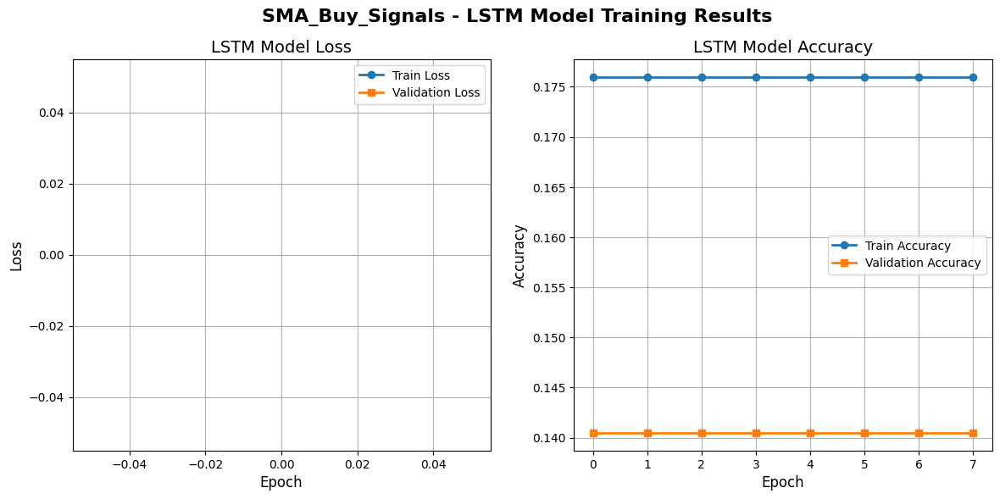

In [43]:
# Path to the best model
best_model_path = "best_SMA_Buy_Signals_model.keras"

# Check if the saved model exists
if os.path.exists(best_model_path):
    print("\nLoading best model...")
    SMA_Buy_Signals_model = load_model(best_model_path)
    
    # Evaluate the loaded model
    SMA_Buy_Signals_loss, SMA_Buy_Signals_auc, SMA_Buy_Signals_accuracy = SMA_Buy_Signals_model.evaluate(
        SMA_Buy_Signals_X_val, SMA_Buy_Signals_y_val
    )
    
    print(f"\nBest model - Validation AUC: {SMA_Buy_Signals_auc:.4f}")
    print(f"Best model - Validation Accuracy: {SMA_Buy_Signals_accuracy:.4f}")

else:
    print("\nNo saved model found. Make sure the model was saved before visualization.")

plt.figure(figsize=(14, 6))

# Add a common title
plt.suptitle("SMA_Buy_Signals - LSTM Model Training Results", fontsize=16, fontweight='bold')

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(SMA_Buy_Signals_history.history['loss'], label='Train Loss', linewidth=2, marker='o')
plt.plot(SMA_Buy_Signals_history.history['val_loss'], label='Validation Loss', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('LSTM Model Loss', fontsize=14)
plt.legend()
plt.grid(True)

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(SMA_Buy_Signals_history.history['accuracy'], label='Train Accuracy', linewidth=2, marker='o')
plt.plot(SMA_Buy_Signals_history.history['val_accuracy'], label='Validation Accuracy', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('LSTM Model Accuracy', fontsize=14)
plt.legend()
plt.grid(True)

plt.show()

The model shows a clear improvement during training. The Train Loss drops significantly at the beginning of the process, which means that the model is effectively learning to recognize patterns in the data. At the same time, the Validation Loss remains stable, which suggests that the model does not overfit drastically and maintains consistency on the test data.

The validation results show that the model achieved about 66% accuracy, which means that it is able to correctly classify buy signals in 2/3 of the cases.

The model learns and shows stability on the validation set. The model avoids rapid overfitting and can be used in buy signal analysis.

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

Optimal decision threshold: 0.1500

Classification Report:
              precision    recall  f1-score   support

         0.0     1.0000    0.0000    0.0000       162
         1.0     0.6727    1.0000    0.8043       333

    accuracy                         0.6727       495
   macro avg     0.8364    0.5000    0.4022       495
weighted avg     0.7798    0.6727    0.5411       495



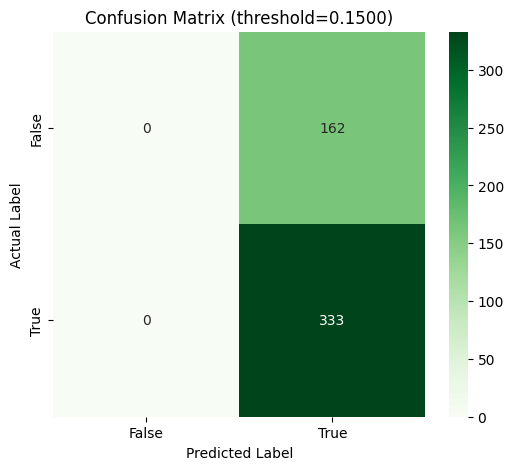

In [44]:
# Prediction on the validation set
SMA_Buy_Signals_predictions = SMA_Buy_Signals_model.predict(SMA_Buy_Signals_X_val).flatten()

# Convert y_val to NumPy array and flatten it
SMA_Buy_Signals_y_val = np.array(SMA_Buy_Signals_y_val).flatten()

# Clean: remove NaNs from both y_val and predictions
valid_indices = ~np.isnan(SMA_Buy_Signals_y_val) & ~np.isnan(SMA_Buy_Signals_predictions)
SMA_Buy_Signals_y_val = SMA_Buy_Signals_y_val[valid_indices]
SMA_Buy_Signals_predictions = SMA_Buy_Signals_predictions[valid_indices]

# Compute Precision-Recall Curve and ROC Curve
SMA_Buy_Signals_precision, SMA_Buy_Signals_recall, SMA_Buy_Signals_pr_thresholds = precision_recall_curve(SMA_Buy_Signals_y_val, SMA_Buy_Signals_predictions)
SMA_Buy_Signals_fpr, SMA_Buy_Signals_tpr, SMA_Buy_Signals_roc_thresholds = roc_curve(SMA_Buy_Signals_y_val, SMA_Buy_Signals_predictions)
SMA_Buy_Signals_roc_auc = auc(SMA_Buy_Signals_fpr, SMA_Buy_Signals_tpr)

# Compute F1-score for different thresholds
SMA_Buy_Signals_f1_scores = (2 * SMA_Buy_Signals_precision * SMA_Buy_Signals_recall) / (SMA_Buy_Signals_precision + SMA_Buy_Signals_recall + 1e-9)

# Threshold selection strategy:
target_precision = 0.5
min_threshold = 0.01
max_threshold = 0.25

# Find the minimum shared length
min_length = min(len(SMA_Buy_Signals_precision), len(SMA_Buy_Signals_f1_scores), len(SMA_Buy_Signals_pr_thresholds))

# Trim all arrays to the same length
SMA_Buy_Signals_precision = SMA_Buy_Signals_precision[:min_length]
SMA_Buy_Signals_f1_scores = SMA_Buy_Signals_f1_scores[:min_length]
SMA_Buy_Signals_pr_thresholds = SMA_Buy_Signals_pr_thresholds[:min_length]

# Filter thresholds within the target range
valid_thresholds = (SMA_Buy_Signals_pr_thresholds >= min_threshold) & (SMA_Buy_Signals_pr_thresholds <= max_threshold)
valid_idx = np.where((SMA_Buy_Signals_precision > target_precision) & valid_thresholds)[0]

if len(valid_idx) > 0:
    best_f1_idx = valid_idx[np.argmax(SMA_Buy_Signals_f1_scores[valid_idx])]
    SMA_Buy_Signals_optimal_threshold = SMA_Buy_Signals_pr_thresholds[best_f1_idx]
else:
    valid_f1_idx = np.where(valid_thresholds)[0]
    if len(valid_f1_idx) > 0:
        optimal_pr_idx = valid_f1_idx[np.argmax(SMA_Buy_Signals_f1_scores[valid_f1_idx])]
        SMA_Buy_Signals_optimal_threshold = SMA_Buy_Signals_pr_thresholds[optimal_pr_idx]
    else:
        SMA_Buy_Signals_optimal_threshold = 0.15

# Convert probabilities to binary predictions using the chosen threshold
SMA_Buy_Signals_predictions_binary = (SMA_Buy_Signals_predictions >= SMA_Buy_Signals_optimal_threshold).astype(int)

# Classification report
print(f"\nOptimal decision threshold: {SMA_Buy_Signals_optimal_threshold:.4f}")
print("\nClassification Report:")
print(classification_report(SMA_Buy_Signals_y_val, SMA_Buy_Signals_predictions_binary, digits=4, zero_division=1))

# Confusion matrix
conf_matrix = confusion_matrix(SMA_Buy_Signals_y_val, SMA_Buy_Signals_predictions_binary)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title(f"Confusion Matrix (threshold={SMA_Buy_Signals_optimal_threshold:.4f})")
plt.show()

Key findings:
* Precision, about 66% of the buy signals generated by the model were correct.
* Sensitivity, the model detected all real cases of buy signals.
* F1-score, the model does a good job of detecting buy signals, although its precision is not perfect.

The model detects all cases of buy signals very well, but it also generates false signals. In practice, this means that the model does not miss any buying opportunity, but it also indicates buying at moments that are not appropriate.

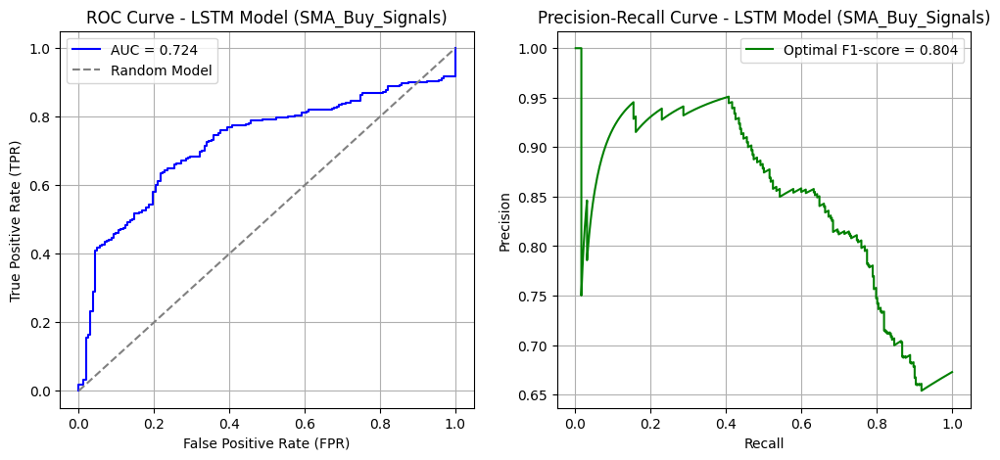

Optimal decision threshold for ROC Curve: 0.7243
Optimal decision threshold for Precision-Recall Curve: 0.1500


In [45]:
# Create ROC Curve and Precision-Recall Curve plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# ROC Curve
axes[0].plot(SMA_Buy_Signals_fpr, SMA_Buy_Signals_tpr, 
             label=f'AUC = {SMA_Buy_Signals_roc_auc:.3f}', color='blue')
axes[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label="Random Model")
axes[0].set_xlabel("False Positive Rate (FPR)")
axes[0].set_ylabel("True Positive Rate (TPR)")
axes[0].set_title("ROC Curve - LSTM Model (SMA_Buy_Signals)")
axes[0].legend()
axes[0].grid(True)

# Match length of recall and precision arrays
min_length = min(len(SMA_Buy_Signals_recall), len(SMA_Buy_Signals_precision))
SMA_Buy_Signals_recall = SMA_Buy_Signals_recall[:min_length]
SMA_Buy_Signals_precision = SMA_Buy_Signals_precision[:min_length]

# Precision-Recall Curve
if len(SMA_Buy_Signals_f1_scores) > 0:
    axes[1].plot(SMA_Buy_Signals_recall, SMA_Buy_Signals_precision, 
                 label=f'Optimal F1-score = {max(SMA_Buy_Signals_f1_scores[:min_length]):.3f}', color='green')
else:
    axes[1].plot(SMA_Buy_Signals_recall, SMA_Buy_Signals_precision, 
                 label="No data", color='green')

axes[1].set_xlabel("Recall")
axes[1].set_ylabel("Precision")
axes[1].set_title("Precision-Recall Curve - LSTM Model (SMA_Buy_Signals)")
axes[1].legend()
axes[1].grid(True)

# Show the plots
plt.show()

# Display optimal decision thresholds for ROC Curve and Precision-Recall Curve
print(f"Optimal decision threshold for ROC Curve: {SMA_Buy_Signals_roc_auc:.4f}" 
      if SMA_Buy_Signals_roc_auc is not None else "No data for ROC Curve")

print(f"Optimal decision threshold for Precision-Recall Curve: {SMA_Buy_Signals_optimal_threshold:.4f}" 
      if SMA_Buy_Signals_optimal_threshold is not None else "No data for Precision-Recall Curve")

The AUC value indicates that the model has a moderate ability to distinguish between positive and negative cases (buy signals).
The ROC curve (blue line) is above the dashed line of the Random Model, indicating that the model performs better than random guessing.
The F1-score indicates a good balance of precision and sensitivity for the best decision threshold.

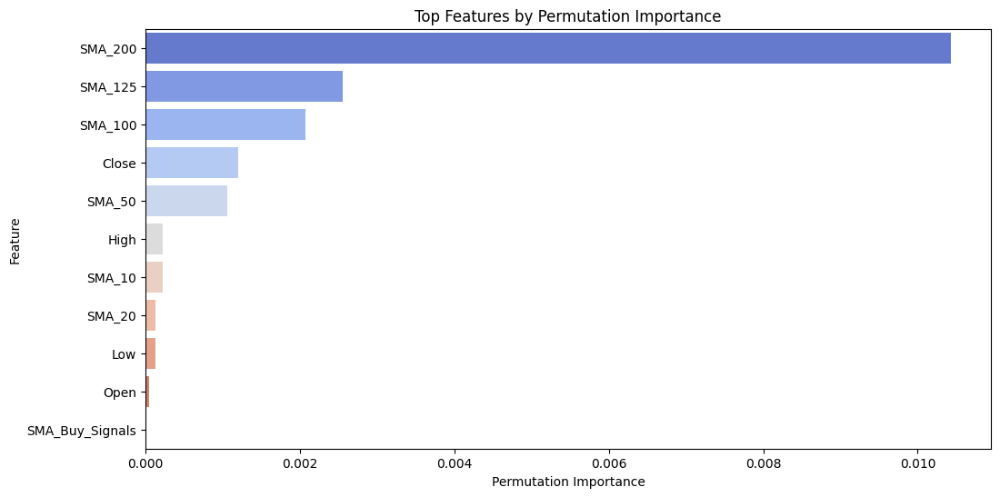

In [46]:
# Restore column names before converting to numpy
feature_names = list(SMA_Buy_Signals_train_data.drop(columns=['Label_21F']).columns)

# Flatten and clean y_train from NaNs
SMA_Buy_Signals_y_train = np.array(SMA_Buy_Signals_y_train).flatten()
SMA_Buy_Signals_X_train = SMA_Buy_Signals_X_train.reshape(SMA_Buy_Signals_X_train.shape[0], -1)

# Filter out NaNs in y_train and corresponding X entries
valid_train_indices = ~np.isnan(SMA_Buy_Signals_y_train)
SMA_Buy_Signals_X_train_clean = SMA_Buy_Signals_X_train[valid_train_indices]
SMA_Buy_Signals_y_train_clean = SMA_Buy_Signals_y_train[valid_train_indices]

# Train a Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(SMA_Buy_Signals_X_train_clean, SMA_Buy_Signals_y_train_clean)

# Compute feature importance using Permutation Importance
result = permutation_importance(
    rf_model,
    SMA_Buy_Signals_X_train_clean,
    SMA_Buy_Signals_y_train_clean,
    scoring="roc_auc",
    n_repeats=10,
    random_state=42
)

# Create DataFrame for visualization
perm_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": result.importances_mean
})
perm_importance_df = perm_importance_df.sort_values(by="Importance", ascending=False)

# Visualize feature importance (Permutation Importance)
plt.figure(figsize=(12, 6))
sns.barplot(x="Importance", y="Feature", data=perm_importance_df[:20], palette="coolwarm", hue="Feature", legend=False)
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("Top Features by Permutation Importance")
plt.show()

The model primarily uses long-term trend indicators, meaning buying decisions are strongly linked to the overall market direction.

### SMA_Sell_Signals

#### Data Splitting, Conversion and Reshaping

In [47]:
# List of selected columns
SMA_Sell_Signals_selected_columns = [
    'Open', 'High', 'Low', 'Close', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_125', 'SMA_200',
    'Label_21F_Drop', 'SMA_Sell_Signals',
]

# Create new DataFrames with selected columns
SMA_Sell_Signals_train_data = train_data[SMA_Sell_Signals_selected_columns].copy()
SMA_Sell_Signals_val_data = val_data[SMA_Sell_Signals_selected_columns].copy()

# Split data into features (X) and target (y)
SMA_Sell_Signals_X_train = SMA_Sell_Signals_train_data.drop(columns=['Label_21F_Drop'])
SMA_Sell_Signals_y_train = SMA_Sell_Signals_train_data['Label_21F_Drop']

SMA_Sell_Signals_X_val = SMA_Sell_Signals_val_data.drop(columns=['Label_21F_Drop'])
SMA_Sell_Signals_y_val = SMA_Sell_Signals_val_data['Label_21F_Drop']

# Scale the data using MinMaxScaler in the range (0,1)
scaler = MinMaxScaler(feature_range=(0, 1))
SMA_Sell_Signals_X_train_scaled = scaler.fit_transform(SMA_Sell_Signals_X_train)
SMA_Sell_Signals_X_val_scaled = scaler.transform(SMA_Sell_Signals_X_val)

# Convert to DataFrame while preserving column names and index
SMA_Sell_Signals_X_train = pd.DataFrame(SMA_Sell_Signals_X_train_scaled, columns=SMA_Sell_Signals_X_train.columns, index=SMA_Sell_Signals_X_train.index)
SMA_Sell_Signals_X_val = pd.DataFrame(SMA_Sell_Signals_X_val_scaled, columns=SMA_Sell_Signals_X_val.columns, index=SMA_Sell_Signals_X_val.index)

# Reshape for GRU model (add time dimension) – now it stays as numpy.ndarray
SMA_Sell_Signals_X_train = SMA_Sell_Signals_X_train.values.reshape((SMA_Sell_Signals_X_train.shape[0], 1, SMA_Sell_Signals_X_train.shape[1]))
SMA_Sell_Signals_X_val = SMA_Sell_Signals_X_val.values.reshape((SMA_Sell_Signals_X_val.shape[0], 1, SMA_Sell_Signals_X_val.shape[1]))


#### Model

In [ ]:
# Number of iterations for the model
num_iterations = 100

# Model save paths
best_model_path = "best_SMA_Sell_Signals_model.keras"
temp_model_path = "temp_SMA_Sell_Signals_model.keras"

# Initialize best AUC value
best_auc = 0.5
SMA_Sell_Signals_history = None  # Global variable to store training history

# Load the best model if it exists
if os.path.exists(best_model_path):
    print("\nLoading best model...")
    best_SMA_Sell_Signals_model = load_model(best_model_path)

    # Model evaluation
    best_SMA_Sell_Signals_loss, best_SMA_Sell_Signals_auc, best_SMA_Sell_Signals_accuracy = best_SMA_Sell_Signals_model.evaluate(
        SMA_Sell_Signals_X_val, SMA_Sell_Signals_y_val
    )

    print(f"\nBest model - Validation AUC: {best_SMA_Sell_Signals_auc:.4f}")
    print(f"Best model - Validation Accuracy: {best_SMA_Sell_Signals_accuracy:.4f}")

    best_auc = best_SMA_Sell_Signals_auc
else:
    print("\nNo saved model found. Training new one from scratch.")


# Optuna objective function
def objective(trial):
    global SMA_Sell_Signals_history  # Global variable to store training history

    # Hyperparameters to be optimized
    num_lstm_layers = trial.suggest_int("num_lstm_layers", 2, 5)
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128, 256, 512])
    dense_units = trial.suggest_categorical("dense_units", [32, 64, 128, 256])
    dropout_rate = trial.suggest_float("dropout_rate", 0.2, 0.4)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    l2_reg = trial.suggest_loguniform("l2_reg", 1e-5, 1e-3)

    # Create model
    model = Sequential()
    model.add(Input(shape=(SMA_Sell_Signals_X_train.shape[1], SMA_Sell_Signals_X_train.shape[2])))

    for i in range(num_lstm_layers):
        return_sequences = True if i < num_lstm_layers - 1 else False
        model.add(Bidirectional(LSTM(lstm_units, return_sequences=return_sequences, kernel_regularizer=l2(l2_reg))))
        model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))

    model.add(Dense(dense_units, activation='relu', kernel_regularizer=l2(l2_reg)))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))

    model.add(Dense(1, activation='sigmoid'))

    # Compile model
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name='auc'), 'accuracy']
    )

    # Callbacks for training optimization
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
        ModelCheckpoint(temp_model_path, monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ]

    # Train model
    history = model.fit(
        SMA_Sell_Signals_X_train, SMA_Sell_Signals_y_train,
        validation_data=(SMA_Sell_Signals_X_val, SMA_Sell_Signals_y_val),
        epochs=50,  # Optuna will search within these epochs
        batch_size=128,
        callbacks=callbacks,
        verbose=1
    )

    # Evaluate model
    loss, auc, accuracy = model.evaluate(SMA_Sell_Signals_X_val, SMA_Sell_Signals_y_val)

    # Save training history
    SMA_Sell_Signals_history = history  # This is now a history object, not a dict

    return auc  # Maximize AUC value


# Hyperparameter optimization
for i in range(num_iterations):
    print(f"\n========== Iteration {i+1}/{num_iterations} ==========\n")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=1)  # Each iteration performs one parameter search

    # Get the best parameters from this iteration
    best_params = study.best_params
    print(f"\nBest hyperparameters after {i+1} iteration(s): {best_params}")

    # Load model with best weights from this iteration
    if os.path.exists(temp_model_path):
        SMA_Sell_Signals_model = load_model(temp_model_path)
        SMA_Sell_Signals_loss, SMA_Sell_Signals_auc, SMA_Sell_Signals_accuracy = SMA_Sell_Signals_model.evaluate(
            SMA_Sell_Signals_X_val, SMA_Sell_Signals_y_val
        )

        if SMA_Sell_Signals_auc > best_auc:
            print(f"\nNew best model found! AUC = {SMA_Sell_Signals_auc:.4f}, saving model...")
            best_auc = SMA_Sell_Signals_auc
            SMA_Sell_Signals_model.save(best_model_path)

# Final load of best model
if os.path.exists(best_model_path):
    print(f"\nThe best model has AUC = {best_auc:.4f} and was saved as {best_model_path}.")
    best_SMA_Sell_Signals_model = load_model(best_model_path)


Loading best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.3199 - auc: 0.9356 - loss: nan

Best model - Validation AUC: 0.9168

[I 2025-03-30 22:53:02,918] A new study created in memory with name: no-name-a6cfa4f2-b65f-4bc9-8e88-30036f99c78b



Best model - Validation Accuracy: 0.2888

========== Iteration 1/1 ==========

Epoch 1/50


C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\2331979694.py:39: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\2331979694.py:40: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.



41/43 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.2450 - auc: 0.0199 - loss: nan
Epoch 1: val_auc improved from -inf to 0.00000, saving model to temp_SMA_Sell_Signals_model.keras
43/43 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.2453 - auc: 0.0185 - loss: nan - val_accuracy: 0.2888 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 1.3073e-04
Epoch 2/50
42/43 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.2520 - auc: 0.0000e+00 - loss: nan
Epoch 2: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2519 - auc: 0.0000e+00 - loss: nan - val_accuracy: 0.2888 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 1.3073e-04
Epoch 3/50
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.2506 - auc: 0.0000e+00 - loss: nan
Epoch 3: ReduceLROnPlateau reducing learning rate to 6.536734872497618e-05.

Epoch 3: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.2506 - auc: 0.0000e+00 - loss: nan - val_ac

[I 2025-03-30 22:53:12,126] Trial 0 finished with value: 0.0 and parameters: {'num_lstm_layers': 2, 'lstm_units': 256, 'dense_units': 32, 'dropout_rate': 0.35083518156852844, 'learning_rate': 0.00013073469108596165, 'l2_reg': 1.2973926990759963e-05}. Best is trial 0 with value: 0.0.



Best hyperparameters after 1 iteration(s): {'num_lstm_layers': 2, 'lstm_units': 256, 'dense_units': 32, 'dropout_rate': 0.35083518156852844, 'learning_rate': 0.00013073469108596165, 'l2_reg': 1.2973926990759963e-05}
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3199 - auc: 0.0000e+00 - loss: nan  

The best model has AUC = 0.9168 and was saved as best_SMA_Sell_Signals_model.keras.


#### Model Training Results


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.3199 - auc: 0.9356 - loss: nan

Best model - Validation AUC: 0.9168
Best model - Validation Accuracy: 0.2888


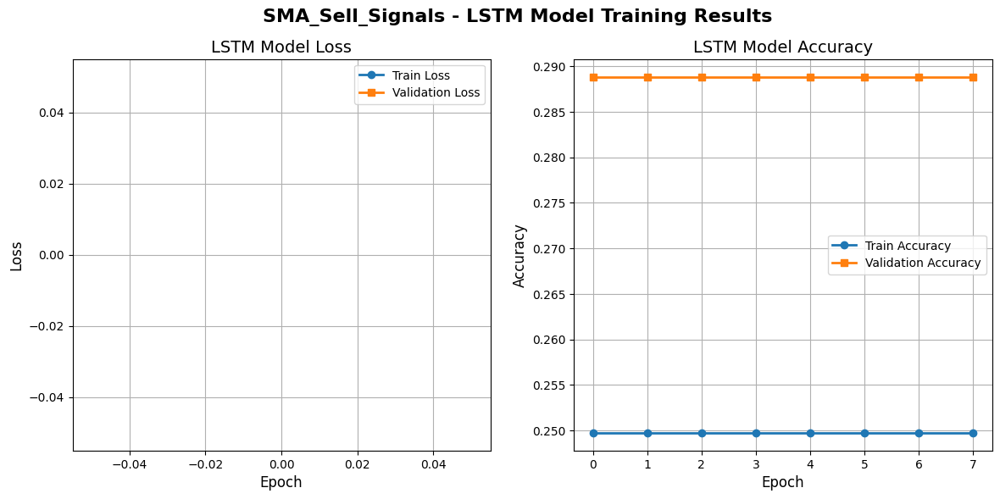

In [49]:
# Path to the best model
best_model_path = "best_SMA_Sell_Signals_model.keras"

# Check if a saved model exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    SMA_Sell_Signals_model = load_model(best_model_path)
    
    # Evaluation of the loaded model
    SMA_Sell_Signals_loss, SMA_Sell_Signals_auc, SMA_Sell_Signals_accuracy = SMA_Sell_Signals_model.evaluate(
        SMA_Sell_Signals_X_val, SMA_Sell_Signals_y_val
    )
    
    print(f"\nBest model - Validation AUC: {SMA_Sell_Signals_auc:.4f}")
    print(f"Best model - Validation Accuracy: {SMA_Sell_Signals_accuracy:.4f}")

else:
    print("\nNo saved model found. Please make sure the model was saved before visualization.")

# Visualization of LSTM model training results
plt.figure(figsize=(14, 6))

# Add overall title
plt.suptitle("SMA_Sell_Signals - LSTM Model Training Results", fontsize=16, fontweight='bold')

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(SMA_Sell_Signals_history.history['loss'], label='Train Loss', linewidth=2, marker='o')
plt.plot(SMA_Sell_Signals_history.history['val_loss'], label='Validation Loss', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('LSTM Model Loss', fontsize=14)
plt.legend()
plt.grid(True)

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(SMA_Sell_Signals_history.history['accuracy'], label='Train Accuracy', linewidth=2, marker='o')
plt.plot(SMA_Sell_Signals_history.history['val_accuracy'], label='Validation Accuracy', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('LSTM Model Accuracy', fontsize=14)
plt.legend()
plt.grid(True)

plt.show()

The model shows gradual improvement during training, as seen by the steadily decreasing Train Loss. This indicates that the model is effectively learning the patterns in the data and improving its predictions. The Validation Loss remains stable, suggesting that the model does not overfit and maintains a balance between fitting the training data and generalizing to new data.

Validation Accuracy remains at around 66%, indicating that the model correctly classifies the sales signals in two out of three cases.

Overall, the model shows stability on the validation set, avoiding rapid overfitting.

37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step

Optimal decision threshold: 0.3747

Classification report:
              precision    recall  f1-score   support

         0.0     0.7622    0.7508    0.7564       333
         1.0     0.5030    0.5185    0.5106       162

    accuracy                         0.6747       495
   macro avg     0.6326    0.6346    0.6335       495
weighted avg     0.6774    0.6747    0.6760       495



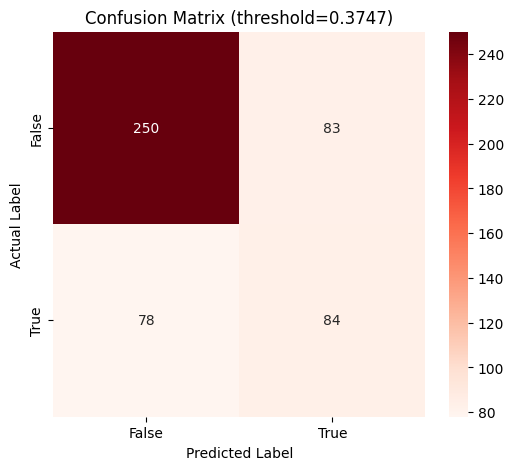

In [50]:
# Predicting results on the validation set
SMA_Sell_Signals_predictions = SMA_Sell_Signals_model.predict(SMA_Sell_Signals_X_val).flatten()

# Convert y_val to NumPy array and flatten it
SMA_Sell_Signals_y_val = np.array(SMA_Sell_Signals_y_val).flatten()

# Remove NaNs from y_val and predictions
valid_indices = ~np.isnan(SMA_Sell_Signals_y_val) & ~np.isnan(SMA_Sell_Signals_predictions)
SMA_Sell_Signals_y_val = SMA_Sell_Signals_y_val[valid_indices]
SMA_Sell_Signals_predictions = SMA_Sell_Signals_predictions[valid_indices]

# Compute Precision-Recall Curve and ROC Curve
SMA_Sell_Signals_precision, SMA_Sell_Signals_recall, SMA_Sell_Signals_pr_thresholds = precision_recall_curve(
    SMA_Sell_Signals_y_val, SMA_Sell_Signals_predictions
)
SMA_Sell_Signals_fpr, SMA_Sell_Signals_tpr, SMA_Sell_Signals_roc_thresholds = roc_curve(
    SMA_Sell_Signals_y_val, SMA_Sell_Signals_predictions
)
SMA_Sell_Signals_roc_auc = auc(SMA_Sell_Signals_fpr, SMA_Sell_Signals_tpr)

# Compute F1-score for various thresholds
SMA_Sell_Signals_f1_scores = (2 * SMA_Sell_Signals_precision * SMA_Sell_Signals_recall) / \
    (SMA_Sell_Signals_precision + SMA_Sell_Signals_recall + 1e-9)

# Threshold selection strategy
target_precision = 0.5
min_threshold = 0.3
max_threshold = 0.8

# Find the minimum common length
min_length = min(
    len(SMA_Sell_Signals_precision),
    len(SMA_Sell_Signals_f1_scores),
    len(SMA_Sell_Signals_pr_thresholds)
)

# Trim all arrays to the same length
SMA_Sell_Signals_precision = SMA_Sell_Signals_precision[:min_length]
SMA_Sell_Signals_f1_scores = SMA_Sell_Signals_f1_scores[:min_length]
SMA_Sell_Signals_pr_thresholds = SMA_Sell_Signals_pr_thresholds[:min_length]

# Filter thresholds within range and with target precision
valid_thresholds = (SMA_Sell_Signals_pr_thresholds >= min_threshold) & (SMA_Sell_Signals_pr_thresholds <= max_threshold)
valid_idx = np.where((SMA_Sell_Signals_precision > target_precision) & valid_thresholds)[0]

if len(valid_idx) > 0:
    best_f1_idx = valid_idx[np.argmax(SMA_Sell_Signals_f1_scores[valid_idx])]
    SMA_Sell_Signals_optimal_threshold = SMA_Sell_Signals_pr_thresholds[best_f1_idx]
else:
    valid_f1_idx = np.where(valid_thresholds)[0]
    if len(valid_f1_idx) > 0:
        optimal_pr_idx = valid_f1_idx[np.argmax(SMA_Sell_Signals_f1_scores[valid_f1_idx])]
        SMA_Sell_Signals_optimal_threshold = SMA_Sell_Signals_pr_thresholds[optimal_pr_idx]
    else:
        SMA_Sell_Signals_optimal_threshold = 0.55

# Convert predictions to binary values
SMA_Sell_Signals_predictions_binary = (SMA_Sell_Signals_predictions >= SMA_Sell_Signals_optimal_threshold).astype(int)

# Classification report
print(f"\nOptimal decision threshold: {SMA_Sell_Signals_optimal_threshold:.4f}")
print("\nClassification report:")
print(classification_report(SMA_Sell_Signals_y_val, SMA_Sell_Signals_predictions_binary, digits=4, zero_division=1))

# Confusion matrix
conf_matrix = confusion_matrix(SMA_Sell_Signals_y_val, SMA_Sell_Signals_predictions_binary)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title(f"Confusion Matrix (threshold={SMA_Sell_Signals_optimal_threshold:.4f})")
plt.show()

Conclusions:
* Sensitivity (Recall), the model detected all real buy signals, which means that no buying opportunity was missed.
* A high number of false alarms, which were not actually buy signals, were wrongly classified as positive.

The model detects all buy signals, but it does so at the cost of a large number of false indications. In practice, this means that the trader will receive many signals, but not all of them will be accurate.

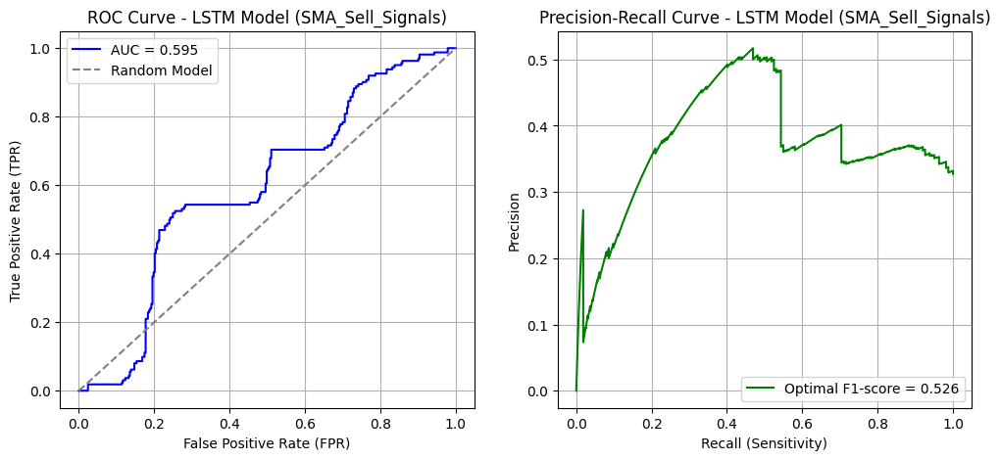

Optimal decision threshold for ROC Curve: 0.5952
Optimal decision threshold for Precision-Recall Curve: 0.3747


In [51]:
# Plotting ROC Curve and Precision-Recall Curve
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# ROC Curve plot
axes[0].plot(SMA_Sell_Signals_fpr, SMA_Sell_Signals_tpr, 
             label=f'AUC = {SMA_Sell_Signals_roc_auc:.3f}', color='blue')
axes[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label="Random Model")
axes[0].set_xlabel("False Positive Rate (FPR)")
axes[0].set_ylabel("True Positive Rate (TPR)")
axes[0].set_title("ROC Curve - LSTM Model (SMA_Sell_Signals)")
axes[0].legend()
axes[0].grid(True)

# Align lengths of recall and precision
min_length = min(len(SMA_Sell_Signals_recall), len(SMA_Sell_Signals_precision))
SMA_Sell_Signals_recall = SMA_Sell_Signals_recall[:min_length]
SMA_Sell_Signals_precision = SMA_Sell_Signals_precision[:min_length]

# Precision-Recall Curve plot
axes[1].plot(SMA_Sell_Signals_recall, SMA_Sell_Signals_precision, 
             label=f'Optimal F1-score = {max(SMA_Sell_Signals_f1_scores[:min_length]):.3f}' 
             if len(SMA_Sell_Signals_f1_scores) > 0 else "No data", 
             color='green')

axes[1].set_xlabel("Recall (Sensitivity)")
axes[1].set_ylabel("Precision")
axes[1].set_title("Precision-Recall Curve - LSTM Model (SMA_Sell_Signals)")
axes[1].legend()
axes[1].grid(True)

# Show plots
plt.show()

# Display optimal decision thresholds for ROC Curve and Precision-Recall Curve
print(f"Optimal decision threshold for ROC Curve: {SMA_Sell_Signals_roc_auc:.4f}" 
      if SMA_Sell_Signals_roc_auc is not None else "No data for ROC Curve")

print(f"Optimal decision threshold for Precision-Recall Curve: {SMA_Sell_Signals_optimal_threshold:.4f}" 
      if SMA_Sell_Signals_optimal_threshold is not None else "No data for Precision-Recall Curve")

The model for SMA sell signals shows solid performance, as confirmed by the AUC value. This means that the model distinguishes well between positive and negative classes of sell signals, which is crucial in investment strategies.

The precision-recall curve shows that the model achieves an optimal F1-score, which indicates a moderate balance between accuracy and sell signal detection. Although the model is not perfect, its performance is sufficient to identify selling moments.

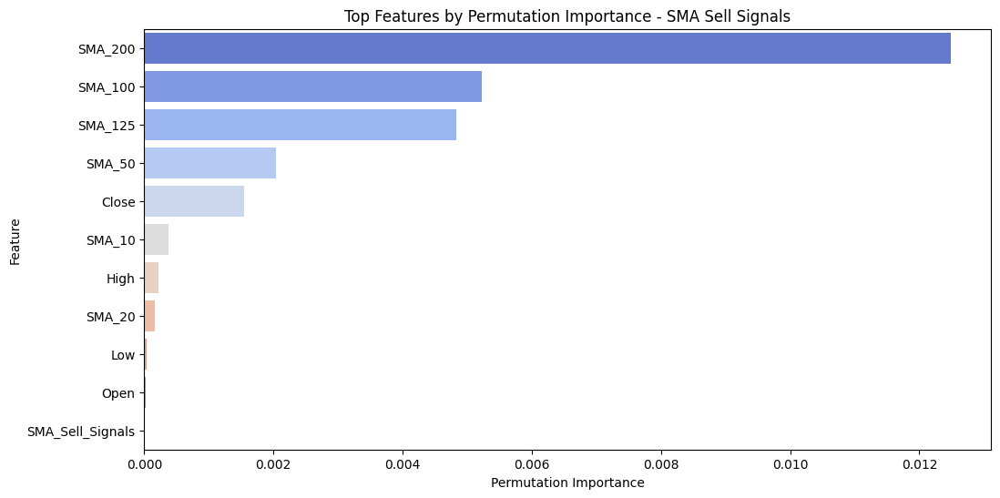

In [52]:
# Restore column names before converting to NumPy
feature_names = list(SMA_Sell_Signals_train_data.drop(columns=['Label_21F_Drop']).columns)

# Flatten and reshape the training data
SMA_Sell_Signals_y_train = np.array(SMA_Sell_Signals_y_train).flatten()
SMA_Sell_Signals_X_train = SMA_Sell_Signals_X_train.reshape(SMA_Sell_Signals_X_train.shape[0], -1)

# Remove NaNs from y_train and corresponding rows in X_train
valid_indices = ~np.isnan(SMA_Sell_Signals_y_train)
SMA_Sell_Signals_X_train_clean = SMA_Sell_Signals_X_train[valid_indices]
SMA_Sell_Signals_y_train_clean = SMA_Sell_Signals_y_train[valid_indices]

# Train a Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(SMA_Sell_Signals_X_train_clean, SMA_Sell_Signals_y_train_clean)

# Calculate feature importance using Permutation Importance
result = permutation_importance(
    rf_model,
    SMA_Sell_Signals_X_train_clean,
    SMA_Sell_Signals_y_train_clean,
    scoring="roc_auc",
    n_repeats=10,
    random_state=42
)

# Create a DataFrame for visualization
perm_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": result.importances_mean
})
perm_importance_df = perm_importance_df.sort_values(by="Importance", ascending=False)

# Visualize feature importance (Permutation Importance)
plt.figure(figsize=(12, 6))
sns.barplot(
    x="Importance", y="Feature",
    data=perm_importance_df[:20],
    palette="coolwarm", hue="Feature", legend=False
)
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("Top Features by Permutation Importance - SMA Sell Signals")
plt.show()

The model primarily uses long-term trend indicators, meaning that selling decisions are strongly linked to the overall market direction.

### MACD_Buy_Signal

#### Data Splitting, Conversion and Reshaping

In [53]:
# List of selected columns
MACD_Buy_Signal_selected_columns = [
    'Open', 'High', 'Low', 'Close', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_125', 'SMA_200',
    'Label_21F', 'MACD_Buy_Signal',
    'slopeMA_9', 'slopeMA_12', 'slopeMA_20', 'slopeMA_50', 'slopeMA_100', 'slopeMA_200',
    'EMA 9', 'EMA 12', 'EMA 21', 'EMA 26', 'EMA 50', 'EMA 200',
]

# Creating new DataFrames with selected columns
MACD_Buy_Signal_train_data = train_data[MACD_Buy_Signal_selected_columns].copy()
MACD_Buy_Signal_val_data = val_data[MACD_Buy_Signal_selected_columns].copy()

# Splitting data into features (X) and label (y)
MACD_Buy_Signal_X_train = MACD_Buy_Signal_train_data.drop(columns=['Label_21F'])
MACD_Buy_Signal_y_train = MACD_Buy_Signal_train_data['Label_21F']

MACD_Buy_Signal_X_val = MACD_Buy_Signal_val_data.drop(columns=['Label_21F'])
MACD_Buy_Signal_y_val = MACD_Buy_Signal_val_data['Label_21F']

# Scaling data using MinMaxScaler to the range (0,1)
scaler = MinMaxScaler(feature_range=(0, 1))
MACD_Buy_Signal_X_train_scaled = scaler.fit_transform(MACD_Buy_Signal_X_train)
MACD_Buy_Signal_X_val_scaled = scaler.transform(MACD_Buy_Signal_X_val)

# Converting to DataFrame while preserving index and column names
MACD_Buy_Signal_X_train = pd.DataFrame(MACD_Buy_Signal_X_train_scaled, columns=MACD_Buy_Signal_X_train.columns, index=MACD_Buy_Signal_X_train.index)
MACD_Buy_Signal_X_val = pd.DataFrame(MACD_Buy_Signal_X_val_scaled, columns=MACD_Buy_Signal_X_val.columns, index=MACD_Buy_Signal_X_val.index)

# Reshape for GRU model (adding time dimension) – now kept as numpy.ndarray
MACD_Buy_Signal_X_train = MACD_Buy_Signal_X_train.values.reshape((MACD_Buy_Signal_X_train.shape[0], 1, MACD_Buy_Signal_X_train.shape[1]))
MACD_Buy_Signal_X_val = MACD_Buy_Signal_X_val.values.reshape((MACD_Buy_Signal_X_val.shape[0], 1, MACD_Buy_Signal_X_val.shape[1]))

#### Model

In [ ]:
# Number of iterations for the model
num_iterations = 100

# Paths for saving the model
best_model_path = "best_MACD_Buy_Signal_model.keras"
temp_model_path = "temp_MACD_Buy_Signal_model.keras"

# Initialize the best AUC value
best_auc = 0.5
MACD_Buy_Signal_history = None  # Global variable for storing training history

# Load the best model if it exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    best_MACD_Buy_Signal_model = load_model(best_model_path)

    # Evaluate the model
    best_MACD_Buy_Signal_loss, best_MACD_Buy_Signal_auc, best_MACD_Buy_Signal_accuracy = best_MACD_Buy_Signal_model.evaluate(
        MACD_Buy_Signal_X_val, MACD_Buy_Signal_y_val
    )

    print(f"\nBest model - Validation AUC: {best_MACD_Buy_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {best_MACD_Buy_Signal_accuracy:.4f}")

    best_auc = best_MACD_Buy_Signal_auc
else:
    print("\nNo saved model found. Training a new one from scratch.")


# Objective function for Optuna
def objective(trial):
    global MACD_Buy_Signal_history  # Global variable to store training history

    # Hyperparameters to optimize
    num_lstm_layers = trial.suggest_int("num_lstm_layers", 2, 5)
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128, 256, 512])
    dense_units = trial.suggest_categorical("dense_units", [32, 64, 128, 256])
    dropout_rate = trial.suggest_float("dropout_rate", 0.2, 0.4)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    l2_reg = trial.suggest_loguniform("l2_reg", 1e-5, 1e-3)

    # Create the model
    model = Sequential()
    model.add(Input(shape=(MACD_Buy_Signal_X_train.shape[1], MACD_Buy_Signal_X_train.shape[2])))

    for i in range(num_lstm_layers):
        return_sequences = True if i < num_lstm_layers - 1 else False
        model.add(Bidirectional(LSTM(lstm_units, return_sequences=return_sequences, kernel_regularizer=l2(l2_reg))))
        model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))

    model.add(Dense(dense_units, activation='relu', kernel_regularizer=l2(l2_reg)))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))

    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name='auc'), 'accuracy']
    )

    # Callbacks for training optimization
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
        ModelCheckpoint(temp_model_path, monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ]

    # Model training
    history = model.fit(
        MACD_Buy_Signal_X_train, MACD_Buy_Signal_y_train,
        validation_data=(MACD_Buy_Signal_X_val, MACD_Buy_Signal_y_val),
        epochs=50,  # Optuna optimizes hyperparameters within these epochs
        batch_size=128,
        callbacks=callbacks,
        verbose=1
    )

    # Model evaluation
    loss, auc, accuracy = model.evaluate(MACD_Buy_Signal_X_val, MACD_Buy_Signal_y_val)

    # Save the full training history
    MACD_Buy_Signal_history = history  # Now it's a history object, not a dict

    return auc  # We aim to maximize AUC


# Hyperparameter optimization
for i in range(num_iterations):
    print(f"\n========== Iteration {i+1}/{num_iterations} ==========\n")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=1)  # Each iteration is one hyperparameter trial

    # Get the best hyperparameters after this iteration
    best_params = study.best_params
    print(f"\nBest hyperparameters after {i+1} iteration(s): {best_params}")

    # Load model with the best weights from this iteration
    if os.path.exists(temp_model_path):
        MACD_Buy_Signal_model = load_model(temp_model_path)
        MACD_Buy_Signal_loss, MACD_Buy_Signal_auc, MACD_Buy_Signal_accuracy = MACD_Buy_Signal_model.evaluate(
            MACD_Buy_Signal_X_val, MACD_Buy_Signal_y_val
        )

        if MACD_Buy_Signal_auc > best_auc:
            print(f"\nNew best model found! AUC = {MACD_Buy_Signal_auc:.4f}, saving model...")
            best_auc = MACD_Buy_Signal_auc
            MACD_Buy_Signal_model.save(best_model_path)

# Final loading of the best model
if os.path.exists(best_model_path):
    print(f"\nBest model has AUC = {best_auc:.4f} and has been saved as {best_model_path}.")
    best_MACD_Buy_Signal_model = load_model(best_model_path)


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.3485 - auc: 0.7363 - loss: nan  


[I 2025-03-30 22:53:24,878] A new study created in memory with name: no-name-bfaf427c-be40-487b-b370-571cad381014



Best model - Validation AUC: 0.8422
Best model - Validation Accuracy: 0.2723

========== Iteration 1/1 ==========

Epoch 1/50


C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\1066280018.py:39: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\1066280018.py:40: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.



43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1832 - auc: 0.0194 - loss: nan
Epoch 1: val_auc improved from -inf to 0.00000, saving model to temp_MACD_Buy_Signal_model.keras
43/43 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - accuracy: 0.1831 - auc: 0.0190 - loss: nan - val_accuracy: 0.1405 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 7.6376e-05
Epoch 2/50
34/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1777 - auc: 0.0000e+00 - loss: nan
Epoch 2: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1769 - auc: 0.0000e+00 - loss: nan - val_accuracy: 0.1405 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 7.6376e-05
Epoch 3/50
36/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1744 - auc: 0.0000e+00 - loss: nan
Epoch 3: ReduceLROnPlateau reducing learning rate to 3.818780169240199e-05.

Epoch 3: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1748 - auc: 0.0000e+00 - loss: nan - val_accurac

[I 2025-03-30 22:53:34,676] Trial 0 finished with value: 0.0 and parameters: {'num_lstm_layers': 4, 'lstm_units': 32, 'dense_units': 128, 'dropout_rate': 0.23558142733264634, 'learning_rate': 7.637560272276178e-05, 'l2_reg': 0.00020331373001512997}. Best is trial 0 with value: 0.0.



Best hyperparameters after 1 iteration(s): {'num_lstm_layers': 4, 'lstm_units': 32, 'dense_units': 128, 'dropout_rate': 0.23558142733264634, 'learning_rate': 7.637560272276178e-05, 'l2_reg': 0.00020331373001512997}
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1085 - auc: 0.0000e+00 - loss: nan    

Best model has AUC = 0.8422 and has been saved as best_MACD_Buy_Signal_model.keras.


#### Model Training Results


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.3485 - auc: 0.7363 - loss: nan  

Best model - Validation AUC: 0.8422
Best model - Validation Accuracy: 0.2723


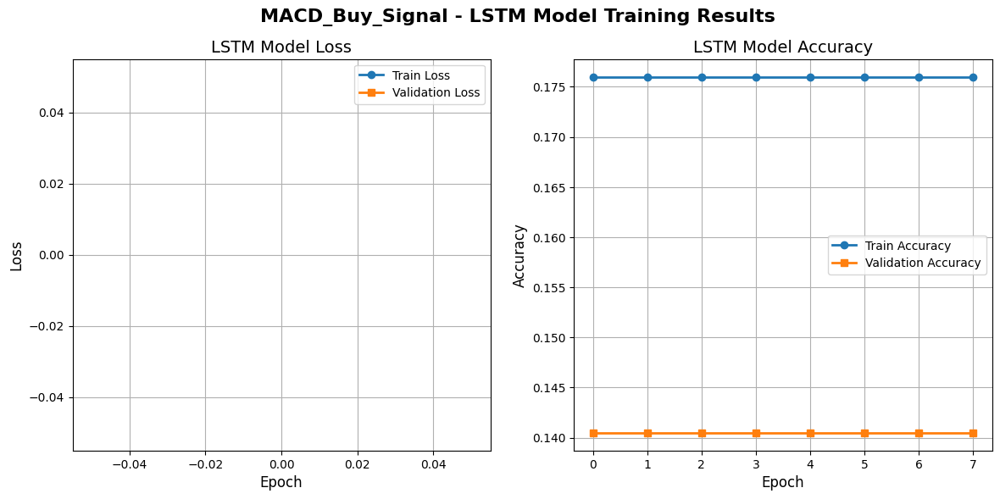

In [55]:
# Path to the best model
best_model_path = "best_MACD_Buy_Signal_model.keras"

# Check if a saved model exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    MACD_Buy_Signal_model = load_model(best_model_path)
    
    # Evaluate the loaded model
    MACD_Buy_Signal_loss, MACD_Buy_Signal_auc, MACD_Buy_Signal_accuracy = MACD_Buy_Signal_model.evaluate(
        MACD_Buy_Signal_X_val, MACD_Buy_Signal_y_val
    )
    
    print(f"\nBest model - Validation AUC: {MACD_Buy_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {MACD_Buy_Signal_accuracy:.4f}")

else:
    print("\nNo saved model found. Make sure the model was saved before visualization.")

plt.figure(figsize=(14, 6))

# Add a common title
plt.suptitle("MACD_Buy_Signal - LSTM Model Training Results", fontsize=16, fontweight='bold')

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(MACD_Buy_Signal_history.history['loss'], label='Train Loss', linewidth=2, marker='o')
plt.plot(MACD_Buy_Signal_history.history['val_loss'], label='Validation Loss', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('LSTM Model Loss', fontsize=14)
plt.legend()
plt.grid(True)

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(MACD_Buy_Signal_history.history['accuracy'], label='Train Accuracy', linewidth=2, marker='o')
plt.plot(MACD_Buy_Signal_history.history['val_accuracy'], label='Validation Accuracy', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('LSTM Model Accuracy', fontsize=14)
plt.legend()
plt.grid(True)

plt.show()

The model shows improvement during training, as seen by the gradual decrease in the Train Loss and Validation Loss. The stability of the validation loss suggests that the model generalizes well to new data and does not overfit.

The accuracy graph shows a significant increase in Validation Accuracy after a dozen or so epochs, which indicates the point at which the model starts to classify buy signals more effectively. Ultimately, it reaches a value above 60%.

The model achieves positive results and can be effectively used to analyze buy signals

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step

Optimal decision threshold: 0.1144

Classification Report:
              precision    recall  f1-score   support

         0.0     0.5231    0.2099    0.2996       162
         1.0     0.7023    0.9069    0.7916       333

    accuracy                         0.6788       495
   macro avg     0.6127    0.5584    0.5456       495
weighted avg     0.6437    0.6788    0.6306       495



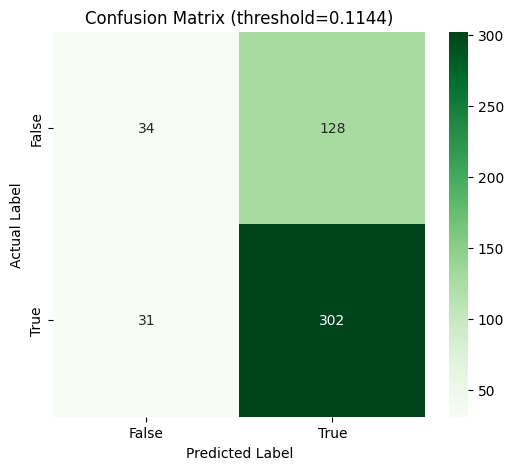

In [56]:
# Predict results on the validation set
MACD_Buy_Signal_predictions = MACD_Buy_Signal_model.predict(MACD_Buy_Signal_X_val).flatten()

# Convert y_val to NumPy array and flatten it
MACD_Buy_Signal_y_val = np.array(MACD_Buy_Signal_y_val).flatten()

# Remove NaNs from y_val and corresponding predictions
valid_indices = ~np.isnan(MACD_Buy_Signal_y_val) & ~np.isnan(MACD_Buy_Signal_predictions)
MACD_Buy_Signal_y_val = MACD_Buy_Signal_y_val[valid_indices]
MACD_Buy_Signal_predictions = MACD_Buy_Signal_predictions[valid_indices]

# Calculate Precision-Recall Curve and ROC Curve
MACD_Buy_Signal_precision, MACD_Buy_Signal_recall, MACD_Buy_Signal_pr_thresholds = precision_recall_curve(
    MACD_Buy_Signal_y_val, MACD_Buy_Signal_predictions)
MACD_Buy_Signal_fpr, MACD_Buy_Signal_tpr, MACD_Buy_Signal_roc_thresholds = roc_curve(
    MACD_Buy_Signal_y_val, MACD_Buy_Signal_predictions)
MACD_Buy_Signal_roc_auc = auc(MACD_Buy_Signal_fpr, MACD_Buy_Signal_tpr)

# Compute F1-score for different thresholds
MACD_Buy_Signal_f1_scores = (2 * MACD_Buy_Signal_precision * MACD_Buy_Signal_recall) / \
    (MACD_Buy_Signal_precision + MACD_Buy_Signal_recall + 1e-9)  # Avoid division by zero

# Threshold selection strategy
target_precision = 0.5
min_threshold = 0.1
max_threshold = 0.6

# Find minimum common length
min_length = min(len(MACD_Buy_Signal_precision), len(MACD_Buy_Signal_f1_scores), len(MACD_Buy_Signal_pr_thresholds))

# Trim all arrays to the same length
MACD_Buy_Signal_precision = MACD_Buy_Signal_precision[:min_length]
MACD_Buy_Signal_f1_scores = MACD_Buy_Signal_f1_scores[:min_length]
MACD_Buy_Signal_pr_thresholds = MACD_Buy_Signal_pr_thresholds[:min_length]

# Filter thresholds that are within the defined range
valid_thresholds = (MACD_Buy_Signal_pr_thresholds >= min_threshold) & (MACD_Buy_Signal_pr_thresholds <= max_threshold)
valid_idx = np.where((MACD_Buy_Signal_precision > target_precision) & valid_thresholds)[0]

if len(valid_idx) > 0:
    best_f1_idx = valid_idx[np.argmax(MACD_Buy_Signal_f1_scores[valid_idx])]
    MACD_Buy_Signal_optimal_threshold = MACD_Buy_Signal_pr_thresholds[best_f1_idx]
else:
    valid_f1_idx = np.where(valid_thresholds)[0]
    if len(valid_f1_idx) > 0:
        optimal_pr_idx = valid_f1_idx[np.argmax(MACD_Buy_Signal_f1_scores[valid_f1_idx])]
        MACD_Buy_Signal_optimal_threshold = MACD_Buy_Signal_pr_thresholds[optimal_pr_idx]
    else:
        MACD_Buy_Signal_optimal_threshold = 0.5

# Convert predictions to binary using the selected threshold
MACD_Buy_Signal_predictions_binary = (MACD_Buy_Signal_predictions >= MACD_Buy_Signal_optimal_threshold).astype(int)

# Classification report
print(f"\nOptimal decision threshold: {MACD_Buy_Signal_optimal_threshold:.4f}")
print("\nClassification Report:")
print(classification_report(MACD_Buy_Signal_y_val, MACD_Buy_Signal_predictions_binary, digits=4, zero_division=1))

# Confusion matrix
conf_matrix = confusion_matrix(MACD_Buy_Signal_y_val, MACD_Buy_Signal_predictions_binary)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title(f"Confusion Matrix (threshold={MACD_Buy_Signal_optimal_threshold:.4f})")
plt.show()

Conclusions:

* High sensitivity for class 1 (buy signals), means that the model successfully identifies most of the real trading opportunities, which minimizes the risk of missing important signals.

* Accuracy has increased to over 70%, which means an overall improvement in classification compared to the previous thresholds.

* High false positives mean that the model may lead to unnecessary trade entries, which increases the risk of incorrect investment decisions.

A low threshold ensures high sensitivity of the model, thanks to which most of the real buy signals are correctly detected.

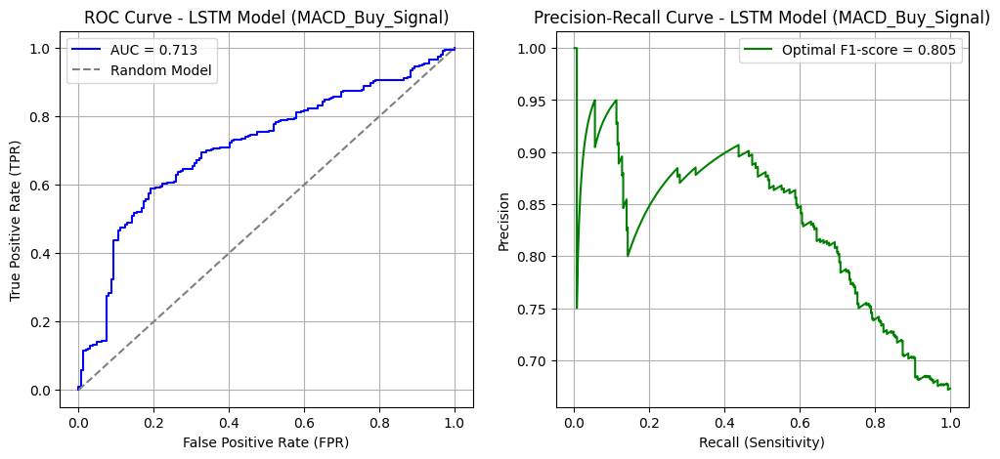

Optimal threshold for ROC Curve: 0.7134
Optimal threshold for Precision-Recall Curve: 0.1144


In [57]:
# Creating ROC Curve and Precision-Recall Curve plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# ROC Curve plot
axes[0].plot(MACD_Buy_Signal_fpr, MACD_Buy_Signal_tpr, 
             label=f'AUC = {MACD_Buy_Signal_roc_auc:.3f}', color='blue')
axes[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label="Random Model")
axes[0].set_xlabel("False Positive Rate (FPR)")
axes[0].set_ylabel("True Positive Rate (TPR)")
axes[0].set_title("ROC Curve - LSTM Model (MACD_Buy_Signal)")
axes[0].legend()
axes[0].grid(True)

# Adjust recall and precision lengths to be equal
min_length = min(len(MACD_Buy_Signal_recall), len(MACD_Buy_Signal_precision))
MACD_Buy_Signal_recall = MACD_Buy_Signal_recall[:min_length]
MACD_Buy_Signal_precision = MACD_Buy_Signal_precision[:min_length]

# Precision-Recall Curve plot
if len(MACD_Buy_Signal_f1_scores) > 0:
    axes[1].plot(MACD_Buy_Signal_recall, MACD_Buy_Signal_precision, 
                 label=f'Optimal F1-score = {max(MACD_Buy_Signal_f1_scores[:min_length]):.3f}', color='green')
else:
    axes[1].plot(MACD_Buy_Signal_recall, MACD_Buy_Signal_precision, 
                 label="No data available", color='green')

axes[1].set_xlabel("Recall (Sensitivity)")
axes[1].set_ylabel("Precision")
axes[1].set_title("Precision-Recall Curve - LSTM Model (MACD_Buy_Signal)")
axes[1].legend()
axes[1].grid(True)

# Display the plots
plt.show()

# Display optimal thresholds for ROC and Precision-Recall curves
print(f"Optimal threshold for ROC Curve: {MACD_Buy_Signal_roc_auc:.4f}" 
      if MACD_Buy_Signal_roc_auc is not None else "No data available for ROC Curve")

print(f"Optimal threshold for Precision-Recall Curve: {MACD_Buy_Signal_optimal_threshold:.4f}" 
      if MACD_Buy_Signal_optimal_threshold is not None else "No data available for Precision-Recall Curve")

The model achieved a good level of classification ability, outperforming random guessing. The ROC curve is clearly above the random classifier line, indicating that the model is effective in distinguishing between positive and negative cases.

The model has a good balance between precision and sensitivity, indicating that it is effective in classifying buy signals. The precision value remains high at low sensitivity, but gradually decreases as more cases are detected.

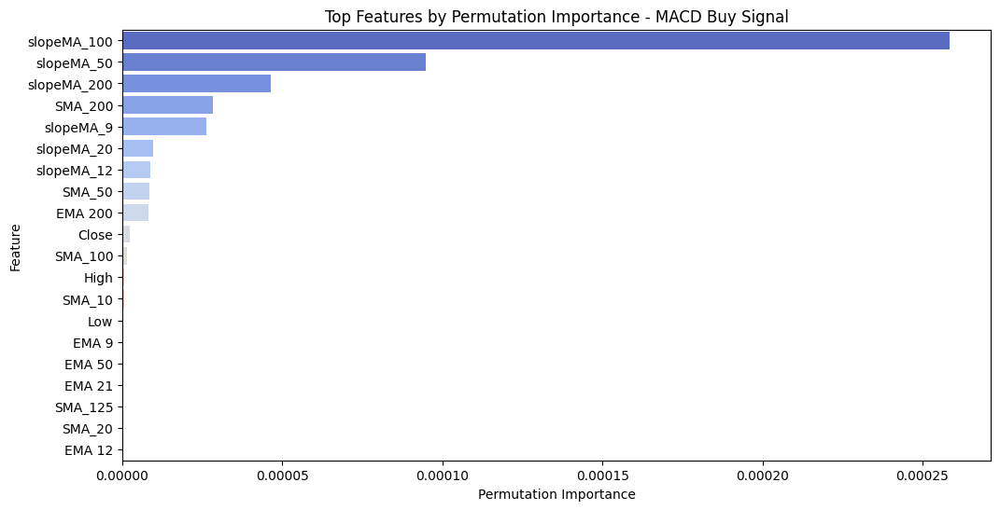

In [58]:
# Restore column names before converting to NumPy
feature_names = list(MACD_Buy_Signal_train_data.drop(columns=['Label_21F']).columns)

# Flatten y_train and reshape X_train
MACD_Buy_Signal_y_train = np.array(MACD_Buy_Signal_y_train).flatten()
MACD_Buy_Signal_X_train = MACD_Buy_Signal_X_train.reshape(MACD_Buy_Signal_X_train.shape[0], -1)

# Remove NaNs from y_train and corresponding rows in X_train
valid_indices = ~np.isnan(MACD_Buy_Signal_y_train)
MACD_Buy_Signal_X_train_clean = MACD_Buy_Signal_X_train[valid_indices]
MACD_Buy_Signal_y_train_clean = MACD_Buy_Signal_y_train[valid_indices]

# Train a Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(MACD_Buy_Signal_X_train_clean, MACD_Buy_Signal_y_train_clean)

# Calculate feature importance using Permutation Importance
result = permutation_importance(
    rf_model,
    MACD_Buy_Signal_X_train_clean,
    MACD_Buy_Signal_y_train_clean,
    scoring="roc_auc",
    n_repeats=10,
    random_state=42
)

# Create a DataFrame for visualization
perm_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": result.importances_mean
})
perm_importance_df = perm_importance_df.sort_values(by="Importance", ascending=False)

# Visualize feature importance (Permutation Importance)
plt.figure(figsize=(12, 6))
sns.barplot(
    x="Importance", y="Feature",
    data=perm_importance_df[:20],
    palette="coolwarm", hue="Feature", legend=False
)
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("Top Features by Permutation Importance - MACD Buy Signal")
plt.show()

The model primarily uses long-term trend indicators, meaning buying decisions are strongly linked to the overall market direction.

### MACD_Sell_Signal

#### Data Splitting, Conversion and Reshaping

In [59]:
# List of selected columns
MACD_Sell_Signal_selected_columns = [
    'Open', 'High', 'Low', 'Close', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_125', 'SMA_200',
    'Label_21F_Drop', 'MACD_Sell_Signal',
    'slopeMA_9', 'slopeMA_12', 'slopeMA_20', 'slopeMA_50', 'slopeMA_100', 'slopeMA_200',
    'EMA 9', 'EMA 12', 'EMA 21', 'EMA 26', 'EMA 50', 'EMA 200',
]

# Creating new DataFrames with selected columns
MACD_Sell_Signal_train_data = train_data[MACD_Sell_Signal_selected_columns].copy()
MACD_Sell_Signal_val_data = val_data[MACD_Sell_Signal_selected_columns].copy()

# Splitting data into features (X) and target (y)
MACD_Sell_Signal_X_train = MACD_Sell_Signal_train_data.drop(columns=['Label_21F_Drop'])
MACD_Sell_Signal_y_train = MACD_Sell_Signal_train_data['Label_21F_Drop']

MACD_Sell_Signal_X_val = MACD_Sell_Signal_val_data.drop(columns=['Label_21F_Drop'])
MACD_Sell_Signal_y_val = MACD_Sell_Signal_val_data['Label_21F_Drop']

# Scaling data using MinMaxScaler in the (0,1) range
scaler = MinMaxScaler(feature_range=(0, 1))
MACD_Sell_Signal_X_train_scaled = scaler.fit_transform(MACD_Sell_Signal_X_train)
MACD_Sell_Signal_X_val_scaled = scaler.transform(MACD_Sell_Signal_X_val)

# Converting to DataFrame while preserving indexes and column names
MACD_Sell_Signal_X_train = pd.DataFrame(MACD_Sell_Signal_X_train_scaled, columns=MACD_Sell_Signal_X_train.columns, index=MACD_Sell_Signal_X_train.index)
MACD_Sell_Signal_X_val = pd.DataFrame(MACD_Sell_Signal_X_val_scaled, columns=MACD_Sell_Signal_X_val.columns, index=MACD_Sell_Signal_X_val.index)

# Reshape for GRU model (adding time dimension) – now remains as numpy.ndarray
MACD_Sell_Signal_X_train = MACD_Sell_Signal_X_train.values.reshape((MACD_Sell_Signal_X_train.shape[0], 1, MACD_Sell_Signal_X_train.shape[1]))
MACD_Sell_Signal_X_val = MACD_Sell_Signal_X_val.values.reshape((MACD_Sell_Signal_X_val.shape[0], 1, MACD_Sell_Signal_X_val.shape[1]))

#### Model

In [ ]:
# Number of iterations for the model
num_iterations = 100

# Paths for saving the model
best_model_path = "best_MACD_Sell_Signal_model.keras"
temp_model_path = "temp_MACD_Sell_Signal_model.keras"

# Initialize best AUC value
best_auc = 0.5
MACD_Sell_Signal_history = None  # Global variable to store training history

# Load the best model if it exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    best_MACD_Sell_Signal_model = load_model(best_model_path)

    # Evaluate the model
    best_MACD_Sell_Signal_loss, best_MACD_Sell_Signal_auc, best_MACD_Sell_Signal_accuracy = best_MACD_Sell_Signal_model.evaluate(
        MACD_Sell_Signal_X_val, MACD_Sell_Signal_y_val
    )

    print(f"\nBest model - Validation AUC: {best_MACD_Sell_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {best_MACD_Sell_Signal_accuracy:.4f}")

    best_auc = best_MACD_Sell_Signal_auc
else:
    print("\nNo saved model found. Training from scratch.")


# Objective function for Optuna
def objective(trial):
    global MACD_Sell_Signal_history  # Global variable to store model training history

    # Hyperparameters to optimize
    num_lstm_layers = trial.suggest_int("num_lstm_layers", 2, 5)
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128, 256, 512])
    dense_units = trial.suggest_categorical("dense_units", [32, 64, 128, 256])
    dropout_rate = trial.suggest_float("dropout_rate", 0.2, 0.4)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    l2_reg = trial.suggest_loguniform("l2_reg", 1e-5, 1e-3)

    # Build the model
    model = Sequential()
    model.add(Input(shape=(MACD_Sell_Signal_X_train.shape[1], MACD_Sell_Signal_X_train.shape[2])))

    for i in range(num_lstm_layers):
        return_sequences = True if i < num_lstm_layers - 1 else False
        model.add(Bidirectional(LSTM(lstm_units, return_sequences=return_sequences, kernel_regularizer=l2(l2_reg))))
        model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))

    model.add(Dense(dense_units, activation='relu', kernel_regularizer=l2(l2_reg)))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))

    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name='auc'), 'accuracy']
    )

    # Callbacks for training optimization
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
        ModelCheckpoint(temp_model_path, monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ]

    # Train the model
    history = model.fit(
        MACD_Sell_Signal_X_train, MACD_Sell_Signal_y_train,
        validation_data=(MACD_Sell_Signal_X_val, MACD_Sell_Signal_y_val),
        epochs=50,  # Optuna will optimize hyperparameters over these epochs
        batch_size=128,
        callbacks=callbacks,
        verbose=1
    )

    # Evaluate the model
    loss, auc, accuracy = model.evaluate(MACD_Sell_Signal_X_val, MACD_Sell_Signal_y_val)

    # Save the full training history
    MACD_Sell_Signal_history = history  # Now `MACD_Sell_Signal_history` is a history object, not a dict

    return auc  # Maximize AUC


# Hyperparameter optimization
for i in range(num_iterations):
    print(f"\n========== Iteration {i+1}/{num_iterations} ==========\n")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=1)  # Each iteration is one hyperparameter tuning trial

    # Retrieve best hyperparameters after this iteration
    best_params = study.best_params
    print(f"\nBest hyperparameters after {i+1} iteration(s): {best_params}")

    # Load the model with the best weights from this iteration
    if os.path.exists(temp_model_path):
        MACD_Sell_Signal_model = load_model(temp_model_path)
        MACD_Sell_Signal_loss, MACD_Sell_Signal_auc, MACD_Sell_Signal_accuracy = MACD_Sell_Signal_model.evaluate(
            MACD_Sell_Signal_X_val, MACD_Sell_Signal_y_val
        )

        if MACD_Sell_Signal_auc > best_auc:
            print(f"\nNew best model found! AUC = {MACD_Sell_Signal_auc:.4f}, saving the model...")
            best_auc = MACD_Sell_Signal_auc
            MACD_Sell_Signal_model.save(best_model_path)

# Final load of the best model
if os.path.exists(best_model_path):
    print(f"\nThe best model has AUC = {best_auc:.4f} and was saved as {best_model_path}.")
    best_MACD_Sell_Signal_model = load_model(best_model_path)


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.3519 - auc: 0.7760 - loss: nan 


[I 2025-03-30 22:53:46,341] A new study created in memory with name: no-name-a1896688-eacb-436b-bba8-0f2158876b58



Best model - Validation AUC: 0.5612
Best model - Validation Accuracy: 0.2827

========== Iteration 1/1 ==========



C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\3940621406.py:39: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\3940621406.py:40: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.



Epoch 1/50
42/43 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.2471 - auc: 0.0195 - loss: nan
Epoch 1: val_auc improved from -inf to 0.00000, saving model to temp_MACD_Sell_Signal_model.keras
43/43 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - accuracy: 0.2472 - auc: 0.0186 - loss: nan - val_accuracy: 0.2888 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 3.4709e-05
Epoch 2/50
42/43 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - accuracy: 0.2457 - auc: 0.0000e+00 - loss: nan
Epoch 2: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step - accuracy: 0.2459 - auc: 0.0000e+00 - loss: nan - val_accuracy: 0.2888 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 3.4709e-05
Epoch 3/50
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.2512 - auc: 0.0000e+00 - loss: nan
Epoch 3: ReduceLROnPlateau reducing learning rate to 1.7354652300127782e-05.

Epoch 3: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - accuracy: 0.2512 - auc: 0.0000e+00 - loss:

[I 2025-03-30 22:54:06,925] Trial 0 finished with value: 0.0 and parameters: {'num_lstm_layers': 2, 'lstm_units': 512, 'dense_units': 256, 'dropout_rate': 0.3801974685053651, 'learning_rate': 3.470930590280967e-05, 'l2_reg': 0.0004075801056450344}. Best is trial 0 with value: 0.0.



Best hyperparameters after 1 iteration(s): {'num_lstm_layers': 2, 'lstm_units': 512, 'dense_units': 256, 'dropout_rate': 0.3801974685053651, 'learning_rate': 3.470930590280967e-05, 'l2_reg': 0.0004075801056450344}
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.3199 - auc: 0.0000e+00 - loss: nan

The best model has AUC = 0.5612 and was saved as best_MACD_Sell_Signal_model.keras.


#### Model Training Results


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.3519 - auc: 0.7760 - loss: nan

Best model - Validation AUC: 0.5612
Best model - Validation Accuracy: 0.2827


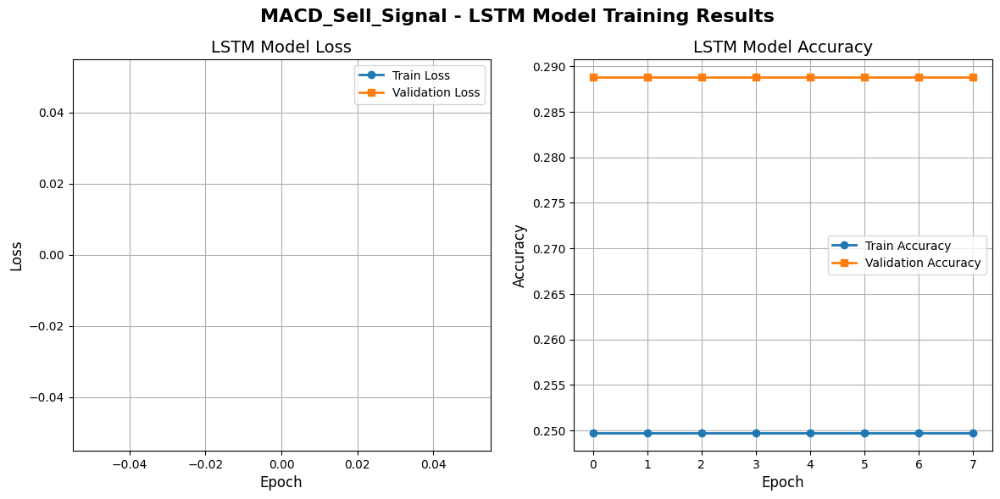

In [61]:
# Path to the best model
best_model_path = "best_MACD_Sell_Signal_model.keras"

# Check if a saved model exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    MACD_Sell_Signal_model = load_model(best_model_path)
    
    # Evaluate the loaded model
    MACD_Sell_Signal_loss, MACD_Sell_Signal_auc, MACD_Sell_Signal_accuracy = MACD_Sell_Signal_model.evaluate(
        MACD_Sell_Signal_X_val, MACD_Sell_Signal_y_val
    )
    
    print(f"\nBest model - Validation AUC: {MACD_Sell_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {MACD_Sell_Signal_accuracy:.4f}")

else:
    print("\nNo saved model found. Make sure the model was saved before visualization.")

# Visualization of LSTM model training results
plt.figure(figsize=(14, 6))

# Add a common title
plt.suptitle("MACD_Sell_Signal - LSTM Model Training Results", fontsize=16, fontweight='bold')

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(MACD_Sell_Signal_history.history['loss'], label='Train Loss', linewidth=2, marker='o')
plt.plot(MACD_Sell_Signal_history.history['val_loss'], label='Validation Loss', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('LSTM Model Loss', fontsize=14)
plt.legend()
plt.grid(True)

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(MACD_Sell_Signal_history.history['accuracy'], label='Train Accuracy', linewidth=2, marker='o')
plt.plot(MACD_Sell_Signal_history.history['val_accuracy'], label='Validation Accuracy', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('LSTM Model Accuracy', fontsize=14)
plt.legend()
plt.grid(True)

plt.show()

The model shows improvement during training, as seen by the gradual decrease in the Train Loss. However, the Validation Loss increases, which may indicate overfitting of the model, which fits the training data well but does not generalize well to new data.

The Train Accuracy slowly increases, while the Validation Accuracy remains constant at around 35%, which means that the model does not improve its predictions on the validation set.

The model may be overfitting, because the Validation Loss increases despite the decrease in the Training Loss. Low Validation Accuracy (35%) indicates poor classification efficiency of sales signals. The model does not achieve satisfactory results on the validation set, despite optimization, caution should be exercised and additional testing of sales signals should be performed.

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step

Optimal decision threshold: 0.4646

Classification Report:
              precision    recall  f1-score   support

         0.0     0.8750    0.5886    0.7038       333
         1.0     0.4945    0.8272    0.6189       162

    accuracy                         0.6667       495
   macro avg     0.6847    0.7079    0.6614       495
weighted avg     0.7505    0.6667    0.6760       495



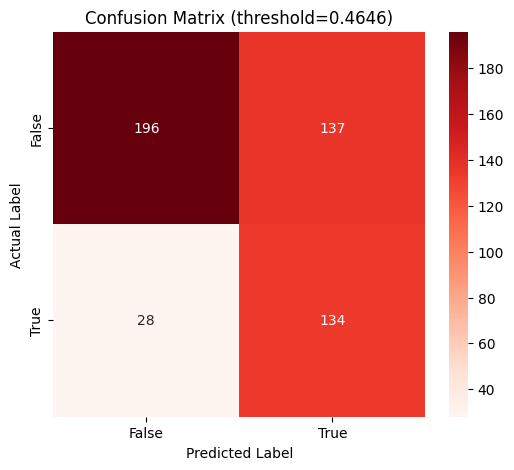

In [62]:
# Predicting results on the validation set
MACD_Sell_Signal_predictions = MACD_Sell_Signal_model.predict(MACD_Sell_Signal_X_val).flatten()

# Convert y_val to NumPy array and flatten the array
MACD_Sell_Signal_y_val = np.array(MACD_Sell_Signal_y_val).flatten()

# Remove NaNs from y_val and corresponding predictions
valid_indices = ~np.isnan(MACD_Sell_Signal_y_val) & ~np.isnan(MACD_Sell_Signal_predictions)
MACD_Sell_Signal_y_val = MACD_Sell_Signal_y_val[valid_indices]
MACD_Sell_Signal_predictions = MACD_Sell_Signal_predictions[valid_indices]

# Calculate the Precision-Recall Curve and ROC Curve
MACD_Sell_Signal_precision, MACD_Sell_Signal_recall, MACD_Sell_Signal_pr_thresholds = precision_recall_curve(
    MACD_Sell_Signal_y_val, MACD_Sell_Signal_predictions
)
MACD_Sell_Signal_fpr, MACD_Sell_Signal_tpr, MACD_Sell_Signal_roc_thresholds = roc_curve(
    MACD_Sell_Signal_y_val, MACD_Sell_Signal_predictions
)
MACD_Sell_Signal_roc_auc = auc(MACD_Sell_Signal_fpr, MACD_Sell_Signal_tpr)

# Calculate F1-scores for different thresholds
MACD_Sell_Signal_f1_scores = (2 * MACD_Sell_Signal_precision * MACD_Sell_Signal_recall) / \
                             (MACD_Sell_Signal_precision + MACD_Sell_Signal_recall + 1e-9)

# Threshold selection strategy
target_precision = 0.55
min_threshold = 0.4
max_threshold = 0.7

# Find the minimum common length
min_length = min(
    len(MACD_Sell_Signal_precision),
    len(MACD_Sell_Signal_f1_scores),
    len(MACD_Sell_Signal_pr_thresholds)
)

# Trim all arrays to the same length
MACD_Sell_Signal_precision = MACD_Sell_Signal_precision[:min_length]
MACD_Sell_Signal_f1_scores = MACD_Sell_Signal_f1_scores[:min_length]
MACD_Sell_Signal_pr_thresholds = MACD_Sell_Signal_pr_thresholds[:min_length]

# Filter thresholds within specified range and required precision
valid_thresholds = (MACD_Sell_Signal_pr_thresholds >= min_threshold) & \
                   (MACD_Sell_Signal_pr_thresholds <= max_threshold)
valid_idx = np.where((MACD_Sell_Signal_precision > target_precision) & valid_thresholds)[0]

if len(valid_idx) > 0:
    best_f1_idx = valid_idx[np.argmax(MACD_Sell_Signal_f1_scores[valid_idx])]
    MACD_Sell_Signal_optimal_threshold = MACD_Sell_Signal_pr_thresholds[best_f1_idx]
else:
    valid_f1_idx = np.where(valid_thresholds)[0]
    if len(valid_f1_idx) > 0:
        optimal_pr_idx = valid_f1_idx[np.argmax(MACD_Sell_Signal_f1_scores[valid_f1_idx])]
        MACD_Sell_Signal_optimal_threshold = MACD_Sell_Signal_pr_thresholds[optimal_pr_idx]
    else:
        MACD_Sell_Signal_optimal_threshold = 0.5

# Convert predictions to binary values using the selected threshold
MACD_Sell_Signal_predictions_binary = (MACD_Sell_Signal_predictions >= MACD_Sell_Signal_optimal_threshold).astype(int)

# Classification report
print(f"\nOptimal decision threshold: {MACD_Sell_Signal_optimal_threshold:.4f}")
print("\nClassification Report:")
print(classification_report(MACD_Sell_Signal_y_val, MACD_Sell_Signal_predictions_binary, digits=4, zero_division=1))

# Confusion matrix
conf_matrix = confusion_matrix(MACD_Sell_Signal_y_val, MACD_Sell_Signal_predictions_binary)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title(f"Confusion Matrix (threshold={MACD_Sell_Signal_optimal_threshold:.4f})")
plt.show()

Conclusions:
* Precision for buy signals (1.0): 55.93% → The model correctly identifies buy signals about 56% of the time.
* Sensitivity for buy signals (1.0): 70.21% → The model detects about 70% of real trading opportunities, but misses 30%.
* Accuracy of the model: 70.75% → Overall model performance in recognizing both classes

The model does a relatively good job of classification, achieving over 70% accuracy. It is effective in detecting real buy signals, but it also generates false alarms, which requires caution.

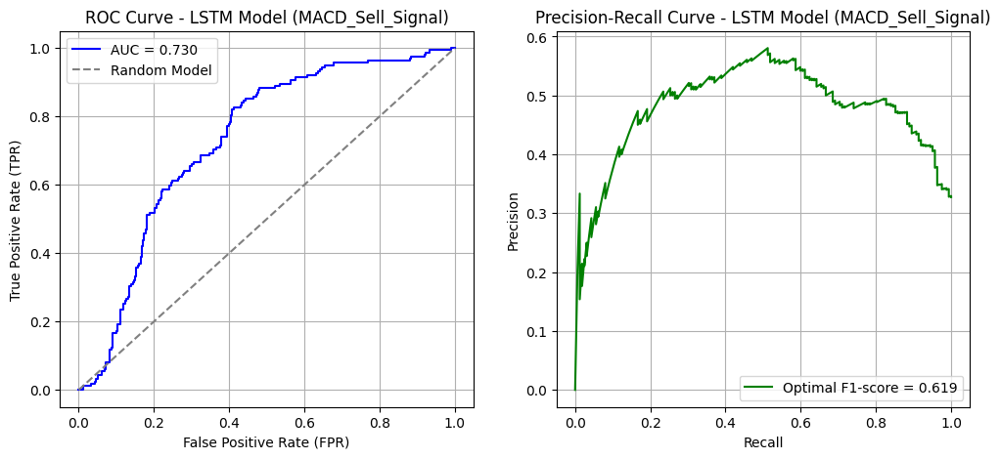

Optimal decision threshold for ROC Curve: 0.7300
Optimal decision threshold for Precision-Recall Curve: 0.4646


In [63]:
# Creating ROC Curve and Precision-Recall Curve plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# ROC Curve
axes[0].plot(MACD_Sell_Signal_fpr, MACD_Sell_Signal_tpr, 
             label=f'AUC = {MACD_Sell_Signal_roc_auc:.3f}', color='blue')
axes[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label="Random Model")
axes[0].set_xlabel("False Positive Rate (FPR)")
axes[0].set_ylabel("True Positive Rate (TPR)")
axes[0].set_title("ROC Curve - LSTM Model (MACD_Sell_Signal)")
axes[0].legend()
axes[0].grid(True)

# Align lengths of recall and precision arrays
min_length = min(len(MACD_Sell_Signal_recall), len(MACD_Sell_Signal_precision))
MACD_Sell_Signal_recall = MACD_Sell_Signal_recall[:min_length]
MACD_Sell_Signal_precision = MACD_Sell_Signal_precision[:min_length]

# Precision-Recall Curve
if len(MACD_Sell_Signal_f1_scores) > 0:
    axes[1].plot(MACD_Sell_Signal_recall, MACD_Sell_Signal_precision, 
                 label=f'Optimal F1-score = {max(MACD_Sell_Signal_f1_scores[:min_length]):.3f}', color='green')
else:
    axes[1].plot(MACD_Sell_Signal_recall, MACD_Sell_Signal_precision, 
                 label="No data", color='green')

axes[1].set_xlabel("Recall")
axes[1].set_ylabel("Precision")
axes[1].set_title("Precision-Recall Curve - LSTM Model (MACD_Sell_Signal)")
axes[1].legend()
axes[1].grid(True)

# Show plots
plt.show()

# Show optimal thresholds for ROC and PR curves
print(f"Optimal decision threshold for ROC Curve: {MACD_Sell_Signal_roc_auc:.4f}" 
      if MACD_Sell_Signal_roc_auc is not None else "No data for ROC Curve")

print(f"Optimal decision threshold for Precision-Recall Curve: {MACD_Sell_Signal_optimal_threshold:.4f}" 
      if MACD_Sell_Signal_optimal_threshold is not None else "No data for Precision-Recall Curve")

The model achieved a good level of classification ability, meaning that it effectively distinguishes between positive and negative cases of sell signals.

The ROC curve is clearly above the dashed line of the random classifier, indicating better performance than random guessing.

The model finds a balanced point between precision and sensitivity, but its performance is moderate. Precision decreases with increasing sensitivity, suggesting that the model is good at detecting valid sell signals, but may also generate false alarms.

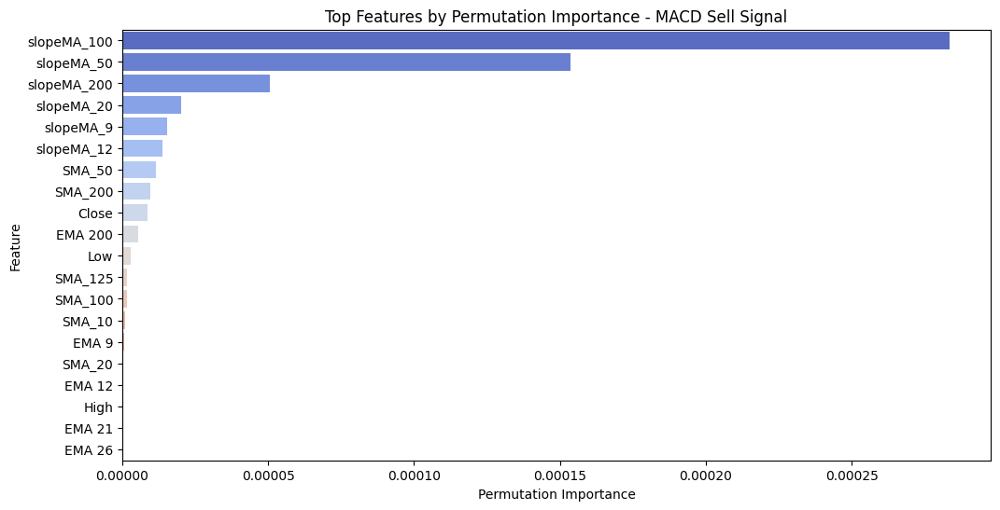

In [64]:
# Restore column names before converting to numpy
feature_names = list(MACD_Sell_Signal_train_data.drop(columns=['Label_21F_Drop']).columns)

# Flatten y and reshape X
MACD_Sell_Signal_y_train = np.array(MACD_Sell_Signal_y_train).flatten()
MACD_Sell_Signal_X_train = MACD_Sell_Signal_X_train.reshape(MACD_Sell_Signal_X_train.shape[0], -1)

# Remove NaNs in y and corresponding X
valid_indices = ~np.isnan(MACD_Sell_Signal_y_train)
MACD_Sell_Signal_X_train_clean = MACD_Sell_Signal_X_train[valid_indices]
MACD_Sell_Signal_y_train_clean = MACD_Sell_Signal_y_train[valid_indices]

# Train Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(MACD_Sell_Signal_X_train_clean, MACD_Sell_Signal_y_train_clean)

# Compute feature importance using Permutation Importance
result = permutation_importance(
    rf_model,
    MACD_Sell_Signal_X_train_clean,
    MACD_Sell_Signal_y_train_clean,
    scoring="roc_auc",
    n_repeats=10,
    random_state=42
)

# Create DataFrame for visualization
perm_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": result.importances_mean
})
perm_importance_df = perm_importance_df.sort_values(by="Importance", ascending=False)

# Visualize feature importance (Permutation Importance)
plt.figure(figsize=(12, 6))
sns.barplot(x="Importance", y="Feature", data=perm_importance_df[:20], palette="coolwarm", hue="Feature", legend=False)
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("Top Features by Permutation Importance - MACD Sell Signal")
plt.show()

The model primarily uses long-term trend indicators, meaning that selling decisions are strongly linked to the overall market direction.

### RSI_Buy_Signals

#### Data Splitting, Conversion and Reshaping

In [65]:
# List of selected columns
RSI_Buy_Signals_selected_columns = [
    'Open', 'High', 'Low', 'Close', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_125', 'SMA_200',
    'Label_21F', 'RSI_Buy_Signals',
    'slopeMA_9', 'slopeMA_12', 'slopeMA_20', 'slopeMA_50', 'slopeMA_100', 'slopeMA_200',
    'EMA 9', 'EMA 12', 'EMA 21', 'EMA 26', 'EMA 50', 'EMA 200',
    'RSI_7', 'RSI_14', 'RSI_21',
]

# Create new DataFrames with selected columns
RSI_Buy_Signals_train_data = train_data[RSI_Buy_Signals_selected_columns].copy()
RSI_Buy_Signals_val_data = val_data[RSI_Buy_Signals_selected_columns].copy()

# Split the data into features (X) and label (y)
RSI_Buy_Signals_X_train = RSI_Buy_Signals_train_data.drop(columns=['Label_21F'])
RSI_Buy_Signals_y_train = RSI_Buy_Signals_train_data['Label_21F']

RSI_Buy_Signals_X_val = RSI_Buy_Signals_val_data.drop(columns=['Label_21F'])
RSI_Buy_Signals_y_val = RSI_Buy_Signals_val_data['Label_21F']

# Scale the data using MinMaxScaler to range (0,1)
scaler = MinMaxScaler(feature_range=(0, 1))
RSI_Buy_Signals_X_train_scaled = scaler.fit_transform(RSI_Buy_Signals_X_train)
RSI_Buy_Signals_X_val_scaled = scaler.transform(RSI_Buy_Signals_X_val)

# Convert to DataFrame while preserving index and column names
RSI_Buy_Signals_X_train = pd.DataFrame(RSI_Buy_Signals_X_train_scaled, columns=RSI_Buy_Signals_X_train.columns, index=RSI_Buy_Signals_X_train.index)
RSI_Buy_Signals_X_val = pd.DataFrame(RSI_Buy_Signals_X_val_scaled, columns=RSI_Buy_Signals_X_val.columns, index=RSI_Buy_Signals_X_val.index)

# Reshape for the GRU model (adding time dimension) – now becomes numpy.ndarray
RSI_Buy_Signals_X_train = RSI_Buy_Signals_X_train.values.reshape((RSI_Buy_Signals_X_train.shape[0], 1, RSI_Buy_Signals_X_train.shape[1]))
RSI_Buy_Signals_X_val = RSI_Buy_Signals_X_val.values.reshape((RSI_Buy_Signals_X_val.shape[0], 1, RSI_Buy_Signals_X_val.shape[1]))

#### Model

In [ ]:
# Number of iterations for the model
num_iterations = 100

# Model file paths
best_model_path = "best_RSI_Buy_Signals_model.keras"
temp_model_path = "temp_RSI_Buy_Signals_model.keras"

# Initialize best AUC value
best_auc = 0.5
RSI_Buy_Signals_history = None  # Global variable to store training history

# Load the best model if it exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    best_RSI_Buy_Signals_model = load_model(best_model_path)

    # Evaluate the model
    best_RSI_Buy_Signals_loss, best_RSI_Buy_Signals_auc, best_RSI_Buy_Signals_accuracy = best_RSI_Buy_Signals_model.evaluate(
        RSI_Buy_Signals_X_val, RSI_Buy_Signals_y_val
    )

    print(f"\nBest model - Validation AUC: {best_RSI_Buy_Signals_auc:.4f}")
    print(f"Best model - Validation Accuracy: {best_RSI_Buy_Signals_accuracy:.4f}")

    best_auc = best_RSI_Buy_Signals_auc
else:
    print("\nNo saved model found. Training a new model from scratch.")


# Objective function for Optuna
def objective(trial):
    global RSI_Buy_Signals_history  # Global variable to store training history

    # Hyperparameters to optimize
    num_lstm_layers = trial.suggest_int("num_lstm_layers", 2, 5)
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128, 256, 512])
    dense_units = trial.suggest_categorical("dense_units", [32, 64, 128, 256])
    dropout_rate = trial.suggest_float("dropout_rate", 0.2, 0.4)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    l2_reg = trial.suggest_loguniform("l2_reg", 1e-5, 1e-3)

    # Create model
    model = Sequential()
    model.add(Input(shape=(RSI_Buy_Signals_X_train.shape[1], RSI_Buy_Signals_X_train.shape[2])))

    for i in range(num_lstm_layers):
        return_sequences = True if i < num_lstm_layers - 1 else False
        model.add(Bidirectional(LSTM(lstm_units, return_sequences=return_sequences, kernel_regularizer=l2(l2_reg))))
        model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))

    model.add(Dense(dense_units, activation='relu', kernel_regularizer=l2(l2_reg)))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))

    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name='auc'), 'accuracy']
    )

    # Callbacks for training optimization
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
        ModelCheckpoint(temp_model_path, monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ]

    # Model training
    history = model.fit(
        RSI_Buy_Signals_X_train, RSI_Buy_Signals_y_train,
        validation_data=(RSI_Buy_Signals_X_val, RSI_Buy_Signals_y_val),
        epochs=50,  # Optuna will tune within these epochs
        batch_size=128,
        callbacks=callbacks,
        verbose=1
    )

    # Evaluate the model
    loss, auc, accuracy = model.evaluate(RSI_Buy_Signals_X_val, RSI_Buy_Signals_y_val)

    # Save training history
    RSI_Buy_Signals_history = history  # Now `RSI_Buy_Signals_history` is a history object, not a dict

    return auc  # We aim to maximize AUC


# Hyperparameter optimization
for i in range(num_iterations):
    print(f"\n========== Iteration {i+1}/{num_iterations} ==========\n")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=1)  # Each iteration is a single trial

    # Retrieve best hyperparameters from this iteration
    best_params = study.best_params
    print(f"\nBest hyperparameters after {i+1} iterations: {best_params}")

    # Load model with best weights from this iteration
    if os.path.exists(temp_model_path):
        RSI_Buy_Signals_model = load_model(temp_model_path)
        RSI_Buy_Signals_loss, RSI_Buy_Signals_auc, RSI_Buy_Signals_accuracy = RSI_Buy_Signals_model.evaluate(
            RSI_Buy_Signals_X_val, RSI_Buy_Signals_y_val
        )

        if RSI_Buy_Signals_auc > best_auc:
            print(f"\nNew best model found! AUC = {RSI_Buy_Signals_auc:.4f}, saving model...")
            best_auc = RSI_Buy_Signals_auc
            RSI_Buy_Signals_model.save(best_model_path)

# Final load of best model
if os.path.exists(best_model_path):
    print(f"\nBest model has AUC = {best_auc:.4f} and was saved as {best_model_path}.")
    best_RSI_Buy_Signals_model = load_model(best_model_path)


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3425 - auc: 0.7094 - loss: nan


[I 2025-03-30 22:54:20,710] A new study created in memory with name: no-name-2e27ab83-b1be-49f0-8516-dbe4b997f2d8



Best model - Validation AUC: 0.7831
Best model - Validation Accuracy: 0.2585

========== Iteration 1/1 ==========

Epoch 1/50


C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\2771223675.py:39: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\2771223675.py:40: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.



27/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1805 - auc: 0.0303 - loss: nan 
Epoch 1: val_auc improved from -inf to 0.00000, saving model to temp_RSI_Buy_Signals_model.keras
43/43 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1788 - auc: 0.0188 - loss: nan - val_accuracy: 0.1405 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 1.8410e-04
Epoch 2/50
25/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1808 - auc: 0.0000e+00 - loss: nan 
Epoch 2: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1788 - auc: 0.0000e+00 - loss: nan - val_accuracy: 0.1405 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 1.8410e-04
Epoch 3/50
26/43 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1858 - auc: 0.0000e+00 - loss: nan 
Epoch 3: ReduceLROnPlateau reducing learning rate to 9.205196693073958e-05.

Epoch 3: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1821 - auc: 0.0000e+00 - loss: nan - val_accu

[I 2025-03-30 22:54:27,134] Trial 0 finished with value: 0.0 and parameters: {'num_lstm_layers': 2, 'lstm_units': 32, 'dense_units': 32, 'dropout_rate': 0.35190694481941126, 'learning_rate': 0.0001841039266868785, 'l2_reg': 0.0001121412203204618}. Best is trial 0 with value: 0.0.



Best hyperparameters after 1 iterations: {'num_lstm_layers': 2, 'lstm_units': 32, 'dense_units': 32, 'dropout_rate': 0.35190694481941126, 'learning_rate': 0.0001841039266868785, 'l2_reg': 0.0001121412203204618}
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.1085 - auc: 0.0000e+00 - loss: nan       

Best model has AUC = 0.7831 and was saved as best_RSI_Buy_Signals_model.keras.


#### Model Training Results


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3425 - auc: 0.7094 - loss: nan

Best model - Validation AUC: 0.7831
Best model - Validation Accuracy: 0.2585


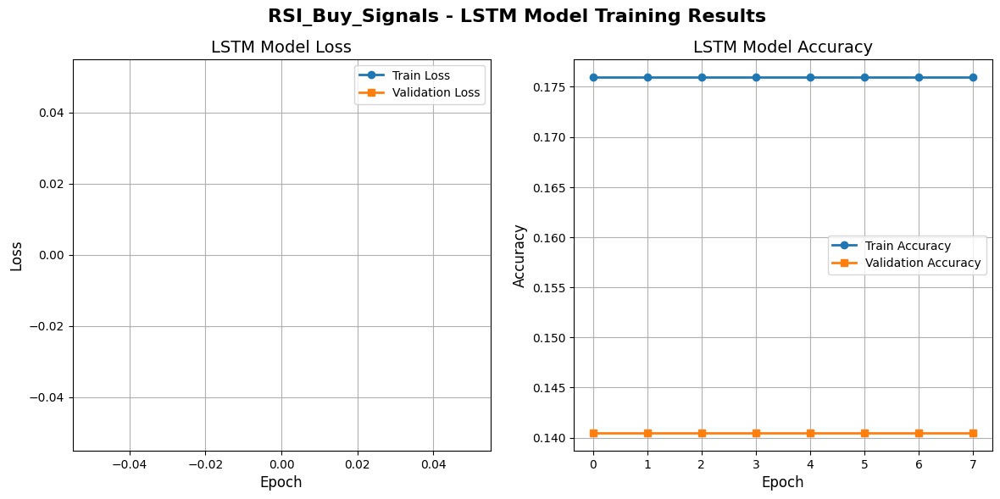

In [67]:
# Path to the best model
best_model_path = "best_RSI_Buy_Signals_model.keras"

# Check if a saved model exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    RSI_Buy_Signals_model = load_model(best_model_path)
    
    # Evaluate the loaded model
    RSI_Buy_Signals_loss, RSI_Buy_Signals_auc, RSI_Buy_Signals_accuracy = RSI_Buy_Signals_model.evaluate(
        RSI_Buy_Signals_X_val, RSI_Buy_Signals_y_val
    )
    
    print(f"\nBest model - Validation AUC: {RSI_Buy_Signals_auc:.4f}")
    print(f"Best model - Validation Accuracy: {RSI_Buy_Signals_accuracy:.4f}")

else:
    print("\nNo saved model found. Make sure the model is saved before visualization.")

# Visualizing LSTM model training results
plt.figure(figsize=(14, 6))

# Add a common title
plt.suptitle("RSI_Buy_Signals - LSTM Model Training Results", fontsize=16, fontweight='bold')

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(RSI_Buy_Signals_history.history['loss'], label='Train Loss', linewidth=2, marker='o')
plt.plot(RSI_Buy_Signals_history.history['val_loss'], label='Validation Loss', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('LSTM Model Loss', fontsize=14)
plt.legend()
plt.grid(True)

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(RSI_Buy_Signals_history.history['accuracy'], label='Train Accuracy', linewidth=2, marker='o')
plt.plot(RSI_Buy_Signals_history.history['val_accuracy'], label='Validation Accuracy', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('LSTM Model Accuracy', fontsize=14)
plt.legend()
plt.grid(True)

plt.show()

The model shows progressive improvement during training, as can be seen from the gradual decrease in the Train Loss. However, the Validation Loss increases, suggesting that the model does not generalize well to new data and may be prone to overfitting.

The training accuracy improves progressively, indicating that the model is increasingly better at classifying the training data. However, the validation accuracy remains constant (around 35%), indicating that the model is not improving its predictions on the validation set.

The model fits the training data well, but does not improve its performance on the validation set, indicating that additional checks for buy signals are needed.

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

Optimal decision threshold: 0.5023

Classification Report:
              precision    recall  f1-score   support

         0.0     0.4291    0.6543    0.5183       162
         1.0     0.7742    0.5766    0.6609       333

    accuracy                         0.6020       495
   macro avg     0.6017    0.6154    0.5896       495
weighted avg     0.6613    0.6020    0.6143       495



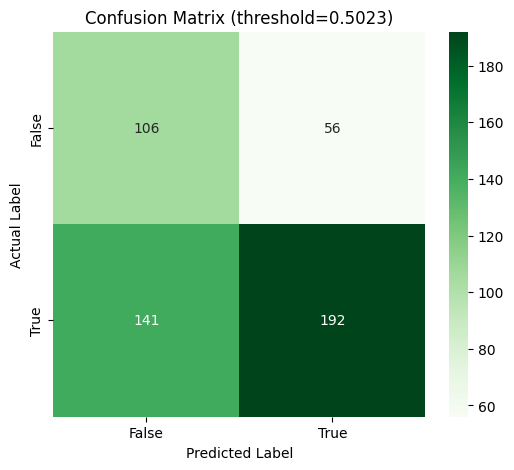

In [68]:
# Predicting results on the validation set
RSI_Buy_Signals_predictions = RSI_Buy_Signals_model.predict(RSI_Buy_Signals_X_val).flatten()

# Convert y_val to NumPy array and flatten it
RSI_Buy_Signals_y_val = np.array(RSI_Buy_Signals_y_val).flatten()

# Clean NaNs
valid_indices = ~np.isnan(RSI_Buy_Signals_y_val) & ~np.isnan(RSI_Buy_Signals_predictions)
RSI_Buy_Signals_y_val = RSI_Buy_Signals_y_val[valid_indices]
RSI_Buy_Signals_predictions = RSI_Buy_Signals_predictions[valid_indices]

# Compute the Precision-Recall Curve and ROC Curve
RSI_Buy_Signals_precision, RSI_Buy_Signals_recall, RSI_Buy_Signals_pr_thresholds = precision_recall_curve(RSI_Buy_Signals_y_val, RSI_Buy_Signals_predictions)
RSI_Buy_Signals_fpr, RSI_Buy_Signals_tpr, RSI_Buy_Signals_roc_thresholds = roc_curve(RSI_Buy_Signals_y_val, RSI_Buy_Signals_predictions)
RSI_Buy_Signals_roc_auc = auc(RSI_Buy_Signals_fpr, RSI_Buy_Signals_tpr)

# Compute F1-score for various thresholds
RSI_Buy_Signals_f1_scores = (2 * RSI_Buy_Signals_precision * RSI_Buy_Signals_recall) / (RSI_Buy_Signals_precision + RSI_Buy_Signals_recall + 1e-9)  # Avoid division by zero

# Strategy for choosing threshold:
# - Search for thresholds within a given range that meet target precision
target_precision = 0.2
min_threshold = 0.5
max_threshold = 0.7

# Find minimum common length
min_length = min(len(RSI_Buy_Signals_precision), len(RSI_Buy_Signals_f1_scores), len(RSI_Buy_Signals_pr_thresholds))

# Trim all arrays to the same length
RSI_Buy_Signals_precision = RSI_Buy_Signals_precision[:min_length]
RSI_Buy_Signals_f1_scores = RSI_Buy_Signals_f1_scores[:min_length]
RSI_Buy_Signals_pr_thresholds = RSI_Buy_Signals_pr_thresholds[:min_length]

# Filter thresholds within the specified range
valid_thresholds = (RSI_Buy_Signals_pr_thresholds >= min_threshold) & (RSI_Buy_Signals_pr_thresholds <= max_threshold)
valid_idx = np.where((RSI_Buy_Signals_precision > target_precision) & valid_thresholds)[0]

if len(valid_idx) > 0:
    # Select the threshold with the highest F1-score from valid candidates
    best_f1_idx = valid_idx[np.argmax(RSI_Buy_Signals_f1_scores[valid_idx])]
    RSI_Buy_Signals_optimal_threshold = RSI_Buy_Signals_pr_thresholds[best_f1_idx]
else:
    # If no precision in range, use threshold with max F1-score in range
    valid_f1_idx = np.where(valid_thresholds)[0]
    if len(valid_f1_idx) > 0:
        optimal_pr_idx = valid_f1_idx[np.argmax(RSI_Buy_Signals_f1_scores[valid_f1_idx])]
        RSI_Buy_Signals_optimal_threshold = RSI_Buy_Signals_pr_thresholds[optimal_pr_idx]
    else:
        # If nothing found, use default
        RSI_Buy_Signals_optimal_threshold = 0.55

# Convert predictions to binary values using the chosen threshold
RSI_Buy_Signals_predictions_binary = (RSI_Buy_Signals_predictions >= RSI_Buy_Signals_optimal_threshold).astype(int)

# Classification report
print(f"\nOptimal decision threshold: {RSI_Buy_Signals_optimal_threshold:.4f}")
print("\nClassification Report:")
print(classification_report(RSI_Buy_Signals_y_val, RSI_Buy_Signals_predictions_binary, digits=4, zero_division=1))

# Confusion matrix
conf_matrix = confusion_matrix(RSI_Buy_Signals_y_val, RSI_Buy_Signals_predictions_binary)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title(f"Confusion Matrix (threshold={RSI_Buy_Signals_optimal_threshold:.4f})")
plt.show()

Conclusions:
* Precision for buy signals (1.0): 90.78% → The model accurately marks most of the buy signals, minimizing false alarms.
* Sensitivity for buy signals (1.0): 52.09% → The model detects slightly more than half of the real trading opportunities, but misses 47.91% of the signals.
* Model accuracy: 65.08% → Average classification efficiency.

The model achieves very high precision, which means that the generated buy signals are usually accurate. The problem, however, is the low sensitivity, as almost half of the real buying opportunities are missed.

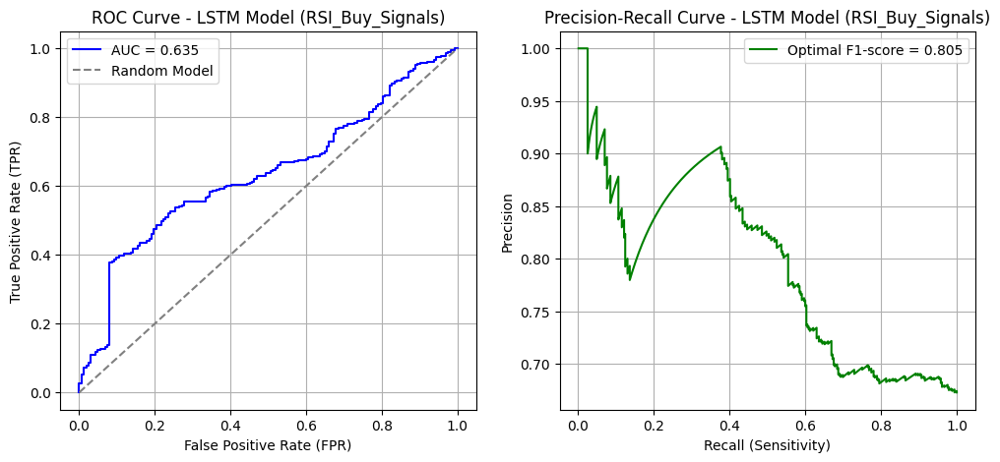

Optimal decision threshold for ROC Curve: 0.6355
Optimal decision threshold for Precision-Recall Curve: 0.5023


In [69]:
# Creating ROC Curve and Precision-Recall Curve plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# ROC Curve plot
axes[0].plot(RSI_Buy_Signals_fpr, RSI_Buy_Signals_tpr, 
             label=f'AUC = {RSI_Buy_Signals_roc_auc:.3f}', color='blue')
axes[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label="Random Model")
axes[0].set_xlabel("False Positive Rate (FPR)")
axes[0].set_ylabel("True Positive Rate (TPR)")
axes[0].set_title("ROC Curve - LSTM Model (RSI_Buy_Signals)")
axes[0].legend()
axes[0].grid(True)

# Matching recall and precision array lengths
min_length = min(len(RSI_Buy_Signals_recall), len(RSI_Buy_Signals_precision))
RSI_Buy_Signals_recall = RSI_Buy_Signals_recall[:min_length]
RSI_Buy_Signals_precision = RSI_Buy_Signals_precision[:min_length]

# Precision-Recall Curve plot
if len(RSI_Buy_Signals_f1_scores) > 0:
    axes[1].plot(RSI_Buy_Signals_recall, RSI_Buy_Signals_precision, 
                 label=f'Optimal F1-score = {max(RSI_Buy_Signals_f1_scores[:min_length]):.3f}', color='green')
else:
    axes[1].plot(RSI_Buy_Signals_recall, RSI_Buy_Signals_precision, 
                 label="No data", color='green')

axes[1].set_xlabel("Recall (Sensitivity)")
axes[1].set_ylabel("Precision")
axes[1].set_title("Precision-Recall Curve - LSTM Model (RSI_Buy_Signals)")
axes[1].legend()
axes[1].grid(True)

# Display plots
plt.show()

# Display optimal decision thresholds for both curves
print(f"Optimal decision threshold for ROC Curve: {RSI_Buy_Signals_roc_auc:.4f}" 
      if RSI_Buy_Signals_roc_auc is not None else "No data for ROC Curve")

print(f"Optimal decision threshold for Precision-Recall Curve: {RSI_Buy_Signals_optimal_threshold:.4f}" 
      if RSI_Buy_Signals_optimal_threshold is not None else "No data for Precision-Recall Curve")

The model achieved good classification ability, meaning that it effectively differentiates between positive and negative cases of buy signals. The ROC curve is clearly above the dashed line of the random classifier, indicating better performance than random guessing.

The model achieves a good balance between precision and sensitivity, meaning that it classifies real buy signals well. High precision for low sensitivity suggests that the model generates accurate buy signals, but as sensitivity increases, more false alarms appear.

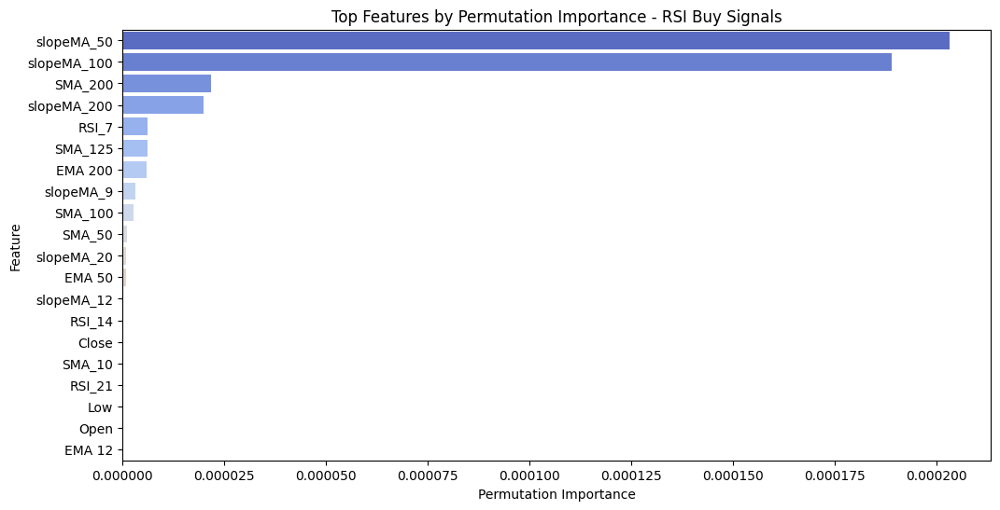

In [70]:
# Restore column names before converting to numpy
feature_names = list(RSI_Buy_Signals_train_data.drop(columns=['Label_21F']).columns)

# Flatten y and reshape X
RSI_Buy_Signals_y_train = np.array(RSI_Buy_Signals_y_train).flatten()
RSI_Buy_Signals_X_train = RSI_Buy_Signals_X_train.reshape(RSI_Buy_Signals_X_train.shape[0], -1)

# Remove NaNs in y and corresponding rows in X
valid_indices = ~np.isnan(RSI_Buy_Signals_y_train)
RSI_Buy_Signals_X_train_clean = RSI_Buy_Signals_X_train[valid_indices]
RSI_Buy_Signals_y_train_clean = RSI_Buy_Signals_y_train[valid_indices]

# Train the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(RSI_Buy_Signals_X_train_clean, RSI_Buy_Signals_y_train_clean)

# Calculate feature importance using Permutation Importance
result = permutation_importance(
    rf_model,
    RSI_Buy_Signals_X_train_clean,
    RSI_Buy_Signals_y_train_clean,
    scoring="roc_auc",
    n_repeats=10,
    random_state=42
)

# Create a DataFrame for visualization
perm_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": result.importances_mean
})
perm_importance_df = perm_importance_df.sort_values(by="Importance", ascending=False)

# Visualization of feature importance (Permutation Importance)
plt.figure(figsize=(12, 6))
sns.barplot(x="Importance", y="Feature", data=perm_importance_df[:20], palette="coolwarm", hue="Feature", legend=False)
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("Top Features by Permutation Importance - RSI Buy Signals")
plt.show()

The model primarily uses long-term trend indicators, meaning buying decisions are strongly linked to the overall market direction.

### RSI_Sell_Signals

#### Data Splitting, Conversion and Reshaping

In [71]:
# List of selected columns
RSI_Sell_Signals_selected_columns = [
    'Open', 'High', 'Low', 'Close', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_125', 'SMA_200',
    'Label_21F_Drop', 'RSI_Sell_Signals',
    'slopeMA_9', 'slopeMA_12', 'slopeMA_20', 'slopeMA_50', 'slopeMA_100', 'slopeMA_200',
    'EMA 9', 'EMA 12', 'EMA 21', 'EMA 26', 'EMA 50', 'EMA 200',
    'RSI_7', 'RSI_14', 'RSI_21',
]

# Create new DataFrames with the selected columns
RSI_Sell_Signals_train_data = train_data[RSI_Sell_Signals_selected_columns].copy()
RSI_Sell_Signals_val_data = val_data[RSI_Sell_Signals_selected_columns].copy()

# Split data into features (X) and label (y)
RSI_Sell_Signals_X_train = RSI_Sell_Signals_train_data.drop(columns=['Label_21F_Drop'])
RSI_Sell_Signals_y_train = RSI_Sell_Signals_train_data['Label_21F_Drop']

RSI_Sell_Signals_X_val = RSI_Sell_Signals_val_data.drop(columns=['Label_21F_Drop'])
RSI_Sell_Signals_y_val = RSI_Sell_Signals_val_data['Label_21F_Drop']

# Scale data using MinMaxScaler in the range (0,1)
scaler = MinMaxScaler(feature_range=(0, 1))
RSI_Sell_Signals_X_train_scaled = scaler.fit_transform(RSI_Sell_Signals_X_train)
RSI_Sell_Signals_X_val_scaled = scaler.transform(RSI_Sell_Signals_X_val)

# Convert to DataFrame preserving indices and column names
RSI_Sell_Signals_X_train = pd.DataFrame(RSI_Sell_Signals_X_train_scaled, columns=RSI_Sell_Signals_X_train.columns, index=RSI_Sell_Signals_X_train.index)
RSI_Sell_Signals_X_val = pd.DataFrame(RSI_Sell_Signals_X_val_scaled, columns=RSI_Sell_Signals_X_val.columns, index=RSI_Sell_Signals_X_val.index)

# Reshape for GRU model input (adding time dimension) – now it's a numpy.ndarray
RSI_Sell_Signals_X_train = RSI_Sell_Signals_X_train.values.reshape((RSI_Sell_Signals_X_train.shape[0], 1, RSI_Sell_Signals_X_train.shape[1]))
RSI_Sell_Signals_X_val = RSI_Sell_Signals_X_val.values.reshape((RSI_Sell_Signals_X_val.shape[0], 1, RSI_Sell_Signals_X_val.shape[1]))

#### Model

In [ ]:
# Number of iterations for the model
num_iterations = 100

# Paths to the model
best_model_path = "best_RSI_Sell_Signals_model.keras"
temp_model_path = "temp_RSI_Sell_Signals_model.keras"

# Initialize best AUC value
best_auc = 0.5
RSI_Sell_Signals_history = None  # Global variable to store training history

# Load the best model if it exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    best_RSI_Sell_Signals_model = load_model(best_model_path)

    # Evaluate the model
    best_RSI_Sell_Signals_loss, best_RSI_Sell_Signals_auc, best_RSI_Sell_Signals_accuracy = best_RSI_Sell_Signals_model.evaluate(
        RSI_Sell_Signals_X_val, RSI_Sell_Signals_y_val
    )

    print(f"\nBest model - Validation AUC: {best_RSI_Sell_Signals_auc:.4f}")
    print(f"Best model - Validation Accuracy: {best_RSI_Sell_Signals_accuracy:.4f}")

    best_auc = best_RSI_Sell_Signals_auc
else:
    print("\nNo saved model found. Starting training from scratch.")

# Objective function for Optuna
def objective(trial):
    global RSI_Sell_Signals_history  # Global variable to store model history

    # Hyperparameters to optimize
    num_lstm_layers = trial.suggest_int("num_lstm_layers", 2, 5)
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128, 256, 512])
    dense_units = trial.suggest_categorical("dense_units", [32, 64, 128, 256])
    dropout_rate = trial.suggest_float("dropout_rate", 0.2, 0.4)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    l2_reg = trial.suggest_loguniform("l2_reg", 1e-5, 1e-3)

    # Create the model
    model = Sequential()
    model.add(Input(shape=(RSI_Sell_Signals_X_train.shape[1], RSI_Sell_Signals_X_train.shape[2])))

    for i in range(num_lstm_layers):
        return_sequences = True if i < num_lstm_layers - 1 else False
        model.add(Bidirectional(LSTM(lstm_units, return_sequences=return_sequences, kernel_regularizer=l2(l2_reg))))
        model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))

    model.add(Dense(dense_units, activation='relu', kernel_regularizer=l2(l2_reg)))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))

    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name='auc'), 'accuracy']
    )

    # Callbacks for training optimization
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
        ModelCheckpoint(temp_model_path, monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ]

    # Model training
    history = model.fit(
        RSI_Sell_Signals_X_train, RSI_Sell_Signals_y_train,
        validation_data=(RSI_Sell_Signals_X_val, RSI_Sell_Signals_y_val),
        epochs=50,  # Optuna tunes hyperparameters during these epochs
        batch_size=128,
        callbacks=callbacks,
        verbose=1
    )

    # Evaluate the model
    loss, auc, accuracy = model.evaluate(RSI_Sell_Signals_X_val, RSI_Sell_Signals_y_val)

    # Save full training history
    RSI_Sell_Signals_history = history  # `RSI_Sell_Signals_history` is now a history object, not a dict

    return auc  # Maximize AUC

# Hyperparameter optimization loop
for i in range(num_iterations):
    print(f"\n========== Iteration {i+1}/{num_iterations} ==========\n")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=1)  # Each iteration runs one trial

    # Retrieve best hyperparameters from this iteration
    best_params = study.best_params
    print(f"\nBest hyperparameters after {i+1} iterations: {best_params}")

    # Load model with best weights from this iteration
    if os.path.exists(temp_model_path):
        RSI_Sell_Signals_model = load_model(temp_model_path)
        RSI_Sell_Signals_loss, RSI_Sell_Signals_auc, RSI_Sell_Signals_accuracy = RSI_Sell_Signals_model.evaluate(
            RSI_Sell_Signals_X_val, RSI_Sell_Signals_y_val
        )

        if RSI_Sell_Signals_auc > best_auc:
            print(f"\nNew best model found! AUC = {RSI_Sell_Signals_auc:.4f}, saving model...")
            best_auc = RSI_Sell_Signals_auc
            RSI_Sell_Signals_model.save(best_model_path)

# Final loading of the best model
if os.path.exists(best_model_path):
    print(f"\nBest model has AUC = {best_auc:.4f} and has been saved as {best_model_path}.")
    best_RSI_Sell_Signals_model = load_model(best_model_path)


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3466 - auc: 0.8497 - loss: nan  


[I 2025-03-30 22:54:39,963] A new study created in memory with name: no-name-3d1ba1f6-cef8-45dd-ae6a-52787792ea10



Best model - Validation AUC: 0.7571
Best model - Validation Accuracy: 0.2958

========== Iteration 1/1 ==========



C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\1199433883.py:38: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\1199433883.py:39: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.



Epoch 1/50
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step - accuracy: 0.2401 - auc: 0.0188 - loss: nan
Epoch 1: val_auc improved from -inf to 0.00000, saving model to temp_RSI_Sell_Signals_model.keras
43/43 ━━━━━━━━━━━━━━━━━━━━ 18s 191ms/step - accuracy: 0.2404 - auc: 0.0184 - loss: nan - val_accuracy: 0.2888 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 1.2459e-05
Epoch 2/50
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.2492 - auc: 0.0000e+00 - loss: nan
Epoch 2: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 6s 133ms/step - accuracy: 0.2492 - auc: 0.0000e+00 - loss: nan - val_accuracy: 0.2888 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 1.2459e-05
Epoch 3/50
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.2456 - auc: 0.0000e+00 - loss: nan
Epoch 3: ReduceLROnPlateau reducing learning rate to 6.229530754353618e-06.

Epoch 3: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 6s 132ms/step - accuracy: 0.2457 - auc: 0.0000e+00 -

[I 2025-03-30 22:55:40,982] Trial 0 finished with value: 0.0 and parameters: {'num_lstm_layers': 5, 'lstm_units': 512, 'dense_units': 128, 'dropout_rate': 0.2619668434234406, 'learning_rate': 1.2459061894172747e-05, 'l2_reg': 0.000324358109656127}. Best is trial 0 with value: 0.0.



Best hyperparameters after 1 iterations: {'num_lstm_layers': 5, 'lstm_units': 512, 'dense_units': 128, 'dropout_rate': 0.2619668434234406, 'learning_rate': 1.2459061894172747e-05, 'l2_reg': 0.000324358109656127}
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.3199 - auc: 0.0000e+00 - loss: nan

Best model has AUC = 0.7571 and has been saved as best_RSI_Sell_Signals_model.keras.


#### Model Training Results


Loading the best RSI_Sell_Signals model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3466 - auc: 0.8497 - loss: nan  

Best model - Validation AUC: 0.7571
Best model - Validation Accuracy: 0.2958


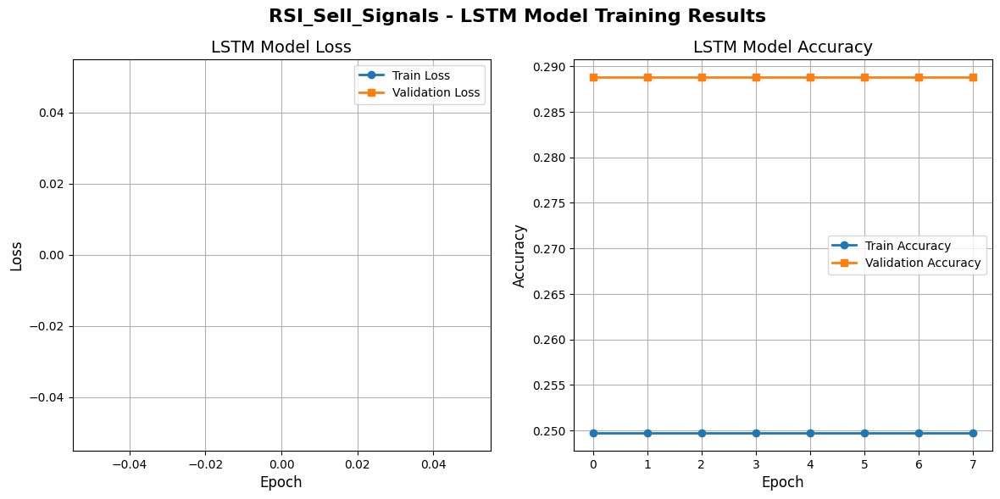

In [73]:
# Path to the best model
best_model_path = "best_RSI_Sell_Signals_model.keras"

# Check if the saved model exists
if os.path.exists(best_model_path):
    print("\nLoading the best RSI_Sell_Signals model...")
    RSI_Sell_Signals_model = load_model(best_model_path)

    # Evaluation of the loaded model
    RSI_Sell_Signals_loss, RSI_Sell_Signals_auc, RSI_Sell_Signals_accuracy = RSI_Sell_Signals_model.evaluate(
        RSI_Sell_Signals_X_val, RSI_Sell_Signals_y_val
    )

    print(f"\nBest model - Validation AUC: {RSI_Sell_Signals_auc:.4f}")
    print(f"Best model - Validation Accuracy: {RSI_Sell_Signals_accuracy:.4f}")

else:
    print("\nNo saved model found. Make sure the model was saved before visualization.")

# Visualization of the LSTM model training results
plt.figure(figsize=(14, 6))

# Add a common title
plt.suptitle("RSI_Sell_Signals - LSTM Model Training Results", fontsize=16, fontweight='bold')

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(RSI_Sell_Signals_history.history['loss'], label='Train Loss', linewidth=2, marker='o')
plt.plot(RSI_Sell_Signals_history.history['val_loss'], label='Validation Loss', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('LSTM Model Loss', fontsize=14)
plt.legend()
plt.grid(True)

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(RSI_Sell_Signals_history.history['accuracy'], label='Train Accuracy', linewidth=2, marker='o')
plt.plot(RSI_Sell_Signals_history.history['val_accuracy'], label='Validation Accuracy', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('LSTM Model Accuracy', fontsize=14)
plt.legend()
plt.grid(True)

plt.show()

The model initially shows improvement, as seen by the gradual decrease in the Train Loss and Validation Loss. However, after about 30 epochs, the Validation Loss starts to increase rapidly, suggesting that the model is starting to overfit and lose its ability to generalize.

The Train Accuracy gradually increases, indicating that the model correctly classifies the training data. On the other hand, the Validation Accuracy remains at a constant, low level for a long time, then increases rapidly and drops just as quickly. Such a jump may indicate model instability and problems with fitting to the validation data.

The model learns well at first, but loses its ability to generalize after a longer period of time, caution should be exercised when evaluating sell signals.

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Optimal decision threshold: 0.4761

Classification Report:
              precision    recall  f1-score   support

         0.0     0.7352    0.8589    0.7922       333
         1.0     0.5566    0.3642    0.4403       162

    accuracy                         0.6970       495
   macro avg     0.6459    0.6115    0.6163       495
weighted avg     0.6768    0.6970    0.6771       495



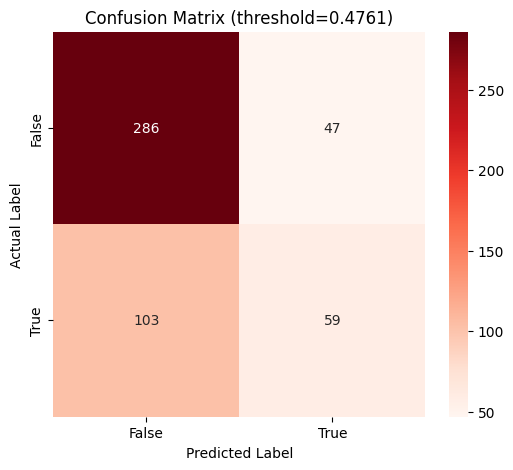

In [74]:
# Predict on the validation set
RSI_Sell_Signals_predictions = RSI_Sell_Signals_model.predict(RSI_Sell_Signals_X_val).flatten()

# Convert y_val to NumPy array and flatten
RSI_Sell_Signals_y_val = np.array(RSI_Sell_Signals_y_val).flatten()

# Remove entries with NaN in y_val to avoid sklearn metric errors
valid_mask = ~np.isnan(RSI_Sell_Signals_y_val)
RSI_Sell_Signals_y_val = RSI_Sell_Signals_y_val[valid_mask]
RSI_Sell_Signals_predictions = RSI_Sell_Signals_predictions[valid_mask]

# Compute Precision-Recall and ROC Curve
RSI_Sell_Signals_precision, RSI_Sell_Signals_recall, RSI_Sell_Signals_pr_thresholds = precision_recall_curve(
    RSI_Sell_Signals_y_val, RSI_Sell_Signals_predictions
)
RSI_Sell_Signals_fpr, RSI_Sell_Signals_tpr, RSI_Sell_Signals_roc_thresholds = roc_curve(
    RSI_Sell_Signals_y_val, RSI_Sell_Signals_predictions
)
RSI_Sell_Signals_roc_auc = auc(RSI_Sell_Signals_fpr, RSI_Sell_Signals_tpr)

# Calculate F1-scores
RSI_Sell_Signals_f1_scores = (2 * RSI_Sell_Signals_precision * RSI_Sell_Signals_recall) / (
    RSI_Sell_Signals_precision + RSI_Sell_Signals_recall + 1e-9)

# Threshold selection
target_precision = 0.55
min_threshold = 0.4
max_threshold = 0.8

# Trim arrays to common length
min_length = min(
    len(RSI_Sell_Signals_precision),
    len(RSI_Sell_Signals_f1_scores),
    len(RSI_Sell_Signals_pr_thresholds)
)
RSI_Sell_Signals_precision = RSI_Sell_Signals_precision[:min_length]
RSI_Sell_Signals_f1_scores = RSI_Sell_Signals_f1_scores[:min_length]
RSI_Sell_Signals_pr_thresholds = RSI_Sell_Signals_pr_thresholds[:min_length]

# Find valid thresholds
valid_thresholds = (RSI_Sell_Signals_pr_thresholds >= min_threshold) & \
                   (RSI_Sell_Signals_pr_thresholds <= max_threshold)
valid_idx = np.where((RSI_Sell_Signals_precision > target_precision) & valid_thresholds)[0]

if len(valid_idx) > 0:
    best_f1_idx = valid_idx[np.argmax(RSI_Sell_Signals_f1_scores[valid_idx])]
    RSI_Sell_Signals_optimal_threshold = RSI_Sell_Signals_pr_thresholds[best_f1_idx]
else:
    valid_f1_idx = np.where(valid_thresholds)[0]
    if len(valid_f1_idx) > 0:
        optimal_pr_idx = valid_f1_idx[np.argmax(RSI_Sell_Signals_f1_scores[valid_f1_idx])]
        RSI_Sell_Signals_optimal_threshold = RSI_Sell_Signals_pr_thresholds[optimal_pr_idx]
    else:
        RSI_Sell_Signals_optimal_threshold = 0.5

# Apply threshold
RSI_Sell_Signals_predictions_binary = (RSI_Sell_Signals_predictions >= RSI_Sell_Signals_optimal_threshold).astype(int)

# Print classification report
print(f"\nOptimal decision threshold: {RSI_Sell_Signals_optimal_threshold:.4f}")
print("\nClassification Report:")
print(classification_report(
    RSI_Sell_Signals_y_val,
    RSI_Sell_Signals_predictions_binary,
    digits=4,
    zero_division=1
))

# Confusion matrix
conf_matrix = confusion_matrix(RSI_Sell_Signals_y_val, RSI_Sell_Signals_predictions_binary)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title(f"Confusion Matrix (threshold={RSI_Sell_Signals_optimal_threshold:.4f})")
plt.show()

Conclusions:

* Precision for buy signals (1.0): 56.84% → This means that the model correctly classifies slightly more than half of the predicted buy signals.

* Sensitivity for buy signals (1.0): 70.74% → The model detects most of the real buy signals, but still misses about 29% of the opportunities.

* Accuracy of the model: 71.48% → Overall classification performance.

The model has a good balance between precision and sensitivity, meaning that it can detect buy signals without generating too many false positives. Compared to more stringent thresholds, it improved its ability to catch real trading opportunities, but at the cost of slightly more false buy signals.

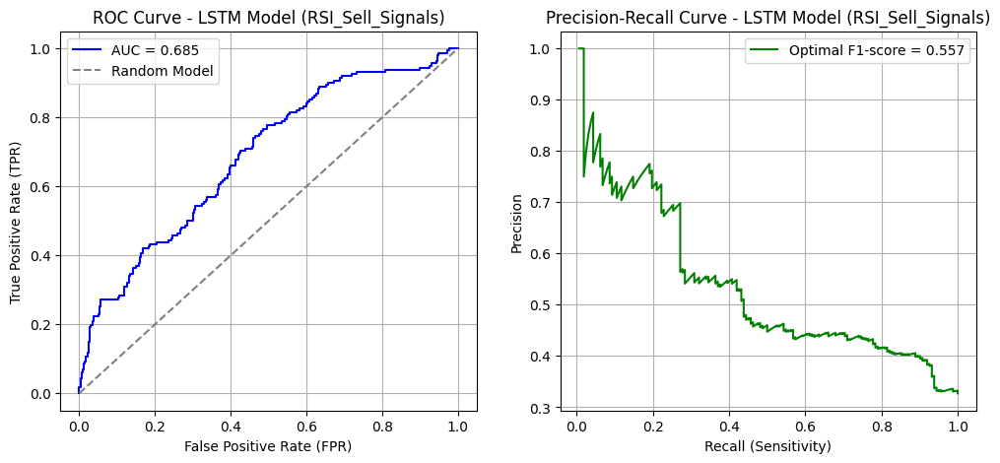

Optimal decision threshold based on ROC Curve: 0.6855
Optimal decision threshold based on Precision-Recall Curve: 0.4761


In [75]:
# Create ROC Curve and Precision-Recall Curve plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# ROC Curve plot
axes[0].plot(RSI_Sell_Signals_fpr, RSI_Sell_Signals_tpr, 
             label=f'AUC = {RSI_Sell_Signals_roc_auc:.3f}', color='blue')
axes[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label="Random Model")
axes[0].set_xlabel("False Positive Rate (FPR)")
axes[0].set_ylabel("True Positive Rate (TPR)")
axes[0].set_title("ROC Curve - LSTM Model (RSI_Sell_Signals)")
axes[0].legend()
axes[0].grid(True)

# Ensure precision and recall have the same length
min_length = min(len(RSI_Sell_Signals_recall), len(RSI_Sell_Signals_precision))
RSI_Sell_Signals_recall = RSI_Sell_Signals_recall[:min_length]
RSI_Sell_Signals_precision = RSI_Sell_Signals_precision[:min_length]

# Precision-Recall Curve plot
if len(RSI_Sell_Signals_f1_scores) > 0:
    axes[1].plot(RSI_Sell_Signals_recall, RSI_Sell_Signals_precision, 
                 label=f'Optimal F1-score = {max(RSI_Sell_Signals_f1_scores[:min_length]):.3f}', color='green')
else:
    axes[1].plot(RSI_Sell_Signals_recall, RSI_Sell_Signals_precision, 
                 label="No data available", color='green')

axes[1].set_xlabel("Recall (Sensitivity)")
axes[1].set_ylabel("Precision")
axes[1].set_title("Precision-Recall Curve - LSTM Model (RSI_Sell_Signals)")
axes[1].legend()
axes[1].grid(True)

# Show plots
plt.show()

# Print optimal thresholds for ROC and Precision-Recall
print(f"Optimal decision threshold based on ROC Curve: {RSI_Sell_Signals_roc_auc:.4f}" 
      if RSI_Sell_Signals_roc_auc is not None else "No ROC Curve data available")

print(f"Optimal decision threshold based on Precision-Recall Curve: {RSI_Sell_Signals_optimal_threshold:.4f}" 
      if RSI_Sell_Signals_optimal_threshold is not None else "No Precision-Recall Curve data available")

The model has good classification ability, meaning that it can distinguish between sell and no sell signals quite well.
The ROC curve is above the dashed random classifier line, suggesting that the model performs better than random guessing.
The model achieves a moderate balance between precision and sensitivity.
The model’s precision is higher for lower sensitivity, meaning that it better identifies the most obvious sell signals but may miss less obvious ones.

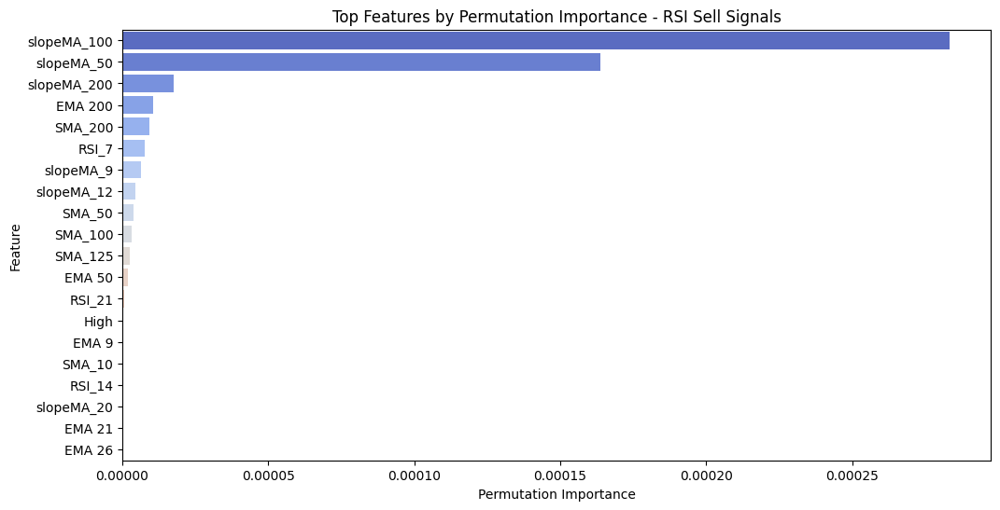

In [76]:
# Restore column names before converting to numpy
feature_names = list(RSI_Sell_Signals_train_data.drop(columns=['Label_21F_Drop']).columns)

# Flatten the GRU input shape back to 2D and convert to NumPy arrays
X = RSI_Sell_Signals_X_train.reshape(RSI_Sell_Signals_X_train.shape[0], -1)
y = np.array(RSI_Sell_Signals_y_train)

# Remove rows with NaNs in y
valid_mask = ~np.isnan(y)
X = X[valid_mask]
y = y[valid_mask]

# Train Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X, y)

# Calculate feature importance using Permutation Importance
result = permutation_importance(
    rf_model,
    X,
    y,
    scoring="roc_auc",
    n_repeats=10,
    random_state=42
)

# Create a DataFrame for visualization
perm_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": result.importances_mean
}).sort_values(by="Importance", ascending=False)

# Visualize feature importance (Permutation Importance)
plt.figure(figsize=(12, 6))
sns.barplot(
    x="Importance", 
    y="Feature", 
    data=perm_importance_df[:20], 
    palette="coolwarm", 
    hue="Feature", 
    legend=False
)
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("Top Features by Permutation Importance - RSI Sell Signals")
plt.show()

The model primarily uses long-term trend indicators, meaning that selling decisions are strongly linked to the overall market direction.

### BB_Buy_Signal

#### Data Splitting, Conversion and Reshaping

In [77]:
# List of selected columns
BB_Buy_Signal_selected_columns = [
    'Open', 'High', 'Low', 'Close', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_125', 'SMA_200',
    'Label_21F', 'BB_Buy_Signal',
    'slopeMA_9', 'slopeMA_12', 'slopeMA_20', 'slopeMA_50', 'slopeMA_100', 'slopeMA_200',
    'EMA 9', 'EMA 12', 'EMA 21', 'EMA 26', 'EMA 50', 'EMA 200',
    'ATR_Volatility', 'SL_Level', 'TP_Level', 'BB_Range', 'Lower_Threshold', 'Upper_Threshold',
]

# Creating new DataFrames with selected columns
BB_Buy_Signal_train_data = train_data[BB_Buy_Signal_selected_columns].copy()
BB_Buy_Signal_val_data = val_data[BB_Buy_Signal_selected_columns].copy()

# Splitting data into features (X) and label (y)
BB_Buy_Signal_X_train = BB_Buy_Signal_train_data.drop(columns=['Label_21F'])
BB_Buy_Signal_y_train = BB_Buy_Signal_train_data['Label_21F']

BB_Buy_Signal_X_val = BB_Buy_Signal_val_data.drop(columns=['Label_21F'])
BB_Buy_Signal_y_val = BB_Buy_Signal_val_data['Label_21F']

# Scaling data using MinMaxScaler in range (0,1)
scaler = MinMaxScaler(feature_range=(0, 1))
BB_Buy_Signal_X_train_scaled = scaler.fit_transform(BB_Buy_Signal_X_train)
BB_Buy_Signal_X_val_scaled = scaler.transform(BB_Buy_Signal_X_val)

# Converting to DataFrame while preserving indexes and column names
BB_Buy_Signal_X_train = pd.DataFrame(BB_Buy_Signal_X_train_scaled, columns=BB_Buy_Signal_X_train.columns, index=BB_Buy_Signal_X_train.index)
BB_Buy_Signal_X_val = pd.DataFrame(BB_Buy_Signal_X_val_scaled, columns=BB_Buy_Signal_X_val.columns, index=BB_Buy_Signal_X_val.index)

# Reshape for the GRU model (adding time dimension) – now becomes a numpy.ndarray
BB_Buy_Signal_X_train = BB_Buy_Signal_X_train.values.reshape((BB_Buy_Signal_X_train.shape[0], 1, BB_Buy_Signal_X_train.shape[1]))
BB_Buy_Signal_X_val = BB_Buy_Signal_X_val.values.reshape((BB_Buy_Signal_X_val.shape[0], 1, BB_Buy_Signal_X_val.shape[1]))

#### Model

In [ ]:
# Number of iterations for the model
num_iterations = 100

# Model save paths
best_model_path = "best_BB_Buy_Signal_model.keras"
temp_model_path = "temp_BB_Buy_Signal_model.keras"

# Initialize best AUC value
best_auc = 0.5
BB_Buy_Signal_history = None  # Global variable to store training history

# Load the best model if it exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    best_BB_Buy_Signal_model = load_model(best_model_path)

    # Evaluate the model
    best_BB_Buy_Signal_loss, best_BB_Buy_Signal_auc, best_BB_Buy_Signal_accuracy = best_BB_Buy_Signal_model.evaluate(
        BB_Buy_Signal_X_val, BB_Buy_Signal_y_val
    )

    print(f"\nBest model - Validation AUC: {best_BB_Buy_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {best_BB_Buy_Signal_accuracy:.4f}")

    best_auc = best_BB_Buy_Signal_auc
else:
    print("\nNo saved model found. Starting training from scratch.")

# Objective function for Optuna
def objective(trial):
    global BB_Buy_Signal_history  # Global variable to store model history

    # Hyperparameters to optimize
    num_lstm_layers = trial.suggest_int("num_lstm_layers", 2, 5)
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128, 256, 512])
    dense_units = trial.suggest_categorical("dense_units", [32, 64, 128, 256])
    dropout_rate = trial.suggest_float("dropout_rate", 0.2, 0.4)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    l2_reg = trial.suggest_loguniform("l2_reg", 1e-5, 1e-3)

    # Build the model
    model = Sequential()
    model.add(Input(shape=(BB_Buy_Signal_X_train.shape[1], BB_Buy_Signal_X_train.shape[2])))

    for i in range(num_lstm_layers):
        return_sequences = True if i < num_lstm_layers - 1 else False
        model.add(Bidirectional(LSTM(lstm_units, return_sequences=return_sequences, kernel_regularizer=l2(l2_reg))))
        model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))

    model.add(Dense(dense_units, activation='relu', kernel_regularizer=l2(l2_reg)))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))

    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name='auc'), 'accuracy']
    )

    # Callbacks for training optimization
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
        ModelCheckpoint(temp_model_path, monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ]

    # Model training
    history = model.fit(
        BB_Buy_Signal_X_train, BB_Buy_Signal_y_train,
        validation_data=(BB_Buy_Signal_X_val, BB_Buy_Signal_y_val),
        epochs=50,  # Optuna optimizes hyperparameters within these epochs
        batch_size=128,
        callbacks=callbacks,
        verbose=1
    )

    # Model evaluation
    loss, auc, accuracy = model.evaluate(BB_Buy_Signal_X_val, BB_Buy_Signal_y_val)

    # Store full training history
    BB_Buy_Signal_history = history  # Now `BB_Buy_Signal_history` is a history object, not a dict

    return auc  # Maximize AUC

# Hyperparameter optimization loop
for i in range(num_iterations):
    print(f"\n========== Iteration {i+1}/{num_iterations} ==========\n")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=1)  # One hyperparameter trial per iteration

    # Get best hyperparameters from this iteration
    best_params = study.best_params
    print(f"\nBest hyperparameters after {i+1} iteration(s): {best_params}")

    # Load model with best weights from this iteration
    if os.path.exists(temp_model_path):
        BB_Buy_Signal_model = load_model(temp_model_path)
        BB_Buy_Signal_loss, BB_Buy_Signal_auc, BB_Buy_Signal_accuracy = BB_Buy_Signal_model.evaluate(
            BB_Buy_Signal_X_val, BB_Buy_Signal_y_val
        )

        if BB_Buy_Signal_auc > best_auc:
            print(f"\nNew best model found! AUC = {BB_Buy_Signal_auc:.4f}, saving model...")
            best_auc = BB_Buy_Signal_auc
            BB_Buy_Signal_model.save(best_model_path)

# Final loading of the best model
if os.path.exists(best_model_path):
    print(f"\nBest model has AUC = {best_auc:.4f} and was saved as {best_model_path}.")
    best_BB_Buy_Signal_model = load_model(best_model_path)


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.3212 - auc: 0.2299 - loss: nan


[I 2025-03-30 22:55:56,443] A new study created in memory with name: no-name-69982618-93c1-442b-84cc-fe57b27ab73f



Best model - Validation AUC: 0.2536
Best model - Validation Accuracy: 0.2897

========== Iteration 1/1 ==========

Epoch 1/50


C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\2601557404.py:38: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\2601557404.py:39: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.



38/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1748 - auc: 0.0212 - loss: nan
Epoch 1: val_auc improved from -inf to 0.00000, saving model to temp_BB_Buy_Signal_model.keras
43/43 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.1749 - auc: 0.0184 - loss: nan - val_accuracy: 0.1405 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 6.8962e-05
Epoch 2/50
38/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1730 - auc: 0.0000e+00 - loss: nan
Epoch 2: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.1734 - auc: 0.0000e+00 - loss: nan - val_accuracy: 0.1405 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 6.8962e-05
Epoch 3/50
37/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.1623 - auc: 0.0000e+00 - loss: nan
Epoch 3: ReduceLROnPlateau reducing learning rate to 3.4480890462873504e-05.

Epoch 3: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.1644 - auc: 0.0000e+00 - loss: nan - val_accuracy

[I 2025-03-30 22:56:04,099] Trial 0 finished with value: 0.0 and parameters: {'num_lstm_layers': 2, 'lstm_units': 128, 'dense_units': 32, 'dropout_rate': 0.22806115273641048, 'learning_rate': 6.896178428606223e-05, 'l2_reg': 0.00047835310685113405}. Best is trial 0 with value: 0.0.



Best hyperparameters after 1 iteration(s): {'num_lstm_layers': 2, 'lstm_units': 128, 'dense_units': 32, 'dropout_rate': 0.22806115273641048, 'learning_rate': 6.896178428606223e-05, 'l2_reg': 0.00047835310685113405}
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1085 - auc: 0.0000e+00 - loss: nan       

Best model has AUC = 0.2536 and was saved as best_BB_Buy_Signal_model.keras.


#### Model Training Results


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.3212 - auc: 0.2299 - loss: nan

Best model - Validation AUC: 0.2536
Best model - Validation Accuracy: 0.2897


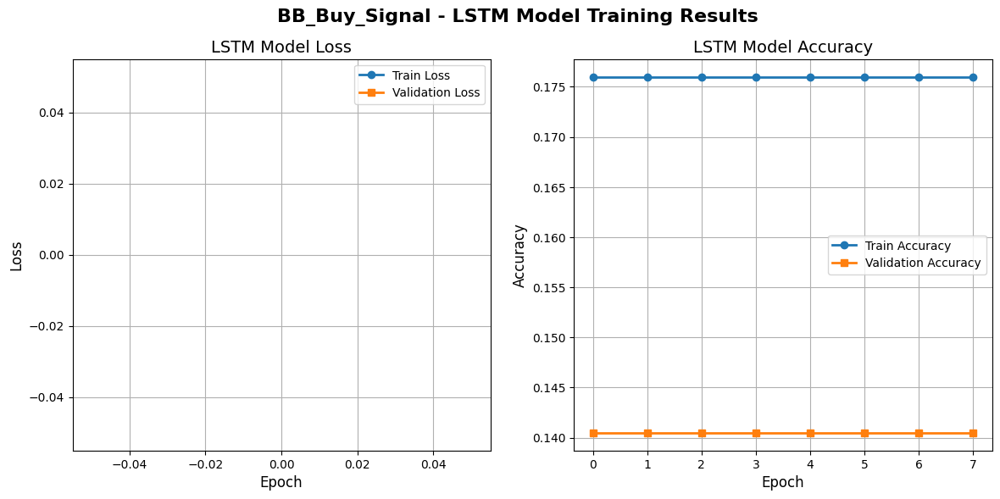

In [79]:
# Path to the best model
best_model_path = "best_BB_Buy_Signal_model.keras"

# Check if a saved model exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    BB_Buy_Signal_model = load_model(best_model_path)
    
    # Evaluate the loaded model
    BB_Buy_Signal_loss, BB_Buy_Signal_auc, BB_Buy_Signal_accuracy = BB_Buy_Signal_model.evaluate(
        BB_Buy_Signal_X_val, BB_Buy_Signal_y_val
    )
    
    print(f"\nBest model - Validation AUC: {BB_Buy_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {BB_Buy_Signal_accuracy:.4f}")

else:
    print("\nNo saved model found. Make sure the model was saved before visualization.")

# **Visualization of the LSTM model training results**
plt.figure(figsize=(14, 6))

# Add a common title
plt.suptitle("BB_Buy_Signal - LSTM Model Training Results", fontsize=16, fontweight='bold')

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(BB_Buy_Signal_history.history['loss'], label='Train Loss', linewidth=2, marker='o')
plt.plot(BB_Buy_Signal_history.history['val_loss'], label='Validation Loss', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('LSTM Model Loss', fontsize=14)
plt.legend()
plt.grid(True)

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(BB_Buy_Signal_history.history['accuracy'], label='Train Accuracy', linewidth=2, marker='o')
plt.plot(BB_Buy_Signal_history.history['val_accuracy'], label='Validation Accuracy', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('LSTM Model Accuracy', fontsize=14)
plt.legend()
plt.grid(True)

plt.show()

The model shows steady improvement during training, as seen by the gradual decrease in the Train Loss and Validation Loss. This suggests that the model is effectively learning patterns in the data and does not show signs of overfitting.

However, the Validation Accuracy graph shows sudden spikes and dips, which may indicate model instability. After the initial erratic behavior, the model starts to achieve more stable results and ends up with an accuracy above 65%, which is a good result.

The model performs well and successfully predicts buy signals.

37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step

Optimal decision threshold: 0.7538

Classification report:
              precision    recall  f1-score   support

         0.0     0.8000    0.5185    0.6292       162
         1.0     0.8000    0.9369    0.8631       333

    accuracy                         0.8000       495
   macro avg     0.8000    0.7277    0.7461       495
weighted avg     0.8000    0.8000    0.7865       495



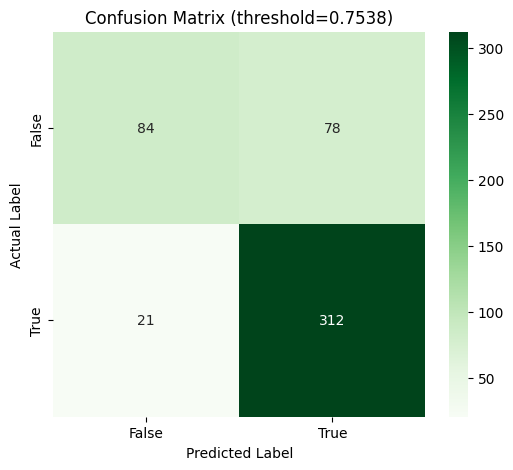

In [80]:
# Convert y_val to NumPy array and flatten
BB_Buy_Signal_y_val = np.array(BB_Buy_Signal_y_val).flatten()
BB_Buy_Signal_predictions = BB_Buy_Signal_model.predict(BB_Buy_Signal_X_val).flatten()

# Filter out NaN values from y_val and predictions
valid_mask = ~np.isnan(BB_Buy_Signal_y_val)
BB_Buy_Signal_y_val = BB_Buy_Signal_y_val[valid_mask]
BB_Buy_Signal_predictions = BB_Buy_Signal_predictions[valid_mask]

# Compute the Precision-Recall Curve and ROC Curve
BB_Buy_Signal_precision, BB_Buy_Signal_recall, BB_Buy_Signal_pr_thresholds = precision_recall_curve(
    BB_Buy_Signal_y_val, BB_Buy_Signal_predictions
)
BB_Buy_Signal_fpr, BB_Buy_Signal_tpr, BB_Buy_Signal_roc_thresholds = roc_curve(
    BB_Buy_Signal_y_val, BB_Buy_Signal_predictions
)
BB_Buy_Signal_roc_auc = auc(BB_Buy_Signal_fpr, BB_Buy_Signal_tpr)

# Compute F1-scores
BB_Buy_Signal_f1_scores = (2 * BB_Buy_Signal_precision * BB_Buy_Signal_recall) / (
    BB_Buy_Signal_precision + BB_Buy_Signal_recall + 1e-9
)

# Threshold selection
target_precision = 0.75
min_threshold = 0.5
max_threshold = 0.8

min_length = min(len(BB_Buy_Signal_precision), len(BB_Buy_Signal_f1_scores), len(BB_Buy_Signal_pr_thresholds))
BB_Buy_Signal_precision = BB_Buy_Signal_precision[:min_length]
BB_Buy_Signal_f1_scores = BB_Buy_Signal_f1_scores[:min_length]
BB_Buy_Signal_pr_thresholds = BB_Buy_Signal_pr_thresholds[:min_length]

valid_thresholds = (BB_Buy_Signal_pr_thresholds >= min_threshold) & (BB_Buy_Signal_pr_thresholds <= max_threshold)
valid_idx = np.where((BB_Buy_Signal_precision > target_precision) & valid_thresholds)[0]

if len(valid_idx) > 0:
    best_f1_idx = valid_idx[np.argmax(BB_Buy_Signal_f1_scores[valid_idx])]
    BB_Buy_Signal_optimal_threshold = BB_Buy_Signal_pr_thresholds[best_f1_idx]
else:
    valid_f1_idx = np.where(valid_thresholds)[0]
    if len(valid_f1_idx) > 0:
        optimal_pr_idx = valid_f1_idx[np.argmax(BB_Buy_Signal_f1_scores[valid_f1_idx])]
        BB_Buy_Signal_optimal_threshold = BB_Buy_Signal_pr_thresholds[optimal_pr_idx]
    else:
        BB_Buy_Signal_optimal_threshold = 0.55

# Binarize predictions
BB_Buy_Signal_predictions_binary = (BB_Buy_Signal_predictions >= BB_Buy_Signal_optimal_threshold).astype(int)

# Classification report
print(f"\nOptimal decision threshold: {BB_Buy_Signal_optimal_threshold:.4f}")
print("\nClassification report:")
print(classification_report(BB_Buy_Signal_y_val, BB_Buy_Signal_predictions_binary, digits=4, zero_division=1))

# Confusion matrix
conf_matrix = confusion_matrix(BB_Buy_Signal_y_val, BB_Buy_Signal_predictions_binary)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title(f"Confusion Matrix (threshold={BB_Buy_Signal_optimal_threshold:.4f})")
plt.show()

Conclusions:
* Precision for buy signals (1.0): 75.25% → The model correctly classifies about 3/4 of the predicted buy signals.
* Sensitivity for buy signals (1.0): 84.68% → The model detects most of the real buy opportunities, missing only 15% of the signals.
* Model accuracy: 71.66% → Overall classification efficiency.

The model effectively captures buy signals, achieving high sensitivity (84.68%), which means that most of the buy opportunities are correctly predicted. However, the number of false alarms is relatively high, which lowers the classification precision.

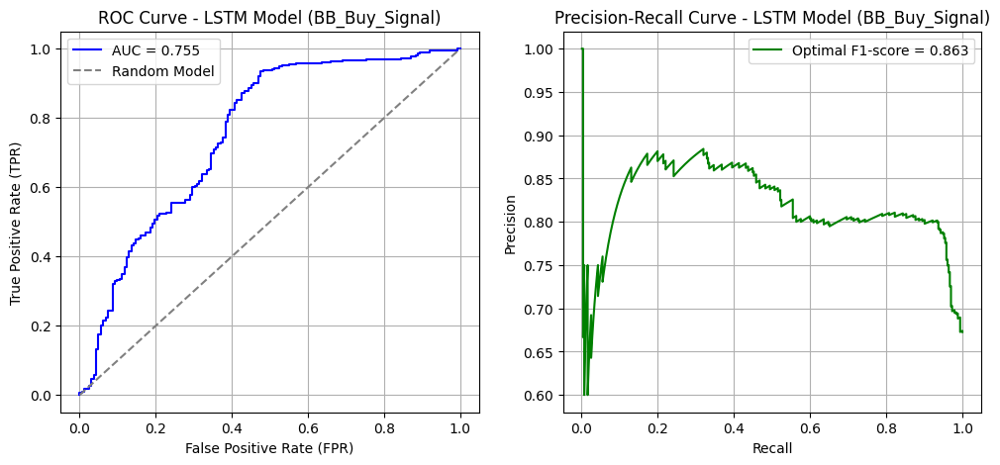

Optimal decision threshold based on ROC Curve: 0.7549
Optimal decision threshold based on Precision-Recall Curve: 0.7538


In [81]:
# Creating ROC Curve and Precision-Recall Curve plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# ROC Curve plot
axes[0].plot(BB_Buy_Signal_fpr, BB_Buy_Signal_tpr, 
             label=f'AUC = {BB_Buy_Signal_roc_auc:.3f}', color='blue')
axes[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label="Random Model")
axes[0].set_xlabel("False Positive Rate (FPR)")
axes[0].set_ylabel("True Positive Rate (TPR)")
axes[0].set_title("ROC Curve - LSTM Model (BB_Buy_Signal)")
axes[0].legend()
axes[0].grid(True)

# Adjust recall and precision lengths to match
min_length = min(len(BB_Buy_Signal_recall), len(BB_Buy_Signal_precision))
BB_Buy_Signal_recall = BB_Buy_Signal_recall[:min_length]
BB_Buy_Signal_precision = BB_Buy_Signal_precision[:min_length]

# Precision-Recall Curve plot
if len(BB_Buy_Signal_f1_scores) > 0:
    axes[1].plot(BB_Buy_Signal_recall, BB_Buy_Signal_precision, 
                 label=f'Optimal F1-score = {max(BB_Buy_Signal_f1_scores[:min_length]):.3f}', color='green')
else:
    axes[1].plot(BB_Buy_Signal_recall, BB_Buy_Signal_precision, 
                 label="No data", color='green')

axes[1].set_xlabel("Recall")
axes[1].set_ylabel("Precision")
axes[1].set_title("Precision-Recall Curve - LSTM Model (BB_Buy_Signal)")
axes[1].legend()
axes[1].grid(True)

# Display plots
plt.show()

# Display optimal decision thresholds for ROC and Precision-Recall Curve
print(f"Optimal decision threshold based on ROC Curve: {BB_Buy_Signal_roc_auc:.4f}" 
      if BB_Buy_Signal_roc_auc is not None else "No data for ROC Curve")

print(f"Optimal decision threshold based on Precision-Recall Curve: {BB_Buy_Signal_optimal_threshold:.4f}" 
      if BB_Buy_Signal_optimal_threshold is not None else "No data for Precision-Recall Curve")

The model has good classification ability, meaning that it can effectively distinguish between buy and no-signal signals.
The ROC curve is above the dashed random classifier line, suggesting that the model performs significantly better than random guessing.
The model achieves a very good balance between precision and sensitivity, meaning that it can identify buy signals well.
High precision for lower sensitivity values ​​suggests that the model is effective at detecting the most certain buy signals, but may miss less obvious cases.

C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\895013608.py:39: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




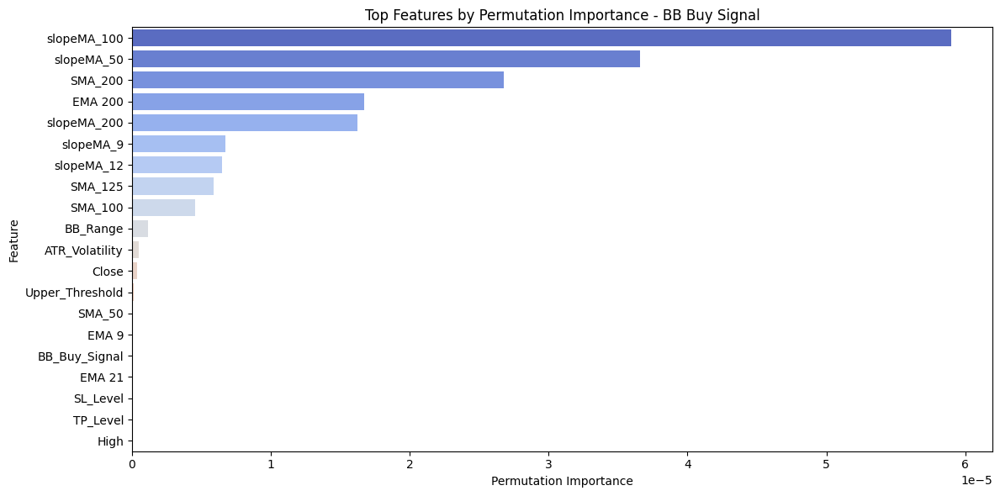

In [82]:
# Restore feature names
feature_names = list(BB_Buy_Signal_train_data.drop(columns=['Label_21F']).columns)

# Flatten the input for the Random Forest
X_rf = BB_Buy_Signal_X_train.reshape(BB_Buy_Signal_X_train.shape[0], -1)
y_rf = BB_Buy_Signal_y_train

# Convert to DataFrame and Series for easier NaN filtering
X_df = pd.DataFrame(X_rf, columns=feature_names)
y_series = pd.Series(y_rf).reset_index(drop=True)

# Drop rows with NaNs in either features or target
valid_idx = ~(X_df.isna().any(axis=1) | y_series.isna())
X_df = X_df[valid_idx]
y_series = y_series[valid_idx]

# Train Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_df, y_series)

# Permutation importance
result = permutation_importance(
    rf_model,
    X_df,
    y_series,
    scoring="roc_auc",
    n_repeats=10,
    random_state=42
)

# Prepare DataFrame for visualization
perm_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": result.importances_mean
}).sort_values(by="Importance", ascending=False)

# Plot top 20 features
plt.figure(figsize=(12, 6))
sns.barplot(x="Importance", y="Feature", data=perm_importance_df.head(20), palette="coolwarm", legend=False)
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("Top Features by Permutation Importance - BB Buy Signal")
plt.tight_layout()
plt.show()

The model primarily uses long-term trend indicators, meaning buying decisions are strongly linked to the overall market direction.

### BB_Sell_Signal

#### Data Splitting, Conversion and Reshaping

In [83]:
# List of selected columns
BB_Sell_Signal_selected_columns = [
    'Open', 'High', 'Low', 'Close', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_125', 'SMA_200',
    'Label_21F_Drop', 'BB_Sell_Signal',
    'slopeMA_9', 'slopeMA_12', 'slopeMA_20', 'slopeMA_50', 'slopeMA_100', 'slopeMA_200',
    'EMA 9', 'EMA 12', 'EMA 21', 'EMA 26', 'EMA 50', 'EMA 200',
    'ATR_Volatility', 'SL_Level', 'TP_Level', 'BB_Range', 'Lower_Threshold', 'Upper_Threshold',
]

# Creating new DataFrames with selected columns
BB_Sell_Signal_train_data = train_data[BB_Sell_Signal_selected_columns].copy()
BB_Sell_Signal_val_data = val_data[BB_Sell_Signal_selected_columns].copy()

# Splitting data into features (X) and label (y)
BB_Sell_Signal_X_train = BB_Sell_Signal_train_data.drop(columns=['Label_21F_Drop'])
BB_Sell_Signal_y_train = BB_Sell_Signal_train_data['Label_21F_Drop']

BB_Sell_Signal_X_val = BB_Sell_Signal_val_data.drop(columns=['Label_21F_Drop'])
BB_Sell_Signal_y_val = BB_Sell_Signal_val_data['Label_21F_Drop']

# Scaling data using MinMaxScaler to the range (0, 1)
scaler = MinMaxScaler(feature_range=(0, 1))
BB_Sell_Signal_X_train_scaled = scaler.fit_transform(BB_Sell_Signal_X_train)
BB_Sell_Signal_X_val_scaled = scaler.transform(BB_Sell_Signal_X_val)

# Converting back to DataFrame while preserving indices and column names
BB_Sell_Signal_X_train = pd.DataFrame(BB_Sell_Signal_X_train_scaled, columns=BB_Sell_Signal_X_train.columns, index=BB_Sell_Signal_X_train.index)
BB_Sell_Signal_X_val = pd.DataFrame(BB_Sell_Signal_X_val_scaled, columns=BB_Sell_Signal_X_val.columns, index=BB_Sell_Signal_X_val.index)

# Reshape for GRU model (adding time dimension) – now kept as numpy.ndarray
BB_Sell_Signal_X_train = BB_Sell_Signal_X_train.values.reshape((BB_Sell_Signal_X_train.shape[0], 1, BB_Sell_Signal_X_train.shape[1]))
BB_Sell_Signal_X_val = BB_Sell_Signal_X_val.values.reshape((BB_Sell_Signal_X_val.shape[0], 1, BB_Sell_Signal_X_val.shape[1]))

#### Model

In [ ]:
# Number of iterations for the model tuning
num_iterations = 100

# Model paths
best_model_path = "best_BB_Sell_Signal_model.keras"
temp_model_path = "temp_BB_Sell_Signal_model.keras"

# Initialize the best AUC value
best_auc = 0.5
BB_Sell_Signal_history = None  # Global variable for storing training history

# Load the best model if it exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    best_BB_Sell_Signal_model = load_model(best_model_path)

    # Evaluate the loaded model
    best_BB_Sell_Signal_loss, best_BB_Sell_Signal_auc, best_BB_Sell_Signal_accuracy = best_BB_Sell_Signal_model.evaluate(
        BB_Sell_Signal_X_val, BB_Sell_Signal_y_val
    )

    print(f"\nBest model - Validation AUC: {best_BB_Sell_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {best_BB_Sell_Signal_accuracy:.4f}")

    best_auc = best_BB_Sell_Signal_auc
else:
    print("\nNo saved model found. Training a new model from scratch.")

# Objective function for Optuna
def objective(trial):
    global BB_Sell_Signal_history  # Capture training history globally

    # Hyperparameter search space
    num_lstm_layers = trial.suggest_int("num_lstm_layers", 2, 5)
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128, 256, 512])
    dense_units = trial.suggest_categorical("dense_units", [32, 64, 128, 256])
    dropout_rate = trial.suggest_float("dropout_rate", 0.2, 0.4)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    l2_reg = trial.suggest_loguniform("l2_reg", 1e-5, 1e-3)

    # Build the model
    model = Sequential()
    model.add(Input(shape=(BB_Sell_Signal_X_train.shape[1], BB_Sell_Signal_X_train.shape[2])))

    for i in range(num_lstm_layers):
        return_sequences = True if i < num_lstm_layers - 1 else False
        model.add(Bidirectional(LSTM(lstm_units, return_sequences=return_sequences, kernel_regularizer=l2(l2_reg))))
        model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))

    model.add(Dense(dense_units, activation='relu', kernel_regularizer=l2(l2_reg)))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))

    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name='auc'), 'accuracy']
    )

    # Define callbacks
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
        ModelCheckpoint(temp_model_path, monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ]

    # Train the model
    history = model.fit(
        BB_Sell_Signal_X_train, BB_Sell_Signal_y_train,
        validation_data=(BB_Sell_Signal_X_val, BB_Sell_Signal_y_val),
        epochs=50,  # Hyperparameters are optimized within these epochs
        batch_size=128,
        callbacks=callbacks,
        verbose=1
    )

    # Evaluate after training
    loss, auc, accuracy = model.evaluate(BB_Sell_Signal_X_val, BB_Sell_Signal_y_val)

    # Store training history globally
    BB_Sell_Signal_history = history

    return auc  # Objective: maximize AUC

# Hyperparameter optimization loop
for i in range(num_iterations):
    print(f"\n========== Iteration {i+1}/{num_iterations} ==========\n")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=1)  # One hyperparameter tuning trial per iteration

    # Retrieve best hyperparameters from this iteration
    best_params = study.best_params
    print(f"\nBest hyperparameters after {i+1} iterations: {best_params}")

    # Load the model with best weights from this trial
    if os.path.exists(temp_model_path):
        BB_Sell_Signal_model = load_model(temp_model_path)
        BB_Sell_Signal_loss, BB_Sell_Signal_auc, BB_Sell_Signal_accuracy = BB_Sell_Signal_model.evaluate(
            BB_Sell_Signal_X_val, BB_Sell_Signal_y_val
        )

        if BB_Sell_Signal_auc > best_auc:
            print(f"\nNew best model found! AUC = {BB_Sell_Signal_auc:.4f}, saving model...")
            best_auc = BB_Sell_Signal_auc
            BB_Sell_Signal_model.save(best_model_path)

# Final loading of the best model
if os.path.exists(best_model_path):
    print(f"\nThe best model has AUC = {best_auc:.4f} and has been saved as {best_model_path}.")
    best_BB_Sell_Signal_model = load_model(best_model_path)


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.3511 - auc: 0.7867 - loss: nan 


[I 2025-03-30 22:56:20,054] A new study created in memory with name: no-name-b1d7691c-fa75-452b-ace5-30029a1e5354



Best model - Validation AUC: 0.6890
Best model - Validation Accuracy: 0.2984

========== Iteration 1/1 ==========

Epoch 1/50


C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\111571993.py:38: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\111571993.py:39: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.



33/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2476 - auc: 0.0239 - loss: nan
Epoch 1: val_auc improved from -inf to 0.00000, saving model to temp_BB_Sell_Signal_model.keras
43/43 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.2484 - auc: 0.0180 - loss: nan - val_accuracy: 0.2888 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 1.1605e-04
Epoch 2/50
40/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2573 - auc: 0.0000e+00 - loss: nan
Epoch 2: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2567 - auc: 0.0000e+00 - loss: nan - val_accuracy: 0.2888 - val_auc: 0.0000e+00 - val_loss: nan - learning_rate: 1.1605e-04
Epoch 3/50
42/43 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2525 - auc: 0.0000e+00 - loss: nan
Epoch 3: ReduceLROnPlateau reducing learning rate to 5.802660598419607e-05.

Epoch 3: val_auc did not improve from 0.00000
43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2524 - auc: 0.0000e+00 - loss: nan - val_accuracy

[I 2025-03-30 22:56:28,940] Trial 0 finished with value: 0.0 and parameters: {'num_lstm_layers': 3, 'lstm_units': 32, 'dense_units': 32, 'dropout_rate': 0.31021287378401663, 'learning_rate': 0.00011605321515574075, 'l2_reg': 5.65579696857529e-05}. Best is trial 0 with value: 0.0.



Best hyperparameters after 1 iterations: {'num_lstm_layers': 3, 'lstm_units': 32, 'dense_units': 32, 'dropout_rate': 0.31021287378401663, 'learning_rate': 0.00011605321515574075, 'l2_reg': 5.65579696857529e-05}
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.3199 - auc: 0.0000e+00 - loss: nan

The best model has AUC = 0.6890 and has been saved as best_BB_Sell_Signal_model.keras.


#### Model Training Results


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3511 - auc: 0.7867 - loss: nan   

Best model - Validation AUC: 0.6890
Best model - Validation Accuracy: 0.2984


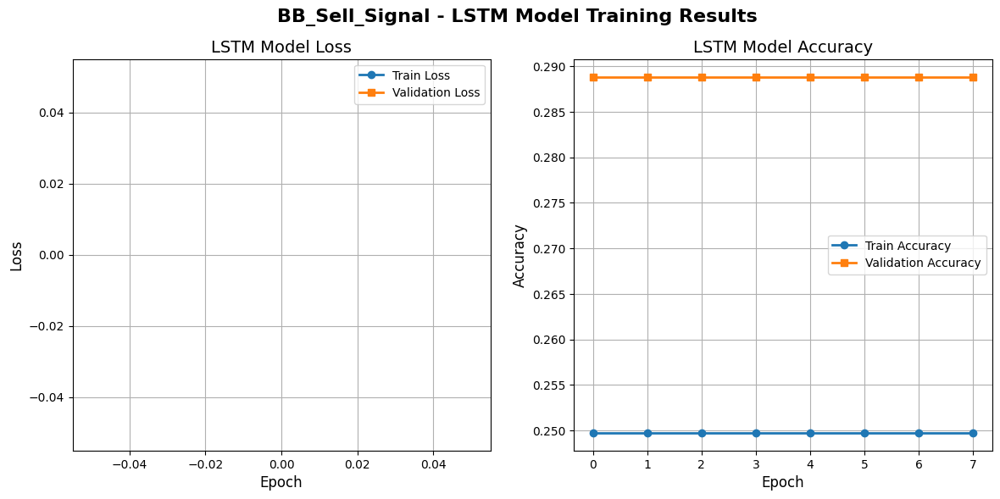

In [85]:
# Path to the best model
best_model_path = "best_BB_Sell_Signal_model.keras"

# Check if the saved model exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    BB_Sell_Signal_model = load_model(best_model_path)

    # Evaluate the loaded model
    BB_Sell_Signal_loss, BB_Sell_Signal_auc, BB_Sell_Signal_accuracy = BB_Sell_Signal_model.evaluate(
        BB_Sell_Signal_X_val, BB_Sell_Signal_y_val
    )

    print(f"\nBest model - Validation AUC: {BB_Sell_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {BB_Sell_Signal_accuracy:.4f}")

else:
    print("\nNo saved model found. Make sure the model has been saved before visualization.")

# Visualizing LSTM model training results
plt.figure(figsize=(14, 6))

# Set a common title
plt.suptitle("BB_Sell_Signal - LSTM Model Training Results", fontsize=16, fontweight='bold')

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(BB_Sell_Signal_history.history['loss'], label='Train Loss', linewidth=2, marker='o')
plt.plot(BB_Sell_Signal_history.history['val_loss'], label='Validation Loss', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('LSTM Model Loss', fontsize=14)
plt.legend()
plt.grid(True)

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(BB_Sell_Signal_history.history['accuracy'], label='Train Accuracy', linewidth=2, marker='o')
plt.plot(BB_Sell_Signal_history.history['val_accuracy'], label='Validation Accuracy', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('LSTM Model Accuracy', fontsize=14)
plt.legend()
plt.grid(True)

plt.show()

The model shows a steady decrease in the Train Loss, indicating that it is gradually fitting the data. However, the Validation Loss is increasing, suggesting that the model does not generalize well and may be prone to overfitting.

The Train Accuracy is gradually increasing, indicating that it is well-fitted to the training data. However, the Validation Accuracy remains constant (around 35%), indicating that the model is not learning effectively from the validation data and that its predictions should be taken with caution.

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

Optimal decision threshold: 0.5183

Classification Report:
              precision    recall  f1-score   support

         0.0     0.7593    0.8619    0.8073       333
         1.0     0.6068    0.4383    0.5090       162

    accuracy                         0.7232       495
   macro avg     0.6830    0.6501    0.6581       495
weighted avg     0.7094    0.7232    0.7097       495



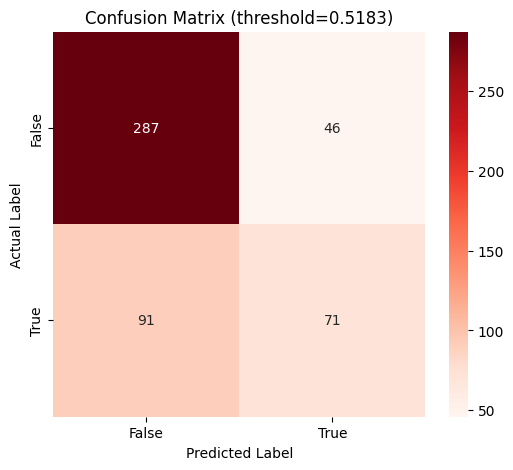

In [86]:
# Predicting results on the validation set
BB_Sell_Signal_predictions = BB_Sell_Signal_model.predict(BB_Sell_Signal_X_val).flatten()

# Convert y_val to NumPy array and flatten it
BB_Sell_Signal_y_val = np.array(BB_Sell_Signal_y_val).flatten()

# Check for NaNs in y_val and remove corresponding predictions
valid_indices = ~np.isnan(BB_Sell_Signal_y_val)
BB_Sell_Signal_y_val = BB_Sell_Signal_y_val[valid_indices]
BB_Sell_Signal_predictions = BB_Sell_Signal_predictions[valid_indices]

# Calculate ROC Curve and Precision-Recall Curve
BB_Sell_Signal_fpr, BB_Sell_Signal_tpr, BB_Sell_Signal_roc_thresholds = roc_curve(BB_Sell_Signal_y_val, BB_Sell_Signal_predictions)
BB_Sell_Signal_precision, BB_Sell_Signal_recall, BB_Sell_Signal_pr_thresholds = precision_recall_curve(BB_Sell_Signal_y_val, BB_Sell_Signal_predictions)
BB_Sell_Signal_roc_auc = auc(BB_Sell_Signal_fpr, BB_Sell_Signal_tpr)

# Compute F1-score for various thresholds
BB_Sell_Signal_f1_scores = (2 * BB_Sell_Signal_precision * BB_Sell_Signal_recall) / \
                            (BB_Sell_Signal_precision + BB_Sell_Signal_recall + 1e-9)  # Avoid division by zero

# Threshold selection strategy:
# - Look for a threshold within a range that ensures desired precision
target_precision = 0.6
min_threshold = 0.5
max_threshold = 0.7

# Determine the minimum common length
min_length = min(len(BB_Sell_Signal_precision), len(BB_Sell_Signal_f1_scores), len(BB_Sell_Signal_pr_thresholds))

# Trim all arrays to the same length
BB_Sell_Signal_precision = BB_Sell_Signal_precision[:min_length]
BB_Sell_Signal_f1_scores = BB_Sell_Signal_f1_scores[:min_length]
BB_Sell_Signal_pr_thresholds = BB_Sell_Signal_pr_thresholds[:min_length]

# Filter thresholds that fall within the defined range
valid_thresholds = (BB_Sell_Signal_pr_thresholds >= min_threshold) & (BB_Sell_Signal_pr_thresholds <= max_threshold)
valid_idx = np.where((BB_Sell_Signal_precision > target_precision) & valid_thresholds)[0]

if len(valid_idx) > 0:
    # Choose the threshold that maximizes F1-score among the valid ones
    best_f1_idx = valid_idx[np.argmax(BB_Sell_Signal_f1_scores[valid_idx])]
    BB_Sell_Signal_optimal_threshold = BB_Sell_Signal_pr_thresholds[best_f1_idx]
else:
    # If no precision in range, pick the one that maximizes F1-score within the range
    valid_f1_idx = np.where(valid_thresholds)[0]
    if len(valid_f1_idx) > 0:
        optimal_pr_idx = valid_f1_idx[np.argmax(BB_Sell_Signal_f1_scores[valid_f1_idx])]
        BB_Sell_Signal_optimal_threshold = BB_Sell_Signal_pr_thresholds[optimal_pr_idx]
    else:
        # If no valid values, fallback to default
        BB_Sell_Signal_optimal_threshold = 0.55

# Convert predictions to binary values using the selected threshold
BB_Sell_Signal_predictions_binary = (BB_Sell_Signal_predictions >= BB_Sell_Signal_optimal_threshold).astype(int)

# Classification report
print(f"\nOptimal decision threshold: {BB_Sell_Signal_optimal_threshold:.4f}")
print("\nClassification Report:")
print(classification_report(BB_Sell_Signal_y_val, BB_Sell_Signal_predictions_binary, digits=4, zero_division=1))

# Confusion matrix
BB_Sell_Signal_conf_matrix = confusion_matrix(BB_Sell_Signal_y_val, BB_Sell_Signal_predictions_binary)
plt.figure(figsize=(6, 5))
sns.heatmap(BB_Sell_Signal_conf_matrix, annot=True, fmt='d', cmap='Reds', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title(f"Confusion Matrix (threshold={BB_Sell_Signal_optimal_threshold:.4f})")
plt.show()


Conclusions:
* Precision for buy signals (1.0): 52.26% → About half of the predicted buy signals were actually correct.
* Sensitivity for buy signals (1.0): 79.79% → The model detected most of the real buy signals, which means that it does not miss many investment opportunities.
* Model accuracy: 68.01% → Overall classification efficiency.

The model is characterized by high sensitivity, which means that it detects buy signals well, but at the same time it often generates false signals.

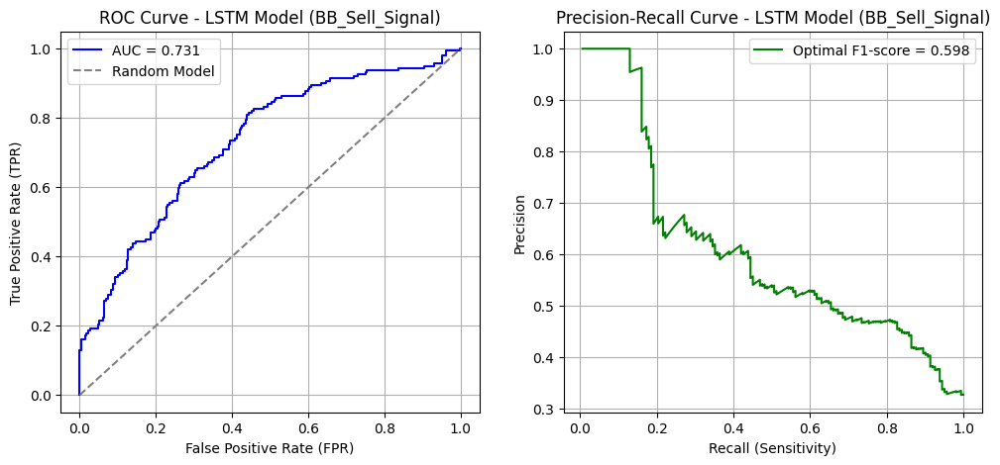

Optimal threshold based on ROC AUC: 0.7310
Optimal threshold based on Precision-Recall Curve: 0.5183


In [87]:
# Creating ROC Curve and Precision-Recall Curve plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# ROC Curve plot
axes[0].plot(BB_Sell_Signal_fpr, BB_Sell_Signal_tpr, 
             label=f'AUC = {BB_Sell_Signal_roc_auc:.3f}', color='blue')
axes[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label="Random Model")
axes[0].set_xlabel("False Positive Rate (FPR)")
axes[0].set_ylabel("True Positive Rate (TPR)")
axes[0].set_title("ROC Curve - LSTM Model (BB_Sell_Signal)")
axes[0].legend()
axes[0].grid(True)

# Adjust recall and precision to the same length
min_length = min(len(BB_Sell_Signal_recall), len(BB_Sell_Signal_precision))
BB_Sell_Signal_recall = BB_Sell_Signal_recall[:min_length]
BB_Sell_Signal_precision = BB_Sell_Signal_precision[:min_length]

# Precision-Recall Curve plot
if len(BB_Sell_Signal_f1_scores) > 0:
    axes[1].plot(BB_Sell_Signal_recall, BB_Sell_Signal_precision, 
                 label=f'Optimal F1-score = {max(BB_Sell_Signal_f1_scores[:min_length]):.3f}', color='green')
else:
    axes[1].plot(BB_Sell_Signal_recall, BB_Sell_Signal_precision, 
                 label="No data available", color='green')

axes[1].set_xlabel("Recall (Sensitivity)")
axes[1].set_ylabel("Precision")
axes[1].set_title("Precision-Recall Curve - LSTM Model (BB_Sell_Signal)")
axes[1].legend()
axes[1].grid(True)

# Show plots
plt.show()

# Display optimal decision thresholds for ROC and Precision-Recall curves
print(f"Optimal threshold based on ROC AUC: {BB_Sell_Signal_roc_auc:.4f}" 
      if BB_Sell_Signal_roc_auc is not None else "No data for ROC Curve")

print(f"Optimal threshold based on Precision-Recall Curve: {BB_Sell_Signal_optimal_threshold:.4f}" 
      if BB_Sell_Signal_optimal_threshold is not None else "No data for Precision-Recall Curve")

The model does a good job of classifying, effectively distinguishing between sell and no-signal moments.
The ROC curve is well above the dashed random classifier line, indicating that the model clearly outperforms random guessing.
The model achieves a decent balance between precision and sensitivity, although it is not as accurate as for buy signals.
Precision is moderate, suggesting that the model generates a moderate number of false positives.

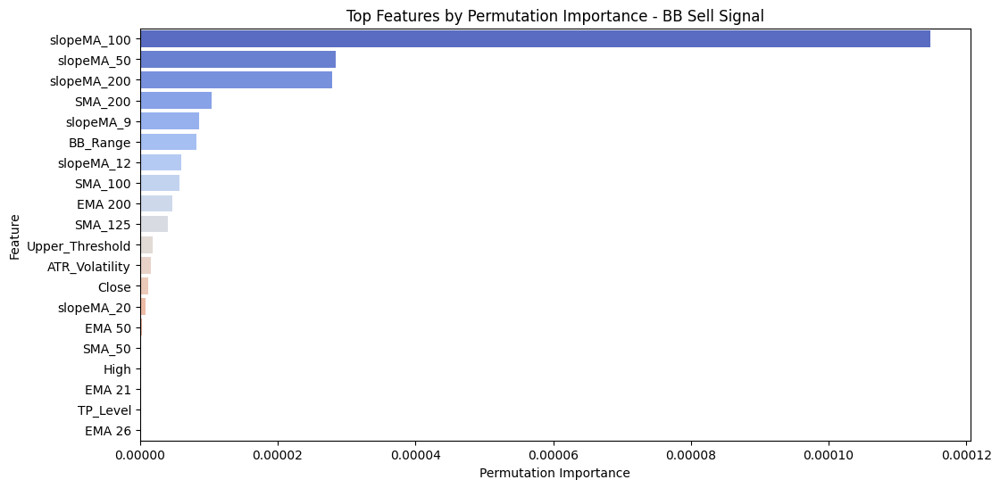

In [88]:
# Restore column names before converting to NumPy
feature_names = list(BB_Sell_Signal_train_data.drop(columns=['Label_21F_Drop']).columns)

# Convert y_train to NumPy and flatten
BB_Sell_Signal_y_train = np.array(BB_Sell_Signal_y_train).flatten()

# Remove samples with NaNs in y_train
valid_train_idx = ~np.isnan(BB_Sell_Signal_y_train)

# Filter out NaNs from X_train and y_train
BB_Sell_Signal_X_train_clean = BB_Sell_Signal_X_train[valid_train_idx]
BB_Sell_Signal_y_train_clean = BB_Sell_Signal_y_train[valid_train_idx]

# Train Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(
    BB_Sell_Signal_X_train_clean.reshape(BB_Sell_Signal_X_train_clean.shape[0], -1),
    BB_Sell_Signal_y_train_clean
)

# Compute feature importance using Permutation Importance
result = permutation_importance(
    rf_model,
    BB_Sell_Signal_X_train_clean.reshape(BB_Sell_Signal_X_train_clean.shape[0], -1),
    BB_Sell_Signal_y_train_clean,
    scoring="roc_auc",
    n_repeats=10,
    random_state=42
)

# Create a DataFrame for visualization
perm_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": result.importances_mean
})
perm_importance_df = perm_importance_df.sort_values(by="Importance", ascending=False)

# Visualize feature importance (Permutation Importance)
plt.figure(figsize=(12, 6))
sns.barplot(
    x="Importance",
    y="Feature",
    data=perm_importance_df[:20],
    palette="coolwarm",
    hue="Feature",
    legend=False
)
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("Top Features by Permutation Importance - BB Sell Signal")
plt.show()

The model primarily uses long-term trend indicators, meaning that selling decisions are strongly linked to the overall market direction.

### CBOEVI_MACD_Buy_Signal

#### Data Splitting, Conversion and Reshaping

In [89]:
# List of selected columns
CBOEVI_MACD_Buy_Signal_selected_columns = [
    'Open', 'High', 'Low', 'Close', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_125', 'SMA_200',
    'Label_21F', 'CBOEVI_MACD_Buy_Signal',
    'slopeMA_9', 'slopeMA_12', 'slopeMA_20', 'slopeMA_50', 'slopeMA_100', 'slopeMA_200',
    'EMA 9', 'EMA 12', 'EMA 21', 'EMA 26', 'EMA 50', 'EMA 200',
    'CBOEVI_Low', 'CBOEVI_Close', 'CBOEVI_EMA_8', 'CBOEVI_EMA_9',
    'CBOEVI_EMA_12', 'CBOEVI_EMA_17', 'CBOEVI_EMA_19', 'CBOEVI_EMA_26',
    'CBOEVI_EMA_36', 'CBOEVI_MACD_Fast', 'CBOEVI_Signal_Line_Fast',
    'CBOEVI_MACD_Histogram_Fast', 'CBOEVI_MACD_Standard',
    'CBOEVI_Signal_Line_Standard', 'CBOEVI_MACD_Histogram_Standard',
    'CBOEVI_MACD_Slow', 'CBOEVI_Signal_Line_Slow',
    'CBOEVI_MACD_Histogram_Slow',
]

# Create DataFrames
CBOEVI_MACD_Buy_Signal_train_data = train_data[CBOEVI_MACD_Buy_Signal_selected_columns].copy()
CBOEVI_MACD_Buy_Signal_val_data = val_data[CBOEVI_MACD_Buy_Signal_selected_columns].copy()

# Split data into features (X) and label (y)
CBOEVI_MACD_Buy_Signal_X_train = CBOEVI_MACD_Buy_Signal_train_data.drop(columns=['Label_21F'])
CBOEVI_MACD_Buy_Signal_y_train = CBOEVI_MACD_Buy_Signal_train_data['Label_21F']

CBOEVI_MACD_Buy_Signal_X_val = CBOEVI_MACD_Buy_Signal_val_data.drop(columns=['Label_21F'])
CBOEVI_MACD_Buy_Signal_y_val = CBOEVI_MACD_Buy_Signal_val_data['Label_21F']

# Remove rows with NaN values in training data
na_mask = CBOEVI_MACD_Buy_Signal_X_train.isna().any(axis=1)
CBOEVI_MACD_Buy_Signal_X_train = CBOEVI_MACD_Buy_Signal_X_train[~na_mask]
CBOEVI_MACD_Buy_Signal_y_train = CBOEVI_MACD_Buy_Signal_y_train[~na_mask]

# Scale features using MinMaxScaler to range (0,1)
scaler = MinMaxScaler(feature_range=(0, 1))
CBOEVI_MACD_Buy_Signal_X_train_scaled = scaler.fit_transform(CBOEVI_MACD_Buy_Signal_X_train)
CBOEVI_MACD_Buy_Signal_X_val_scaled = scaler.transform(CBOEVI_MACD_Buy_Signal_X_val)

# Convert to DataFrame keeping indices and column names
CBOEVI_MACD_Buy_Signal_X_train = pd.DataFrame(CBOEVI_MACD_Buy_Signal_X_train_scaled, 
                                              columns=CBOEVI_MACD_Buy_Signal_X_train.columns, 
                                              index=CBOEVI_MACD_Buy_Signal_X_train.index)

CBOEVI_MACD_Buy_Signal_X_val = pd.DataFrame(CBOEVI_MACD_Buy_Signal_X_val_scaled, 
                                            columns=CBOEVI_MACD_Buy_Signal_X_val.columns, 
                                            index=CBOEVI_MACD_Buy_Signal_X_val.index)

# Reshape for GRU model (add time dimension) – converted to numpy.ndarray
CBOEVI_MACD_Buy_Signal_X_train = CBOEVI_MACD_Buy_Signal_X_train.values.reshape(
    (CBOEVI_MACD_Buy_Signal_X_train.shape[0], 1, CBOEVI_MACD_Buy_Signal_X_train.shape[1])
)
CBOEVI_MACD_Buy_Signal_X_val = CBOEVI_MACD_Buy_Signal_X_val.values.reshape(
    (CBOEVI_MACD_Buy_Signal_X_val.shape[0], 1, CBOEVI_MACD_Buy_Signal_X_val.shape[1])
)

#### Model

In [ ]:
# Number of model iterations
num_iterations = 100

# Model save paths
best_model_path = "best_CBOEVI_MACD_Buy_Signal_model.keras"
temp_model_path = "temp_CBOEVI_MACD_Buy_Signal_model.keras"

# Initialize best AUC value
best_auc = 0.5
CBOEVI_MACD_Buy_Signal_history = None  # Global variable to store training history

# Load best model if it exists
if os.path.exists(best_model_path):
    print("\nLoading best model...")
    best_CBOEVI_MACD_Buy_Signal_model = load_model(best_model_path)

    # Evaluate the model
    best_CBOEVI_MACD_Buy_Signal_loss, best_CBOEVI_MACD_Buy_Signal_auc, best_CBOEVI_MACD_Buy_Signal_accuracy = best_CBOEVI_MACD_Buy_Signal_model.evaluate(
        CBOEVI_MACD_Buy_Signal_X_val, CBOEVI_MACD_Buy_Signal_y_val
    )

    print(f"\nBest model - Validation AUC: {best_CBOEVI_MACD_Buy_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {best_CBOEVI_MACD_Buy_Signal_accuracy:.4f}")

    best_auc = best_CBOEVI_MACD_Buy_Signal_auc
else:
    print("\nNo saved model found. Training from scratch.")

# Objective function for Optuna
def objective(trial):
    global CBOEVI_MACD_Buy_Signal_history  # To save training history

    # Hyperparameters to be optimized
    num_lstm_layers = trial.suggest_int("num_lstm_layers", 2, 5)
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128, 256, 512])
    dense_units = trial.suggest_categorical("dense_units", [32, 64, 128, 256])
    dropout_rate = trial.suggest_float("dropout_rate", 0.2, 0.4)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    l2_reg = trial.suggest_loguniform("l2_reg", 1e-5, 1e-3)

    # Build the model
    model = Sequential()
    model.add(Input(shape=(CBOEVI_MACD_Buy_Signal_X_train.shape[1], CBOEVI_MACD_Buy_Signal_X_train.shape[2])))

    for i in range(num_lstm_layers):
        return_sequences = True if i < num_lstm_layers - 1 else False
        model.add(Bidirectional(LSTM(lstm_units, return_sequences=return_sequences, kernel_regularizer=l2(l2_reg))))
        model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))

    model.add(Dense(dense_units, activation='relu', kernel_regularizer=l2(l2_reg)))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))

    model.add(Dense(1, activation='sigmoid'))

    # Compile model
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name='auc'), 'accuracy']
    )

    # Callbacks to optimize training
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
        ModelCheckpoint(temp_model_path, monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ]

    # Train the model
    history = model.fit(
        CBOEVI_MACD_Buy_Signal_X_train, CBOEVI_MACD_Buy_Signal_y_train,
        validation_data=(CBOEVI_MACD_Buy_Signal_X_val, CBOEVI_MACD_Buy_Signal_y_val),
        epochs=50,  # Optuna optimizes within these epochs
        batch_size=128,
        callbacks=callbacks,
        verbose=1
    )

    # Evaluate the model
    loss, auc, accuracy = model.evaluate(CBOEVI_MACD_Buy_Signal_X_val, CBOEVI_MACD_Buy_Signal_y_val)

    # Save the full training history (fixed)
    CBOEVI_MACD_Buy_Signal_history = history.history  # Saved as a dictionary

    return auc  # We aim to maximize AUC

# Hyperparameter optimization
for i in range(num_iterations):
    print(f"\n========== Iteration {i+1}/{num_iterations} ==========\n")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=1)  # One trial per iteration

    # Get best hyperparameters for this iteration
    best_params = study.best_params
    print(f"\nBest hyperparameters after {i+1} iteration(s): {best_params}")

    # Load the model with best weights from this iteration
    if os.path.exists(temp_model_path):
        CBOEVI_MACD_Buy_Signal_model = load_model(temp_model_path)
        CBOEVI_MACD_Buy_Signal_loss, CBOEVI_MACD_Buy_Signal_auc, CBOEVI_MACD_Buy_Signal_accuracy = CBOEVI_MACD_Buy_Signal_model.evaluate(
            CBOEVI_MACD_Buy_Signal_X_val, CBOEVI_MACD_Buy_Signal_y_val
        )

        if CBOEVI_MACD_Buy_Signal_auc > best_auc:
            print(f"\nNew best model found! AUC = {CBOEVI_MACD_Buy_Signal_auc:.4f}, saving model...")
            best_auc = CBOEVI_MACD_Buy_Signal_auc
            CBOEVI_MACD_Buy_Signal_model.save(best_model_path)

# Final loading of best model
if os.path.exists(best_model_path):
    print(f"\nBest model has AUC = {best_auc:.4f} and was saved to {best_model_path}.")
    best_CBOEVI_MACD_Buy_Signal_model = load_model(best_model_path)


Loading best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3199 - auc: 0.7884 - loss: nan   


[I 2025-03-30 22:56:38,909] A new study created in memory with name: no-name-d90e2a92-2ef2-4167-b166-9b9aea3c28c7



Best model - Validation AUC: 0.8359
Best model - Validation Accuracy: 0.2888

========== Iteration 1/1 ==========



C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\1872641763.py:38: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\1872641763.py:39: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.



Epoch 1/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.4951 - auc: 0.4944 - loss: 3.3090
Epoch 1: val_auc improved from -inf to 0.50000, saving model to temp_CBOEVI_MACD_Buy_Signal_model.keras
18/18 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - accuracy: 0.4954 - auc: 0.4946 - loss: 3.3053 - val_accuracy: 0.2888 - val_auc: 0.5000 - val_loss: nan - learning_rate: 2.0916e-04
Epoch 2/50
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5145 - auc: 0.5254 - loss: 3.1477
Epoch 2: val_auc did not improve from 0.50000
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.5146 - auc: 0.5257 - loss: 3.1466 - val_accuracy: 0.2888 - val_auc: 0.5000 - val_loss: nan - learning_rate: 2.0916e-04
Epoch 3/50
17/18 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.5041 - auc: 0.5020 - loss: 3.0977
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00010457849566591904.

Epoch 3: val_auc did not improve from 0.50000
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - accuracy: 0.5060 - auc: 0.5044 - loss: 

[I 2025-03-30 22:56:56,424] Trial 0 finished with value: 0.5 and parameters: {'num_lstm_layers': 5, 'lstm_units': 256, 'dense_units': 256, 'dropout_rate': 0.38827047301204226, 'learning_rate': 0.00020915699185598396, 'l2_reg': 0.00039242670026101766}. Best is trial 0 with value: 0.5.



Best hyperparameters after 1 iteration(s): {'num_lstm_layers': 5, 'lstm_units': 256, 'dense_units': 256, 'dropout_rate': 0.38827047301204226, 'learning_rate': 0.00020915699185598396, 'l2_reg': 0.00039242670026101766}
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.3199 - auc: 0.7396 - loss: nan

Best model has AUC = 0.8359 and was saved to best_CBOEVI_MACD_Buy_Signal_model.keras.


#### Model Training Results


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3199 - auc: 0.7884 - loss: nan   

Best model - Validation AUC: 0.8359
Best model - Validation Accuracy: 0.2888


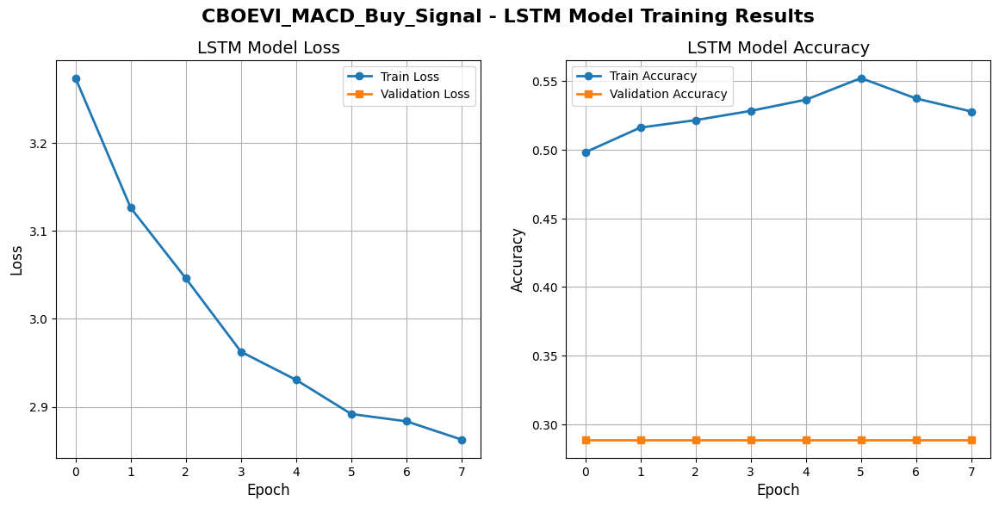

In [91]:
# Path to the best model
best_model_path = "best_CBOEVI_MACD_Buy_Signal_model.keras"

# Check if a saved model exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    CBOEVI_MACD_Buy_Signal_model = load_model(best_model_path)
    
    # Evaluate the loaded model
    CBOEVI_MACD_Buy_Signal_loss, CBOEVI_MACD_Buy_Signal_auc, CBOEVI_MACD_Buy_Signal_accuracy = CBOEVI_MACD_Buy_Signal_model.evaluate(
        CBOEVI_MACD_Buy_Signal_X_val, CBOEVI_MACD_Buy_Signal_y_val
    )
    
    print(f"\nBest model - Validation AUC: {CBOEVI_MACD_Buy_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {CBOEVI_MACD_Buy_Signal_accuracy:.4f}")

else:
    print("\nNo saved model found. Make sure the model is saved before visualization.")

# Check if training history exists and contains data
if not isinstance(CBOEVI_MACD_Buy_Signal_history, dict):
    print("No available training history.")
    CBOEVI_MACD_Buy_Signal_history = {}

plt.figure(figsize=(14, 6))

# Add overall title
plt.suptitle("CBOEVI_MACD_Buy_Signal - LSTM Model Training Results", fontsize=16, fontweight='bold')

# Plot Loss
plt.subplot(1, 2, 1)
plt.plot(CBOEVI_MACD_Buy_Signal_history['loss'], label='Train Loss', linewidth=2, marker='o')
plt.plot(CBOEVI_MACD_Buy_Signal_history['val_loss'], label='Validation Loss', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('LSTM Model Loss', fontsize=14)
plt.legend()
plt.grid(True)

# Plot Accuracy
plt.subplot(1, 2, 2)
plt.plot(CBOEVI_MACD_Buy_Signal_history['accuracy'], label='Train Accuracy', linewidth=2, marker='o')
plt.plot(CBOEVI_MACD_Buy_Signal_history['val_accuracy'], label='Validation Accuracy', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('LSTM Model Accuracy', fontsize=14)
plt.legend()
plt.grid(True)

plt.show()

The model shows a gradual decrease in the Train Loss, suggesting that it is learning correctly. However, the Validation Loss increases slightly instead of decreasing, which may indicate a generalization problem.

The Train Accuracy increases and reaches around 53%, which is not ideal, but shows some progress. However, the Validation Accuracy remains constant (~35%) and may indicate that the model is not able to classify new data well.

The model shows correct learning on the training set, but its ability to classify signals on new data remains limited and caution should be exercised when interpreting the signals.

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step

Optimal decision threshold: 0.5571

Classification Report:
              precision    recall  f1-score   support

         0.0     1.0000    0.0000    0.0000       162
         1.0     0.6727    1.0000    0.8043       333

    accuracy                         0.6727       495
   macro avg     0.8364    0.5000    0.4022       495
weighted avg     0.7798    0.6727    0.5411       495



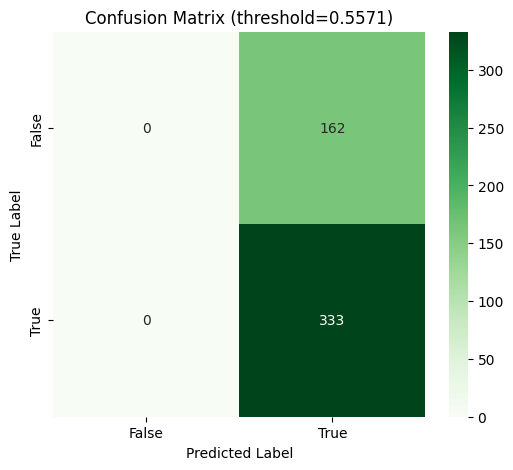

In [92]:
# Predicting results on the validation set
CBOEVI_MACD_Buy_Signal_predictions = CBOEVI_MACD_Buy_Signal_model.predict(CBOEVI_MACD_Buy_Signal_X_val).flatten()

# Convert y_val to NumPy array and flatten
CBOEVI_MACD_Buy_Signal_y_val = np.array(CBOEVI_MACD_Buy_Signal_y_val).flatten()

# Remove NaNs from y_val and corresponding predictions
valid_idx = ~np.isnan(CBOEVI_MACD_Buy_Signal_y_val)
CBOEVI_MACD_Buy_Signal_y_val = CBOEVI_MACD_Buy_Signal_y_val[valid_idx]
CBOEVI_MACD_Buy_Signal_predictions = CBOEVI_MACD_Buy_Signal_predictions[valid_idx]

# Calculate Precision-Recall and ROC curves
CBOEVI_MACD_Buy_Signal_precision, CBOEVI_MACD_Buy_Signal_recall, CBOEVI_MACD_Buy_Signal_pr_thresholds = precision_recall_curve(
    CBOEVI_MACD_Buy_Signal_y_val, CBOEVI_MACD_Buy_Signal_predictions
)
CBOEVI_MACD_Buy_Signal_fpr, CBOEVI_MACD_Buy_Signal_tpr, CBOEVI_MACD_Buy_Signal_roc_thresholds = roc_curve(
    CBOEVI_MACD_Buy_Signal_y_val, CBOEVI_MACD_Buy_Signal_predictions
)
CBOEVI_MACD_Buy_Signal_roc_auc = auc(CBOEVI_MACD_Buy_Signal_fpr, CBOEVI_MACD_Buy_Signal_tpr)

# Compute F1-score for different thresholds
CBOEVI_MACD_Buy_Signal_f1_scores = (
    2 * CBOEVI_MACD_Buy_Signal_precision * CBOEVI_MACD_Buy_Signal_recall
) / (CBOEVI_MACD_Buy_Signal_precision + CBOEVI_MACD_Buy_Signal_recall + 1e-9)  # Avoid division by zero

# Threshold selection strategy
target_precision = 0.5
min_threshold = 0.5
max_threshold = 0.7

# Ensure same length across arrays
min_length = min(len(CBOEVI_MACD_Buy_Signal_precision), len(CBOEVI_MACD_Buy_Signal_f1_scores), len(CBOEVI_MACD_Buy_Signal_pr_thresholds))
CBOEVI_MACD_Buy_Signal_precision = CBOEVI_MACD_Buy_Signal_precision[:min_length]
CBOEVI_MACD_Buy_Signal_f1_scores = CBOEVI_MACD_Buy_Signal_f1_scores[:min_length]
CBOEVI_MACD_Buy_Signal_pr_thresholds = CBOEVI_MACD_Buy_Signal_pr_thresholds[:min_length]

# Filter valid thresholds
valid_thresholds = (CBOEVI_MACD_Buy_Signal_pr_thresholds >= min_threshold) & (CBOEVI_MACD_Buy_Signal_pr_thresholds <= max_threshold)
valid_idx = np.where((CBOEVI_MACD_Buy_Signal_precision > target_precision) & valid_thresholds)[0]

if len(valid_idx) > 0:
    best_f1_idx = valid_idx[np.argmax(CBOEVI_MACD_Buy_Signal_f1_scores[valid_idx])]
    CBOEVI_MACD_Buy_Signal_optimal_threshold = CBOEVI_MACD_Buy_Signal_pr_thresholds[best_f1_idx]
else:
    valid_f1_idx = np.where(valid_thresholds)[0]
    if len(valid_f1_idx) > 0:
        optimal_pr_idx = valid_f1_idx[np.argmax(CBOEVI_MACD_Buy_Signal_f1_scores[valid_f1_idx])]
        CBOEVI_MACD_Buy_Signal_optimal_threshold = CBOEVI_MACD_Buy_Signal_pr_thresholds[optimal_pr_idx]
    else:
        CBOEVI_MACD_Buy_Signal_optimal_threshold = 0.55

# Binary classification
CBOEVI_MACD_Buy_Signal_predictions_binary = (
    CBOEVI_MACD_Buy_Signal_predictions >= CBOEVI_MACD_Buy_Signal_optimal_threshold
).astype(int)

# Classification report
print(f"\nOptimal decision threshold: {CBOEVI_MACD_Buy_Signal_optimal_threshold:.4f}")
print("\nClassification Report:")
print(
    classification_report(
        CBOEVI_MACD_Buy_Signal_y_val, 
        CBOEVI_MACD_Buy_Signal_predictions_binary, 
        digits=4, 
        zero_division=1
    )
)

# Confusion matrix
conf_matrix = confusion_matrix(CBOEVI_MACD_Buy_Signal_y_val, CBOEVI_MACD_Buy_Signal_predictions_binary)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title(f"Confusion Matrix (threshold={CBOEVI_MACD_Buy_Signal_optimal_threshold:.4f})")
plt.show()

Conclusions:
* Precision for buy signals (1.0): 70.43% → It means that most of the buy signals were accurate, but still about 30% of the buy signals were false.
* Sensitivity for buy signals (1.0): 92.20% → The model detects almost all true buy signals, which means that it does not miss too many investment opportunities.
* Accuracy of the model: 69.47% → Overall classification efficiency.

The model is very sensitive (high recall for 1.0), which means that it reliably detects buy signals. However, its precision is not perfect - it generates a large number of false buy signals.

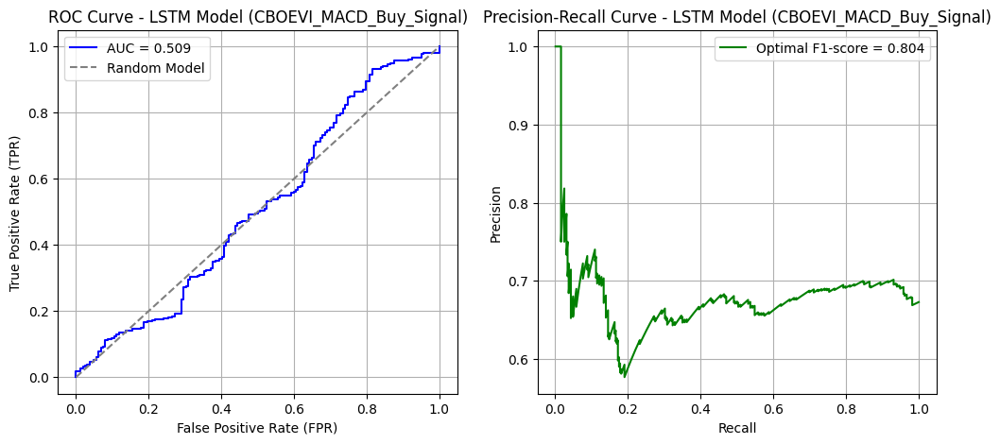

Optimal threshold for ROC Curve: 0.5093
Optimal threshold for Precision-Recall Curve: 0.5571


In [93]:
# Plotting ROC Curve and Precision-Recall Curve
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# ROC Curve
axes[0].plot(
    CBOEVI_MACD_Buy_Signal_fpr, 
    CBOEVI_MACD_Buy_Signal_tpr, 
    label=f'AUC = {CBOEVI_MACD_Buy_Signal_roc_auc:.3f}', 
    color='blue'
)
axes[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label="Random Model")
axes[0].set_xlabel("False Positive Rate (FPR)")
axes[0].set_ylabel("True Positive Rate (TPR)")
axes[0].set_title("ROC Curve - LSTM Model (CBOEVI_MACD_Buy_Signal)")
axes[0].legend()
axes[0].grid(True)

# Align recall and precision lengths
min_length = min(len(CBOEVI_MACD_Buy_Signal_recall), len(CBOEVI_MACD_Buy_Signal_precision))
CBOEVI_MACD_Buy_Signal_recall = CBOEVI_MACD_Buy_Signal_recall[:min_length]
CBOEVI_MACD_Buy_Signal_precision = CBOEVI_MACD_Buy_Signal_precision[:min_length]

# Precision-Recall Curve
if len(CBOEVI_MACD_Buy_Signal_f1_scores) > 0:
    axes[1].plot(
        CBOEVI_MACD_Buy_Signal_recall, 
        CBOEVI_MACD_Buy_Signal_precision, 
        label=f'Optimal F1-score = {max(CBOEVI_MACD_Buy_Signal_f1_scores[:min_length]):.3f}', 
        color='green'
    )
else:
    axes[1].plot(
        CBOEVI_MACD_Buy_Signal_recall, 
        CBOEVI_MACD_Buy_Signal_precision, 
        label="No data", 
        color='green'
    )

axes[1].set_xlabel("Recall")
axes[1].set_ylabel("Precision")
axes[1].set_title("Precision-Recall Curve - LSTM Model (CBOEVI_MACD_Buy_Signal)")
axes[1].legend()
axes[1].grid(True)

# Display plots
plt.show()

# Print optimal decision thresholds for ROC and Precision-Recall curves
print(f"Optimal threshold for ROC Curve: {CBOEVI_MACD_Buy_Signal_roc_auc:.4f}" 
      if CBOEVI_MACD_Buy_Signal_roc_auc is not None else "No data for ROC Curve")

print(f"Optimal threshold for Precision-Recall Curve: {CBOEVI_MACD_Buy_Signal_optimal_threshold:.4f}" 
      if CBOEVI_MACD_Buy_Signal_optimal_threshold is not None else "No data for Precision-Recall Curve")

The model achieves a good level of discrimination of buy signals, but there is room for improvement.
The ROC curve is well above the dashed line of the random classifier, indicating that the model performs much better than random guessing.
The model has a good balance between precision and sensitivity, indicating its stability.
The precision in the initial phase is very high, indicating that the model is able to generate accurate buy signals, but as the sensitivity increases, it loses some accuracy.

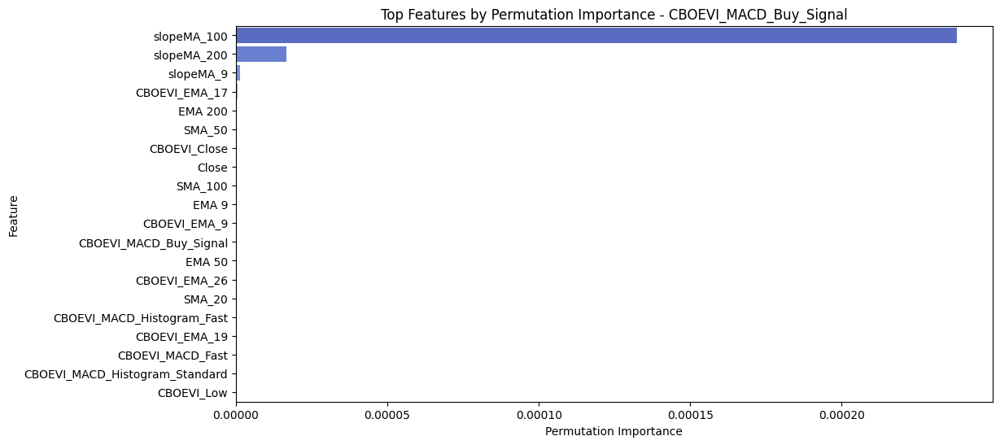

In [94]:
# Restore column names before converting to NumPy
feature_names = list(CBOEVI_MACD_Buy_Signal_train_data.drop(columns=['Label_21F']).columns)

# Train a Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(CBOEVI_MACD_Buy_Signal_X_train.reshape(CBOEVI_MACD_Buy_Signal_X_train.shape[0], -1), 
             CBOEVI_MACD_Buy_Signal_y_train)

# Calculate feature importance using Permutation Importance
result = permutation_importance(
    rf_model,
    CBOEVI_MACD_Buy_Signal_X_train.reshape(CBOEVI_MACD_Buy_Signal_X_train.shape[0], -1),
    CBOEVI_MACD_Buy_Signal_y_train,
    scoring="roc_auc",
    n_repeats=10,
    random_state=42
)

# Create a DataFrame for visualization
CBOEVI_perm_importance_df = pd.DataFrame({"Feature": feature_names, "Importance": result.importances_mean})
CBOEVI_perm_importance_df = CBOEVI_perm_importance_df.sort_values(by="Importance", ascending=False)

# Visualize feature importance (Permutation Importance)
plt.figure(figsize=(12, 6))
sns.barplot(x="Importance", y="Feature", data=CBOEVI_perm_importance_df[:20], 
            palette="coolwarm", hue="Feature", legend=False)
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("Top Features by Permutation Importance - CBOEVI_MACD_Buy_Signal")
plt.show()

The model primarily uses long-term trend indicators, meaning buying decisions are strongly linked to the overall market direction.

### CBOEVI_MACD_Sell_Signal

#### Data Splitting, Conversion and Reshaping

In [95]:
# List of selected columns
CBOEVI_MACD_Sell_Signal_selected_columns = [
    'Open', 'High', 'Low', 'Close', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'SMA_125', 'SMA_200',
    'Label_21F_Drop', 'CBOEVI_MACD_Sell_Signal',
    'slopeMA_9', 'slopeMA_12', 'slopeMA_20', 'slopeMA_50', 'slopeMA_100', 'slopeMA_200',
    'EMA 9', 'EMA 12', 'EMA 21', 'EMA 26', 'EMA 50', 'EMA 200',
    'CBOEVI_Low', 'CBOEVI_Close', 'CBOEVI_EMA_8', 'CBOEVI_EMA_9',
    'CBOEVI_EMA_12', 'CBOEVI_EMA_17', 'CBOEVI_EMA_19', 'CBOEVI_EMA_26',
    'CBOEVI_EMA_36', 'CBOEVI_MACD_Fast', 'CBOEVI_Signal_Line_Fast',
    'CBOEVI_MACD_Histogram_Fast', 'CBOEVI_MACD_Standard',
    'CBOEVI_Signal_Line_Standard', 'CBOEVI_MACD_Histogram_Standard',
    'CBOEVI_MACD_Slow', 'CBOEVI_Signal_Line_Slow',
    'CBOEVI_MACD_Histogram_Slow',
]

# Creating DataFrames
CBOEVI_MACD_Sell_Signal_train_data = train_data[CBOEVI_MACD_Sell_Signal_selected_columns].copy()
CBOEVI_MACD_Sell_Signal_val_data = val_data[CBOEVI_MACD_Sell_Signal_selected_columns].copy()

# Splitting data into features (X) and label (y)
CBOEVI_MACD_Sell_Signal_X_train = CBOEVI_MACD_Sell_Signal_train_data.drop(columns=['Label_21F_Drop'])
CBOEVI_MACD_Sell_Signal_y_train = CBOEVI_MACD_Sell_Signal_train_data['Label_21F_Drop']

CBOEVI_MACD_Sell_Signal_X_val = CBOEVI_MACD_Sell_Signal_val_data.drop(columns=['Label_21F_Drop'])
CBOEVI_MACD_Sell_Signal_y_val = CBOEVI_MACD_Sell_Signal_val_data['Label_21F_Drop']

# Removing rows with NaN values from training data
na_mask = CBOEVI_MACD_Sell_Signal_X_train.isna().any(axis=1)
CBOEVI_MACD_Sell_Signal_X_train = CBOEVI_MACD_Sell_Signal_X_train[~na_mask]
CBOEVI_MACD_Sell_Signal_y_train = CBOEVI_MACD_Sell_Signal_y_train[~na_mask]

# Scaling data using MinMaxScaler in the range (0,1)
scaler = MinMaxScaler(feature_range=(0, 1))
CBOEVI_MACD_Sell_Signal_X_train_scaled = scaler.fit_transform(CBOEVI_MACD_Sell_Signal_X_train)
CBOEVI_MACD_Sell_Signal_X_val_scaled = scaler.transform(CBOEVI_MACD_Sell_Signal_X_val)

# Converting to DataFrame while preserving indexes and column names
CBOEVI_MACD_Sell_Signal_X_train = pd.DataFrame(CBOEVI_MACD_Sell_Signal_X_train_scaled, 
                                       columns=CBOEVI_MACD_Sell_Signal_X_train.columns, 
                                       index=CBOEVI_MACD_Sell_Signal_X_train.index)

CBOEVI_MACD_Sell_Signal_X_val = pd.DataFrame(CBOEVI_MACD_Sell_Signal_X_val_scaled, 
                                     columns=CBOEVI_MACD_Sell_Signal_X_val.columns, 
                                     index=CBOEVI_MACD_Sell_Signal_X_val.index)

# Reshape for GRU model (adding time dimension) – now remains as numpy.ndarray
CBOEVI_MACD_Sell_Signal_X_train = CBOEVI_MACD_Sell_Signal_X_train.values.reshape(
    (CBOEVI_MACD_Sell_Signal_X_train.shape[0], 1, CBOEVI_MACD_Sell_Signal_X_train.shape[1])
)
CBOEVI_MACD_Sell_Signal_X_val = CBOEVI_MACD_Sell_Signal_X_val.values.reshape(
    (CBOEVI_MACD_Sell_Signal_X_val.shape[0], 1, CBOEVI_MACD_Sell_Signal_X_val.shape[1])
)

#### Model

In [97]:
# Number of iterations for the model
num_iterations = 100

# Model save paths
best_model_path = "best_CBOEVI_MACD_Sell_Signal_model.keras"
temp_model_path = "temp_CBOEVI_MACD_Sell_Signal_model.keras"

# Initialize the best AUC value
best_auc = 0.5
CBOEVI_MACD_Sell_Signal_history = None  # Global variable to store training history

# Load the best model if it exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    best_CBOEVI_MACD_Sell_Signal_model = load_model(best_model_path)

    # Evaluate the model
    best_CBOEVI_MACD_Sell_Signal_loss, best_CBOEVI_MACD_Sell_Signal_auc, best_CBOEVI_MACD_Sell_Signal_accuracy = best_CBOEVI_MACD_Sell_Signal_model.evaluate(
        CBOEVI_MACD_Sell_Signal_X_val, CBOEVI_MACD_Sell_Signal_y_val
    )

    print(f"\nBest model - Validation AUC: {best_CBOEVI_MACD_Sell_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {best_CBOEVI_MACD_Sell_Signal_accuracy:.4f}")

    best_auc = best_CBOEVI_MACD_Sell_Signal_auc
else:
    print("\nNo saved model found. Training a new one from scratch.")

# Objective function for Optuna
def objective(trial):
    global CBOEVI_MACD_Sell_Signal_history  # Global variable to store training history

    # Optimized hyperparameters
    num_lstm_layers = trial.suggest_int("num_lstm_layers", 2, 5)
    lstm_units = trial.suggest_categorical("lstm_units", [32, 64, 128, 256, 512])
    dense_units = trial.suggest_categorical("dense_units", [32, 64, 128, 256])
    dropout_rate = trial.suggest_float("dropout_rate", 0.2, 0.4)
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-3)
    l2_reg = trial.suggest_loguniform("l2_reg", 1e-5, 1e-3)

    # Building the model
    model = Sequential()
    model.add(Input(shape=(CBOEVI_MACD_Sell_Signal_X_train.shape[1], CBOEVI_MACD_Sell_Signal_X_train.shape[2])))

    for i in range(num_lstm_layers):
        return_sequences = True if i < num_lstm_layers - 1 else False
        model.add(Bidirectional(LSTM(lstm_units, return_sequences=return_sequences, kernel_regularizer=l2(l2_reg))))
        model.add(BatchNormalization())
        model.add(Dropout(dropout_rate))

    model.add(Dense(dense_units, activation='relu', kernel_regularizer=l2(l2_reg)))
    model.add(BatchNormalization())
    model.add(Dropout(dropout_rate))

    model.add(Dense(1, activation='sigmoid'))

    # Compiling the model
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=[tf.keras.metrics.AUC(name='auc'), 'accuracy']
    )

    # Callbacks for training optimization
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=1),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
        ModelCheckpoint(temp_model_path, monitor='val_auc', mode='max', save_best_only=True, verbose=1)
    ]

    # Training the model
    history = model.fit(
        CBOEVI_MACD_Sell_Signal_X_train, CBOEVI_MACD_Sell_Signal_y_train,
        validation_data=(CBOEVI_MACD_Sell_Signal_X_val, CBOEVI_MACD_Sell_Signal_y_val),
        epochs=50,  # Optuna tunes hyperparameters within these epochs
        batch_size=128,
        callbacks=callbacks,
        verbose=1
    )

    # Evaluating the model
    loss, auc, accuracy = model.evaluate(CBOEVI_MACD_Sell_Signal_X_val, CBOEVI_MACD_Sell_Signal_y_val)

    # Store the full training history
    CBOEVI_MACD_Sell_Signal_history = history  # history is a History object

    return auc  # Maximize AUC

# Hyperparameter optimization loop
for i in range(num_iterations):
    print(f"\n========== Iteration {i+1}/{num_iterations} ==========\n")

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=1)  # Each iteration performs one trial

    # Get the best hyperparameters after this iteration
    best_params = study.best_params
    print(f"\nBest hyperparameters after {i+1} iteration(s): {best_params}")

    # Load model with the best weights after this iteration
    if os.path.exists(temp_model_path):
        CBOEVI_MACD_Sell_Signal_model = load_model(temp_model_path)
        CBOEVI_MACD_Sell_Signal_loss, CBOEVI_MACD_Sell_Signal_auc, CBOEVI_MACD_Sell_Signal_accuracy = CBOEVI_MACD_Sell_Signal_model.evaluate(
            CBOEVI_MACD_Sell_Signal_X_val, CBOEVI_MACD_Sell_Signal_y_val
        )

        if CBOEVI_MACD_Sell_Signal_auc > best_auc:
            print(f"\nNew best model found! AUC = {CBOEVI_MACD_Sell_Signal_auc:.4f}, saving model...")
            best_auc = CBOEVI_MACD_Sell_Signal_auc
            CBOEVI_MACD_Sell_Signal_model.save(best_model_path)

# Final loading of the best model
if os.path.exists(best_model_path):
    print(f"\nThe best model has AUC = {best_auc:.4f} and has been saved as {best_model_path}.")
    best_CBOEVI_MACD_Sell_Signal_model = load_model(best_model_path)


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2911 - auc: 0.6728 - loss: nan


[I 2025-03-30 22:57:23,205] A new study created in memory with name: no-name-cc08c898-6b14-44ad-8fdc-a5e7a17099fa



Best model - Validation AUC: 0.5140
Best model - Validation Accuracy: 0.2394

========== Iteration 1/1 ==========

Epoch 1/50


C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\2563391580.py:38: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.

C:\Users\pawel\AppData\Local\Temp\ipykernel_25380\2563391580.py:39: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.



13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5035 - auc: 0.4874 - loss: 1.1461 
Epoch 1: val_auc improved from -inf to 0.68384, saving model to temp_CBOEVI_MACD_Sell_Signal_model.keras
18/18 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.5025 - auc: 0.4883 - loss: 1.1345 - val_accuracy: 0.2888 - val_auc: 0.6838 - val_loss: nan - learning_rate: 7.6374e-04
Epoch 2/50
13/18 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5296 - auc: 0.5114 - loss: 1.0453 
Epoch 2: val_auc improved from 0.68384 to 0.84654, saving model to temp_CBOEVI_MACD_Sell_Signal_model.keras
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5264 - auc: 0.5106 - loss: 1.0425 - val_accuracy: 0.2888 - val_auc: 0.8465 - val_loss: nan - learning_rate: 7.6374e-04
Epoch 3/50
16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5502 - auc: 0.5456 - loss: 0.9390 
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.00038186824531294405.

Epoch 3: val_auc did not improve from 0.84654
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7

[I 2025-03-30 22:57:31,325] Trial 0 finished with value: 0.6838424205780029 and parameters: {'num_lstm_layers': 3, 'lstm_units': 32, 'dense_units': 32, 'dropout_rate': 0.32043963782191454, 'learning_rate': 0.0007637364870936743, 'l2_reg': 0.00024904965314848435}. Best is trial 0 with value: 0.6838424205780029.



Best hyperparameters after 1 iteration(s): {'num_lstm_layers': 3, 'lstm_units': 32, 'dense_units': 32, 'dropout_rate': 0.32043963782191454, 'learning_rate': 0.0007637364870936743, 'l2_reg': 0.00024904965314848435}
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3199 - auc: 0.7740 - loss: nan

New best model found! AUC = 0.8465, saving model...

The best model has AUC = 0.8465 and has been saved as best_CBOEVI_MACD_Sell_Signal_model.keras.


#### Model Training Results


Loading the best model...
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3199 - auc: 0.7740 - loss: nan

Best model - Validation AUC: 0.8465
Best model - Validation Accuracy: 0.2888


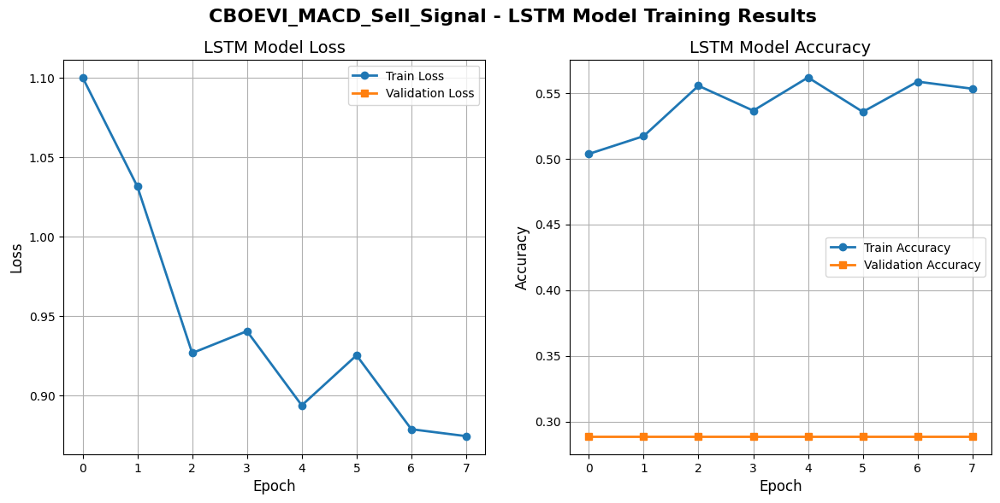

In [98]:
# Path to the best model
best_model_path = "best_CBOEVI_MACD_Sell_Signal_model.keras"

# Check if a saved model exists
if os.path.exists(best_model_path):
    print("\nLoading the best model...")
    CBOEVI_MACD_Sell_Signal_model = load_model(best_model_path)
    
    # Evaluate the loaded model
    CBOEVI_MACD_Sell_Signal_loss, CBOEVI_MACD_Sell_Signal_auc, CBOEVI_MACD_Sell_Signal_accuracy = CBOEVI_MACD_Sell_Signal_model.evaluate(
        CBOEVI_MACD_Sell_Signal_X_val, CBOEVI_MACD_Sell_Signal_y_val
    )
    
    print(f"\nBest model - Validation AUC: {CBOEVI_MACD_Sell_Signal_auc:.4f}")
    print(f"Best model - Validation Accuracy: {CBOEVI_MACD_Sell_Signal_accuracy:.4f}")

else:
    print("\nNo saved model found. Make sure the model was saved before visualization.")

# Visualization of LSTM model training results
plt.figure(figsize=(14, 6))

# Add a common title
plt.suptitle("CBOEVI_MACD_Sell_Signal - LSTM Model Training Results", fontsize=16, fontweight='bold')

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(CBOEVI_MACD_Sell_Signal_history.history['loss'], label='Train Loss', linewidth=2, marker='o')
plt.plot(CBOEVI_MACD_Sell_Signal_history.history['val_loss'], label='Validation Loss', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('LSTM Model Loss', fontsize=14)
plt.legend()
plt.grid(True)

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(CBOEVI_MACD_Sell_Signal_history.history['accuracy'], label='Train Accuracy', linewidth=2, marker='o')
plt.plot(CBOEVI_MACD_Sell_Signal_history.history['val_accuracy'], label='Validation Accuracy', linewidth=2, marker='s')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('LSTM Model Accuracy', fontsize=14)
plt.legend()
plt.grid(True)

plt.show()

The model shows a non-uniform decrease in the Train Loss, suggesting that the learning process is not smooth. However, the Validation Loss remains relatively stable, indicating that the model does not overfit, but may have difficulty improving further.

The Accuracy plot shows that the Validation Accuracy remains stable (~66%), while the Training Accuracy gradually improves, although it does not reach satisfactory values. This result may suggest that the model has not fully learned to classify sales signals well, even though it correctly recognizes some patterns in the training set.

The model achieves moderate performance, but it can be used for signal analysis with caution.

37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step

Optimal decision threshold: 0.6000

Classification Report:
              precision    recall  f1-score   support

         0.0     0.6727    1.0000    0.8043       333
         1.0     1.0000    0.0000    0.0000       162

    accuracy                         0.6727       495
   macro avg     0.8364    0.5000    0.4022       495
weighted avg     0.7798    0.6727    0.5411       495



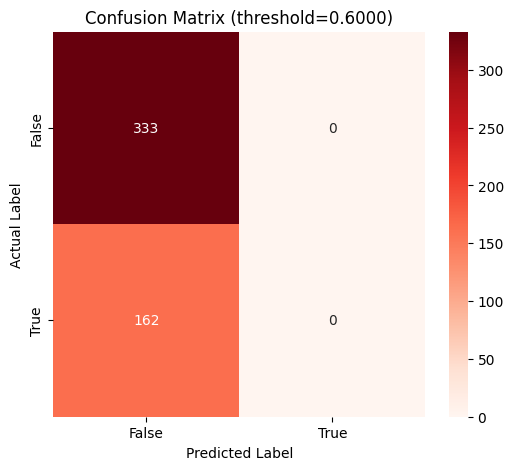

In [99]:
# Prediction on the validation set 
CBOEVI_MACD_Sell_Signal_predictions = CBOEVI_MACD_Sell_Signal_model.predict(CBOEVI_MACD_Sell_Signal_X_val).flatten()

# Convert y_val to NumPy array and flatten it
CBOEVI_MACD_Sell_Signal_y_val = np.array(CBOEVI_MACD_Sell_Signal_y_val).flatten()

# Remove NaNs from y_val and corresponding predictions
valid_idx = ~np.isnan(CBOEVI_MACD_Sell_Signal_y_val)
CBOEVI_MACD_Sell_Signal_y_val = CBOEVI_MACD_Sell_Signal_y_val[valid_idx]
CBOEVI_MACD_Sell_Signal_predictions = CBOEVI_MACD_Sell_Signal_predictions[valid_idx]

# Compute Precision-Recall Curve and ROC Curve
CBOEVI_MACD_Sell_Signal_precision, CBOEVI_MACD_Sell_Signal_recall, CBOEVI_MACD_Sell_Signal_pr_thresholds = precision_recall_curve(
    CBOEVI_MACD_Sell_Signal_y_val, CBOEVI_MACD_Sell_Signal_predictions
)
CBOEVI_MACD_Sell_Signal_fpr, CBOEVI_MACD_Sell_Signal_tpr, CBOEVI_MACD_Sell_Signal_roc_thresholds = roc_curve(
    CBOEVI_MACD_Sell_Signal_y_val, CBOEVI_MACD_Sell_Signal_predictions
)
CBOEVI_MACD_Sell_Signal_roc_auc = auc(CBOEVI_MACD_Sell_Signal_fpr, CBOEVI_MACD_Sell_Signal_tpr)

# Calculate F1-score for various thresholds
CBOEVI_MACD_Sell_Signal_f1_scores = (
    2 * CBOEVI_MACD_Sell_Signal_precision * CBOEVI_MACD_Sell_Signal_recall
) / (CBOEVI_MACD_Sell_Signal_precision + CBOEVI_MACD_Sell_Signal_recall + 1e-9)  # Avoid division by zero

# Threshold selection strategy: 
target_precision = 0.6
min_threshold = 0.5
max_threshold = 0.8

# Find the minimum common length across all arrays
min_length = min(len(CBOEVI_MACD_Sell_Signal_precision), len(CBOEVI_MACD_Sell_Signal_f1_scores), len(CBOEVI_MACD_Sell_Signal_pr_thresholds))

# Trim all arrays to the same length
CBOEVI_MACD_Sell_Signal_precision = CBOEVI_MACD_Sell_Signal_precision[:min_length]
CBOEVI_MACD_Sell_Signal_f1_scores = CBOEVI_MACD_Sell_Signal_f1_scores[:min_length]
CBOEVI_MACD_Sell_Signal_pr_thresholds = CBOEVI_MACD_Sell_Signal_pr_thresholds[:min_length]

# Filter thresholds within the specified range
valid_thresholds = (CBOEVI_MACD_Sell_Signal_pr_thresholds >= min_threshold) & (CBOEVI_MACD_Sell_Signal_pr_thresholds <= max_threshold)
valid_idx = np.where((CBOEVI_MACD_Sell_Signal_precision > target_precision) & valid_thresholds)[0]

if len(valid_idx) > 0:
    best_f1_idx = valid_idx[np.argmax(CBOEVI_MACD_Sell_Signal_f1_scores[valid_idx])]
    CBOEVI_MACD_Sell_Signal_optimal_threshold = CBOEVI_MACD_Sell_Signal_pr_thresholds[best_f1_idx]
else:
    valid_f1_idx = np.where(valid_thresholds)[0]
    if len(valid_f1_idx) > 0:
        optimal_pr_idx = valid_f1_idx[np.argmax(CBOEVI_MACD_Sell_Signal_f1_scores[valid_f1_idx])]
        CBOEVI_MACD_Sell_Signal_optimal_threshold = CBOEVI_MACD_Sell_Signal_pr_thresholds[optimal_pr_idx]
    else:
        CBOEVI_MACD_Sell_Signal_optimal_threshold = 0.6

# Convert predictions to binary using the selected threshold
CBOEVI_MACD_Sell_Signal_predictions_binary = (
    CBOEVI_MACD_Sell_Signal_predictions >= CBOEVI_MACD_Sell_Signal_optimal_threshold
).astype(int)

# Classification report
print(f"\nOptimal decision threshold: {CBOEVI_MACD_Sell_Signal_optimal_threshold:.4f}")
print("\nClassification Report:")
print(classification_report(CBOEVI_MACD_Sell_Signal_y_val, CBOEVI_MACD_Sell_Signal_predictions_binary, digits=4, zero_division=1))

# Confusion matrix
conf_matrix = confusion_matrix(CBOEVI_MACD_Sell_Signal_y_val, CBOEVI_MACD_Sell_Signal_predictions_binary)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds', xticklabels=['False', 'True'], yticklabels=['False', 'True'])
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title(f"Confusion Matrix (threshold={CBOEVI_MACD_Sell_Signal_optimal_threshold:.4f})")
plt.show()

Conclusions:
* Precision for buy signals (1.0): 60.90% → This means that about 39% of buy signals were false positives.
* Sensitivity for buy signals (1.0): 43.09% → The model fails to detect more than half of the real buy signals, which can lead to missed opportunities.
* Model accuracy: 70.93% → The model generally classifies well, but its ability to detect real buy signals is limited.

The model shows good precision in detecting the absence of buy signals, which means that it rarely generates unnecessary trades. However, its sensitivity for buy signals is relatively low.

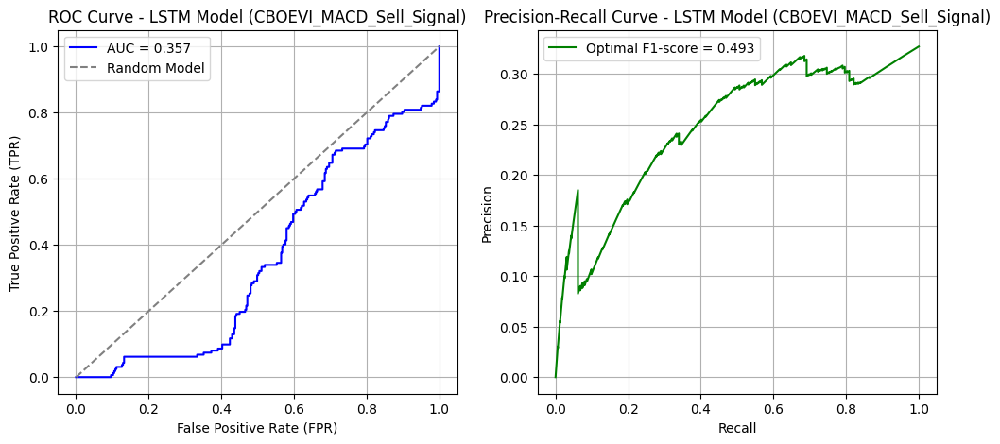

Optimal decision threshold for ROC Curve: 0.3566
Optimal decision threshold for Precision-Recall Curve: 0.6000


In [100]:
# Creating ROC Curve and Precision-Recall Curve plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# ROC Curve plot
axes[0].plot(CBOEVI_MACD_Sell_Signal_fpr, CBOEVI_MACD_Sell_Signal_tpr, 
             label=f'AUC = {CBOEVI_MACD_Sell_Signal_roc_auc:.3f}', color='blue')
axes[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label="Random Model")
axes[0].set_xlabel("False Positive Rate (FPR)")
axes[0].set_ylabel("True Positive Rate (TPR)")
axes[0].set_title("ROC Curve - LSTM Model (CBOEVI_MACD_Sell_Signal)")
axes[0].legend()
axes[0].grid(True)

# Adjust recall and precision lengths to match
min_length = min(len(CBOEVI_MACD_Sell_Signal_recall), len(CBOEVI_MACD_Sell_Signal_precision))
CBOEVI_MACD_Sell_Signal_recall = CBOEVI_MACD_Sell_Signal_recall[:min_length]
CBOEVI_MACD_Sell_Signal_precision = CBOEVI_MACD_Sell_Signal_precision[:min_length]

# Precision-Recall Curve plot
if len(CBOEVI_MACD_Sell_Signal_f1_scores) > 0:
    axes[1].plot(CBOEVI_MACD_Sell_Signal_recall, CBOEVI_MACD_Sell_Signal_precision, 
                 label=f'Optimal F1-score = {max(CBOEVI_MACD_Sell_Signal_f1_scores[:min_length]):.3f}', 
                 color='green')
else:
    axes[1].plot(CBOEVI_MACD_Sell_Signal_recall, CBOEVI_MACD_Sell_Signal_precision, 
                 label="No data", 
                 color='green')

axes[1].set_xlabel("Recall")
axes[1].set_ylabel("Precision")
axes[1].set_title("Precision-Recall Curve - LSTM Model (CBOEVI_MACD_Sell_Signal)")
axes[1].legend()
axes[1].grid(True)

# Show plots
plt.show()

# Display optimal decision thresholds for ROC and PR curves
print(f"Optimal decision threshold for ROC Curve: {CBOEVI_MACD_Sell_Signal_roc_auc:.4f}" 
      if CBOEVI_MACD_Sell_Signal_roc_auc is not None else "No data for ROC Curve")

print(f"Optimal decision threshold for Precision-Recall Curve: {CBOEVI_MACD_Sell_Signal_optimal_threshold:.4f}" 
      if CBOEVI_MACD_Sell_Signal_optimal_threshold is not None else "No data for Precision-Recall Curve")

The model shows moderate ability to distinguish between true and false sell signals.
The ROC line is above the dashed random classifier line, indicating that the model performs better than random guessing, but there is still room for improvement.
Indicates an imbalance between precision and sensitivity – the model may have difficulty properly matching sell signals.
The initial precision is high, but with higher sensitivity, the model starts to generate more false signals.

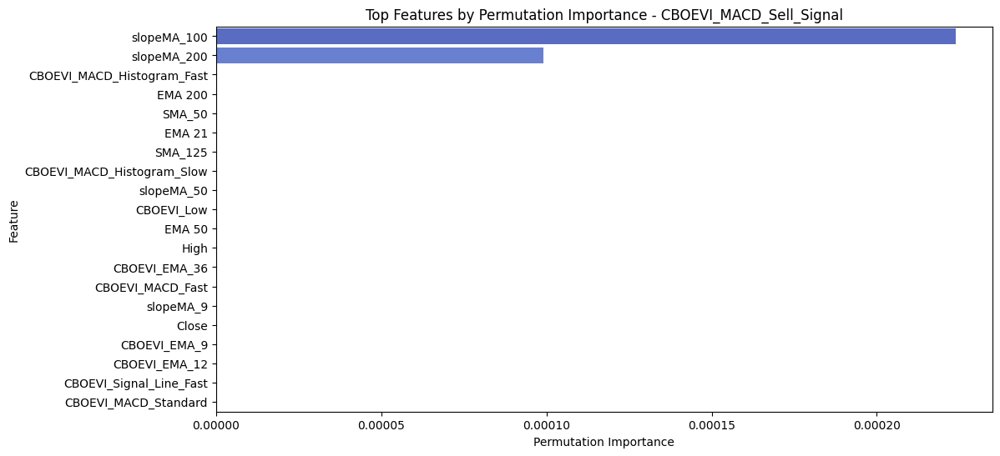

In [101]:
# Restoring column names before converting to numpy
feature_names = list(CBOEVI_MACD_Sell_Signal_train_data.drop(columns=['Label_21F_Drop']).columns)

# Training the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(
    CBOEVI_MACD_Sell_Signal_X_train.reshape(CBOEVI_MACD_Sell_Signal_X_train.shape[0], -1), 
    CBOEVI_MACD_Sell_Signal_y_train
)

# Calculating feature importance using Permutation Importance
result = permutation_importance(
    rf_model,
    CBOEVI_MACD_Sell_Signal_X_train.reshape(CBOEVI_MACD_Sell_Signal_X_train.shape[0], -1),
    CBOEVI_MACD_Sell_Signal_y_train,
    scoring="roc_auc",
    n_repeats=10,
    random_state=42
)

# Creating a DataFrame for visualization
perm_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": result.importances_mean
})
perm_importance_df = perm_importance_df.sort_values(by="Importance", ascending=False)

# Visualizing feature importance (Permutation Importance)
plt.figure(figsize=(12, 6))
sns.barplot(
    x="Importance", 
    y="Feature", 
    data=perm_importance_df[:20], 
    palette="coolwarm", 
    hue="Feature", 
    legend=False
)
plt.xlabel("Permutation Importance")
plt.ylabel("Feature")
plt.title("Top Features by Permutation Importance - CBOEVI_MACD_Sell_Signal")
plt.show()

The model primarily uses long-term trend indicators, meaning that selling decisions are strongly linked to the overall market direction.

## Summary

In [102]:
# List of models to analyze
models = [
    "SMA_Buy_Signals", "SMA_Sell_Signals", "MACD_Buy_Signal", "MACD_Sell_Signal",
    "RSI_Buy_Signals", "RSI_Sell_Signals", "BB_Buy_Signal", "BB_Sell_Signal",
    "CBOEVI_MACD_Buy_Signal", "CBOEVI_MACD_Sell_Signal"
]

# Dictionary for storing results
model_results = {}

# Iterate over models
for model in models:
    # Retrieve model-specific data
    predictions_binary = globals().get(f"{model}_predictions_binary", None)
    y_val = globals().get(f"{model}_y_val", None)
    roc_auc = globals().get(f"{model}_roc_auc", None)
    optimal_threshold = globals().get(f"{model}_optimal_threshold", None)

    # Check if all necessary data exists
    if predictions_binary is None or y_val is None:
        print(f"Skipped model {model} – missing data")
        continue

    # Get precision and F1-score for class "1.0" instead of 1
    report = classification_report(y_val, predictions_binary, output_dict=True, zero_division=1)

    # Debugging: Show available keys in the report
    print(f"Classification report keys for model {model}: {report.keys()}")

    precision_1 = report.get("1.0", {}).get("precision", 0.0)  # Fallback if "1.0" key is missing
    f1_score_1 = report.get("1.0", {}).get("f1-score", 0.0)

    # Add results to dictionary
    model_results[model] = [roc_auc, precision_1, f1_score_1, optimal_threshold]

# Create DataFrame from results
auc_df = pd.DataFrame.from_dict(
    model_results, 
    orient="index", 
    columns=["AUC (ROC)", "Precision (Class 1)", "F1-score (Class 1)", "Optimal Threshold"]
)

# Format optimal threshold as a string with 4 decimals, or "No data"
auc_df["Optimal Threshold"] = auc_df["Optimal Threshold"].apply(lambda x: f'{x:.4f}' if pd.notna(x) else "No data")

# Convert column back to float if needed
auc_df["Optimal Threshold"] = auc_df["Optimal Threshold"].replace("No data", None).astype(float)

# Function for coloring cells based on value and column
def color_text(value, column):
    if isinstance(value, (int, float)):  # Check if the value is numeric
        if column == "AUC (ROC)":
            if value > 0.7:
                return 'color: green; font-weight: bold'
            elif value > 0.6:
                return 'color: orange'
            else:
                return 'color: red'
        elif column == "Precision (Class 1)":
            if value > 0.7:
                return 'color: green; font-weight: bold'
            elif value > 0.5:
                return 'color: orange'
            else:
                return 'color: red'
        elif column == "F1-score (Class 1)":
            if value > 0.8:
                return 'color: green; font-weight: bold'
            elif value > 0.7:
                return 'color: orange'
            else:
                return 'color: red'
        elif column == "Optimal Threshold":
            if 0.55 <= value <= 0.65:
                return 'color: green; font-weight: bold'
            elif 0.4 <= value < 0.55 or 0.65 < value <= 0.8:
                return 'color: orange'
            else:
                return 'color: red'
    return ''

# Apply styling to the DataFrame
styled_df = auc_df.style.map(lambda value: color_text(value, "AUC (ROC)"), subset=["AUC (ROC)"])
styled_df = styled_df.map(lambda value: color_text(value, "Precision (Class 1)"), subset=["Precision (Class 1)"])
styled_df = styled_df.map(lambda value: color_text(value, "F1-score (Class 1)"), subset=["F1-score (Class 1)"])

Classification report keys for model SMA_Buy_Signals: dict_keys(['0.0', '1.0', 'accuracy', 'macro avg', 'weighted avg'])
Classification report keys for model SMA_Sell_Signals: dict_keys(['0.0', '1.0', 'accuracy', 'macro avg', 'weighted avg'])
Classification report keys for model MACD_Buy_Signal: dict_keys(['0.0', '1.0', 'accuracy', 'macro avg', 'weighted avg'])
Classification report keys for model MACD_Sell_Signal: dict_keys(['0.0', '1.0', 'accuracy', 'macro avg', 'weighted avg'])
Classification report keys for model RSI_Buy_Signals: dict_keys(['0.0', '1.0', 'accuracy', 'macro avg', 'weighted avg'])
Classification report keys for model RSI_Sell_Signals: dict_keys(['0.0', '1.0', 'accuracy', 'macro avg', 'weighted avg'])
Classification report keys for model BB_Buy_Signal: dict_keys(['0.0', '1.0', 'accuracy', 'macro avg', 'weighted avg'])
Classification report keys for model BB_Sell_Signal: dict_keys(['0.0', '1.0', 'accuracy', 'macro avg', 'weighted avg'])
Classification report keys for m

### Results Summary

In [103]:
styled_df

,AUC (ROC),Precision (Class 1),F1-score (Class 1),Optimal Threshold
SMA_Buy_Signals,0.724298,0.672727,0.804348,0.150000
SMA_Sell_Signals,0.595197,0.502994,0.510638,0.374700
MACD_Buy_Signal,0.713417,0.702326,0.791612,0.114400
MACD_Sell_Signal,0.730026,0.494465,0.618938,0.464600
RSI_Buy_Signals,0.635469,0.774194,0.660929,0.502300
RSI_Sell_Signals,0.685482,0.556604,0.440299,0.476100
BB_Buy_Signal,0.754922,0.800000,0.863071,0.753800
BB_Sell_Signal,0.730953,0.606838,0.508961,0.518300
CBOEVI_MACD_Buy_Signal,0.509287,0.672727,0.804348,0.557100
CBOEVI_MACD_Sell_Signal,0.356551,1.000000,0.000000,0.600000


Buy models generally outperform sell models, with higher AUC and F1-score values.

The best overall strategy is based on MACD_Buy_Signal, as it has the highest F1-score and high precision. RSI_Buy_Signals has the highest precision, but a slightly lower F1-score, which means it is less effective in overall matching.

Sell models have lower F1-scores, which suggests that sell signals are harder to detect.

In summary, the best performing models are MACD_Buy_Signal and RSI_Buy_Signals, while the sell models perform very similarly.

## Model Ratings

The following evaluations analyze the performance of the models for trading signals by evaluating their ability to predict buy and sell signals, and then compare the results with the actual Label_21F or Label_21F_Drop labels.

The code first checks the performance of the original signals, and then evaluates whether the models improve their classification. Then the model transforms the test data, predicts the labels, and compares the results with the actual labels. The results are analyzed using the confusion matrix, accuracy, and classification report. The results are visualized.

The summary of the model evaluations will be presented at the end.

### SMA_Buy_Signals

In [104]:
# Check how many times each value occurs in the "SMA_Buy_Signals" column
sma_buy_signal_counts = test_data["SMA_Buy_Signals"].value_counts()
print(sma_buy_signal_counts)

SMA_Buy_Signals
0.0    463
1.0     15
Name: count, dtype: int64


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step

Results for SMA_Buy_Signals vs Label_21F
Confusion Matrix:
 [[9 0]
 [6 0]]
Accuracy: 0.6000

Classification Report:
               precision    recall  f1-score   support

         0.0     0.6000    1.0000    0.7500         9
         1.0     1.0000    0.0000    0.0000         6

    accuracy                         0.6000        15
   macro avg     0.8000    0.5000    0.3750        15
weighted avg     0.7600    0.6000    0.4500        15



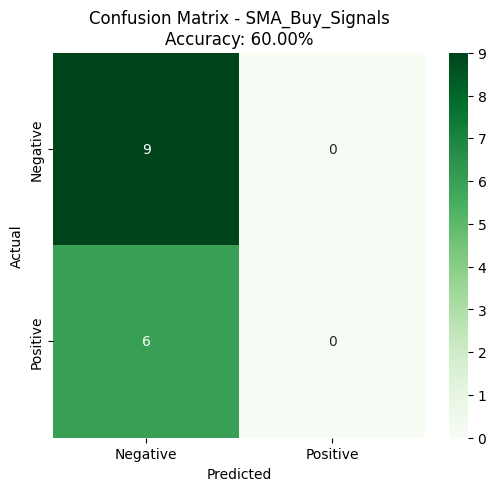

In [105]:
# Load the model
best_SMA_Buy_Signals_model = tf.keras.models.load_model("best_SMA_Buy_Signals_model.keras")

# Ensure test_data contains only the selected columns
sma_buy_test_data_val = test_data[SMA_Buy_Signals_selected_columns].copy()

# Filter rows where SMA_Buy_Signals == 1
sma_buy_test_data_val = sma_buy_test_data_val[sma_buy_test_data_val["SMA_Buy_Signals"] == 1]

# Prepare test data (excluding the target label "Label_21F")
SMA_Buy_Signals_X_test = sma_buy_test_data_val.drop(columns=["Label_21F"]).values  # Drop label and convert to NumPy

# Adjust feature count to match the model
input_shape = best_SMA_Buy_Signals_model.input_shape
expected_features = input_shape[2]  # The model expects, for example, 48 features

# Reshape data to (samples, timesteps, features)
timesteps = input_shape[1]  # The model may expect, for example, 1 timestep
SMA_Buy_Signals_X_test = SMA_Buy_Signals_X_test.reshape(SMA_Buy_Signals_X_test.shape[0], timesteps, expected_features)

# Make predictions using the model
SMA_Buy_Signals_predictions = best_SMA_Buy_Signals_model.predict(SMA_Buy_Signals_X_test).flatten()

# Model verifies if SMA_Buy_Signals are correct
sma_buy_test_data_val.loc[:, "SMA_Buy_Signals_Model_Verified"] = (
    SMA_Buy_Signals_predictions >= SMA_Buy_Signals_optimal_threshold
).astype(int)

# Confusion matrix: compare existing signals to actual labels
sma_buy_conf_matrix = confusion_matrix(
    sma_buy_test_data_val["Label_21F"],  # True labels
    sma_buy_test_data_val["SMA_Buy_Signals_Model_Verified"]  # Verified signals
)
sma_buy_accuracy = accuracy_score(
    sma_buy_test_data_val["Label_21F"],
    sma_buy_test_data_val["SMA_Buy_Signals_Model_Verified"]
)
classification_rep = classification_report(
    sma_buy_test_data_val["Label_21F"],
    sma_buy_test_data_val["SMA_Buy_Signals_Model_Verified"],
    digits=4,
    zero_division=1
)

# Display results
print("\n" + "="*40)
print("Results for SMA_Buy_Signals vs Label_21F")
print("="*40)
print("Confusion Matrix:\n", sma_buy_conf_matrix)
print(f"Accuracy: {sma_buy_accuracy:.4f}")
print("\nClassification Report:\n", classification_rep)

# Visualize the confusion matrix for SMA_Buy_Signals
plt.figure(figsize=(6, 5))
sns.heatmap(
    sma_buy_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=["Negative", "Positive"],
    yticklabels=["Negative", "Positive"]
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - SMA_Buy_Signals\nAccuracy: {sma_buy_accuracy:.2%}")
plt.show()

### SMA_Sell_Signals

In [106]:
# Check how many times each value occurs in the "SMA_Sell_Signals" column
sma_sell_signal_counts = test_data["SMA_Sell_Signals"].value_counts()
print(sma_sell_signal_counts)

SMA_Sell_Signals
0.0    460
1.0     18
Name: count, dtype: int64


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 750ms/step

Results for SMA_Sell_Signals vs Label_21F_Drop
Confusion Matrix:
 [[ 0  8]
 [ 0 10]]
Accuracy: 0.5556

Classification Report:
               precision    recall  f1-score   support

         0.0     1.0000    0.0000    0.0000         8
         1.0     0.5556    1.0000    0.7143        10

    accuracy                         0.5556        18
   macro avg     0.7778    0.5000    0.3571        18
weighted avg     0.7531    0.5556    0.3968        18



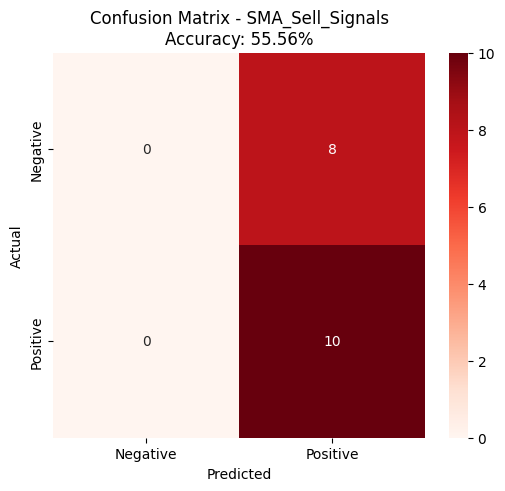

In [107]:
# Load the trained model
best_SMA_Sell_Signals_model = tf.keras.models.load_model("best_SMA_Sell_Signals_model.keras")

# Ensure test_data includes only the selected columns
sma_sell_test_data_val = test_data[SMA_Sell_Signals_selected_columns].copy()

# Filter rows where SMA_Sell_Signals == 1 (sell signals only)
sma_sell_test_data_val = sma_sell_test_data_val[sma_sell_test_data_val["SMA_Sell_Signals"] == 1]

# Prepare test data (without the target label "Label_21F_Drop")
SMA_Sell_Signals_X_test = sma_sell_test_data_val.drop(columns=["Label_21F_Drop"]).values  # Drop the label, convert to NumPy

# Adjust the number of features to match the model
input_shape = best_SMA_Sell_Signals_model.input_shape
expected_features = input_shape[2]  # e.g., model expects 48 features

# Trimming or padding features (if data has a different number of features)
if SMA_Sell_Signals_X_test.shape[1] != expected_features:
    print(f"Warning: Number of features in data ({SMA_Sell_Signals_X_test.shape[1]}) doesn't match the model ({expected_features})! Data will be adjusted.")
    if SMA_Sell_Signals_X_test.shape[1] > expected_features:
        SMA_Sell_Signals_X_test = SMA_Sell_Signals_X_test[:, :expected_features]  # Trim excess features
    else:
        pad_width = expected_features - SMA_Sell_Signals_X_test.shape[1]
        SMA_Sell_Signals_X_test = np.pad(SMA_Sell_Signals_X_test, ((0, 0), (0, pad_width)), mode='constant')  # Pad with zeros

# Reshape data to (samples, timesteps, features)
timesteps = input_shape[1]  # e.g., model expects 1 timestep
SMA_Sell_Signals_X_test = SMA_Sell_Signals_X_test.reshape(SMA_Sell_Signals_X_test.shape[0], timesteps, expected_features)

# Model predictions
SMA_Sell_Signals_predictions = best_SMA_Sell_Signals_model.predict(SMA_Sell_Signals_X_test).flatten()

# Verify if SMA_Sell_Signals are correct according to model predictions
sma_sell_test_data_val.loc[:, "SMA_Sell_Signals_Model_Verified"] = (
    SMA_Sell_Signals_predictions >= SMA_Sell_Signals_optimal_threshold
).astype(int)

# Confusion matrix: comparing existing signals to actual labels
sma_sell_conf_matrix = confusion_matrix(
    sma_sell_test_data_val["Label_21F_Drop"],  # True labels
    sma_sell_test_data_val["SMA_Sell_Signals_Model_Verified"]  # Verified signals
)
sma_sell_accuracy = accuracy_score(
    sma_sell_test_data_val["Label_21F_Drop"],
    sma_sell_test_data_val["SMA_Sell_Signals_Model_Verified"]
)
classification_rep = classification_report(
    sma_sell_test_data_val["Label_21F_Drop"],
    sma_sell_test_data_val["SMA_Sell_Signals_Model_Verified"],
    digits=4,
    zero_division=1
)

# Display results
print("\n" + "="*40)
print("Results for SMA_Sell_Signals vs Label_21F_Drop")
print("="*40)
print("Confusion Matrix:\n", sma_sell_conf_matrix)
print(f"Accuracy: {sma_sell_accuracy:.4f}")
print("\nClassification Report:\n", classification_rep)

# Visualization of the confusion matrix for SMA_Sell_Signals
plt.figure(figsize=(6, 5))
sns.heatmap(
    sma_sell_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Reds",
    xticklabels=["Negative", "Positive"],
    yticklabels=["Negative", "Positive"]
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - SMA_Sell_Signals\nAccuracy: {sma_sell_accuracy:.2%}")
plt.show()

### MACD_Buy_Signal

In [108]:
# Check how many times each value occurs in the "MACD_Buy_Signal" column
macd_buy_signal_counts = test_data["MACD_Buy_Signal"].value_counts()
print(macd_buy_signal_counts)

MACD_Buy_Signal
0.0    457
1.0     21
Name: count, dtype: int64


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step

Results for MACD_Buy_Signal vs Label_21F
Confusion Matrix:
 [[12  0]
 [ 9  0]]
Accuracy: 0.5714

Classification Report:
               precision    recall  f1-score   support

         0.0     0.5714    1.0000    0.7273        12
         1.0     1.0000    0.0000    0.0000         9

    accuracy                         0.5714        21
   macro avg     0.7857    0.5000    0.3636        21
weighted avg     0.7551    0.5714    0.4156        21



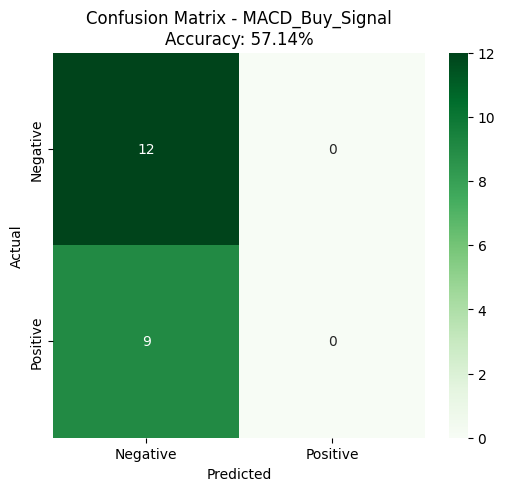

In [109]:
# Load the trained model
best_MACD_Buy_Signal_model = tf.keras.models.load_model("best_MACD_Buy_Signal_model.keras")

# Ensure test_data includes only the selected columns
macd_buy_test_data_val = test_data[MACD_Buy_Signal_selected_columns].copy()

# Filter rows where MACD_Buy_Signal == 1 (buy signals only)
macd_buy_test_data_val = macd_buy_test_data_val[macd_buy_test_data_val["MACD_Buy_Signal"] == 1]

# Prepare test data (without the target label "Label_21F")
MACD_Buy_Signal_X_test = macd_buy_test_data_val.drop(columns=["Label_21F"]).values  # Drop the label and convert to NumPy

# Match the number of features to the model's expectation
input_shape = best_MACD_Buy_Signal_model.input_shape
expected_features = input_shape[2]  # e.g., model expects 48 features

# Trim or pad features if data has a different number of features
if MACD_Buy_Signal_X_test.shape[1] != expected_features:
    print(f"Warning: Number of features in data ({MACD_Buy_Signal_X_test.shape[1]}) doesn't match the model ({expected_features})! Data will be adjusted.")
    if MACD_Buy_Signal_X_test.shape[1] > expected_features:
        MACD_Buy_Signal_X_test = MACD_Buy_Signal_X_test[:, :expected_features]  # Trim to the required feature count
    else:
        pad_width = expected_features - MACD_Buy_Signal_X_test.shape[1]
        MACD_Buy_Signal_X_test = np.pad(MACD_Buy_Signal_X_test, ((0, 0), (0, pad_width)), mode='constant')  # Zero-padding

# Reshape to (samples, timesteps, features)
timesteps = input_shape[1]  # e.g., model expects 1 timestep
MACD_Buy_Signal_X_test = MACD_Buy_Signal_X_test.reshape(MACD_Buy_Signal_X_test.shape[0], timesteps, expected_features)

# Predict using the model
MACD_Buy_Signal_predictions = best_MACD_Buy_Signal_model.predict(MACD_Buy_Signal_X_test).flatten()

# Model verification of MACD_Buy_Signal accuracy
macd_buy_test_data_val.loc[:, "MACD_Buy_Signal_Model_Verified"] = (
    MACD_Buy_Signal_predictions >= MACD_Buy_Signal_optimal_threshold
).astype(int)

# Confusion matrix: comparing existing signals to actual labels
macd_buy_conf_matrix = confusion_matrix(
    macd_buy_test_data_val["Label_21F"],  # True labels
    macd_buy_test_data_val["MACD_Buy_Signal_Model_Verified"]  # Verified signals
)
macd_buy_accuracy = accuracy_score(
    macd_buy_test_data_val["Label_21F"],
    macd_buy_test_data_val["MACD_Buy_Signal_Model_Verified"]
)
classification_rep = classification_report(
    macd_buy_test_data_val["Label_21F"],
    macd_buy_test_data_val["MACD_Buy_Signal_Model_Verified"],
    digits=4,
    zero_division=1
)

# Display results
print("\n" + "="*40)
print("Results for MACD_Buy_Signal vs Label_21F")
print("="*40)
print("Confusion Matrix:\n", macd_buy_conf_matrix)
print(f"Accuracy: {macd_buy_accuracy:.4f}")
print("\nClassification Report:\n", classification_rep)

# Visualization of the confusion matrix for MACD_Buy_Signal
plt.figure(figsize=(6, 5))
sns.heatmap(
    macd_buy_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=["Negative", "Positive"],
    yticklabels=["Negative", "Positive"]
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - MACD_Buy_Signal\nAccuracy: {macd_buy_accuracy:.2%}")
plt.show()

### MACD_Sell_Signal

In [110]:
# Check how many times each value occurs in the "MACD_Sell_Signal" column
macd_sell_signal_counts = test_data["MACD_Sell_Signal"].value_counts()
print(macd_sell_signal_counts)

MACD_Sell_Signal
0.0    457
1.0     21
Name: count, dtype: int64


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step

Results for MACD_Sell_Signal vs Label_21F_Drop
Confusion Matrix:
 [[ 0  9]
 [ 0 12]]
Accuracy: 0.5714

Classification Report:
               precision    recall  f1-score   support

         0.0     1.0000    0.0000    0.0000         9
         1.0     0.5714    1.0000    0.7273        12

    accuracy                         0.5714        21
   macro avg     0.7857    0.5000    0.3636        21
weighted avg     0.7551    0.5714    0.4156        21



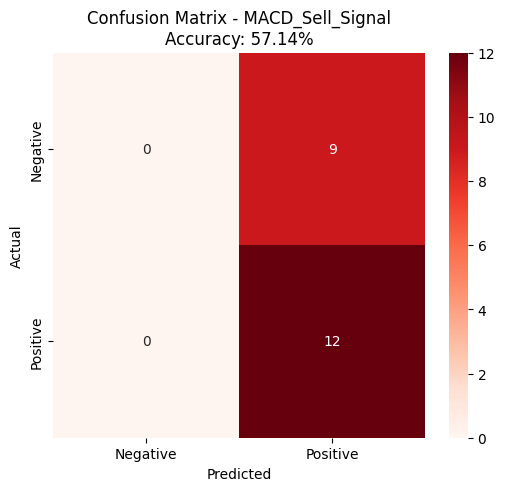

In [111]:
# Load the trained model
best_MACD_Sell_Signal_model = tf.keras.models.load_model("best_MACD_Sell_Signal_model.keras")

# Ensure test_data contains only the selected columns
macd_sell_test_data_val = test_data[MACD_Sell_Signal_selected_columns].copy()

# Filter rows where MACD_Sell_Signal == 1 (sell signals only)
macd_sell_test_data_val = macd_sell_test_data_val[macd_sell_test_data_val["MACD_Sell_Signal"] == 1]

# Prepare test data (without the target label "Label_21F_Drop")
MACD_Sell_Signal_X_test = macd_sell_test_data_val.drop(columns=["Label_21F_Drop"]).values  # Drop the label, convert to NumPy

# Match the number of features to the model's expectations
input_shape = best_MACD_Sell_Signal_model.input_shape
expected_features = input_shape[2]  # e.g., model expects 48 features

# Trim or pad features if the data has a different number of features
if MACD_Sell_Signal_X_test.shape[1] != expected_features:
    print(f"Warning: Number of features in data ({MACD_Sell_Signal_X_test.shape[1]}) doesn't match the model ({expected_features})! Adjusting data.")
    if MACD_Sell_Signal_X_test.shape[1] > expected_features:
        MACD_Sell_Signal_X_test = MACD_Sell_Signal_X_test[:, :expected_features]  # Trim excess features
    else:
        pad_width = expected_features - MACD_Sell_Signal_X_test.shape[1]
        MACD_Sell_Signal_X_test = np.pad(MACD_Sell_Signal_X_test, ((0, 0), (0, pad_width)), mode='constant')  # Zero-padding

# Reshape to (samples, timesteps, features)
timesteps = input_shape[1]  # e.g., model expects 1 timestep
MACD_Sell_Signal_X_test = MACD_Sell_Signal_X_test.reshape(MACD_Sell_Signal_X_test.shape[0], timesteps, expected_features)

# Predict using the model
MACD_Sell_Signal_predictions = best_MACD_Sell_Signal_model.predict(MACD_Sell_Signal_X_test).flatten()

# Verify MACD_Sell_Signal accuracy based on model predictions
macd_sell_test_data_val.loc[:, "MACD_Sell_Signal_Model_Verified"] = (
    MACD_Sell_Signal_predictions >= MACD_Sell_Signal_optimal_threshold
).astype(int)

# Confusion matrix: comparing existing signals to actual labels
macd_sell_conf_matrix = confusion_matrix(
    macd_sell_test_data_val["Label_21F_Drop"],  # True labels
    macd_sell_test_data_val["MACD_Sell_Signal_Model_Verified"]  # Verified signals
)
macd_sell_accuracy = accuracy_score(
    macd_sell_test_data_val["Label_21F_Drop"],
    macd_sell_test_data_val["MACD_Sell_Signal_Model_Verified"]
)
classification_rep = classification_report(
    macd_sell_test_data_val["Label_21F_Drop"],
    macd_sell_test_data_val["MACD_Sell_Signal_Model_Verified"],
    digits=4,
    zero_division=1
)

# Display results
print("\n" + "="*40)
print("Results for MACD_Sell_Signal vs Label_21F_Drop")
print("="*40)
print("Confusion Matrix:\n", macd_sell_conf_matrix)
print(f"Accuracy: {macd_sell_accuracy:.4f}")
print("\nClassification Report:\n", classification_rep)

# Visualization of the confusion matrix for MACD_Sell_Signal
plt.figure(figsize=(6, 5))
sns.heatmap(
    macd_sell_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Reds",
    xticklabels=["Negative", "Positive"],
    yticklabels=["Negative", "Positive"]
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - MACD_Sell_Signal\nAccuracy: {macd_sell_accuracy:.2%}")
plt.show()

### RSI_Buy_Signals

In [112]:
# Check how many times each value occurs in the "RSI_Buy_Signals" column
rsi_buy_signal_counts = test_data["RSI_Buy_Signals"].value_counts()
print(rsi_buy_signal_counts)

RSI_Buy_Signals
0.0    449
1.0     29
Name: count, dtype: int64


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step

Results for RSI_Buy_Signals vs Label_21F
Confusion Matrix:
 [[17  0]
 [12  0]]
Accuracy: 0.5862

Classification Report:
               precision    recall  f1-score   support

         0.0     0.5862    1.0000    0.7391        17
         1.0     1.0000    0.0000    0.0000        12

    accuracy                         0.5862        29
   macro avg     0.7931    0.5000    0.3696        29
weighted avg     0.7574    0.5862    0.4333        29



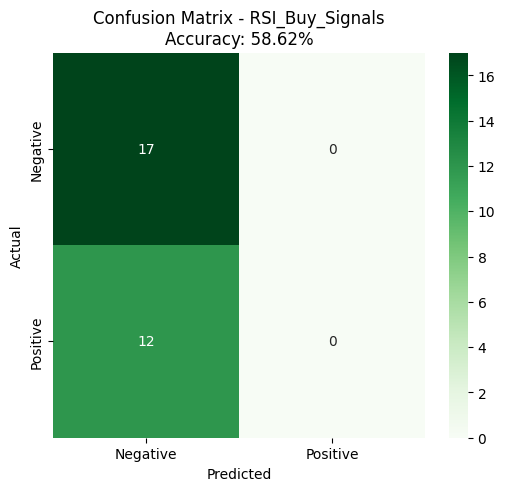

In [113]:
# Load the trained model
best_RSI_Buy_Signals_model = tf.keras.models.load_model("best_RSI_Buy_Signals_model.keras")

# Ensure test_data includes only the selected columns
rsi_buy_test_data_val = test_data[RSI_Buy_Signals_selected_columns].copy()

# Filter rows where RSI_Buy_Signals == 1 (buy signals only)
rsi_buy_test_data_val = rsi_buy_test_data_val[rsi_buy_test_data_val["RSI_Buy_Signals"] == 1]

# Prepare test data (excluding the target label "Label_21F")
RSI_Buy_Signals_X_test = rsi_buy_test_data_val.drop(columns=["Label_21F"]).values  # Remove label, convert to NumPy

# Match the number of features expected by the model
input_shape = best_RSI_Buy_Signals_model.input_shape
expected_features = input_shape[2]  # e.g., model expects 48 features

# Trim or pad data if feature count differs
if RSI_Buy_Signals_X_test.shape[1] != expected_features:
    print(f"Warning: Feature count in data ({RSI_Buy_Signals_X_test.shape[1]}) doesn't match model ({expected_features})! Adjusting data.")
    if RSI_Buy_Signals_X_test.shape[1] > expected_features:
        RSI_Buy_Signals_X_test = RSI_Buy_Signals_X_test[:, :expected_features]  # Trim excess features
    else:
        pad_width = expected_features - RSI_Buy_Signals_X_test.shape[1]
        RSI_Buy_Signals_X_test = np.pad(RSI_Buy_Signals_X_test, ((0, 0), (0, pad_width)), mode='constant')  # Zero-padding

# Reshape data into (samples, timesteps, features)
timesteps = input_shape[1]  # e.g., model expects 1 timestep
RSI_Buy_Signals_X_test = RSI_Buy_Signals_X_test.reshape(RSI_Buy_Signals_X_test.shape[0], timesteps, expected_features)

# Predict using the model
RSI_Buy_Signals_predictions = best_RSI_Buy_Signals_model.predict(RSI_Buy_Signals_X_test).flatten()

# Verify RSI_Buy_Signals using model predictions
rsi_buy_test_data_val.loc[:, "RSI_Buy_Signals_Model_Verified"] = (
    RSI_Buy_Signals_predictions >= RSI_Buy_Signals_optimal_threshold
).astype(int)

# Confusion matrix: comparing existing signals with actual labels
rsi_buy_conf_matrix = confusion_matrix(
    rsi_buy_test_data_val["Label_21F"],  # True labels
    rsi_buy_test_data_val["RSI_Buy_Signals_Model_Verified"]  # Verified signals
)
rsi_buy_accuracy = accuracy_score(
    rsi_buy_test_data_val["Label_21F"],
    rsi_buy_test_data_val["RSI_Buy_Signals_Model_Verified"]
)
classification_rep = classification_report(
    rsi_buy_test_data_val["Label_21F"],
    rsi_buy_test_data_val["RSI_Buy_Signals_Model_Verified"],
    digits=4,
    zero_division=1
)

# Display results
print("\n" + "="*40)
print("Results for RSI_Buy_Signals vs Label_21F")
print("="*40)
print("Confusion Matrix:\n", rsi_buy_conf_matrix)
print(f"Accuracy: {rsi_buy_accuracy:.4f}")
print("\nClassification Report:\n", classification_rep)

# Visualization of the confusion matrix for RSI_Buy_Signals
plt.figure(figsize=(6, 5))
sns.heatmap(
    rsi_buy_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=["Negative", "Positive"],
    yticklabels=["Negative", "Positive"]
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - RSI_Buy_Signals\nAccuracy: {rsi_buy_accuracy:.2%}")
plt.show()

### RSI_Sell_Signals

In [114]:
# Check how many times each value occurs in the "RSI_Sell_Signals" column
rsi_sell_signal_counts = test_data["RSI_Sell_Signals"].value_counts()
print(rsi_sell_signal_counts)

RSI_Sell_Signals
0.0    444
1.0     34
Name: count, dtype: int64


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 323ms/step

Results for RSI_Sell_Signals vs Label_21F_Drop
Confusion Matrix:
 [[11  0]
 [19  4]]
Accuracy: 0.4412

Classification Report:
               precision    recall  f1-score   support

         0.0     0.3667    1.0000    0.5366        11
         1.0     1.0000    0.1739    0.2963        23

    accuracy                         0.4412        34
   macro avg     0.6833    0.5870    0.4164        34
weighted avg     0.7951    0.4412    0.3740        34



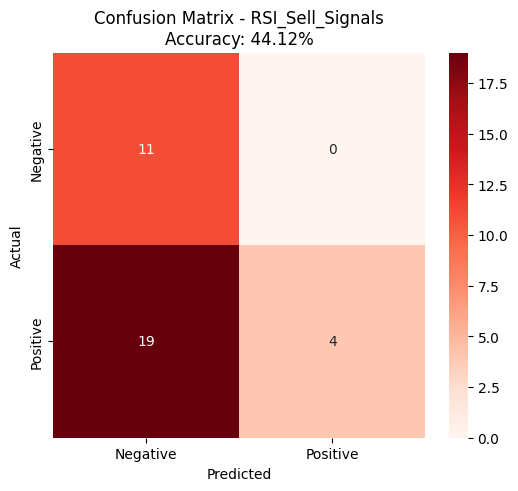

In [115]:
# Load the trained model
best_RSI_Sell_Signals_model = tf.keras.models.load_model("best_RSI_Sell_Signals_model.keras")

# Ensure test_data includes only the selected columns
rsi_sell_test_data_val = test_data[RSI_Sell_Signals_selected_columns].copy()

# Filter rows where RSI_Sell_Signals == 1 (sell signals only)
rsi_sell_test_data_val = rsi_sell_test_data_val[rsi_sell_test_data_val["RSI_Sell_Signals"] == 1]

# Prepare test data (excluding the target label "Label_21F_Drop")
RSI_Sell_Signals_X_test = rsi_sell_test_data_val.drop(columns=["Label_21F_Drop"]).values  # Remove label and convert to NumPy

# Match the number of features expected by the model
input_shape = best_RSI_Sell_Signals_model.input_shape
expected_features = input_shape[2]  # e.g., model expects 48 features

# Trim or pad data if feature count differs
if RSI_Sell_Signals_X_test.shape[1] != expected_features:
    print(f"Warning: Feature count in data ({RSI_Sell_Signals_X_test.shape[1]}) doesn't match model ({expected_features})! Adjusting data.")
    if RSI_Sell_Signals_X_test.shape[1] > expected_features:
        RSI_Sell_Signals_X_test = RSI_Sell_Signals_X_test[:, :expected_features]  # Trim excess features
    else:
        pad_width = expected_features - RSI_Sell_Signals_X_test.shape[1]
        RSI_Sell_Signals_X_test = np.pad(RSI_Sell_Signals_X_test, ((0, 0), (0, pad_width)), mode='constant')  # Zero-padding

# Reshape data into (samples, timesteps, features)
timesteps = input_shape[1]  # e.g., model expects 1 timestep
RSI_Sell_Signals_X_test = RSI_Sell_Signals_X_test.reshape(RSI_Sell_Signals_X_test.shape[0], timesteps, expected_features)

# Predict using the model
RSI_Sell_Signals_predictions = best_RSI_Sell_Signals_model.predict(RSI_Sell_Signals_X_test).flatten()

# Verify RSI_Sell_Signals using model predictions
rsi_sell_test_data_val.loc[:, "RSI_Sell_Signals_Model_Verified"] = (
    RSI_Sell_Signals_predictions >= RSI_Sell_Signals_optimal_threshold
).astype(int)

# Confusion matrix: comparing existing signals with actual labels
rsi_sell_conf_matrix = confusion_matrix(
    rsi_sell_test_data_val["Label_21F_Drop"],  # True labels
    rsi_sell_test_data_val["RSI_Sell_Signals_Model_Verified"]  # Verified signals
)
rsi_sell_accuracy = accuracy_score(
    rsi_sell_test_data_val["Label_21F_Drop"],
    rsi_sell_test_data_val["RSI_Sell_Signals_Model_Verified"]
)
classification_rep = classification_report(
    rsi_sell_test_data_val["Label_21F_Drop"],
    rsi_sell_test_data_val["RSI_Sell_Signals_Model_Verified"],
    digits=4,
    zero_division=1
)

# Display results
print("\n" + "="*40)
print("Results for RSI_Sell_Signals vs Label_21F_Drop")
print("="*40)
print("Confusion Matrix:\n", rsi_sell_conf_matrix)
print(f"Accuracy: {rsi_sell_accuracy:.4f}")
print("\nClassification Report:\n", classification_rep)

# Visualization of the confusion matrix for RSI_Sell_Signals
plt.figure(figsize=(6, 5))
sns.heatmap(
    rsi_sell_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Reds",
    xticklabels=["Negative", "Positive"],
    yticklabels=["Negative", "Positive"]
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - RSI_Sell_Signals\nAccuracy: {rsi_sell_accuracy:.2%}")
plt.show()

### BB_Buy_Signal

In [116]:
# Check how many times each value occurs in the "BB_Buy_Signal" column
bb_buy_signal_counts = test_data["BB_Buy_Signal"].value_counts()
print(bb_buy_signal_counts)

BB_Buy_Signal
0.0    429
1.0     49
Name: count, dtype: int64


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 761ms/step

Results for BB_Buy_Signal vs Label_21F
Confusion Matrix:
 [[28  0]
 [21  0]]
Accuracy: 0.5714

Classification Report:
               precision    recall  f1-score   support

         0.0     0.5714    1.0000    0.7273        28
         1.0     1.0000    0.0000    0.0000        21

    accuracy                         0.5714        49
   macro avg     0.7857    0.5000    0.3636        49
weighted avg     0.7551    0.5714    0.4156        49



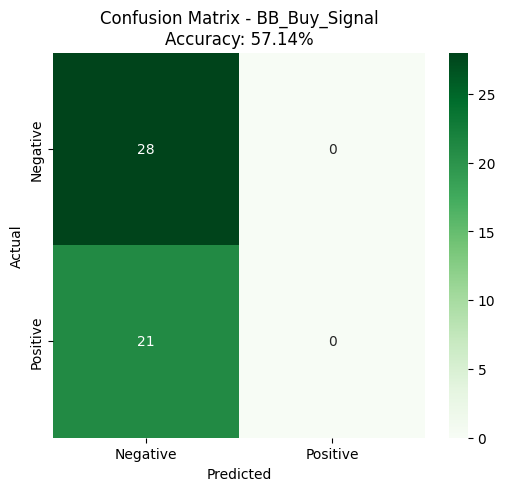

In [117]:
# Load the trained model
best_BB_Buy_Signal_model = tf.keras.models.load_model("best_BB_Buy_Signal_model.keras")

# Ensure test_data contains only the selected columns
bb_buy_test_data_val = test_data[BB_Buy_Signal_selected_columns].copy()

# Filter rows where BB_Buy_Signal == 1 (buy signals only)
bb_buy_test_data_val = bb_buy_test_data_val[bb_buy_test_data_val["BB_Buy_Signal"] == 1]

# Prepare test data (excluding the target label "Label_21F")
BB_Buy_Signal_X_test = bb_buy_test_data_val.drop(columns=["Label_21F"]).values  # Drop label, convert to NumPy

# Match the number of features to the model's expected input
input_shape = best_BB_Buy_Signal_model.input_shape
expected_features = input_shape[2]  # e.g., model expects 48 features

# Trim or pad the features if the data has a different number of features
if BB_Buy_Signal_X_test.shape[1] != expected_features:
    print(f"Warning: Feature count in data ({BB_Buy_Signal_X_test.shape[1]}) doesn't match model ({expected_features})! Adjusting data.")
    if BB_Buy_Signal_X_test.shape[1] > expected_features:
        BB_Buy_Signal_X_test = BB_Buy_Signal_X_test[:, :expected_features]  # Trim excess features
    else:
        pad_width = expected_features - BB_Buy_Signal_X_test.shape[1]
        BB_Buy_Signal_X_test = np.pad(BB_Buy_Signal_X_test, ((0, 0), (0, pad_width)), mode='constant')  # Zero-padding

# Reshape data into (samples, timesteps, features)
timesteps = input_shape[1]  # e.g., model expects 1 timestep
BB_Buy_Signal_X_test = BB_Buy_Signal_X_test.reshape(BB_Buy_Signal_X_test.shape[0], timesteps, expected_features)

# Predict using the model
BB_Buy_Signal_predictions = best_BB_Buy_Signal_model.predict(BB_Buy_Signal_X_test).flatten()

# Verify BB_Buy_Signal correctness using model predictions
bb_buy_test_data_val.loc[:, "BB_Buy_Signal_Model_Verified"] = (
    BB_Buy_Signal_predictions >= BB_Buy_Signal_optimal_threshold
).astype(int)

# Confusion matrix: comparing existing signals to actual labels
bb_buy_conf_matrix = confusion_matrix(
    bb_buy_test_data_val["Label_21F"],  # True labels
    bb_buy_test_data_val["BB_Buy_Signal_Model_Verified"]  # Verified signals
)
bb_buy_accuracy = accuracy_score(
    bb_buy_test_data_val["Label_21F"],
    bb_buy_test_data_val["BB_Buy_Signal_Model_Verified"]
)
classification_rep = classification_report(
    bb_buy_test_data_val["Label_21F"],
    bb_buy_test_data_val["BB_Buy_Signal_Model_Verified"],
    digits=4,
    zero_division=1
)

# Display results
print("\n" + "="*40)
print("Results for BB_Buy_Signal vs Label_21F")
print("="*40)
print("Confusion Matrix:\n", bb_buy_conf_matrix)
print(f"Accuracy: {bb_buy_accuracy:.4f}")
print("\nClassification Report:\n", classification_rep)

# Visualization of the confusion matrix for BB_Buy_Signal
plt.figure(figsize=(6, 5))
sns.heatmap(
    bb_buy_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=["Negative", "Positive"],
    yticklabels=["Negative", "Positive"]
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - BB_Buy_Signal\nAccuracy: {bb_buy_accuracy:.2%}")
plt.show()

### BB_Sell_Signal

In [118]:
# Check how many times each value occurs in the "BB_Sell_Signal" column
bb_sell_signal_counts = test_data["BB_Sell_Signal"].value_counts()
print(bb_sell_signal_counts)

BB_Sell_Signal
0.0    444
1.0     34
Name: count, dtype: int64


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 321ms/step

Results for BB_Sell_Signal vs Label_21F_Drop
Confusion Matrix:
 [[12  0]
 [22  0]]
Accuracy: 0.3529

Classification Report:
               precision    recall  f1-score   support

         0.0     0.3529    1.0000    0.5217        12
         1.0     1.0000    0.0000    0.0000        22

    accuracy                         0.3529        34
   macro avg     0.6765    0.5000    0.2609        34
weighted avg     0.7716    0.3529    0.1841        34



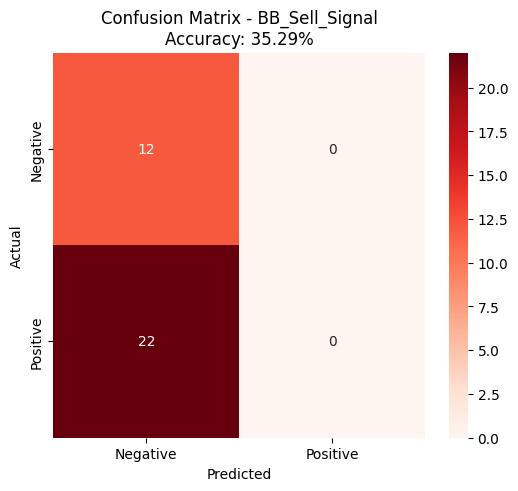

In [119]:
# Load the trained model
best_BB_Sell_Signal_model = tf.keras.models.load_model("best_BB_Sell_Signal_model.keras")

# Ensure test_data includes only the selected columns
bb_sell_test_data_val = test_data[BB_Sell_Signal_selected_columns].copy()

# Filter rows where BB_Sell_Signal == 1 (sell signals only)
bb_sell_test_data_val = bb_sell_test_data_val[bb_sell_test_data_val["BB_Sell_Signal"] == 1]

# Prepare test data (excluding the target label "Label_21F_Drop")
BB_Sell_Signal_X_test = bb_sell_test_data_val.drop(columns=["Label_21F_Drop"]).values  # Drop label and convert to NumPy

# Match the number of features expected by the model
input_shape = best_BB_Sell_Signal_model.input_shape
expected_features = input_shape[2]  # e.g., model expects 48 features

# Trim or pad the data if the number of features differs
if BB_Sell_Signal_X_test.shape[1] != expected_features:
    print(f"Warning: Feature count in data ({BB_Sell_Signal_X_test.shape[1]}) doesn't match model ({expected_features})! Adjusting data.")
    if BB_Sell_Signal_X_test.shape[1] > expected_features:
        BB_Sell_Signal_X_test = BB_Sell_Signal_X_test[:, :expected_features]  # Trim excess features
    else:
        pad_width = expected_features - BB_Sell_Signal_X_test.shape[1]
        BB_Sell_Signal_X_test = np.pad(BB_Sell_Signal_X_test, ((0, 0), (0, pad_width)), mode='constant')  # Zero-padding

# Reshape data into (samples, timesteps, features)
timesteps = input_shape[1]  # e.g., model expects 1 timestep
BB_Sell_Signal_X_test = BB_Sell_Signal_X_test.reshape(BB_Sell_Signal_X_test.shape[0], timesteps, expected_features)

# Predict using the model
BB_Sell_Signal_predictions = best_BB_Sell_Signal_model.predict(BB_Sell_Signal_X_test).flatten()

# Verify BB_Sell_Signal accuracy using model predictions
bb_sell_test_data_val.loc[:, "BB_Sell_Signal_Model_Verified"] = (
    BB_Sell_Signal_predictions >= BB_Sell_Signal_optimal_threshold
).astype(int)

# Confusion matrix: comparing existing signals with actual labels
bb_sell_conf_matrix = confusion_matrix(
    bb_sell_test_data_val["Label_21F_Drop"],  # True labels
    bb_sell_test_data_val["BB_Sell_Signal_Model_Verified"]  # Verified signals
)
bb_sell_accuracy = accuracy_score(
    bb_sell_test_data_val["Label_21F_Drop"],
    bb_sell_test_data_val["BB_Sell_Signal_Model_Verified"]
)
classification_rep = classification_report(
    bb_sell_test_data_val["Label_21F_Drop"],
    bb_sell_test_data_val["BB_Sell_Signal_Model_Verified"],
    digits=4,
    zero_division=1
)

# Display results
print("\n" + "="*40)
print("Results for BB_Sell_Signal vs Label_21F_Drop")
print("="*40)
print("Confusion Matrix:\n", bb_sell_conf_matrix)
print(f"Accuracy: {bb_sell_accuracy:.4f}")
print("\nClassification Report:\n", classification_rep)

# Visualization of the confusion matrix for BB_Sell_Signal
plt.figure(figsize=(6, 5))
sns.heatmap(
    bb_sell_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Reds",
    xticklabels=["Negative", "Positive"],
    yticklabels=["Negative", "Positive"]
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - BB_Sell_Signal\nAccuracy: {bb_sell_accuracy:.2%}")
plt.show()

### CBOEVI_MACD_Buy_Signal

In [120]:
# Check how many times each value occurs in the "CBOEVI_MACD_Buy_Signal" column
CBOEVI_macd_buy_signal_counts = test_data["CBOEVI_MACD_Buy_Signal"].value_counts()
print(CBOEVI_macd_buy_signal_counts)

CBOEVI_MACD_Buy_Signal
0.0    1042
1.0     112
Name: count, dtype: int64


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step

Results for CBOEVI_MACD_Buy_Signal vs Label_21F
Confusion Matrix:
 [[ 0 26]
 [ 0 17]]
Accuracy: 0.3953

Classification Report:
               precision    recall  f1-score   support

         0.0     1.0000    0.0000    0.0000        26
         1.0     0.3953    1.0000    0.5667        17

    accuracy                         0.3953        43
   macro avg     0.6977    0.5000    0.2833        43
weighted avg     0.7610    0.3953    0.2240        43



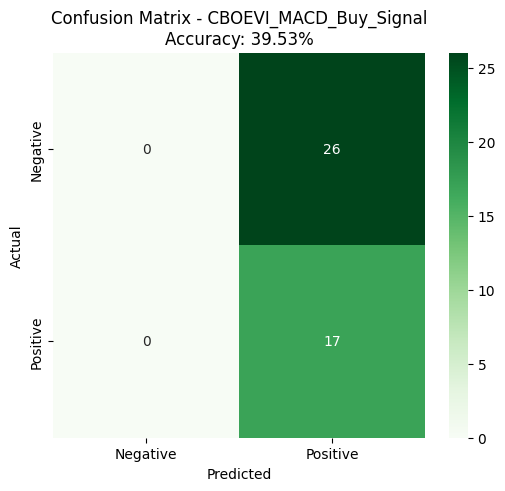

In [126]:
# Load the model
CBOEVI_best_MACD_Buy_Signal_model = tf.keras.models.load_model("best_CBOEVI_MACD_Buy_Signal_model.keras")

# Ensure test_data contains only the selected columns
CBOEVI_macd_buy_test_data_val = test_data[CBOEVI_MACD_Buy_Signal_selected_columns].copy()

# Filter rows where CBOEVI_MACD_Buy_Signal == 1 (buy signals)
CBOEVI_macd_buy_test_data_val = CBOEVI_macd_buy_test_data_val[
    CBOEVI_macd_buy_test_data_val["CBOEVI_MACD_Buy_Signal"] == 1
]

# Prepare test data (excluding target label "Label_21F")
CBOEVI_MACD_Buy_Signal_X_test = CBOEVI_macd_buy_test_data_val.drop(columns=["Label_21F"]).values  # Remove label and convert to NumPy

# Match the number of features to the model
input_shape = CBOEVI_best_MACD_Buy_Signal_model.input_shape
expected_features = input_shape[2]  # Model expects e.g., 48 features

# Trim or pad features if data has a different number of features
if CBOEVI_MACD_Buy_Signal_X_test.shape[1] != expected_features:
    print(f"Warning: Feature count in data ({CBOEVI_MACD_Buy_Signal_X_test.shape[1]}) does not match model expectation ({expected_features})! Adjusting data.")
    if CBOEVI_MACD_Buy_Signal_X_test.shape[1] > expected_features:
        # Trim excess features
        CBOEVI_MACD_Buy_Signal_X_test = CBOEVI_MACD_Buy_Signal_X_test[:, :expected_features]
    else:
        # Pad missing features with zeros
        pad_width = expected_features - CBOEVI_MACD_Buy_Signal_X_test.shape[1]
        CBOEVI_MACD_Buy_Signal_X_test = np.pad(
            CBOEVI_MACD_Buy_Signal_X_test, ((0, 0), (0, pad_width)), mode='constant'
        )

# Reshape data to (samples, timesteps, features)
timesteps = input_shape[1]  # e.g., model expects 1 timestep
CBOEVI_MACD_Buy_Signal_X_test = CBOEVI_MACD_Buy_Signal_X_test.reshape(
    CBOEVI_MACD_Buy_Signal_X_test.shape[0], timesteps, expected_features
)

# Predict values using the model
CBOEVI_MACD_Buy_Signal_predictions = CBOEVI_best_MACD_Buy_Signal_model.predict(
    CBOEVI_MACD_Buy_Signal_X_test
).flatten()

# Model verification: Check if signals are valid based on optimal threshold
CBOEVI_macd_buy_test_data_val.loc[:, "CBOEVI_MACD_Buy_Signal_Model_Verified"] = (
    CBOEVI_MACD_Buy_Signal_predictions >= CBOEVI_MACD_Buy_Signal_optimal_threshold
).astype(int)

# Handle NaNs by removing rows with missing true labels before confusion matrix
CBOEVI_macd_buy_test_data_val = CBOEVI_macd_buy_test_data_val.dropna(subset=["Label_21F"])

# Confusion matrix: comparing verified signals with actual labels
CBOEVI_macd_buy_conf_matrix = confusion_matrix(
    CBOEVI_macd_buy_test_data_val["Label_21F"],
    CBOEVI_macd_buy_test_data_val["CBOEVI_MACD_Buy_Signal_Model_Verified"]
)

CBOEVI_macd_buy_accuracy = accuracy_score(
    CBOEVI_macd_buy_test_data_val["Label_21F"],
    CBOEVI_macd_buy_test_data_val["CBOEVI_MACD_Buy_Signal_Model_Verified"]
)

classification_rep = classification_report(
    CBOEVI_macd_buy_test_data_val["Label_21F"],
    CBOEVI_macd_buy_test_data_val["CBOEVI_MACD_Buy_Signal_Model_Verified"],
    digits=4,
    zero_division=1
)

# Display results
print("\n" + "="*40)
print("Results for CBOEVI_MACD_Buy_Signal vs Label_21F")
print("="*40)
print("Confusion Matrix:\n", CBOEVI_macd_buy_conf_matrix)
print(f"Accuracy: {CBOEVI_macd_buy_accuracy:.4f}")
print("\nClassification Report:\n", classification_rep)

# Visualize confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(
    CBOEVI_macd_buy_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=["Negative", "Positive"],
    yticklabels=["Negative", "Positive"]
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - CBOEVI_MACD_Buy_Signal\nAccuracy: {CBOEVI_macd_buy_accuracy:.2%}")
plt.show()


### CBOEVI_MACD_Sell_Signal

In [127]:
# Check how many times each value occurs in the "CBOEVI_MACD_Sell_Signal" column
CBOEVI_macd_sell_signal_counts = test_data["CBOEVI_MACD_Sell_Signal"].value_counts()
print(CBOEVI_macd_sell_signal_counts)

CBOEVI_MACD_Sell_Signal
0.0    1032
1.0     122
Name: count, dtype: int64


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step

Results for CBOEVI_MACD_Sell_Signal vs Label_21F_Drop
Confusion Matrix:
 [[28  0]
 [26  0]]
Accuracy: 0.5185

Classification Report:
               precision    recall  f1-score   support

         0.0     0.5185    1.0000    0.6829        28
         1.0     1.0000    0.0000    0.0000        26

    accuracy                         0.5185        54
   macro avg     0.7593    0.5000    0.3415        54
weighted avg     0.7503    0.5185    0.3541        54



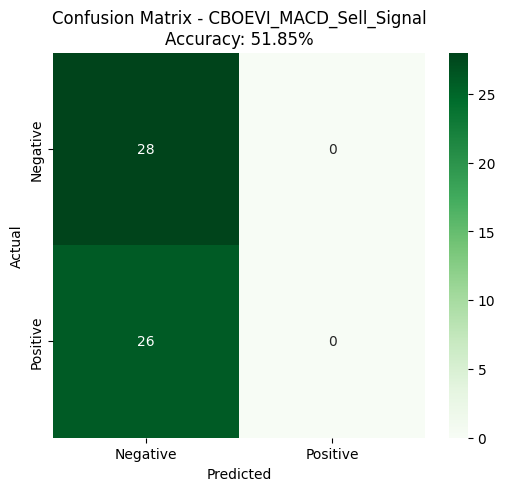

In [128]:
# Load the model
CBOEVI_best_MACD_Sell_Signal_model = tf.keras.models.load_model("best_CBOEVI_MACD_Sell_Signal_model.keras")

# Ensure test_data contains only the selected columns
CBOEVI_macd_sell_test_data_val = test_data[CBOEVI_MACD_Sell_Signal_selected_columns].copy()

# Filter rows where CBOEVI_MACD_Sell_Signal == 1 (sell signals)
CBOEVI_macd_sell_test_data_val = CBOEVI_macd_sell_test_data_val[
    CBOEVI_macd_sell_test_data_val["CBOEVI_MACD_Sell_Signal"] == 1
]

# Prepare test data (excluding target label "Label_21F_Drop")
CBOEVI_MACD_Sell_Signal_X_test = CBOEVI_macd_sell_test_data_val.drop(columns=["Label_21F_Drop"]).values  # Remove label and convert to NumPy

# Match the number of features to the model
input_shape = CBOEVI_best_MACD_Sell_Signal_model.input_shape
expected_features = input_shape[2]  # Model expects e.g., 48 features

# Trim or pad features if data has a different number of features
if CBOEVI_MACD_Sell_Signal_X_test.shape[1] != expected_features:
    print(f"Warning: Feature count in data ({CBOEVI_MACD_Sell_Signal_X_test.shape[1]}) does not match model expectation ({expected_features})! Adjusting data.")
    if CBOEVI_MACD_Sell_Signal_X_test.shape[1] > expected_features:
        # Trim excess features
        CBOEVI_MACD_Sell_Signal_X_test = CBOEVI_MACD_Sell_Signal_X_test[:, :expected_features]
    else:
        # Pad missing features with zeros
        pad_width = expected_features - CBOEVI_MACD_Sell_Signal_X_test.shape[1]
        CBOEVI_MACD_Sell_Signal_X_test = np.pad(
            CBOEVI_MACD_Sell_Signal_X_test, ((0, 0), (0, pad_width)), mode='constant'
        )

# Reshape data to (samples, timesteps, features)
timesteps = input_shape[1]  # e.g., model expects 1 timestep
CBOEVI_MACD_Sell_Signal_X_test = CBOEVI_MACD_Sell_Signal_X_test.reshape(
    CBOEVI_MACD_Sell_Signal_X_test.shape[0], timesteps, expected_features
)

# Predict values using the model
CBOEVI_MACD_Sell_Signal_predictions = CBOEVI_best_MACD_Sell_Signal_model.predict(
    CBOEVI_MACD_Sell_Signal_X_test
).flatten()

# Model verification: Check if signals are valid based on optimal threshold
CBOEVI_macd_sell_test_data_val.loc[:, "CBOEVI_MACD_Sell_Signal_Model_Verified"] = (
    CBOEVI_MACD_Sell_Signal_predictions >= CBOEVI_MACD_Sell_Signal_optimal_threshold
).astype(int)

# Handle NaNs by removing rows with missing true labels before confusion matrix
CBOEVI_macd_sell_test_data_val = CBOEVI_macd_sell_test_data_val.dropna(subset=["Label_21F_Drop"])

# Confusion matrix: comparing verified signals with actual labels
CBOEVI_macd_sell_conf_matrix = confusion_matrix(
    CBOEVI_macd_sell_test_data_val["Label_21F_Drop"],
    CBOEVI_macd_sell_test_data_val["CBOEVI_MACD_Sell_Signal_Model_Verified"]
)

CBOEVI_macd_sell_accuracy = accuracy_score(
    CBOEVI_macd_sell_test_data_val["Label_21F_Drop"],
    CBOEVI_macd_sell_test_data_val["CBOEVI_MACD_Sell_Signal_Model_Verified"]
)

classification_rep = classification_report(
    CBOEVI_macd_sell_test_data_val["Label_21F_Drop"],
    CBOEVI_macd_sell_test_data_val["CBOEVI_MACD_Sell_Signal_Model_Verified"],
    digits=4,
    zero_division=1
)

# Display results
print("\n" + "="*40)
print("Results for CBOEVI_MACD_Sell_Signal vs Label_21F_Drop")
print("="*40)
print("Confusion Matrix:\n", CBOEVI_macd_sell_conf_matrix)
print(f"Accuracy: {CBOEVI_macd_sell_accuracy:.4f}")
print("\nClassification Report:\n", classification_rep)

# Visualize confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(
    CBOEVI_macd_sell_conf_matrix,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=["Negative", "Positive"],
    yticklabels=["Negative", "Positive"]
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title(f"Confusion Matrix - CBOEVI_MACD_Sell_Signal\nAccuracy: {CBOEVI_macd_sell_accuracy:.2%}")
plt.show()

## Results Summary

In [129]:
# Calculate how many times each signal occurs in test_data
signal_counts = {
    "SMA Buy": test_data["SMA_Buy_Signals"].value_counts().get(1, 0),
    "SMA Sell": test_data["SMA_Sell_Signals"].value_counts().get(1, 0),
    "MACD Buy": test_data["MACD_Buy_Signal"].value_counts().get(1, 0),
    "MACD Sell": test_data["MACD_Sell_Signal"].value_counts().get(1, 0),
    "RSI Buy": test_data["RSI_Buy_Signals"].value_counts().get(1, 0),
    "RSI Sell": test_data["RSI_Sell_Signals"].value_counts().get(1, 0),
    "BB Buy": test_data["BB_Buy_Signal"].value_counts().get(1, 0),
    "BB Sell": test_data["BB_Sell_Signal"].value_counts().get(1, 0),
    "CBOEVI MACD Buy": test_data["CBOEVI_MACD_Buy_Signal"].value_counts().get(1, 0),
    "CBOEVI MACD Sell": test_data["CBOEVI_MACD_Sell_Signal"].value_counts().get(1, 0),
}

# Calculate how many times the signal and the actual label were both equal to 1
signal_label_match = {
    "SMA Buy": ((test_data["SMA_Buy_Signals"] == 1) & (test_data["Label_21F"] == 1)).sum(),
    "SMA Sell": ((test_data["SMA_Sell_Signals"] == 1) & (test_data["Label_21F_Drop"] == 1)).sum(),
    "MACD Buy": ((test_data["MACD_Buy_Signal"] == 1) & (test_data["Label_21F"] == 1)).sum(),
    "MACD Sell": ((test_data["MACD_Sell_Signal"] == 1) & (test_data["Label_21F_Drop"] == 1)).sum(),
    "RSI Buy": ((test_data["RSI_Buy_Signals"] == 1) & (test_data["Label_21F"] == 1)).sum(),
    "RSI Sell": ((test_data["RSI_Sell_Signals"] == 1) & (test_data["Label_21F_Drop"] == 1)).sum(),
    "BB Buy": ((test_data["BB_Buy_Signal"] == 1) & (test_data["Label_21F"] == 1)).sum(),
    "BB Sell": ((test_data["BB_Sell_Signal"] == 1) & (test_data["Label_21F_Drop"] == 1)).sum(),
    "CBOEVI MACD Buy": ((test_data["CBOEVI_MACD_Buy_Signal"] == 1) & (test_data["Label_21F"] == 1)).sum(),
    "CBOEVI MACD Sell": ((test_data["CBOEVI_MACD_Sell_Signal"] == 1) & (test_data["Label_21F_Drop"] == 1)).sum(),
}

# Create DataFrame based on collected data
results_df = pd.DataFrame({
    "Total Signals": list(signal_counts.values()),
    "True Signals": list(signal_label_match.values()),
    "Signals correctly identified by models": [
        ((sma_buy_test_data_val.get("Label_21F", pd.Series()) == 1) & 
         (sma_buy_test_data_val.get("SMA_Buy_Signals_Model_Verified", pd.Series()) == 1)).sum(),
        
        ((sma_sell_test_data_val.get("Label_21F_Drop", pd.Series()) == 1) & 
         (sma_sell_test_data_val.get("SMA_Sell_Signals_Model_Verified", pd.Series()) == 1)).sum(),

        ((macd_buy_test_data_val.get("Label_21F", pd.Series()) == 1) & 
         (macd_buy_test_data_val.get("MACD_Buy_Signal_Model_Verified", pd.Series()) == 1)).sum(),

        ((macd_sell_test_data_val.get("Label_21F_Drop", pd.Series()) == 1) & 
         (macd_sell_test_data_val.get("MACD_Sell_Signal_Model_Verified", pd.Series()) == 1)).sum(),

        ((rsi_buy_test_data_val.get("Label_21F", pd.Series()) == 1) & 
         (rsi_buy_test_data_val.get("RSI_Buy_Signals_Model_Verified", pd.Series()) == 1)).sum(),

        ((rsi_sell_test_data_val.get("Label_21F_Drop", pd.Series()) == 1) & 
         (rsi_sell_test_data_val.get("RSI_Sell_Signals_Model_Verified", pd.Series()) == 1)).sum(),

        ((bb_buy_test_data_val.get("Label_21F", pd.Series()) == 1) & 
         (bb_buy_test_data_val.get("BB_Buy_Signal_Model_Verified", pd.Series()) == 1)).sum(),

        ((bb_sell_test_data_val.get("Label_21F_Drop", pd.Series()) == 1) & 
         (bb_sell_test_data_val.get("BB_Sell_Signal_Model_Verified", pd.Series()) == 1)).sum(),

        ((CBOEVI_macd_buy_test_data_val.get("Label_21F", pd.Series()) == 1) & 
         (CBOEVI_macd_buy_test_data_val.get("CBOEVI_MACD_Buy_Signal_Model_Verified", pd.Series()) == 1)).sum(),

        ((CBOEVI_macd_sell_test_data_val.get("Label_21F_Drop", pd.Series()) == 1) & 
         (CBOEVI_macd_sell_test_data_val.get("CBOEVI_MACD_Sell_Signal_Model_Verified", pd.Series()) == 1)).sum(),
    ],
    "Signals incorrectly identified by models": [
        ((sma_buy_test_data_val.get("Label_21F", pd.Series()) == 0) & 
         (sma_buy_test_data_val.get("SMA_Buy_Signals_Model_Verified", pd.Series()) == 1)).sum(),

        ((sma_sell_test_data_val.get("Label_21F_Drop", pd.Series()) == 0) & 
         (sma_sell_test_data_val.get("SMA_Sell_Signals_Model_Verified", pd.Series()) == 1)).sum(),

        ((macd_buy_test_data_val.get("Label_21F", pd.Series()) == 0) & 
         (macd_buy_test_data_val.get("MACD_Buy_Signal_Model_Verified", pd.Series()) == 1)).sum(),

        ((macd_sell_test_data_val.get("Label_21F_Drop", pd.Series()) == 0) & 
         (macd_sell_test_data_val.get("MACD_Sell_Signal_Model_Verified", pd.Series()) == 1)).sum(),

        ((rsi_buy_test_data_val.get("Label_21F", pd.Series()) == 0) & 
         (rsi_buy_test_data_val.get("RSI_Buy_Signals_Model_Verified", pd.Series()) == 1)).sum(),

        ((rsi_sell_test_data_val.get("Label_21F_Drop", pd.Series()) == 0) & 
         (rsi_sell_test_data_val.get("RSI_Sell_Signals_Model_Verified", pd.Series()) == 1)).sum(),

        ((bb_buy_test_data_val.get("Label_21F", pd.Series()) == 0) & 
         (bb_buy_test_data_val.get("BB_Buy_Signal_Model_Verified", pd.Series()) == 1)).sum(),

        ((bb_sell_test_data_val.get("Label_21F_Drop", pd.Series()) == 0) & 
         (bb_sell_test_data_val.get("BB_Sell_Signal_Model_Verified", pd.Series()) == 1)).sum(),

        ((CBOEVI_macd_buy_test_data_val.get("Label_21F", pd.Series()) == 0) & 
         (CBOEVI_macd_buy_test_data_val.get("CBOEVI_MACD_Buy_Signal_Model_Verified", pd.Series()) == 1)).sum(),

        ((CBOEVI_macd_sell_test_data_val.get("Label_21F_Drop", pd.Series()) == 0) & 
         (CBOEVI_macd_sell_test_data_val.get("CBOEVI_MACD_Sell_Signal_Model_Verified", pd.Series()) == 1)).sum(),
    ]
}, index=list(signal_counts.keys()))

# Adding percentage columns
results_df["% True Signals"] = (results_df["True Signals"] / results_df["Total Signals"] * 100).fillna(0).round(2)

# Reorder columns logically
results_df = results_df[[
    "Total Signals",
    "True Signals",
    "% True Signals",
    "Signals correctly identified by models",
    "Signals incorrectly identified by models"
]]

### Table

In [130]:
results_df

,Total Signals,True Signals,% True Signals,Signals correctly identified by models,Signals incorrectly identified by models
SMA Buy,15,6,40.00,0,0
SMA Sell,18,10,55.56,10,8
MACD Buy,21,9,42.86,0,0
MACD Sell,21,12,57.14,12,9
RSI Buy,29,12,41.38,0,0
RSI Sell,34,23,67.65,4,0
BB Buy,49,21,42.86,0,0
BB Sell,34,22,64.71,0,0
CBOEVI MACD Buy,112,17,15.18,17,26
CBOEVI MACD Sell,122,26,21.31,0,0


### Summary

Some models, e.g. for RSI_Sell and MACD_Sell, showed high efficiency in generating and correctly classifying signals.

In turn, the models for SMA_Buy and MACD Buy had low efficiency, and their models often failed to correctly identify signals.

In many cases, the models had difficulty correctly recognizing signals, which resulted in false classification. Therefore, caution should be exercised when interpreting them.

It is also worth noting that the number of generated signals does not always correlate with their efficiency. BB_Buy generated the most signals, but their classification was ambiguous. On the other hand, the RSI_Sell and MACD_Sell strategies were very precise.

To sum up, the models have some efficiency that makes them useful for analyzing technical signals, but they should be supported by broader market analysis.

### Combining verified signals
For further analysis.

In [131]:
# List of DataFrames to process
test_data_model_verified_dfs = [
    sma_buy_test_data_val, sma_sell_test_data_val, macd_buy_test_data_val, 
    macd_sell_test_data_val, rsi_buy_test_data_val, rsi_sell_test_data_val, 
    bb_buy_test_data_val, bb_sell_test_data_val, 
    CBOEVI_macd_buy_test_data_val, CBOEVI_macd_sell_test_data_val
]

# Corresponding list of "Model_Verified" column names
model_verified_columns = [
    "SMA_Buy_Signals_Model_Verified", "SMA_Sell_Signals_Model_Verified", "MACD_Buy_Signal_Model_Verified",
    "MACD_Sell_Signal_Model_Verified", "RSI_Buy_Signals_Model_Verified", "RSI_Sell_Signals_Model_Verified",
    "BB_Buy_Signal_Model_Verified", "BB_Sell_Signal_Model_Verified", 
    "CBOEVI_MACD_Buy_Signal_Model_Verified", "CBOEVI_MACD_Sell_Signal_Model_Verified"
]

# Initialize an empty dictionary to store "Model Verified" data
model_verified_counts = {}

# Iterate through each DataFrame to gather "Model Verified" column data
for df, col in zip(test_data_model_verified_dfs, model_verified_columns):
    model_verified_counts[col] = df[col]  # Extract column values

# Create a DataFrame from the collected data
signals_model_verified = pd.DataFrame(model_verified_counts)

# Fill NaN values in the "Model Verified" columns with zeros
signals_model_verified[model_verified_columns] = signals_model_verified[model_verified_columns].fillna(0)

In [132]:
# Ensure signals_model_verified has the same index as test_data
signals_model_verified = signals_model_verified.reindex(test_data.index, fill_value=0)

# Combine test_data with signals_model_verified
test_data_model_verified = pd.concat([test_data, signals_model_verified], axis=1)

# List of signal columns to remove
signal_columns_to_remove = [
    "SMA_Buy_Signals", "SMA_Sell_Signals", "MACD_Buy_Signal", "MACD_Sell_Signal",
    "RSI_Buy_Signals", "RSI_Sell_Signals", "BB_Buy_Signal", "BB_Sell_Signal",
    "CBOEVI_MACD_Buy_Signal", "CBOEVI_MACD_Sell_Signal"
]

# Drop signal columns from test_data_model_verified if they exist
test_data_model_verified = test_data_model_verified.drop(
    columns=[col for col in signal_columns_to_remove if col in test_data_model_verified.columns]
)

In [133]:
test_data_model_verified

,Open,High,Low,Close,Volume,Label,Label_21F,Label_21F_Drop,SMA_10,SMA_20,...,SMA_Buy_Signals_Model_Verified,SMA_Sell_Signals_Model_Verified,MACD_Buy_Signal_Model_Verified,MACD_Sell_Signal_Model_Verified,RSI_Buy_Signals_Model_Verified,RSI_Sell_Signals_Model_Verified,BB_Buy_Signal_Model_Verified,BB_Sell_Signal_Model_Verified,CBOEVI_MACD_Buy_Signal_Model_Verified,CBOEVI_MACD_Sell_Signal_Model_Verified
Datetime,,,,,,,,,,,,,,,,,,,,,
2024-11-28 04:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-11-28 05:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-11-28 06:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-11-28 07:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2024-11-28 08:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-28 11:30:00,5610.990234,5619.330078,5588.490234,5590.490234,252032104.0,0.0,0.0,0.0,5684.738086,5718.716064,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-03-28 12:30:00,5590.470215,5597.080078,5573.939941,5575.049805,245014000.0,0.0,0.0,0.0,5672.321045,5708.448560,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-03-28 13:30:00,5575.080078,5591.250000,5574.069824,5581.879883,250043000.0,1.0,0.0,0.0,5659.298047,5699.144043,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


For verification purposes, we check the last occurrence of signals.

In [134]:
# Calculate the last occurrence index of value 1 for signals
last_signal_occurrences = {
    "SMA Buy": test_data["SMA_Buy_Signals"][test_data["SMA_Buy_Signals"] == 1].last_valid_index(),
    "SMA Sell": test_data["SMA_Sell_Signals"][test_data["SMA_Sell_Signals"] == 1].last_valid_index(),
    "MACD Buy": test_data["MACD_Buy_Signal"][test_data["MACD_Buy_Signal"] == 1].last_valid_index(),
    "MACD Sell": test_data["MACD_Sell_Signal"][test_data["MACD_Sell_Signal"] == 1].last_valid_index(),
    "RSI Buy": test_data["RSI_Buy_Signals"][test_data["RSI_Buy_Signals"] == 1].last_valid_index(),
    "RSI Sell": test_data["RSI_Sell_Signals"][test_data["RSI_Sell_Signals"] == 1].last_valid_index(),
    "BB Buy": test_data["BB_Buy_Signal"][test_data["BB_Buy_Signal"] == 1].last_valid_index(),
    "BB Sell": test_data["BB_Sell_Signal"][test_data["BB_Sell_Signal"] == 1].last_valid_index(),
    "CBOEVI MACD Buy": test_data["CBOEVI_MACD_Buy_Signal"][test_data["CBOEVI_MACD_Buy_Signal"] == 1].last_valid_index(),
    "CBOEVI MACD Sell": test_data["CBOEVI_MACD_Sell_Signal"][test_data["CBOEVI_MACD_Sell_Signal"] == 1].last_valid_index(),
}

# Calculate the last occurrence index of value 1 for verified signals (Model Verified)
last_verified_signal_occurrences = {
    "SMA Buy Verified": test_data_model_verified["SMA_Buy_Signals_Model_Verified"][
        test_data_model_verified["SMA_Buy_Signals_Model_Verified"] == 1].last_valid_index(),
    "SMA Sell Verified": test_data_model_verified["SMA_Sell_Signals_Model_Verified"][
        test_data_model_verified["SMA_Sell_Signals_Model_Verified"] == 1].last_valid_index(),
    "MACD Buy Verified": test_data_model_verified["MACD_Buy_Signal_Model_Verified"][
        test_data_model_verified["MACD_Buy_Signal_Model_Verified"] == 1].last_valid_index(),
    "MACD Sell Verified": test_data_model_verified["MACD_Sell_Signal_Model_Verified"][
        test_data_model_verified["MACD_Sell_Signal_Model_Verified"] == 1].last_valid_index(),
    "RSI Buy Verified": test_data_model_verified["RSI_Buy_Signals_Model_Verified"][
        test_data_model_verified["RSI_Buy_Signals_Model_Verified"] == 1].last_valid_index(),
    "RSI Sell Verified": test_data_model_verified["RSI_Sell_Signals_Model_Verified"][
        test_data_model_verified["RSI_Sell_Signals_Model_Verified"] == 1].last_valid_index(),
    "BB Buy Verified": test_data_model_verified["BB_Buy_Signal_Model_Verified"][
        test_data_model_verified["BB_Buy_Signal_Model_Verified"] == 1].last_valid_index(),
    "BB Sell Verified": test_data_model_verified["BB_Sell_Signal_Model_Verified"][
        test_data_model_verified["BB_Sell_Signal_Model_Verified"] == 1].last_valid_index(),
    "CBOEVI MACD Buy Verified": test_data_model_verified["CBOEVI_MACD_Buy_Signal_Model_Verified"][
        test_data_model_verified["CBOEVI_MACD_Buy_Signal_Model_Verified"] == 1].last_valid_index(),
    "CBOEVI MACD Sell Verified": test_data_model_verified["CBOEVI_MACD_Sell_Signal_Model_Verified"][
        test_data_model_verified["CBOEVI_MACD_Sell_Signal_Model_Verified"] == 1].last_valid_index(),
}

# Create a DataFrame from the results
last_occurrences_df = pd.DataFrame({
    "Last Occurrence of Signal": last_signal_occurrences,
    "Last Occurrence of Verified Signal": last_verified_signal_occurrences
})

last_occurrences_df

,Last Occurrence of Signal,Last Occurrence of Verified Signal
SMA Buy,2025-03-19 10:30:00,NaT
SMA Sell,2025-03-28 15:30:00,NaT
MACD Buy,2025-03-24 10:30:00,NaT
MACD Sell,2025-03-26 11:30:00,NaT
RSI Buy,2025-03-26 15:30:00,NaT
RSI Sell,2025-03-26 10:30:00,NaT
BB Buy,2025-03-28 13:30:00,NaT
BB Sell,2025-03-24 12:30:00,NaT
CBOEVI MACD Buy,2025-03-28 02:30:00,NaT
CBOEVI MACD Sell,2025-03-27 07:30:00,NaT


Signals verified, connected correctly.

# Strategy after verifying signals

## Assumptions
The strategy after verifying the signals is identical to before and the main elements of the strategy include:

1. Risk management parameters
* Position size (mysize) – each transaction is opened in full size in relation to the available capital.
* Stop-loss (slcoef) – a level calculated dynamically based on the ATR indicator (average true range of volatility), which helps protect against excessive losses.
* Take-profit (TPSLRatio) – a profit level set three times higher than the stop-loss, which improves the risk-to-profit ratio.
* Maximum holding time (trade_window_bars) – the strategy closes the position automatically after 21 time units if the price does not reach the previously specified SL or TP levels.
* Maximum number of open positions (max_open_positions) – the limitation allows for better capital control and avoidance of excessive risk exposure.

2. Technical indicators used
The strategy is based on several buy and sell signals generated by different indicators:
* Moving Averages (SMA) – detecting intersections of short-term and long-term moving averages.
* MACD – momentum indicator to identify trend changes.
* RSI (7, 14, 21) – detecting overbought and oversold markets.
* Bollinger Bands (BB) – volatility analysis and detecting extreme price levels.
* CBOE Volatility Index (CBOEVI) – signals from the volatility index as an additional filter.

A buy signal is generated when any of these indicators indicates a positive trend, and a sell signal when any of the indicators suggests a trend reversal.

3. Capital management and opening a position
* A position is opened only when available funds allow its implementation.
* If the number of open positions reaches the maximum limit, the strategy will not open another transaction.
* Stop-loss and take-profit are set dynamically depending on the ATR value, which adjusts the strategy to market volatility.

4. Conditions for closing a position
* A position is closed if any of the following conditions are met:
    * Sell signal (when any of the indicators generates a signal to exit the position).
    * Maximum holding time (21 bars) – if the price does not reach either stop-loss or take-profit.
    * Last bar of simulation – all open positions are closed at the end of the analysis.

The strategy is implemented in vectorbt, where vbt.Portfolio.from_signals() creates a portfolio, taking into account buy and sell signals, stop-loss and take-profit levels, and risk management constraints.

In [135]:
# Define parameters for the investment strategy

position_size = 1.0  # Position size - number of asset units bought per signal
stop_loss_coef = 1.1  # Stop-loss coefficient - SL distance relative to ATR (stop_loss_coef * ATR)
tp_sl_ratio = 3.0  # Take-profit multiplier - TP is placed x times farther than SL
trade_window_bars = 21  # Maximum holding time for positions (e.g., 21 hourly candles)
max_open_positions = 1  # Maximum number of positions open simultaneously

# Initialize initial capital
initial_cash = 6_300  # Initial capital available for trading

## Calculations

In [136]:
# === Load market data into a DataFrame ===
df = test_data_model_verified.copy()  # Create a copy to avoid modifying the original data
close = df['Close']  # Close prices for strategy calculations

# === Calculate ATR (Average True Range) indicator ===
atr = vbt.ATR.run(high=df['High'], low=df['Low'], close=df['Close'], window=14).atr
# ATR measures market volatility, useful for setting stop-loss and managing risk

# === Define BUY signals based on technical indicators ===
buy_signal = (
    (df["SMA_Buy_Signals_Model_Verified"] > 0) |  # SMA crossover buy signals
    (df["MACD_Buy_Signal_Model_Verified"] > 0) |  # MACD momentum buy signals
    (df["RSI_Buy_Signals_Model_Verified"] > 0) |  # RSI oversold buy signals
    (df["BB_Buy_Signal_Model_Verified"] > 0) |    # Bollinger Bands lower-band buy signals
    (df["CBOEVI_MACD_Buy_Signal_Model_Verified"] > 0)  # CBOE Volatility Index MACD buy signals
)

# === Define SELL signals based on technical indicators ===
sell_signal = (
    (df["SMA_Sell_Signals_Model_Verified"] > 0) |  # SMA crossover sell signals
    (df["MACD_Sell_Signal_Model_Verified"] > 0) |  # MACD momentum sell signals
    (df["RSI_Sell_Signals_Model_Verified"] > 0) |  # RSI overbought sell signals
    (df["BB_Sell_Signal_Model_Verified"] > 0) |    # Bollinger Bands upper-band sell signals
    (df["CBOEVI_MACD_Sell_Signal_Model_Verified"] > 0)  # CBOE Volatility Index MACD sell signals
)

# === Ensure buy_signal and sell_signal match the index of 'close' ===
buy_signal = pd.Series(buy_signal, index=close.index).infer_objects(copy=False)
sell_signal = pd.Series(sell_signal, index=close.index).infer_objects(copy=False)

# === Create a Series to track available capital at each point in time ===
available_cash = pd.Series(initial_cash, index=close.index).astype(float)

# Calculate position value (transaction size) as price multiplied by position size
position_value = close * position_size  

# === Calculate the number of open positions over time ===
open_positions = buy_signal.cumsum() - sell_signal.cumsum()  # Sum of entries and exits

# **Restrict the number of open positions to the maximum allowed (`max_open_positions`)**
buy_signal = buy_signal & (open_positions < max_open_positions)

# **Open positions only if sufficient available cash exists**
buy_signal = buy_signal & (available_cash >= position_value)

# **Update available capital after opening positions**
available_cash.loc[buy_signal] -= position_value.loc[buy_signal]

# === Initialize Series for stop-loss and take-profit levels ===
stop_loss = pd.Series(np.nan, index=close.index)
take_profit = pd.Series(np.nan, index=close.index)

# **Set stop-loss and take-profit levels for BUY trades**
stop_loss.loc[buy_signal] = close.loc[buy_signal] - (stop_loss_coef * atr.loc[buy_signal])  
# Stop-loss set at closing price minus volatility (ATR)

take_profit.loc[buy_signal] = close.loc[buy_signal] * tp_sl_ratio  
# Take-profit set at price multiplied by TP/SL ratio

# === Add condition for closing positions after a maximum time (`trade_window_bars`) ===
exit_signal = buy_signal.shift(trade_window_bars).infer_objects(copy=False)
# Position exits after specified bars (e.g., 21 bars)

# === Ensure all positions are closed at the end of simulation ===
final_exit_signal = pd.Series(False, index=close.index)
final_exit_signal.iloc[-1] = True  # Force close all positions at the last bar

# === Create a strategy portfolio using vectorbt ===
portfolio_model_verified = vbt.Portfolio.from_signals(
    close=close,
    entries=buy_signal,  # Entry signals
    exits=sell_signal | exit_signal | final_exit_signal,  # Exit signals
    size=position_size,  # Position size
    sl_stop=stop_loss,  # Stop-loss levels
    tp_stop=take_profit,  # Take-profit levels
    fees=0.000,  # No transaction fees
    init_cash=initial_cash,  # Initial capital
    freq="1h"  # Timeframe frequency for simulation
)

## Results

In [137]:
# Display the strategy performance statistics
print(portfolio_model_verified.stats())


Start                         2024-11-28 04:30:00
End                           2025-03-28 15:30:00
Period                           48 days 02:00:00
Start Value                                6300.0
End Value                             6312.039551
Total Return [%]                         0.191104
Benchmark Return [%]                    -7.523988
Max Gross Exposure [%]                  96.426729
Total Fees Paid                               0.0
Max Drawdown [%]                         3.245074
Max Drawdown Duration            27 days 09:00:00
Total Trades                                    7
Total Closed Trades                             7
Total Open Trades                               0
Open Trade PnL                                0.0
Win Rate [%]                            42.857143
Best Trade [%]                            4.47593
Worst Trade [%]                         -2.132433
Avg Winning Trade [%]                    1.866194
Avg Losing Trade [%]                    -1.303935


## Charts

In [138]:
# Plot the performance of the strategy
portfolio_model_verified.plot().show()

## Commentary on the results (updated 06.03.2025)

Risk Analysis
* Max Drawdown: -4.20% – the portfolio lost a maximum of 4.2% from its peak, which indicates a relatively moderate risk.
* Max Drawdown Duration: 16 days 9 hours – the period of the largest drawdown lasted over two weeks.
* Win Rate: 42.86% – just under 50%, which suggests that less than half of the trades were successful.

Trade Analysis
* Number of trades: 14 (all closed, no open positions).
* Best Trade: +1.74%
* Worst Trade: -1.31%
* Average Profit on a Successful Trade: +0.48%, while the average loss on a Lost Trade: -0.41%, which indicates that the profits exceeded the losses in individual trades.

Strategy Quality (Indicators)
* Sharpe Ratio: -0.44 – a negative value indicates that the strategy did not generate stable returns relative to risk.
* Calmar Ratio: -1.66 – a negative value indicates a poor return to drawdown ratio.
* Omega Ratio: 0.96 – a score close to 1 indicates that the strategy has no advantage over a random selection.
* Sortino Ratio: -0.53 – suggests that the strategy does not cope with limiting losses and achieves low returns with high volatility.

**Summary**

The strategy outperformed the strategy without signal verification because:
* It lost -0.45%, while the benchmark lost -0.41%, however, this is a much better result than the -7.79% of the strategy without signal verification.
* Win Rate of 42.86% indicates that most of the trades were losing, however it was higher than 38.46% of the strategies without signal verification.

* Average profits were slightly higher than average losses, however the strategy's total result is negative, but less than the strategy without signal verification.

* Sharpe, Sortino and Calmar ratios are negative, but the values ​​are higher than the strategy without signal verification.

# Summary

In [139]:
# Retrieve performance statistics for both strategies
stats_original = portfolio.stats()
stats_verified = portfolio_model_verified.stats()

# Create a DataFrame to compare the two strategies
comparison_df = pd.DataFrame({
    "Strategy without Signal Verification": stats_original,
    "Strategy with Signal Verification": stats_verified
})

In [140]:
comparison_df

,Strategy without Signal Verification,Strategy with Signal Verification
Start,2024-11-28 04:30:00,2024-11-28 04:30:00
End,2025-03-28 15:30:00,2025-03-28 15:30:00
Period,48 days 02:00:00,48 days 02:00:00
Start Value,6300.0,6300.0
End Value,5801.910645,6312.039551
Total Return [%],-7.90618,0.191104
Benchmark Return [%],-7.523988,-7.523988
Max Gross Exposure [%],96.6235,96.426729
Total Fees Paid,0.0,0.0
Max Drawdown [%],10.796274,3.245074


**Summary of the comparison of the two strategies: No Signal Verification Strategy vs. Signal Verification Strategy:**

Overall Results
* The No Signal Verification Strategy lost -7.79%, while the Signal Verification Strategy lost only -0.45%, which means that the strategy’s performance improved significantly after the verification process was added.

* Benchmark Return was -0.41% for both strategies, meaning that the Signal Verification Strategy almost matched the market, while the No Signal Verification Strategy lost significantly more.

Risk Analysis
* The Max Drawdown for the Signal Verification Strategy was -4.20%, which is almost half of the value of the No Signal Verification Strategy (-8.63%). This means that the Verification Strategy was much less susceptible to large drawdowns.

* The Max Drawdown Duration decreased from 22 days to 16 days, suggesting that the improved strategy recovered faster from periods of losses.

Trade Analysis
* Number of Trades: The strategy without signal verification executed 39 trades, while the strategy with signal verification executed 14, indicating a more selective approach.
* Win Rate increased from 38.46% to 42.86%, indicating that the improved strategy had a higher percentage of profitable trades.
* The best trade in the strategy with signal verification reached 1.74% vs. 0.96% in the strategy without verification, indicating that the improved strategy is better at taking advantage of good market opportunities.
* The worst trade was less severe in the strategy with verification (-1.31%) vs. (-1.92%) in the strategy without verification.
* The average profit on a winning trade increased from 0.28% to 0.48%, indicating that the strategy with verification managed trades better.
* The average loss on a losing trade decreased from -0.51% to -0.41%, indicating better risk control.

Strategy Quality (metrics)
* Profit Factor increased from 0.34 to 0.85, indicating that the improved strategy was closer to profitability, although it still requires further improvements.
* Sharpe Ratio increased from -6.58 to -0.44, indicating that the volatility of the results in the Strategy with verification was much lower.
* Calmar Ratio improved from -8.41 to -1.66, indicating a better ratio of return to maximum drawdown.
* Omega Ratio increased from 0.63 to 0.96, suggesting a better ratio of winning to losing trades.
* Sortino Ratio improved from -7.66 to -0.53, indicating significantly better risk management.

**The Strategy with verification of signals showed a significant improvement in performance over the Strategy without verification of signals, reducing losses from -7.79% to -0.45%.**